In [50]:
import os
import glob
import pandas as pd
import xml.etree.ElementTree as ET
from os import listdir
from os.path import isfile, join
import sys
import cv2
import math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.colors as colors
from matplotlib.patches import Circle, Wedge, Polygon
from matplotlib.collections import PatchCollection
from matplotlib import patches
from matplotlib.collections import PatchCollection
#import matplotlib
from PIL import Image, ImageDraw
from skimage import data, color
from skimage.transform import rescale, resize, downscale_local_mean
from matplotlib import pyplot
from skimage.color import rgb2gray, gray2rgb
from skimage.filters import threshold_otsu
from skimage.draw import polygon
from shapely.geometry.polygon import Polygon as Polygon_shapley
# from multiprocessing import Pool
import multiprocessing
from math import sqrt
import time
import random
import pickle
import png
from scipy.spatial import ConvexHull
import bbox_visualizer as bbv
import operator
import fileinput
import re

sys.path.insert(0, os.path.dirname(os.path.abspath('.'))) # to make imports relative to project root work

np.random.seed(0)

In [51]:
path_fit_to_circle = '../data/Thick_Smears_150/fit_to_circle'
path_cropped = '../data/Thick_Smears_150/cropped'

# Check Bounding Boxex NIH

First download files from ftp://lhcftp.nlm.nih.gov/Open-Access-Datasets/Malaria/Thick_Smears_150 to folder (see the terminal comand below) e.g.

Thick_Smears_150 <br>
└-GT_updated <br>
└-Folders with images of thick blood smears <br>


In the Terminal navigate to the folder you want your data in (**cd** then drag and drop the folder) then enter following:

wget -r -np ftp://lhcftp.nlm.nih.gov/Open-Access-Datasets/Malaria/Thick_Smears_150

(you might need to install wget with **brew install wget** and if you do not have brew then install homebrew https://brew.sh/)


In [52]:
def get_txt(path):
    list_txt = []
    # Delimiter
    for root, dirs, files in os.walk(path):
        for file in files:
            if file.endswith(".txt"):
                txt_path = os.path.join(root, file)
                list_txt.append(txt_path)
    return list_txt


def txt_to_df(path):
    data_file_delimiter = ','
    df = pd.DataFrame(columns = [ 'Img no - Cell no','cell', 'comment', 'annotation_type','Number of points', 'position', 'filename', 'txt_path', 'img_path'])
    root, file = os.path.split(path)
    filename, file_extension = os.path.splitext(file)
    txt_path = os.path.join(root, file)
    img_path = os.path.join(root.replace("GT_updated/", ""), filename +'.jpg')
    # Loop the data lines
    with open(txt_path, 'r') as temp_f:
        # Read the lines
        lines = temp_f.readlines()
        lines.pop(0)
        for l in lines:
            # Count the column count for the current line
            columns = l.split(data_file_delimiter)
            list_locations = [float(location) for location in columns[5:]]
            zip_locations = list(zip(list_locations[::2], list_locations[1::2]))
            df = df.append( {'Img no - Cell no': columns[0], 'cell': columns[1], 'comment': columns[2], 'annotation_type': columns[3], \
                'Number of points': columns[4], 'position': zip_locations, 'filename': filename, 'txt_path': txt_path, 'img_path': img_path}, ignore_index = True)
    return df

def collect_results(df_collected):
    """Uses apply_async's callback to setup up a separate Queue for each process"""
    global df
    df = df.append(df_collected)


In [53]:
def rgb_to_hex(rgb):
    return '#%02x%02x%02x' % rgb

def draw_points(img, cell, annotation, position, row, rows = 1, columns = 1, i = 1, point_size = 15):
    colour = (0,255,0) if cell == 'Uninfected' \
        else (255,0, 0) if cell == 'Parasite' \
            else (255,0, 0) if cell == 'Parasitized' \
                else (128,0, 128) if cell == 'Platelet' \
                    else (0, 0, 255) if cell == 'White_Blood_Cell' \
                        else (255,215,0)

    ax = fig.add_subplot(rows, columns, i)
    ax.title.set_text(row['filename'])

    if annotation == 'Point':
        x = position[0][0] 
        y = position[0][1] 
        cv2.circle(img, (int(x),int(y)), 1, colour, point_size)
    
    if annotation == 'Circle':
        x1 = position[0][0] 
        y1 = position[0][1] 
        x2 = position[1][0] 
        y2 = position[1][1] 
        radius = int(sqrt( (x2 - x1)**2 + (y2 - y1)**2 )) # distance from circle center to point on circle
        cv2.circle(img, (int(x1),int(y1)), radius, colour, 7)
    
    elif annotation == 'Polygon':
        if len(position) < 3:
            print('row: ', row)
        if not len(position) < 3:
            poly = Polygon_shapley(position)
            x,y = poly.exterior.xy
            ax.plot(x, y, color=rgb_to_hex(colour), alpha=0.7,
                linewidth=3, solid_capstyle='round', zorder=2)


In [54]:
txt_list = get_txt('../data/Thick_Smears_150/GT_updated/')
print(len(txt_list))

2206


**The following operation takes a while lean back and get a coffee**

In [55]:
df = pd.DataFrame(columns = [ 'Img no - Cell no','cell', 'comment', 'annotation_type','Number of points', 'position', 'filename', 'txt_path', 'img_path'])
start_time = time.time()  

# Repeats the compute intensive operation on all available cores
pool = multiprocessing.Pool(processes = multiprocessing.cpu_count())
pool.map_async(txt_to_df, txt_list, callback = collect_results)
pool.close()
pool.join()

# Converts list of lists to a data frame
print(df.shape)
print("--- %s seconds ---" % (time.time() - start_time))

(120441, 9)
--- 98.27160000801086 seconds ---


In [56]:
def get_bbx(position, annotation_type, bb_pixel):
    if annotation_type == 'Polygon':
        poly_list = np.array([list(ele) for ele in position])
        x_min = np.nanmin(poly_list[:, 0])
        x_max = np.nanmax(poly_list[:, 0])
        y_min = np.nanmin(poly_list[:, 1])
        y_max = np.nanmax(poly_list[:, 1])
        return [x_min, y_min, x_max, y_max]
    if annotation_type == 'Point':
        point_list = np.array(position)
        x_min = int(point_list[:, 0] - 0.5 * bb_pixel)
        x_max = int(point_list[:, 0] + 0.5 * bb_pixel)
        y_min = int(point_list[:, 1] - 0.5 * bb_pixel)
        y_max = int(point_list[:, 1] + 0.5 * bb_pixel)
        return [x_min, y_min, x_max, y_max]
    if annotation_type == 'Circle':
        x1 = position[0][0] 
        y1 = position[0][1] 
        x2 = position[1][0] 
        y2 = position[1][1] 
        radius = int(sqrt( (x2 - x1)**2 + (y2 - y1)**2 ))
        x_min = int(x1 - radius)
        x_max = int(x1 + radius)
        y_min = int(y1 - radius)
        y_max = int(y1 + radius)
        return [x_min, y_min, x_max, y_max]
    

In [57]:
df['bbx'] = df.apply(lambda row: get_bbx(row['position'], row['annotation_type'], 140), axis = 1)
df

,Img no - Cell no,cell,comment,annotation_type,Number of points,position,filename,txt_path,img_path,bbx
0,7-1,Parasite,No_Comment,Circle,2,"[(2787.45, 678.15), (2787.45, 703.2)]",20170812_171245,../data/Thick_Smears_150/GT_updated/TF53_CW41/...,../data/Thick_Smears_150/TF53_CW41/20170812_17...,"[2762, 653, 2812, 703]"
1,7-10,Parasite,No_Comment,Circle,2,"[(2862.5, 1454.85), (2850.05, 1475.8)]",20170812_171245,../data/Thick_Smears_150/GT_updated/TF53_CW41/...,../data/Thick_Smears_150/TF53_CW41/20170812_17...,"[2838, 1430, 2886, 1478]"
2,7-11,Parasite,No_Comment,Circle,2,"[(2729.1, 1429.85), (2720.8, 1453.4)]",20170812_171245,../data/Thick_Smears_150/GT_updated/TF53_CW41/...,../data/Thick_Smears_150/TF53_CW41/20170812_17...,"[2705, 1405, 2753, 1453]"
3,7-12,Parasite,No_Comment,Circle,2,"[(2674.9, 1545.2), (2670.75, 1563.3)]",20170812_171245,../data/Thick_Smears_150/GT_updated/TF53_CW41/...,../data/Thick_Smears_150/TF53_CW41/20170812_17...,"[2656, 1527, 2692, 1563]"
4,7-13,Parasite,No_Comment,Circle,2,"[(2904.2, 1595.25), (2904.2, 1616.1)]",20170812_171245,../data/Thick_Smears_150/GT_updated/TF53_CW41/...,../data/Thick_Smears_150/TF53_CW41/20170812_17...,"[2884, 1575, 2924, 1615]"
...,...,...,...,...,...,...,...,...,...,...
35,8-36,White_Blood_Cell,No_Comment,Point,1,"[(1105.2, 2498.85)]",20170829_204418,../data/Thick_Smears_150/GT_updated/TF99_CS40/...,../data/Thick_Smears_150/TF99_CS40/20170829_20...,"[1035, 2428, 1175, 2568]"
36,8-37,White_Blood_Cell,No_Comment,Point,1,"[(1368.6, 2311.25)]",20170829_204418,../data/Thick_Smears_150/GT_updated/TF99_CS40/...,../data/Thick_Smears_150/TF99_CS40/20170829_20...,"[1298, 2241, 1438, 2381]"
37,8-38,White_Blood_Cell,No_Comment,Point,1,"[(1477.25, 2406.75)]",20170829_204418,../data/Thick_Smears_150/GT_updated/TF99_CS40/...,../data/Thick_Smears_150/TF99_CS40/20170829_20...,"[1407, 2336, 1547, 2476]"
38,8-39,White_Blood_Cell,No_Comment,Point,1,"[(1743.85, 2633.9)]",20170829_204418,../data/Thick_Smears_150/GT_updated/TF99_CS40/...,../data/Thick_Smears_150/TF99_CS40/20170829_20...,"[1673, 2563, 1813, 2703]"


In [58]:
fake_patient_id = {}
counter = 300
def get_patient_id_path(path):
    '''function takes path to get patient ID,
    when patient ID is not available from path, take fake patient ID'''
    global counter
    try:
        return int(re.search('P[0-9]*N', path).group(0)[1:])
    except Exception as e:
        path_patient_folder = re.search('.*/Thick_Smears_150/(.*?)\/', path).group(0)
        #print(path_patient_folder)
        try:
            return fake_patient_id[path_patient_folder]
        except:
            counter += 1
            fake_patient_id[path_patient_folder] = counter
            return counter
            

In [59]:
df['patient_n_path'] = df['img_path'].apply(lambda row: get_patient_id_path(row))

In [60]:
len(df['patient_n_path'].unique())

150

In [61]:
df.loc[(df['annotation_type'] == 'Point')].groupby('filename').count().sort_values(by = 'img_path')

,Img no - Cell no,cell,comment,annotation_type,Number of points,position,txt_path,img_path,bbx,patient_n_path
filename,,,,,,,,,,
20170820_104144,6,6,6,6,6,6,6,6,6,6
20170831_104805,7,7,7,7,7,7,7,7,7,7
20170724_171355,7,7,7,7,7,7,7,7,7,7
20170820_143038,7,7,7,7,7,7,7,7,7,7
20170612_155404,8,8,8,8,8,8,8,8,8,8
...,...,...,...,...,...,...,...,...,...,...
20170831_094745,83,83,83,83,83,83,83,83,83,83
20170830_113814,84,84,84,84,84,84,84,84,84,84
20170830_114554,87,87,87,87,87,87,87,87,87,87


In [62]:
# df = pd.read_csv(gt_path, sep = ',', header = 0, names= [ '?','cell', 'comment', 'annotation_type','??', 'y', 'x'])
df['cell'].value_counts()

Parasite            84961
White_Blood_Cell    35480
Name: cell, dtype: int64

In [63]:
df_points = df[df['annotation_type'] == 'Point']
df_points.groupby(['filename']).count()['cell'].mean()

19.355155482815057

In [64]:
filename =   '20170831_214542' #'20170830_170322' #'20170830_170535' #'20170820_152301' #'20170830_114554' #'20170831_104805' #'20170820_104144' #'20170724_171355' #'IMG_20150623_134547' 
df_file = df[df['filename'] == filename]
df_file.head()

,Img no - Cell no,cell,comment,annotation_type,Number of points,position,filename,txt_path,img_path,bbx,patient_n_path
0,8-1,Parasite,No_Comment,Circle,2,"[(1631.6, 897.05), (1638.6, 925.05)]",20170831_214542,../data/Thick_Smears_150/GT_updated/TF137_US8/...,../data/Thick_Smears_150/TF137_US8/20170831_21...,"[1603, 869, 1659, 925]",388
1,8-10,Parasite,No_Comment,Circle,2,"[(1490.45, 2199.5), (1492.65, 2217.05)]",20170831_214542,../data/Thick_Smears_150/GT_updated/TF137_US8/...,../data/Thick_Smears_150/TF137_US8/20170831_21...,"[1473, 2182, 1507, 2216]",388
2,8-11,Parasite,schizont,Circle,2,"[(1784.65, 2593.35), (1800.25, 2616.75)]",20170831_214542,../data/Thick_Smears_150/GT_updated/TF137_US8/...,../data/Thick_Smears_150/TF137_US8/20170831_21...,"[1756, 2565, 1812, 2621]",388
3,8-12,Parasite,schizont,Circle,2,"[(1719.35, 2609.05), (1703.7, 2655.85)]",20170831_214542,../data/Thick_Smears_150/GT_updated/TF137_US8/...,../data/Thick_Smears_150/TF137_US8/20170831_21...,"[1670, 2560, 1768, 2658]",388
4,8-13,Parasite,No_Comment,Circle,2,"[(2681.9, 2255.3), (2685.1, 2284.05)]",20170831_214542,../data/Thick_Smears_150/GT_updated/TF137_US8/...,../data/Thick_Smears_150/TF137_US8/20170831_21...,"[2653, 2227, 2709, 2283]",388


In [65]:
df_file[df_file['position'].str.len() > 0]

,Img no - Cell no,cell,comment,annotation_type,Number of points,position,filename,txt_path,img_path,bbx,patient_n_path
0,8-1,Parasite,No_Comment,Circle,2,"[(1631.6, 897.05), (1638.6, 925.05)]",20170831_214542,../data/Thick_Smears_150/GT_updated/TF137_US8/...,../data/Thick_Smears_150/TF137_US8/20170831_21...,"[1603, 869, 1659, 925]",388
1,8-10,Parasite,No_Comment,Circle,2,"[(1490.45, 2199.5), (1492.65, 2217.05)]",20170831_214542,../data/Thick_Smears_150/GT_updated/TF137_US8/...,../data/Thick_Smears_150/TF137_US8/20170831_21...,"[1473, 2182, 1507, 2216]",388
2,8-11,Parasite,schizont,Circle,2,"[(1784.65, 2593.35), (1800.25, 2616.75)]",20170831_214542,../data/Thick_Smears_150/GT_updated/TF137_US8/...,../data/Thick_Smears_150/TF137_US8/20170831_21...,"[1756, 2565, 1812, 2621]",388
3,8-12,Parasite,schizont,Circle,2,"[(1719.35, 2609.05), (1703.7, 2655.85)]",20170831_214542,../data/Thick_Smears_150/GT_updated/TF137_US8/...,../data/Thick_Smears_150/TF137_US8/20170831_21...,"[1670, 2560, 1768, 2658]",388
4,8-13,Parasite,No_Comment,Circle,2,"[(2681.9, 2255.3), (2685.1, 2284.05)]",20170831_214542,../data/Thick_Smears_150/GT_updated/TF137_US8/...,../data/Thick_Smears_150/TF137_US8/20170831_21...,"[2653, 2227, 2709, 2283]",388
5,8-14,Parasite,No_Comment,Circle,2,"[(3008.85, 2353.75), (3018.4, 2385.65)]",20170831_214542,../data/Thick_Smears_150/GT_updated/TF137_US8/...,../data/Thick_Smears_150/TF137_US8/20170831_21...,"[2975, 2320, 3041, 2386]",388
6,8-2,Parasite,No_Comment,Circle,2,"[(1368.5, 1005.85), (1375.5, 1033.85)]",20170831_214542,../data/Thick_Smears_150/GT_updated/TF137_US8/...,../data/Thick_Smears_150/TF137_US8/20170831_21...,"[1340, 977, 1396, 1033]",388
7,8-3,Parasite,No_Comment,Circle,2,"[(1348.2, 1328.35), (1348.2, 1352.0)]",20170831_214542,../data/Thick_Smears_150/GT_updated/TF137_US8/...,../data/Thick_Smears_150/TF137_US8/20170831_21...,"[1325, 1305, 1371, 1351]",388
8,8-36,White_Blood_Cell,No_Comment,Circle,2,"[(1981.15, 355.6), (1981.15, 355.6)]",20170831_214542,../data/Thick_Smears_150/GT_updated/TF137_US8/...,../data/Thick_Smears_150/TF137_US8/20170831_21...,"[1981, 355, 1981, 355]",388
9,8-4,Parasite,No_Comment,Circle,2,"[(2633.3, 1618.55), (2637.0, 1651.85)]",20170831_214542,../data/Thick_Smears_150/GT_updated/TF137_US8/...,../data/Thick_Smears_150/TF137_US8/20170831_21...,"[2600, 1585, 2666, 1651]",388


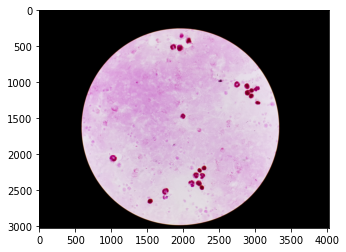

In [66]:
cv2.IMREAD_IGNORE_ORIENTATION = 128
img = cv2.imread(df_file['img_path'].iloc[-1], flags=cv2.IMREAD_IGNORE_ORIENTATION|cv2.IMREAD_COLOR)
#img = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
#img = cv2.flip(img, 1)
#img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)

plt.imshow(img)

In [67]:
# cv2.circle(img, df_file['position'][240][0], 1, (0,255,0), 50)
# plt.imshow(img)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':


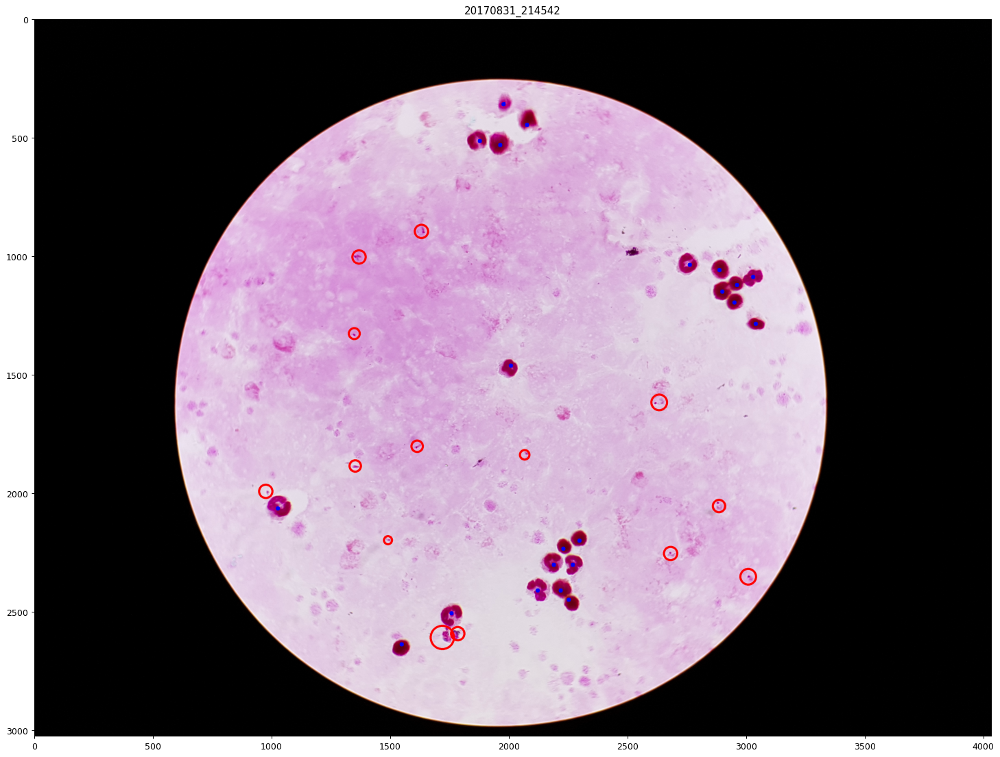

In [68]:
fig = plt.figure(1, figsize=(20,20), dpi=90)
df_file.apply(lambda row: draw_points(img, row['cell'], row['annotation_type'], row['position'], row), axis = 1)
plt.imshow(img)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  from ipykernel import kernelapp as app


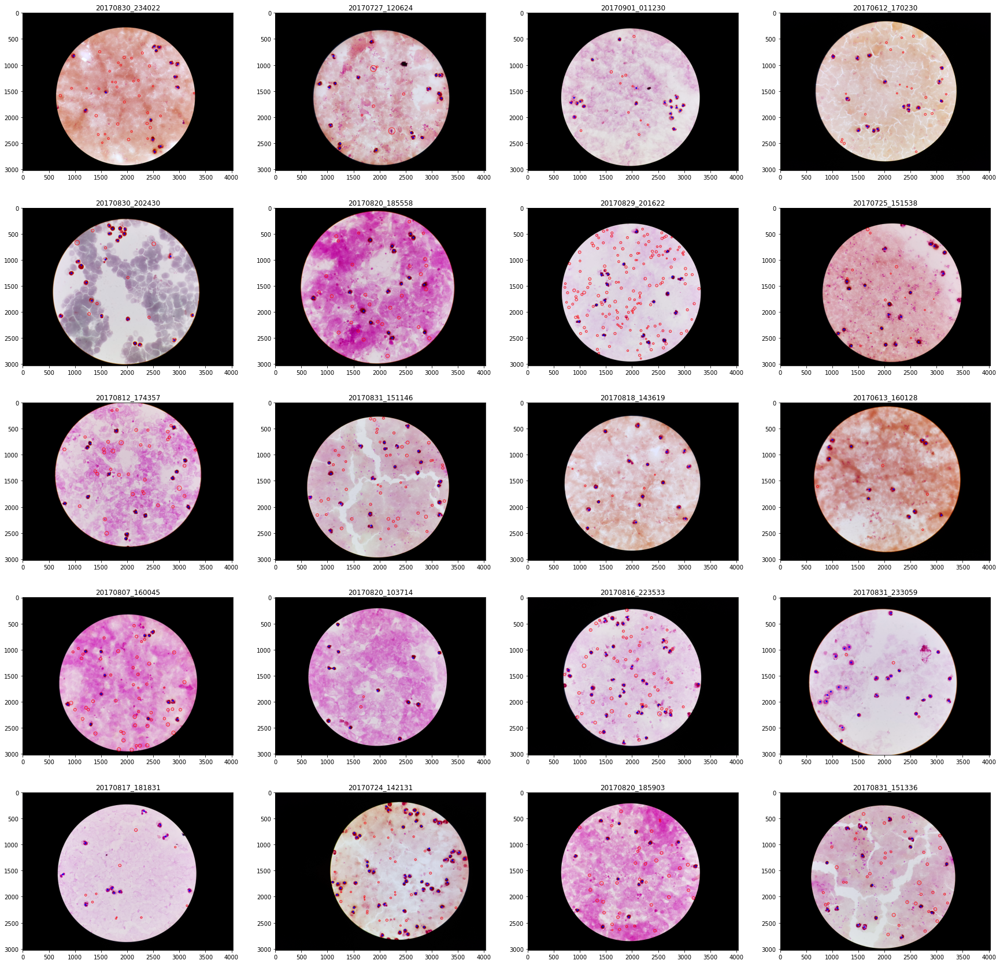

In [69]:
secure_random = random.SystemRandom()

w, h = 10, 10
fig=plt.figure(figsize=(30, 30))
columns = 4
rows = 5

for i in range(1, columns*rows +1):
    filename = secure_random.choice(df['filename'].unique())
    df_file = df[df['filename'] == filename]
    #print(filename)
    img = cv2.imread(df_file['img_path'].iloc[-1], flags=cv2.IMREAD_IGNORE_ORIENTATION|cv2.IMREAD_COLOR)
    #img = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
    df_file.apply(lambda row: draw_points(img, row['cell'], row['annotation_type'], row['position'], row = row, rows = rows, columns = columns, i = i, point_size= 30), axis = 1)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()

# Cutting and tiling images and labels

(4032, 3024)


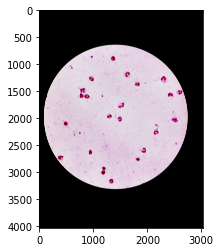

In [21]:
img = cv2.imread(df_file['img_path'].iloc[-1], cv2.IMREAD_COLOR)
resize_factor = 1
print(img.shape[:2])
resized_img = cv2.resize(img, (int(round(img.shape[1] * resize_factor)), int(round(img.shape[0] * resize_factor))), interpolation=cv2.INTER_AREA)
plt.imshow(resized_img)

In [22]:
df_file.head()

,Img no - Cell no,cell,comment,annotation_type,Number of points,position,filename,txt_path,img_path,bbx,patient_n_path
0,2-1,Parasite,schizont,Circle,2,"[(1882, 550), (1876, 569)]",20170830_140656,../data/Thick_Smears_150/GT_updated/TF105_245/...,../data/Thick_Smears_150/TF105_245/20170830_14...,"[1872, 540, 1891, 559]",412
1,2-10,Parasite,No_Comment,Circle,2,"[(2521, 742), (2510, 764)]",20170830_140656,../data/Thick_Smears_150/GT_updated/TF105_245/...,../data/Thick_Smears_150/TF105_245/20170830_14...,"[2509, 730, 2533, 754]",412
2,2-100,Parasite,No_Comment,Circle,2,"[(1800, 2563), (1805, 2582)]",20170830_140656,../data/Thick_Smears_150/GT_updated/TF105_245/...,../data/Thick_Smears_150/TF105_245/20170830_14...,"[1790, 2553, 1809, 2572]",412
3,2-101,Parasite,No_Comment,Circle,2,"[(1764, 2625), (1766, 2643)]",20170830_140656,../data/Thick_Smears_150/GT_updated/TF105_245/...,../data/Thick_Smears_150/TF105_245/20170830_14...,"[1755, 2616, 1773, 2634]",412
4,2-102,Parasite,No_Comment,Circle,2,"[(1723, 2702), (1725, 2722)]",20170830_140656,../data/Thick_Smears_150/GT_updated/TF105_245/...,../data/Thick_Smears_150/TF105_245/20170830_14...,"[1713, 2692, 1733, 2712]",412


## Cut fit to circle

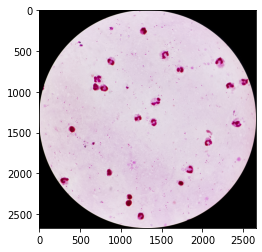

In [23]:
# select circle only
img_gray = rgb2gray(resized_img)
th = threshold_otsu(img_gray)
fg = img_gray>th
# Find the bounding box of those pixels
coords = np.array(np.nonzero(fg))
top_left = np.min(coords, axis=1)
bottom_right = np.max(coords, axis=1)

# #set all under threshhold values to zero 
# img_circle = resized_img*gray2rgb(fg)
img_circle = resized_img

img_cropped = img_circle[top_left[0]:bottom_right[0],
            top_left[1]:bottom_right[1]]

plt.imshow(img_cropped)

In [38]:
def adjust_poly_coord(poly_coords, removed_left, removed_top):
    '''returns a list of polgones with adjusted coordinates'''
    return [(poly[0] - removed_left, poly [1] - removed_top) for poly in poly_coords]
        
def circle_crop(img_path):
    '''returns a cropped image according to the circle as well as the removed top part and removed left part of the image'''
    img = cv2.imread(img_path, flags=cv2.IMREAD_IGNORE_ORIENTATION|cv2.IMREAD_COLOR)

    # select circle only
    img_gray = rgb2gray(img)
    th = threshold_otsu(img_gray)
    fg = img_gray>th
    # Find the bounding box of those pixels
    coords = np.array(np.nonzero(fg))
    min_coords = np.min(coords, axis=1) # [y1, x1]
    max_coords = np.max(coords, axis=1) # [y2, x2]
    
    print('min_coords:', min_coords)
    print('max_coords:', max_coords)
    
    if img_path in dict_poly:
        list_list_tuples_poly = dict_poly[img_path]
        list_tuples_poly = [item for sublist in list_list_tuples_poly for item in sublist]
        list_poly = list(sum(list_tuples_poly, ()))
        x = list_poly[0::2]
        y = list_poly[1::2]
        
        if min(y) < min_coords[0]:
            min_coords[0] = min(y)
        if min(x) < min_coords[1]:
            min_coords[1] = min(x)
        if max(y) > max_coords[0]:
            max_coords[0] = max(y)
        if max(x) > max_coords[1]:
            max_coords[1] = max(x)
            
        print('img_shape: ', img.shape)
        print('new min_coords:', min_coords)
        print('new max_coords:', max_coords)
        print('x min, x max: ', min(x), max(x))
        print('y min, y max: ', min(y), max(y))
    
    #set all under threshhold values to zero 
    #img_circle = img*gray2rgb(fg)
    
    ''' image[start_row:end_row, start_column:end_column] e.g. image[30:250, 100:230] or [x1:x2, y1:y2]
    You can see that the waterfall goes vertically starting at about 30px and ending at around 250px.
    You can see that the waterfall goes horizontally from around 100px to around 230px. 
                '''

    img_cropped = img[min_coords[0]:max_coords[0],
                min_coords[1]:max_coords[1]]
    
    return img_cropped, min_coords[0], min_coords[1]

In [39]:
def adjust_coordinates(img_path, position):
    '''returns adjusted coordinates and fitted circle img path '''
    removed_top, removed_left, outname_im = dict_rmv_fit_to_circle[img_path]
    adjusted_polys = adjust_poly_coord(position, removed_left, removed_top)
    return adjusted_polys


In [40]:
def poly2mask(filename, img_path = 'img_path', out_path = '../data/masks', poly_position = 'position'):
    img = cv2.imread(df.loc[(df['annotation_type'] == 'Polygon')  & (df['filename'] == filename), img_path].iloc[-1], cv2.IMREAD_COLOR)
    img = Image.new("L", [img.shape[1], img.shape[0]], 0)
    img = img.convert('1')
    [ ImageDraw.Draw(img).polygon(poly, outline=0, fill=1) for poly in df.loc[(df['annotation_type'] == 'Polygon') & (df['filename'] == filename), poly_position]]

    
    if not os.path.isdir(out_path):
        os.makedirs(out_path)

    mask_path = f'{out_path}/mask_{filename}.png'
    img.save(mask_path)
    return mask_path

def poly2multimask(filename, img_path = 'img_path', out_path = '../data/fit_to_circle', poly_position = 'adjusted_position', outname_mask = False):
    # fill index number per polygon
    img = cv2.imread(df.loc[(df['annotation_type'] == 'Polygon')  & (df['filename'] == filename), img_path].iloc[-1], cv2.IMREAD_COLOR)
    np_img = np.zeros(shape=[img.shape[0], img.shape[1], 1], dtype=np.uint16)

    # This gets polygons filled with an index number
    for index, poly in enumerate(df.loc[(df['annotation_type'] == 'Polygon') & (df['filename'] == filename), poly_position]):
        poly = np.array(poly)
        rr, cc = polygon(poly[::,1], poly[::,0])
        np_img[rr, cc] = index
    
    #np_img = np_img.astype(np.uint16) if np_img.max()<2**16-1 else np_img.astype(np.uint32)
        
    if not os.path.isdir(out_path):
        os.makedirs(out_path)    
    
    if outname_mask:
        cv2.imwrite(outname_mask, np_img)
    else:    
        outname_mask = f'{outname_mask}/mask_{filename}.png'
        cv2.imwrite(outname_mask, np_img)
    return outname_mask

In [41]:
check_if_outdir_im_circle = os.path.isdir(path_fit_to_circle)

if not check_if_outdir_im_circle:
    os.makedirs(path_fit_to_circle)

In [42]:
 # we want to save all images and also create a dictionary with the pixels removed at the top and bottom
dict_rmv_fit_to_circle = {}
dict_patient_n = dict(zip(df['img_path'], df['patient_n_path']))
dict_filename = dict(zip(df['img_path'], df['filename']))
dict_poly = {}

for img_path in df['img_path'].unique():
    if not df.loc[(df['annotation_type'] == 'Polygon') & (df['img_path'] == img_path), 'img_path'].empty:
        print('poly: ', img_path)
        dict_poly[img_path] = [poly for poly in df.loc[(df['annotation_type'] == 'Polygon') & (df['img_path'] == img_path), 'position']]
        
    img_cropped, removed_top, removed_left = circle_crop(img_path)  
    patient_n_path = dict_patient_n[img_path]
    filename = dict_filename[img_path]
    outname_im = os.path.join(path_fit_to_circle + '/cropped_P' + str(patient_n_path) + '_' + filename + '.png')
    
    print('saving: ', outname_im)
    cv2.imwrite(outname_im, img_cropped)
    
    dict_rmv_fit_to_circle[img_path] = [removed_top, removed_left, outname_im]
    

min_coords: [ 62 693]
max_coords: [2712 3359]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P301_20170812_171245.png
min_coords: [ 55 690]
max_coords: [2711 3362]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P301_20170812_170033.png
min_coords: [ 16 639]
max_coords: [2755 3398]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P301_20170812_163436.png
min_coords: [ 58 692]
max_coords: [2709 3360]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P301_20170812_170639.png
min_coords: [ 57 688]
max_coords: [2714 3361]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P301_20170812_165110.png
min_coords: [ 53 691]
max_coords: [2708 3362]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P301_20170812_164716.png
min_coords: [ 50 671]
max_coords: [2731 3369]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P301_20170812_163628.png
min_coords: [ 47 678]
max_coords: [2722 3370]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P301_2017

min_coords: [283 633]
max_coords: [2947 3313]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P305_20170831_142222.png
min_coords: [296 648]
max_coords: [2931 3299]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P305_20170831_142403.png
min_coords: [299 649]
max_coords: [2930 3297]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P305_20170831_143307.png
min_coords: [305 658]
max_coords: [2920 3290]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P305_20170831_142319.png
min_coords: [296 643]
max_coords: [2938 3302]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P305_20170831_143632.png
min_coords: [224 563]
max_coords: [3018 3374]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P305_20170831_143020.png
min_coords: [309 647]
max_coords: [2926 3280]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P306_20170831_173215.png
min_coords: [297 632]
max_coords: [2941 3294]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P306_2017

min_coords: [206 653]
max_coords: [2879 3343]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P311_20170817_113430.png
min_coords: [224 666]
max_coords: [2867 3326]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P311_20170817_114302.png
min_coords: [237 680]
max_coords: [2852 3312]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P311_20170817_114037.png
min_coords: [234 676]
max_coords: [2857 3316]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P311_20170817_113941.png
min_coords: [224 665]
max_coords: [2869 3327]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P311_20170817_114226.png
min_coords: [243 683]
max_coords: [2852 3308]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P311_20170817_113831.png
min_coords: [230 669]
max_coords: [2866 3321]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P311_20170817_114411.png
min_coords: [297 664]
max_coords: [2934 3318]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P312_2017

min_coords: [ 86 965]
max_coords: [2850 3743]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P316_20170708_112540.png
min_coords: [ 133 1020]
max_coords: [2796 3699]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P316_20170708_110222.png
min_coords: [ 127 1067]
max_coords: [2771 3727]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P316_20170708_102615.png
min_coords: [ 120 1105]
max_coords: [2763 3762]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P316_20170708_103450.png
min_coords: [ 131 1072]
max_coords: [2767 3722]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P316_20170708_101907.png
min_coords: [ 99 975]
max_coords: [2841 3731]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P316_20170708_105144.png
min_coords: [ 152 1036]
max_coords: [2784 3685]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P316_20170708_104528.png
min_coords: [ 144 1027]
max_coords: [2794 3693]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropp

min_coords: [323 667]
max_coords: [2909 3270]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P321_20170831_235238.png
min_coords: [294 633]
max_coords: [2949 3305]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P321_20170831_234640.png
min_coords: [294 632]
max_coords: [2949 3304]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P321_20170831_235454.png
min_coords: [294 633]
max_coords: [2948 3303]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P321_20170831_235044.png
min_coords: [292 632]
max_coords: [2947 3304]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P321_20170831_235632.png
min_coords: [267 601]
max_coords: [2985 3336]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P321_20170831_234431.png
min_coords: [274 611]
max_coords: [2973 3326]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P321_20170831_234951.png
min_coords: [309 648]
max_coords: [2931 3287]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P321_2017

min_coords: [307 674]
max_coords: [2919 3303]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P326_20170829_155959.png
min_coords: [313 677]
max_coords: [2915 3296]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P326_20170829_155602.png
min_coords: [261 623]
max_coords: [2974 3352]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P326_20170829_154523.png
min_coords: [290 656]
max_coords: [2938 3321]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P326_20170829_155229.png
min_coords: [ 171 1054]
max_coords: [2818 3716]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P327_20170724_141308.png
min_coords: [ 186 1060]
max_coords: [2818 3705]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P327_20170724_141719.png
min_coords: [ 178 1043]
max_coords: [2833 3713]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P327_20170724_142701.png
min_coords: [ 183 1054]
max_coords: [2823 3707]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P

min_coords: [324 668]
max_coords: [2906 3267]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P332_20170831_220054.png
min_coords: [248 583]
max_coords: [2995 3348]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P332_20170831_220229.png
min_coords: [226 544]
max_coords: [3023 3374]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P332_20170831_215743.png
min_coords: [270 602]
max_coords: [2976 3326]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P332_20170831_215414.png
min_coords: [330 666]
max_coords: [2911 3263]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P332_20170831_220446.png
min_coords: [227 552]
max_coords: [3023 3376]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P332_20170831_215649.png
min_coords: [258 587]
max_coords: [2990 3339]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P332_20170831_215608.png
min_coords: [279 609]
max_coords: [2971 3319]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P332_2017

min_coords: [321 690]
max_coords: [2961 3347]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P338_20170728_172303.png
min_coords: [316 689]
max_coords: [2962 3351]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P338_20170728_172025.png
min_coords: [330 707]
max_coords: [2940 3334]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P338_20170728_171350.png
min_coords: [305 701]
max_coords: [2949 3362]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P338_20170728_165143.png
min_coords: [269 647]
max_coords: [3001 3401]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P338_20170728_170053.png
min_coords: [302 707]
max_coords: [2940 3362]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P338_20170728_164610.png
min_coords: [320 697]
max_coords: [2953 3347]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P338_20170728_170746.png
min_coords: [327 702]
max_coords: [2949 3340]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P338_2017

min_coords: [208 639]
max_coords: [2848 3296]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P342_20170820_160328.png
min_coords: [224 661]
max_coords: [2826 3279]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P342_20170820_154717.png
min_coords: [211 646]
max_coords: [2842 3293]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P342_20170820_155500.png
min_coords: [213 649]
max_coords: [2838 3290]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P342_20170820_155307.png
min_coords: [205 637]
max_coords: [2851 3300]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P342_20170820_160034.png
min_coords: [205 638]
max_coords: [2850 3300]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P342_20170820_155008.png
min_coords: [201 633]
max_coords: [2855 3304]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P342_20170820_155633.png
min_coords: [223 660]
max_coords: [2876 3329]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P343_2017

min_coords: [295 626]
max_coords: [2950 3298]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P348_20170831_181112.png
min_coords: [302 638]
max_coords: [2936 3289]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P348_20170831_175525.png
min_coords: [275 605]
max_coords: [2972 3320]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P348_20170831_180949.png
min_coords: [333 669]
max_coords: [2901 3254]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P348_20170831_180224.png
min_coords: [292 625]
max_coords: [2950 3299]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P348_20170831_181256.png
min_coords: [310 647]
max_coords: [2926 3280]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P348_20170831_174841.png
min_coords: [288 625]
max_coords: [2949 3303]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P348_20170831_175310.png
min_coords: [298 634]
max_coords: [2940 3293]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P348_2017

min_coords: [241 693]
max_coords: [2853 3320]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P352_20170818_145826.png
min_coords: [237 652]
max_coords: [2887 3320]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P352_20170818_151900.png
min_coords: [202 652]
max_coords: [2893 3360]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P352_20170818_150344.png
min_coords: [291 634]
max_coords: [2947 3307]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P353_20170901_022450.png
min_coords: [287 633]
max_coords: [2947 3310]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P353_20170901_021940.png
min_coords: [291 636]
max_coords: [2943 3305]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P353_20170901_022657.png
min_coords: [277 616]
max_coords: [2965 3322]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P353_20170901_022337.png
min_coords: [291 636]
max_coords: [2944 3306]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P353_2017

min_coords: [315 687]
max_coords: [2975 3363]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P358_20170807_174912.png
min_coords: [323 692]
max_coords: [2969 3356]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P358_20170807_174500.png
min_coords: [338 711]
max_coords: [2948 3339]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P358_20170807_174613.png
min_coords: [269 630]
max_coords: [2967 3344]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P359_20170829_201252.png
min_coords: [299 654]
max_coords: [2945 3315]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P359_20170829_201622.png
min_coords: [295 648]
max_coords: [2949 3319]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P359_20170829_201518.png
min_coords: [219 571]
max_coords: [3022 3393]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P359_20170829_201144.png
min_coords: [289 646]
max_coords: [2951 3324]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P359_2017

min_coords: [277 654]
max_coords: [2919 3312]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P365_20170830_105037.png
min_coords: [279 654]
max_coords: [2920 3312]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P365_20170830_105127.png
min_coords: [226 613]
max_coords: [2964 3370]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P365_20170830_103930.png
min_coords: [277 650]
max_coords: [2928 3317]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P365_20170830_105334.png
min_coords: [275 648]
max_coords: [2925 3316]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P365_20170830_105253.png
min_coords: [210 588]
max_coords: [2992 3388]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P365_20170830_104154.png
min_coords: [271 649]
max_coords: [2925 3320]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P365_20170830_104521.png
min_coords: [281 658]
max_coords: [2915 3309]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P365_2017

min_coords: [209 668]
max_coords: [2865 3342]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P371_20170817_100135.png
min_coords: [215 671]
max_coords: [2863 3336]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P371_20170817_100311.png
min_coords: [218 673]
max_coords: [2861 3332]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P371_20170817_095134.png
min_coords: [219 672]
max_coords: [2861 3331]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P371_20170817_095256.png
min_coords: [281 675]
max_coords: [2978 3390]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P372_20170727_175209.png
min_coords: [316 704]
max_coords: [2949 3354]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P372_20170727_175851.png
min_coords: [304 690]
max_coords: [2963 3366]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P372_20170727_181719.png
min_coords: [326 727]
max_coords: [2922 3338]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P372_2017

min_coords: [ 88 657]
max_coords: [2845 3430]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P376_20170613_173415.png
min_coords: [110 674]
max_coords: [2829 3405]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P376_20170613_173631.png
min_coords: [ 59 632]
max_coords: [2880 3470]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P376_20170613_175916.png
min_coords: [ 37 609]
max_coords: [2897 3483]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P376_20170613_180044.png
min_coords: [149 706]
max_coords: [2794 3360]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P376_20170613_174205.png
min_coords: [135 698]
max_coords: [2802 3375]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P376_20170613_173121.png
min_coords: [ 88 658]
max_coords: [2850 3435]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P376_20170613_174434.png
min_coords: [ 85 657]
max_coords: [2851 3438]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P376_2017

min_coords: [296 640]
max_coords: [2940 3301]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P381_20170901_020716.png
min_coords: [308 650]
max_coords: [2929 3288]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P381_20170901_020120.png
min_coords: [292 632]
max_coords: [2948 3305]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P381_20170901_020015.png
min_coords: [308 652]
max_coords: [2927 3288]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P381_20170901_020310.png
min_coords: [292 635]
max_coords: [2945 3305]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P381_20170901_020443.png
min_coords: [297 638]
max_coords: [2945 3303]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P381_20170901_020221.png
min_coords: [295 638]
max_coords: [2942 3302]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P381_20170901_020357.png
min_coords: [307 651]
max_coords: [2929 3290]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P381_2017

min_coords: [108 723]
max_coords: [2689 3315]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P387_20170812_115346.png
min_coords: [ 59 690]
max_coords: [2714 3361]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P387_20170812_120736.png
min_coords: [ 72 695]
max_coords: [2709 3348]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P387_20170812_161123.png
min_coords: [105 721]
max_coords: [2687 3315]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P387_20170812_162003.png
min_coords: [ 79 697]
max_coords: [2707 3342]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P387_20170812_161522.png
min_coords: [ 68 690]
max_coords: [2713 3350]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P387_20170812_161358.png
min_coords: [ 63 690]
max_coords: [2715 3358]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P387_20170812_120916.png
min_coords: [333 673]
max_coords: [2900 3257]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P388_2017

min_coords: [305 645]
max_coords: [2934 3291]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P392_20170901_010205.png
min_coords: [232 593]
max_coords: [2988 3366]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P393_20170830_205719.png
min_coords: [271 634]
max_coords: [2941 3322]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P393_20170830_210359.png
min_coords: [267 631]
max_coords: [2944 3326]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P393_20170830_210030.png
min_coords: [225 580]
max_coords: [3002 3374]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P393_20170830_205547.png
min_coords: [271 640]
max_coords: [2935 3321]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P393_20170830_210254.png
min_coords: [282 649]
max_coords: [2926 3309]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P393_20170830_205822.png
min_coords: [278 644]
max_coords: [2931 3314]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P393_2017

min_coords: [188 531]
max_coords: [3023 3411]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P398_20170831_135016.png
min_coords: [219 655]
max_coords: [2835 3288]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P399_20170820_164311.png
min_coords: [215 649]
max_coords: [2839 3290]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P399_20170820_170007.png
min_coords: [214 650]
max_coords: [2838 3292]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P399_20170820_164418.png
min_coords: [161 600]
max_coords: [2883 3339]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P399_20170820_164535.png
min_coords: [167 602]
max_coords: [2882 3334]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P399_20170820_165423.png
min_coords: [199 635]
max_coords: [2853 3305]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P399_20170820_165824.png
min_coords: [204 639]
max_coords: [2849 3301]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P399_2017

min_coords: [230 672]
max_coords: [2869 3328]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P403_20170817_165506.png
min_coords: [ 24 662]
max_coords: [2734 3384]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P404_20170811_162204.png
min_coords: [ 39 679]
max_coords: [2719 3374]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P404_20170811_162709.png
min_coords: [ 54 692]
max_coords: [2707 3360]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P404_20170811_165217.png
min_coords: [ 58 691]
max_coords: [2708 3358]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P404_20170811_165438.png
min_coords: [ 45 688]
max_coords: [2707 3367]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P404_20170811_170038.png
min_coords: [ 75 709]
max_coords: [2692 3342]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P404_20170811_170443.png
min_coords: [ 62 692]
max_coords: [2709 3354]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P404_2017

min_coords: [108 693]
max_coords: [2981 3558]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P409_20170705_111253.png
min_coords: [149 777]
max_coords: [2843 3463]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P409_20170705_113900.png
min_coords: [222 828]
max_coords: [2862 3457]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P409_20170705_111649.png
min_coords: [143 764]
max_coords: [2880 3495]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P409_20170705_112620.png
min_coords: [171 790]
max_coords: [2837 3448]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P409_20170705_113023.png
min_coords: [184 815]
max_coords: [2813 3433]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P409_20170705_113636.png
min_coords: [163 784]
max_coords: [2839 3453]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P409_20170705_114311.png
min_coords: [180 804]
max_coords: [2853 3469]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P409_2017

min_coords: [337 708]
max_coords: [2950 3339]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P414_20170807_160843.png
min_coords: [289 660]
max_coords: [3002 3390]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P414_20170807_161346.png
min_coords: [320 694]
max_coords: [2965 3357]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P414_20170807_162243.png
min_coords: [278 651]
max_coords: [3007 3400]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P414_20170807_155628.png
min_coords: [305 675]
max_coords: [2987 3375]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P414_20170807_160538.png
min_coords: [325 698]
max_coords: [2963 3353]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P414_20170807_155927.png
min_coords: [330 701]
max_coords: [2960 3347]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P414_20170807_160752.png
min_coords: [332 707]
max_coords: [2953 3345]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P414_2017

min_coords: [218 733]
max_coords: [2789 3315]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P419_20170612_165431.png
min_coords: [193 706]
max_coords: [2820 3344]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P419_20170612_171658.png
min_coords: [173 695]
max_coords: [2830 3363]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P419_20170612_165246.png
min_coords: [165 678]
max_coords: [2850 3375]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P419_20170612_170230.png
min_coords: [179 689]
max_coords: [2839 3360]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P419_20170612_170724.png
min_coords: [189 711]
max_coords: [2814 3347]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P419_20170612_164944.png
min_coords: [204 719]
max_coords: [2806 3332]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P419_20170612_165612.png
min_coords: [171 678]
max_coords: [2849 3368]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P419_2017

min_coords: [313 676]
max_coords: [2887 3272]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P424_20170830_221733.png
min_coords: [261 622]
max_coords: [2958 3334]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P424_20170830_221113.png
min_coords: [238 599]
max_coords: [2978 3356]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P424_20170830_221606.png
min_coords: [200 631]
max_coords: [2903 3351]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P425_20170818_170107.png
min_coords: [170 604]
max_coords: [2928 3379]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P425_20170818_170756.png
min_coords: [212 642]
max_coords: [2891 3339]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P425_20170818_165825.png
min_coords: [233 659]
max_coords: [2877 3320]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P425_20170818_171355.png
min_coords: [212 638]
max_coords: [2896 3341]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P425_2017

min_coords: [226 681]
max_coords: [2859 3331]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P429_20170817_180107.png
min_coords: [219 671]
max_coords: [2870 3339]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P429_20170817_180822.png
min_coords: [218 668]
max_coords: [2873 3340]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P429_20170817_180959.png
min_coords: [222 668]
max_coords: [2874 3336]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P429_20170817_181156.png
min_coords: [229 672]
max_coords: [2868 3329]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P429_20170817_181640.png
min_coords: [211 686]
max_coords: [2851 3342]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P429_20170817_175529.png
min_coords: [217 674]
max_coords: [2866 3340]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P429_20170817_180009.png
min_coords: [137 602]
max_coords: [2933 3414]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P429_2017

min_coords: [289 718]
max_coords: [2943 3389]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P434_20171023_133509.png
min_coords: [303 734]
max_coords: [2926 3373]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P434_20171023_133558.png
min_coords: [293 723]
max_coords: [2937 3384]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P434_20171023_132712.png
min_coords: [295 720]
max_coords: [2941 3382]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P434_20171023_132240.png
min_coords: [297 728]
max_coords: [2931 3378]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P434_20171023_133230.png
min_coords: [293 720]
max_coords: [2941 3385]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P434_20171023_132430.png
min_coords: [292 721]
max_coords: [2939 3385]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P434_20171023_133137.png
min_coords: [302 732]
max_coords: [2926 3374]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P434_2017

min_coords: [123 673]
max_coords: [2762 3329]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P439_20170816_092147.png
min_coords: [119 672]
max_coords: [2763 3332]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P439_20170816_091852.png
min_coords: [191 632]
max_coords: [2855 3313]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P440_20170820_152020.png
min_coords: [202 642]
max_coords: [2846 3302]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P440_20170820_151851.png
min_coords: [183 625]
max_coords: [2859 3320]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P440_20170820_152301.png
min_coords: [197 638]
max_coords: [2848 3307]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P440_20170820_152132.png
min_coords: [230 600]
max_coords: [2976 3364]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P441_20170830_110200.png
min_coords: [286 652]
max_coords: [2920 3303]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P441_2017

min_coords: [190 877]
max_coords: [2894 3599]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P444_20170622_164204.png
min_coords: [221 891]
max_coords: [2879 3567]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P444_20170622_170116.png
min_coords: [225 894]
max_coords: [2876 3563]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P444_20170622_165408.png
min_coords: [227 895]
max_coords: [2874 3561]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P444_20170622_165250.png
min_coords: [ 89 793]
max_coords: [2993 3718]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P444_20170622_163742.png
min_coords: [146 848]
max_coords: [2929 3648]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P444_20170622_163615.png
min_coords: [139 828]
max_coords: [2949 3659]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P444_20170622_164005.png
min_coords: [226 899]
max_coords: [2871 3561]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P444_2017

min_coords: [219 650]
max_coords: [2840 3288]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P449_20170820_190919.png
min_coords: [228 659]
max_coords: [2831 3279]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P449_20170820_190457.png
min_coords: [186 618]
max_coords: [2870 3318]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P449_20170820_190747.png
min_coords: [244 676]
max_coords: [2811 3259]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P449_20170820_185756.png
min_coords: [215 648]
max_coords: [2841 3291]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P449_20170820_190034.png
min_coords: [333 683]
max_coords: [2915 3281]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P450_20170829_202705.png
min_coords: [279 648]
max_coords: [2929 3314]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P450_20170829_203819.png
min_coords: [336 687]
max_coords: [2908 3276]
saving:  ../data/Thick_Smears_150/fit_to_circle/cropped_P450_2017

In [54]:
df['adjusted_position'] = df.apply(lambda row: adjust_coordinates(row.img_path, row.position), axis = 1) 
df['img_path_fit2circle'] = df['img_path'].apply(lambda x: dict_rmv_fit_to_circle[x][2])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':


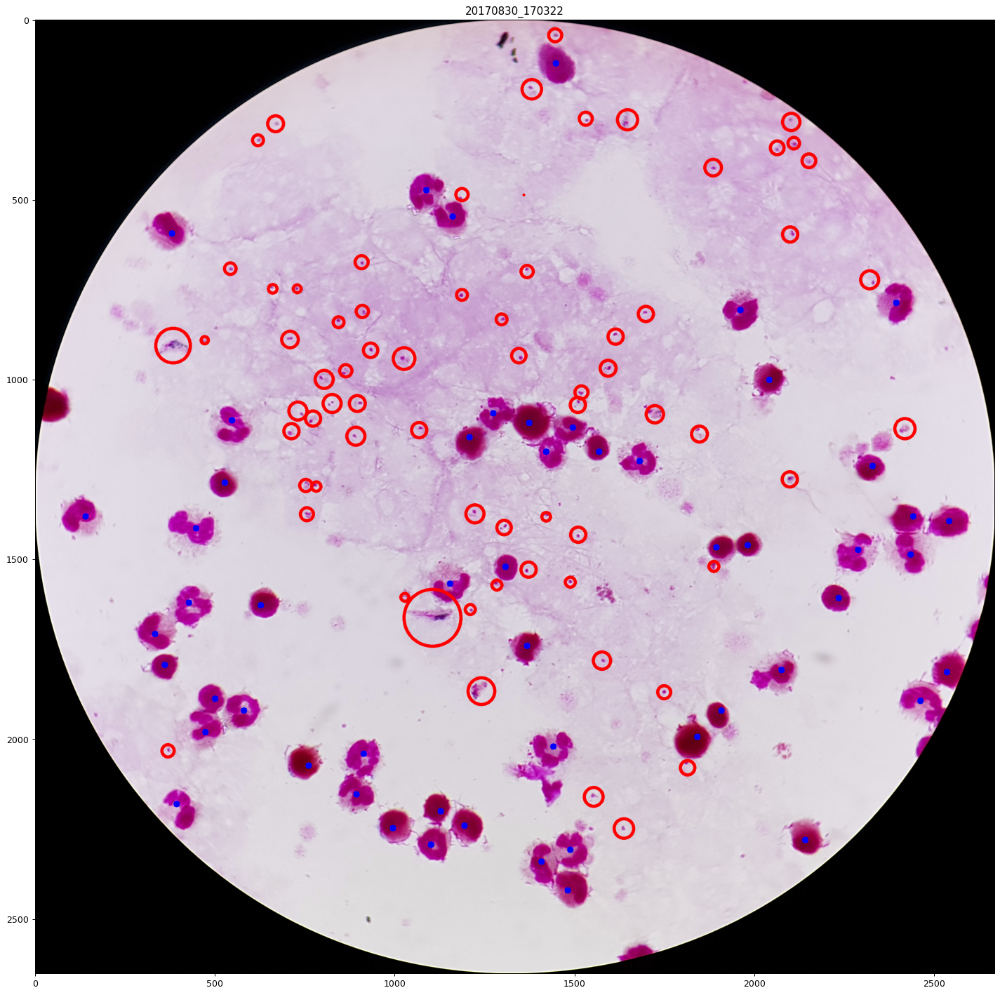

In [246]:
df_file = df[df['filename'] == filename]
img = cv2.imread(df_file['img_path_fit2circle'].iloc[-1], flags=cv2.IMREAD_IGNORE_ORIENTATION|cv2.IMREAD_COLOR)
fig = plt.figure(1, figsize=(20,20), dpi=90)
df_file.apply(lambda row: draw_points(img, row['cell'], row['annotation_type'], row['adjusted_position'], row), axis = 1)
plt.imshow(img)

In [62]:
df['adjusted_bbx'] = df.apply(lambda row: get_bbx(row['adjusted_position'], row['annotation_type'], 150), axis = 1)

In [63]:
#filename =  'IMG_20150623_134547' 
df_file = df[df['filename'] == filename]
df_file.head()

,Img no - Cell no,cell,comment,annotation_type,Number of points,position,filename,txt_path,img_path,bbx,patient_n_path,adjusted_position,img_path_fit2circle,adjusted_bbx
0,3-1,Parasite,No_Comment,Circle,2,"[(2931, 656), (2931, 675)]",20170820_152301,../data/Thick_Smears_150/GT_updated/TF87_15105...,../data/Thick_Smears_150/TF87_15105A/20170820_...,"[2921, 646, 2940, 665]",440,"[(2306, 473), (2306, 492)]",../data/Thick_Smears_150/fit_to_circle/cropped...,"[2296, 463, 2315, 482]"
1,3-10,Parasite,No_Comment,Circle,2,"[(2142, 721), (2146, 744)]",20170820_152301,../data/Thick_Smears_150/GT_updated/TF87_15105...,../data/Thick_Smears_150/TF87_15105A/20170820_...,"[2130, 709, 2153, 732]",440,"[(1517, 538), (1521, 561)]",../data/Thick_Smears_150/fit_to_circle/cropped...,"[1505, 526, 1528, 549]"
2,3-11,Parasite,No_Comment,Circle,2,"[(1975, 636), (1975, 660)]",20170820_152301,../data/Thick_Smears_150/GT_updated/TF87_15105...,../data/Thick_Smears_150/TF87_15105A/20170820_...,"[1963, 624, 1987, 648]",440,"[(1350, 453), (1350, 477)]",../data/Thick_Smears_150/fit_to_circle/cropped...,"[1338, 441, 1362, 465]"
3,3-12,Parasite,No_Comment,Circle,2,"[(1826, 557), (1822, 579)]",20170820_152301,../data/Thick_Smears_150/GT_updated/TF87_15105...,../data/Thick_Smears_150/TF87_15105A/20170820_...,"[1815, 546, 1837, 568]",440,"[(1201, 374), (1197, 396)]",../data/Thick_Smears_150/fit_to_circle/cropped...,"[1190, 363, 1212, 385]"
4,3-13,Parasite,No_Comment,Circle,2,"[(1792, 613), (1792, 637)]",20170820_152301,../data/Thick_Smears_150/GT_updated/TF87_15105...,../data/Thick_Smears_150/TF87_15105A/20170820_...,"[1780, 601, 1804, 625]",440,"[(1167, 430), (1167, 454)]",../data/Thick_Smears_150/fit_to_circle/cropped...,"[1155, 418, 1179, 442]"


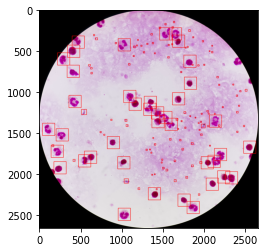

In [143]:
img = cv2.imread(df_file['img_path_fit2circle'].iloc[-1], cv2.IMREAD_COLOR)
img_with_box = bbv.draw_multiple_rectangles(img, df_file['adjusted_bbx'].tolist(), bbox_color = (255, 0, 0), thickness=3)
plt.imshow(img_with_box)

## Crop tiles

In [70]:
def plot_tiles(img, tile_w, tile_h):
    img_shape = img.shape
    tile_size = (tile_w, tile_h)
    offset = (tile_w, tile_h)

    for x in range(int(math.ceil(img_shape[0]/(offset[1] * 1.0)))):
        #print(i)
        for y in range(int(math.ceil(img_shape[1]/(offset[0] * 1.0)))):
            #print(j)
            #print((offset[1]*i, min(offset[1]*i+tile_size[1], img_shape[0])), (offset[0]*j, min(offset[0]*j+tile_size[0], img_shape[1])))
            x_min = min(offset[1] * x + tile_size[1], img_shape[0])
            x_max = offset[1] * x
            y_min = min(offset[0] * y + tile_size[0], img_shape[1])
            y_max = offset[0]*y
            cv2.rectangle(img, (x_max, x_min), (y_max, y_min), (0, 0, 255), 3)
            #cropped_img = img[offset[1]*i:min(offset[1]*i+tile_size[1], img_shape[0]), offset[0]*j:min(offset[0]*j+tile_size[0], img_shape[1])]
            # Debugging the tiles
            #cv2.imwrite("debug_" + str(i) + "_" + str(j) + ".png", cropped_img)
    plt.imshow(crop_img)

def crop_tiles(img, tile_w, tile_h):
    img_shape = img.shape
    tile_size = (tile_w, tile_h)
    offset = (tile_w, tile_h)
    for x in range(int(math.ceil(img_shape[0]/(offset[1] * 1.0)))):
        for y in range(int(math.ceil(img_shape[1]/(offset[0] * 1.0)))):
            x_min = offset[1] * x
            x_max = min(offset[1] * x + tile_size[1], img_shape[0])
            y_min = offset[0]*y
            y_max = min(offset[0] * y + tile_size[0], img_shape[1])
            crop_image = img[x_min : x_min + tile_w, y_min: y_min + tile_h]
            cv2.imwrite(path_cropped + f'/cropped/{x_min}_{x_max}_{y_min}_{y_max}.png', crop_image) 
    #plt.imshow(crop_image)


In [71]:
def convert_labels(path, x1, y1, x2, y2):
    """
    Definition: Parses label files to extract label and bounding box
        coordinates.  Converts (x1, y1, x1, y2) KITTI format to
        (x, y, width, height) normalized YOLO format.
    """
    def sorting(l1, l2):
        if l1 > l2:
            lmax, lmin = l1, l2
            return lmax, lmin
        else:
            lmax, lmin = l2, l1
            return lmax, lmin
    size = get_img_shape(path)
    xmax, xmin = sorting(x1, x2)
    ymax, ymin = sorting(y1, y2)
    dw = 1./size[1]
    dh = 1./size[0]
    x = (xmin + xmax)/2.0
    y = (ymin + ymax)/2.0
    w = xmax - xmin
    h = ymax - ymin
    x = x*dw
    w = w*dw
    y = y*dh
    h = h*dh
    return (x,y,w,h)

In [72]:
def get_iou(bb1, bb2):
    """
    Calculate the Intersection over Union (IoU) of two bounding boxes.

    Parameters
    ----------
    bb1 : list
        order: [x1, y1, x2, y2] 
        The (x1, y1) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner
    bb2 : list
        order: [x1, y1, x2, y2]
        The (x, y) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner

    Returns
    -------
    float
        in [0, 1]
    """
    assert bb1[0] < bb1[2]
    assert bb1[1] < bb1[3]
    assert bb2[0] < bb2[2]
    assert bb2[1] < bb2[3]

    # determine the coordinates of the intersection rectangle
    x_left = max(bb1[0], bb2[0])
    y_top = max(bb1[1], bb2[1])
    x_right = min(bb1[2], bb2[2])
    y_bottom = min(bb1[3], bb2[3])

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    # The intersection of two axis-aligned bounding boxes is always an
    # axis-aligned bounding box
    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    # compute the area of both AABBs
    bb1_area = (bb1[2] - bb1[0]) * (bb1[3] - bb1[1])
    bb2_area = (bb2[2] - bb2[0]) * (bb2[3] - bb2[1])

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
    assert iou >= 0.0
    assert iou <= 1.0
    return iou

In [73]:
def get_intersection_percent(bb1, bb2):
    """
    Calculate the Intersection over Union (IoU) of two bounding boxes.

    Parameters
    ----------
    bb1 : list
        order: [x1, y1, x2, y2] 
        The (x1, y1) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner
    bb2 : list
        order: [x1, y1, x2, y2]
        The (x, y) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner

    Returns
    -------
    float
        in [0, 1]
    """
    try:
        assert bb1[0] < bb1[2]
        assert bb1[1] < bb1[3]
        assert bb2[0] < bb2[2]
        assert bb2[1] < bb2[3]
    except Exception as e:
        print('bb1: ', bb1)
        print('bb2: ', bb2)

    # determine the coordinates of the intersection rectangle
    x_left = max(bb1[0], bb2[0])
    y_top = max(bb1[1], bb2[1])
    x_right = min(bb1[2], bb2[2])
    y_bottom = min(bb1[3], bb2[3])

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    # The intersection of two axis-aligned bounding boxes is always an
    # axis-aligned bounding box
    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    # compute the area of both AABBs
    bb1_area = (bb1[2] - bb1[0]) * (bb1[3] - bb1[1])
    bb2_area = (bb2[2] - bb2[0]) * (bb2[3] - bb2[1])

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = intersection_area / float(bb1_area)
    assert iou >= 0.0
    assert iou <= 1.0
    return iou

In [74]:
###############################################################################
def slice_img(input_im, input_mask, 
                     filename,
                    outdir_im, 
                     outdir_mask,
                     outdir_label,
                      classes_dic, 
                     category, 
                     box_coords, resize_factor = 1,
                  sliceHeight=256, sliceWidth=256,
                  zero_frac_thresh=0, overlap=0, pad=0, verbose = False,
                  box_coords_dir='', yolt_coords_dir='', create_mask = False):
    '''
    ADAPTED FROM YOLT/SCRIPTS/SLICE_IM.PY
    Assume input_im is rgb
    Slice large image into smaller pieces,
    ignore slices with a percentage null greater then zero_fract_thresh'''
    
    if verbose == True:
        print('############# slice_img #############')
    img = cv2.imread(input_im, flags=cv2.IMREAD_IGNORE_ORIENTATION|cv2.IMREAD_COLOR)  # color
    if create_mask:
        mask = cv2.imread(input_mask, flags=cv2.IMREAD_IGNORE_ORIENTATION|cv2.IMREAD_BW)
    category_num = [classes_dic[k] for k in category] 

    resized_img = cv2.resize(img, (int(round(img.shape[1] * resize_factor)), int(round(img.shape[0] * resize_factor))))
    if create_mask == True:
        resized_mask = cv2.resize(mask, (int(round(mask.shape[1] * resize_factor)), int(round(mask.shape[0] * resize_factor))))
    resized_box_coords = np.array(np.round(np.array(box_coords) * np.array(resize_factor)).astype(int))


    im_h, im_w = resized_img.shape[:2]
    if verbose:
        print('im_h', im_h)
        print('im_w', im_w)

    win_size = sliceHeight*sliceWidth

    # if slice sizes are large than image, pad the edges
    if sliceHeight > im_h:
        pad = sliceHeight - im_h
    if sliceWidth > im_w:
        pad = max(pad, sliceWidth - im_w)
    # pad the edge of the image with black pixels
    if pad > 0:
        border_color = (0, 0, 0)
        resized_img = cv2.copyMakeBorder(resized_img, pad, pad, pad, pad,
                                   cv2.BORDER_CONSTANT, value=border_color)
        if create_mask == True:
            resized_mask = cv2.copyMakeBorder(resized_img, pad, pad, pad, pad,
                                cv2.BORDER_CONSTANT, value=border_color)

    t0 = time.time()
    n_ims = 0
    n_ims_nonull = 0
    dx = int((1. - overlap) * sliceWidth)
    dy = int((1. - overlap) * sliceHeight)
    if verbose:
        print('dx', dx)
        print('dy', dy)
    dict_yolo = {}
    dict_bbx = {}
    max_annot = 0

    for y in range(0, im_h, dy):  # sliceHeight:
        for x in range(0, im_w, dx):  # sliceWidth:
            n_ims += 1
            # extract image
            # make sure we don't go past the edge of the image
            if y + sliceHeight > im_h:
                y0 = im_h - sliceHeight
            else:
                y0 = y
            if x + sliceWidth > im_w:
                x0 = im_w - sliceWidth
            else:
                x0 = x

            window_c = resized_img[y0:y0 + sliceHeight, x0:x0 + sliceWidth]
            if create_mask == True:
                window_mask = resized_mask[y0:y0 + sliceHeight, x0:x0 + sliceWidth]
##           gt_c = gt_image[y0:y0 + sliceHeight, x0:x0 + sliceWidth]
#             gt_c = image[y0:y0 + sliceHeight, x0:x0 + sliceWidth]
            win_h, win_w = window_c.shape[:2]
    
            outname_part = 'slice_' + filename + \
            '_' + str(y0) + '_' + str(x0) + \
            '_' + str(win_h) + '_' + str(win_w) + \
            '_' + str(pad)

            if create_mask == True:
                outname_mask_part = 'slice_mask_' + filename + \
                    '_' + str(y0) + '_' + str(x0) + \
                    '_' + str(win_h) + '_' + str(win_w) + \
                    '_' + str(pad)
        

            # get black and white image
            window = cv2.cvtColor(window_c, cv2.COLOR_BGR2GRAY)

            # find threshold of image that's not black
            # https://opencv-python-tutroals.readthedocs.org/en/latest/py_tutorials/py_imgproc/py_thresholding/py_thresholding.html?highlight=threshold
            ret, thresh1 = cv2.threshold(window, 2, 255, cv2.THRESH_BINARY)
            non_zero_counts = cv2.countNonZero(thresh1)
            zero_counts = win_size - non_zero_counts
            zero_frac = float(zero_counts) / win_size
            # skip if image is mostly empty
            if zero_frac >= zero_frac_thresh:
                if verbose:
                    print("Zero frac too high at:", zero_frac)
                continue
                
            new_box_coords = []
            yolt_coords = []
            annot_count = 0

            for box, cat in zip(resized_box_coords, category_num):
                cut_box = 0
                percent_in_cut_img = get_intersection_percent(box, [x0, y0, x0 + sliceWidth, y0 + sliceHeight])

                if percent_in_cut_img > 0.75:   
                    resized_box_cat = np.asarray([box[0] - x0, box[1] - y0, box[2] - x0, box[3] - y0, cat])
                    new_box_coords.append(resized_box_cat)
                    annot_count += 1
                    # Input to convert: image size: (w,h), box: [x0, x1, y0, y1]
                    #print(box)
                    yolt_co_i = convert((win_w, win_h), box)
                    yolt_coords.append(yolt_co_i)

                    
            if annot_count > max_annot:
                max_annot = annot_count

            #  save
            outname_im = os.path.join(outdir_im, outname_part + '.png')
            if create_mask == True:
                outname_mask = os.path.join(outdir_mask, outname_mask_part + '.png')
            txt_outpath = os.path.join(outdir_label, outname_part + '.txt')

            dict_yolo[outname_im] = yolt_coords
            dict_bbx[outname_im] = new_box_coords
          

            # save yolt ims
            if verbose:
                print("image output:", outname_im)
            cv2.imwrite(outname_im, window_c)
            if create_mask == True:
                cv2.imwrite(outname_mask, window_mask)

            # save yolt labels
            txt_outfile = open(txt_outpath, "w+")
            if verbose:
                print("txt output:" + txt_outpath)
            for bb in yolt_coords:
                outstring = str(category_num) + " " + \
                    " ".join([str(a) for a in bb]) + '\n'
                if verbose:
                    print("outstring:", outstring)
                txt_outfile.write(outstring)
            txt_outfile.close()

            # if desired, save coords files
            # save box coords dictionary so that yolt_eval.py can read it
            if len(box_coords_dir) > 0:
                coords_dic = gt_dic_from_box_coords(box_coords)
                outname_pkl = os.path.join(
                    box_coords_dir, outname_part + '_' + category + '.pkl')
                pickle.dump(coords_dic, open(outname_pkl, 'wb'), protocol=2)
            if len(yolt_coords_dir) > 0:
                outname_pkl = os.path.join(
                    yolt_coords_dir, outname_part + '_' + category + '.pkl')
                pickle.dump(yolt_coords, open(outname_pkl, 'wb'), protocol=2)

            n_ims_nonull += 1

    if verbose:
        print("Num slices:", n_ims, "Num non-null slices:", n_ims_nonull,
              "sliceHeight", sliceHeight, "sliceWidth", sliceWidth)
        print("Time to slice", input_im, time.time()-t0, "seconds")

    return dict_yolo, dict_bbx, max_annot

def convert(size, box):
    '''Input = image size: (w,h), box: [x0, x1, y0, y1]'''
    dw = 1./size[0]
    dh = 1./size[1]
    xmid = (box[0] + box[1])/2.0
    ymid = (box[2] + box[3])/2.0
    w0 = box[1] - box[0]
    h0 = box[3] - box[2]
    x = xmid*dw
    y = ymid*dh
    w = w0*dw
    h = h0*dh
    return (x, y, w, h)

In [75]:
def cut_images(df,
                slice_height = 256,
                slice_width = 256,
                resize_factor = 1,
                classes_dic = {'Uninfected': 0, 'Parasitized': 1, 'Parasite': 1, 'White_Blood_Cell': 2},
                zero_frac_thresh = 0.9, 
                overlap = 0, 
                pad = 0,
                verbose=False):
    
    
    dict_mask = {}
    dict_bbxs = {}
    total_max_annot = 0
    mask_path = ''
    outdir_mask = ''

    for filename in df['filename'].unique():
        print('filename: ', filename, ', len dict_bbx: ', len(dict_bbxs))
        create_mask = False
        if df.loc[(df['filename'] == filename),'annotation_type'].iloc[-1] ==  'Polygon':
            # first we create a black and white mask where the polygons are white
            mask_path = poly2mask(filename)
            dict_mask[filename] = mask_path
            # now lets slice the images (and bbx although we will proabaly not use them)
            filename = df.loc[(df['filename'] == filename),'filename'].iloc[-1]
            img_path = df.loc[(df['filename'] == filename),'img_path'].iloc[-1]

            if not os.path.isdir(path_cropped):
                os.makedirs(path_cropped)

            outdir_im = path_cropped + f'/{filename}/img'
            outdir_mask = path_cropped + f'/{filename}/mask'
            outdir_label = path_cropped + f'/{filename}/labels'
            check_if_outdir_im = os.path.isdir(outdir_im)
            check_if_outdir_mask = os.path.isdir(outdir_mask)
            check_if_outdir_label = os.path.isdir(outdir_label)

            if not check_if_outdir_im:
                os.makedirs(outdir_im)
            if not check_if_outdir_mask:
                os.makedirs(outdir_mask)
            if not check_if_outdir_label:
                os.makedirs(outdir_label)
            create_mask = True

        else: 
            # now lets slice the images (and bbx although we will proabaly not use them)
            filename = df.loc[(df['filename'] == filename),'filename'].iloc[-1]
            img_path = df.loc[(df['filename'] == filename),'img_path'].iloc[-1]

            if not os.path.isdir(path_cropped):
                os.makedirs(path_cropped)

            outdir_im = path_cropped + f'/{filename}/img'
            outdir_label = path_cropped + f'/{filename}/labels'
            check_if_outdir_im = os.path.isdir(outdir_im)
            check_if_outdir_label = os.path.isdir(outdir_label)

            if not check_if_outdir_im:
                os.makedirs(outdir_im)
            if not check_if_outdir_label:
                os.makedirs(outdir_label)


        box_coords = df.loc[(df['filename'] == filename),'bbx'].tolist()
        category = df.loc[(df['filename'] == filename),'cell'].tolist()

        dict_yolo, dict_bbx, \
            max_annot = slice_img(img_path, mask_path, 
                                filename,
                                outdir_im, 
                                outdir_mask, 
                                outdir_label,
                                classes_dic, 
                                category, 
                                box_coords, 
                            sliceHeight= slice_height, sliceWidth=slice_width,
                            resize_factor = resize_factor,
                            zero_frac_thresh = zero_frac_thresh, overlap = overlap, pad = pad, verbose=False,
                            box_coords_dir='', yolt_coords_dir='', create_mask = create_mask)

        if max_annot > total_max_annot:
            total_max_annot = max_annot
            
        dict_bbxs.update(dict_bbx)
            

    return dict_yolo, dict_bbxs, dict_mask, total_max_annot

In [76]:
df_file

,Img no - Cell no,cell,comment,annotation_type,Number of points,position,filename,txt_path,img_path,bbx,patient_n_path
0,11-1,Parasite,No_Comment,Circle,2,"[(3057.4, 827.3), (3053.7, 853.2)]",20170831_151336,../data/Thick_Smears_150/GT_updated/TF127_W14_...,../data/Thick_Smears_150/TF127_W14_62/20170831...,"[3031, 801, 3083, 853]",416
1,11-10,Parasite,No_Comment,Circle,2,"[(1994.2, 586.5), (2001.6, 612.4)]",20170831_151336,../data/Thick_Smears_150/GT_updated/TF127_W14_...,../data/Thick_Smears_150/TF127_W14_62/20170831...,"[1968, 560, 2020, 612]",416
2,11-11,Parasite,No_Comment,Circle,2,"[(1594.1, 412.4), (1583.05, 438.25)]",20170831_151336,../data/Thick_Smears_150/GT_updated/TF127_W14_...,../data/Thick_Smears_150/TF127_W14_62/20170831...,"[1566, 384, 1622, 440]",416
3,11-12,Parasite,No_Comment,Circle,2,"[(1434.85, 890.25), (1434.85, 912.45)]",20170831_151336,../data/Thick_Smears_150/GT_updated/TF127_W14_...,../data/Thick_Smears_150/TF127_W14_62/20170831...,"[1412, 868, 1456, 912]",416
4,11-13,Parasite,No_Comment,Circle,2,"[(986.6, 1045.85), (979.2, 1068.05)]",20170831_151336,../data/Thick_Smears_150/GT_updated/TF127_W14_...,../data/Thick_Smears_150/TF127_W14_62/20170831...,"[963, 1022, 1009, 1068]",416
5,11-14,Parasite,No_Comment,Circle,2,"[(1931.2, 1353.35), (1923.8, 1375.55)]",20170831_151336,../data/Thick_Smears_150/GT_updated/TF127_W14_...,../data/Thick_Smears_150/TF127_W14_62/20170831...,"[1908, 1330, 1954, 1376]",416
6,11-15,Parasite,No_Comment,Circle,2,"[(1716.35, 1557.05), (1712.65, 1582.95)]",20170831_151336,../data/Thick_Smears_150/GT_updated/TF127_W14_...,../data/Thick_Smears_150/TF127_W14_62/20170831...,"[1690, 1531, 1742, 1583]",416
7,11-16,Parasite,No_Comment,Circle,2,"[(1664.5, 1616.35), (1660.8, 1638.55)]",20170831_151336,../data/Thick_Smears_150/GT_updated/TF127_W14_...,../data/Thick_Smears_150/TF127_W14_62/20170831...,"[1642, 1594, 1686, 1638]",416
8,11-19,Parasite,No_Comment,Circle,2,"[(1267.35, 1725.1), (1265.0, 1743.9)]",20170831_151336,../data/Thick_Smears_150/GT_updated/TF127_W14_...,../data/Thick_Smears_150/TF127_W14_62/20170831...,"[1249, 1707, 1285, 1743]",416
9,11-2,Parasite,No_Comment,Circle,2,"[(3061.1, 1064.4), (3064.8, 1094.0)]",20170831_151336,../data/Thick_Smears_150/GT_updated/TF127_W14_...,../data/Thick_Smears_150/TF127_W14_62/20170831...,"[3032, 1035, 3090, 1093]",416


In [77]:
df = df.reset_index(drop=True)
df_para = df.loc[(df['annotation_type'] == 'Circle')]
shitty_ones = []

for index, row in df_para.iterrows():
    if row.position[0] == row.position[1]:
        shitty_ones.append(index)
        print(index)

16210
22313
29123
43113
44541
44950
48355
49020
66484
66990
67106
70262
80219
82887
84806
87789
88014
88492
88677
88709
93272
93329
94253
104952
106016
120249


In [78]:
df_para.columns[0:7]

Index(['Img no - Cell no', 'cell', 'comment', 'annotation_type',
       'Number of points', 'position', 'filename'],
      dtype='object')

In [79]:
df.iloc[shitty_ones][df.columns[0:7]]

,Img no - Cell no,cell,comment,annotation_type,Number of points,position,filename
16210,3-11,Parasite,No_Comment,Circle,2,"[(2002.6, 768.3), (2002.6, 768.3)]",20170830_170322
22313,0-156,Parasite,No_Comment,Circle,2,"[(2619.35, 1720.45), (2619.35, 1720.45)]",20170813_102928
29123,1-87,Parasite,No_Comment,Circle,2,"[(1313.95, 1845.0), (1313.95, 1845.0)]",20170728_165143
43113,11-37,Parasite,No_Comment,Circle,2,"[(1735.9, 2409.1), (1735.9, 2409.1)]",20170807_154024
44541,6-124,Parasite,No_Comment,Circle,2,"[(2452.25, 2192.4), (2452.25, 2192.4)]",20170829_201518
44950,5-162,Parasite,No_Comment,Circle,2,"[(1897.9, 2875.7), (1897.9, 2875.7)]",20170829_201349
48355,10-54,Parasite,No_Comment,Circle,2,"[(2424.9, 961.05), (2424.9, 961.05)]",20170831_104551
49020,4-160,Parasite,No_Comment,Circle,2,"[(1744.7, 2803.7), (1744.7, 2803.7)]",20170831_103804
66484,8-36,White_Blood_Cell,No_Comment,Circle,2,"[(1981.15, 355.6), (1981.15, 355.6)]",20170831_214542
66990,5-1,Parasite,No_Comment,Circle,2,"[(2237.35, 998.25), (2237.35, 998.25)]",20170831_202541


In [80]:
df.iloc[shitty_ones][df.columns[0:7]].to_csv(path_cropped + '/unexplained_circles.csv', index = False)

In [81]:
df.loc[(df['cell'] != 'Parasite') & (df.index.isin(shitty_ones)), 'annotation_type'] = 'Point'
df.loc[(df['cell'] != 'Parasite') & (df.index.isin(shitty_ones))][df.columns[0:7]]

,Img no - Cell no,cell,comment,annotation_type,Number of points,position,filename
66484,8-36,White_Blood_Cell,No_Comment,Point,2,"[(1981.15, 355.6), (1981.15, 355.6)]",20170831_214542
88492,3-153,White_Blood_Cell,No_Comment,Point,2,"[(3577.75, 1977.0), (3577.75, 1977.0)]",20170714_170554


In [83]:
# remove shitty circle annotations, change WBC to Point annotation
df.loc[(df['cell'] != 'Parasite') & (df.index.isin(shitty_ones)), 'annotation_type'] = 'Point'
bad_df = df.index.isin(shitty_ones)
df = df[~bad_df]

In [84]:
# perform cut
dict_yolo, dict_bbxs, dict_mask, total_max_annot = cut_images(df)

filename:  20170812_171245 , len dict_bbx:  0
filename:  20170812_170033 , len dict_bbx:  100
filename:  20170812_163436 , len dict_bbx:  200
filename:  20170812_170639 , len dict_bbx:  306
filename:  20170812_165110 , len dict_bbx:  406
filename:  20170812_164716 , len dict_bbx:  506
filename:  20170812_163628 , len dict_bbx:  606
filename:  20170812_171051 , len dict_bbx:  707
filename:  20170725_152844 , len dict_bbx:  809
filename:  20170725_151827 , len dict_bbx:  912
filename:  20170725_152944 , len dict_bbx:  1011
filename:  20170725_152727 , len dict_bbx:  1112
filename:  20170725_153032 , len dict_bbx:  1209
filename:  20170725_153448 , len dict_bbx:  1308
filename:  20170725_151538 , len dict_bbx:  1411
filename:  20170725_152108 , len dict_bbx:  1510
filename:  20170725_152351 , len dict_bbx:  1607
filename:  20170725_151946 , len dict_bbx:  1704
filename:  20170725_153541 , len dict_bbx:  1804
filename:  20170725_152222 , len dict_bbx:  1904
filename:  20170725_151707 , len

filename:  20170817_104747 , len dict_bbx:  18256
filename:  20170817_102909 , len dict_bbx:  18370
filename:  20170817_110133 , len dict_bbx:  18482
filename:  20170817_103827 , len dict_bbx:  18596
filename:  20170817_110702 , len dict_bbx:  18707
filename:  20170817_103130 , len dict_bbx:  18820
filename:  20170817_104843 , len dict_bbx:  18933
filename:  20170817_110000 , len dict_bbx:  19047
filename:  20170807_171809 , len dict_bbx:  19159
filename:  20170807_170442 , len dict_bbx:  19261
filename:  20170807_171351 , len dict_bbx:  19365
filename:  20170807_171647 , len dict_bbx:  19469
filename:  20170807_165155 , len dict_bbx:  19571
filename:  20170807_164644 , len dict_bbx:  19675
filename:  20170807_165816 , len dict_bbx:  19777
filename:  20170807_170527 , len dict_bbx:  19877
filename:  20170807_164451 , len dict_bbx:  19979
filename:  20170807_171125 , len dict_bbx:  20081
filename:  20170807_170053 , len dict_bbx:  20183
filename:  20170807_165401 , len dict_bbx:  20285


filename:  20170724_141719 , len dict_bbx:  35548
filename:  20170724_142701 , len dict_bbx:  35670
filename:  20170724_142505 , len dict_bbx:  35792
filename:  20170724_141555 , len dict_bbx:  35916
filename:  20170724_142245 , len dict_bbx:  36037
filename:  20170724_141956 , len dict_bbx:  36158
filename:  20170724_141845 , len dict_bbx:  36275
filename:  20170724_141429 , len dict_bbx:  36394
filename:  20170724_142131 , len dict_bbx:  36519
filename:  20170831_115827 , len dict_bbx:  36641
filename:  20170831_115624 , len dict_bbx:  36740
filename:  20170831_115242 , len dict_bbx:  36840
filename:  20170831_120518 , len dict_bbx:  36943
filename:  20170831_115715 , len dict_bbx:  37042
filename:  20170831_120221 , len dict_bbx:  37144
filename:  20170831_120044 , len dict_bbx:  37245
filename:  20170831_120553 , len dict_bbx:  37344
filename:  20170831_115514 , len dict_bbx:  37443
filename:  20170831_120353 , len dict_bbx:  37553
filename:  20170831_120312 , len dict_bbx:  37659


filename:  20170613_170656 , len dict_bbx:  52896
filename:  20170613_160430 , len dict_bbx:  53009
filename:  20170613_165721 , len dict_bbx:  53125
filename:  20170613_161028 , len dict_bbx:  53241
filename:  20170613_162352 , len dict_bbx:  53353
filename:  20170613_171032 , len dict_bbx:  53469
filename:  20170613_171438 , len dict_bbx:  53592
filename:  20170613_161204 , len dict_bbx:  53713
filename:  20170613_165504 , len dict_bbx:  53824
filename:  20170613_160128 , len dict_bbx:  53944
filename:  20170725_211436 , len dict_bbx:  54062
filename:  20170725_212523 , len dict_bbx:  54160
filename:  20170725_211143 , len dict_bbx:  54263
filename:  20170725_210912 , len dict_bbx:  54364
filename:  20170725_213456 , len dict_bbx:  54464
filename:  20170725_212052 , len dict_bbx:  54563
filename:  20170725_214452 , len dict_bbx:  54668
filename:  20170725_213218 , len dict_bbx:  54770
filename:  20170725_211833 , len dict_bbx:  54869
filename:  20170725_212759 , len dict_bbx:  54969


filename:  20170901_021831 , len dict_bbx:  70220
filename:  20170831_001143 , len dict_bbx:  70325
filename:  20170831_000954 , len dict_bbx:  70425
filename:  20170831_000849 , len dict_bbx:  70525
filename:  20170830_235824 , len dict_bbx:  70625
filename:  20170831_001051 , len dict_bbx:  70732
filename:  20170831_000500 , len dict_bbx:  70831
filename:  20170831_000642 , len dict_bbx:  70931
filename:  20170831_000755 , len dict_bbx:  71030
filename:  20170901_014522 , len dict_bbx:  71129
filename:  20170901_013743 , len dict_bbx:  71228
filename:  20170901_014217 , len dict_bbx:  71327
filename:  20170901_014309 , len dict_bbx:  71428
filename:  20170901_014622 , len dict_bbx:  71529
filename:  20170901_013909 , len dict_bbx:  71626
filename:  20170901_014025 , len dict_bbx:  71730
filename:  20170901_014428 , len dict_bbx:  71831
filename:  20170901_013631 , len dict_bbx:  71932
filename:  20170727_115616 , len dict_bbx:  72036
filename:  20170727_113512 , len dict_bbx:  72138


filename:  20170829_173209 , len dict_bbx:  87170
filename:  20170724_121402 , len dict_bbx:  87271
filename:  20170724_122144 , len dict_bbx:  87386
filename:  20170724_122336 , len dict_bbx:  87500
filename:  20170724_123054 , len dict_bbx:  87617
filename:  20170724_121944 , len dict_bbx:  87736
filename:  20170724_122519 , len dict_bbx:  87852
filename:  20170724_121612 , len dict_bbx:  87969
filename:  20170724_122901 , len dict_bbx:  88084
filename:  20170724_122720 , len dict_bbx:  88203
filename:  20170724_121805 , len dict_bbx:  88338
filename:  20170817_154050 , len dict_bbx:  88455
filename:  20170817_152707 , len dict_bbx:  88556
filename:  20170817_151713 , len dict_bbx:  88659
filename:  20170817_153348 , len dict_bbx:  88765
filename:  20170817_151956 , len dict_bbx:  88863
filename:  20170817_152332 , len dict_bbx:  88965
filename:  20170817_153201 , len dict_bbx:  89066
filename:  20170817_152959 , len dict_bbx:  89166
filename:  20170817_095401 , len dict_bbx:  89267


filename:  20170901_020635 , len dict_bbx:  104290
filename:  20170831_232744 , len dict_bbx:  104389
filename:  20170831_231052 , len dict_bbx:  104490
filename:  20170831_233059 , len dict_bbx:  104594
filename:  20170831_233017 , len dict_bbx:  104707
filename:  20170831_232425 , len dict_bbx:  104818
filename:  20170831_233806 , len dict_bbx:  104919
filename:  20170831_231828 , len dict_bbx:  105020
filename:  20170831_230220 , len dict_bbx:  105121
filename:  20170831_230622 , len dict_bbx:  105234
filename:  20170831_231617 , len dict_bbx:  105347
filename:  20170901_001617 , len dict_bbx:  105457
filename:  20170901_002627 , len dict_bbx:  105554
filename:  20170901_002330 , len dict_bbx:  105651
filename:  20170901_001936 , len dict_bbx:  105748
filename:  20170831_205226 , len dict_bbx:  105851
filename:  20170831_204954 , len dict_bbx:  105948
filename:  20170831_204706 , len dict_bbx:  106045
filename:  20170831_204516 , len dict_bbx:  106147
filename:  20170831_204838 , le

filename:  20170831_140351 , len dict_bbx:  120573
filename:  20170831_141444 , len dict_bbx:  120675
filename:  20170831_141057 , len dict_bbx:  120774
filename:  20170816_095224 , len dict_bbx:  120873
filename:  20170816_095019 , len dict_bbx:  120968
filename:  20170816_094834 , len dict_bbx:  121065
filename:  20170816_093951 , len dict_bbx:  121160
filename:  20170816_094528 , len dict_bbx:  121258
filename:  20170816_094403 , len dict_bbx:  121357
filename:  20170816_094108 , len dict_bbx:  121455
filename:  20170816_095440 , len dict_bbx:  121550
filename:  20170816_094709 , len dict_bbx:  121645
filename:  20170816_095630 , len dict_bbx:  121740
filename:  20170816_093757 , len dict_bbx:  121835
filename:  20170831_135434 , len dict_bbx:  121930
filename:  20170831_134509 , len dict_bbx:  122026
filename:  20170831_135317 , len dict_bbx:  122125
filename:  20170831_133833 , len dict_bbx:  122225
filename:  20170831_134843 , len dict_bbx:  122324
filename:  20170831_122241 , le

filename:  20170705_114807 , len dict_bbx:  137551
filename:  20170705_115007 , len dict_bbx:  137656
filename:  20170714_170420 , len dict_bbx:  137766
filename:  20170714_172841 , len dict_bbx:  137874
filename:  20170714_172342 , len dict_bbx:  137974
filename:  20170714_171141 , len dict_bbx:  138083
filename:  20170714_173105 , len dict_bbx:  138192
filename:  20170714_171353 , len dict_bbx:  138293
filename:  20170714_171734 , len dict_bbx:  138399
filename:  20170714_172028 , len dict_bbx:  138506
filename:  20170714_171520 , len dict_bbx:  138615
filename:  20170714_170554 , len dict_bbx:  138723
filename:  20170714_170133 , len dict_bbx:  138830
filename:  20170714_170303 , len dict_bbx:  138943
filename:  20170714_171855 , len dict_bbx:  139050
filename:  20170714_172524 , len dict_bbx:  139159
filename:  20170714_170724 , len dict_bbx:  139267
filename:  20170714_170843 , len dict_bbx:  139375
filename:  20170714_170958 , len dict_bbx:  139483
filename:  20170714_172218 , le

filename:  20170727_160016 , len dict_bbx:  154526
filename:  20170727_162523 , len dict_bbx:  154628
filename:  20170727_160926 , len dict_bbx:  154730
filename:  20170830_232533 , len dict_bbx:  154832
filename:  20170830_233616 , len dict_bbx:  154934
filename:  20170830_234022 , len dict_bbx:  155033
filename:  20170830_233118 , len dict_bbx:  155132
filename:  20170830_233259 , len dict_bbx:  155231
filename:  20170830_232938 , len dict_bbx:  155331
filename:  20170830_232357 , len dict_bbx:  155436
filename:  20170830_233932 , len dict_bbx:  155535
filename:  20170830_232622 , len dict_bbx:  155636
filename:  20170830_232739 , len dict_bbx:  155736
filename:  20170830_233027 , len dict_bbx:  155835
filename:  20170830_233211 , len dict_bbx:  155934
filename:  20170830_233427 , len dict_bbx:  156034
filename:  20170830_232849 , len dict_bbx:  156133
filename:  20170830_233737 , len dict_bbx:  156238
filename:  20170830_232251 , len dict_bbx:  156337
filename:  20170830_221013 , le

filename:  20171023_132430 , len dict_bbx:  172044
filename:  20171023_133137 , len dict_bbx:  172148
filename:  20171023_132520 , len dict_bbx:  172252
filename:  20171023_132810 , len dict_bbx:  172354
filename:  20171023_133350 , len dict_bbx:  172458
filename:  20171023_133045 , len dict_bbx:  172568
filename:  20170820_183655 , len dict_bbx:  172672
filename:  20170820_182310 , len dict_bbx:  172773
filename:  20170820_183120 , len dict_bbx:  172873
filename:  20170820_184440 , len dict_bbx:  172975
filename:  20170820_184305 , len dict_bbx:  173076
filename:  20170820_183440 , len dict_bbx:  173178
filename:  20170820_182427 , len dict_bbx:  173279
filename:  20170820_182644 , len dict_bbx:  173382
filename:  20170820_182121 , len dict_bbx:  173483
filename:  20170901_001029 , len dict_bbx:  173588
filename:  20170901_000716 , len dict_bbx:  173689
filename:  20170901_000349 , len dict_bbx:  173787
filename:  20170901_000630 , len dict_bbx:  173887
filename:  20170901_000845 , le

filename:  20170807_144205 , len dict_bbx:  188998
filename:  20170807_145124 , len dict_bbx:  189102
filename:  20170831_094129 , len dict_bbx:  189200
filename:  20170831_095412 , len dict_bbx:  189299
filename:  20170831_094603 , len dict_bbx:  189398
filename:  20170831_094745 , len dict_bbx:  189497
filename:  20170831_093738 , len dict_bbx:  189592
filename:  20170813_100721 , len dict_bbx:  189692
filename:  20170813_092659 , len dict_bbx:  189793
filename:  20170813_093807 , len dict_bbx:  189897
filename:  20170813_100429 , len dict_bbx:  189997
filename:  20170813_094027 , len dict_bbx:  190095
filename:  20170813_100018 , len dict_bbx:  190200
filename:  20170813_101304 , len dict_bbx:  190296
filename:  20170813_095306 , len dict_bbx:  190397
filename:  20170813_092541 , len dict_bbx:  190495
filename:  20170813_092405 , len dict_bbx:  190595
filename:  20170813_100559 , len dict_bbx:  190695
filename:  20170813_092103 , len dict_bbx:  190796
filename:  20170813_094910 , le

In [ ]:
# same as above however this time checking for image slice with most parasites

imgs_name = keys = np.array(list(dict_bbxs.keys()))
true_boxes = np.zeros((imgs_name.shape[0], total_max_annot, 5))
print('imgs_name.shape: ', imgs_name.shape)
print('max_annot: ', total_max_annot)
print('true_boxes shape: ', true_boxes.shape)

max_parasitized = {}
            
for key, boxes in dict_bbxs.items():
    count_para = 0
    boxes = np.asarray(boxes)
    idx = int(np.where(imgs_name == key)[0])
    print('boxes shape: ', boxes.shape)
    print('key: ', key)
    print('index in list: ', idx)

    if len(boxes) != 0:
        for box in boxes:
            if box[4] == 1:
                count_para += 1
    max_parasitized[idx] = count_para
    
    if len(boxes) == 0:
        boxes = np.asarray([[0,0,0,0,0]])
    true_boxes[idx, :boxes.shape[0], :5] = boxes

imgs_name.shape:  (193407,)
max_annot:  12
true_boxes shape:  (193407, 12, 5)
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_171245/img/slice_20170812_171245_0_1280_256_256_0.png
index in list:  0
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_171245/img/slice_20170812_171245_0_1536_256_256_0.png
index in list:  1
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_171245/img/slice_20170812_171245_0_1792_256_256_0.png
index in list:  2
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_171245/img/slice_20170812_171245_0_2048_256_256_0.png
index in list:  3
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_171245/img/slice_20170812_171245_0_2304_256_256_0.png
index in list:  4
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_171245/img/slice_20170812_171245_0_2560_256_256_0.png
index in list:  5
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_171245/img/slice_20

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_171245/img/slice_20170812_171245_1792_2304_256_256_0.png
index in list:  74
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_171245/img/slice_20170812_171245_1792_2560_256_256_0.png
index in list:  75
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_171245/img/slice_20170812_171245_1792_2816_256_256_0.png
index in list:  76
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_171245/img/slice_20170812_171245_1792_3072_256_256_0.png
index in list:  77
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_171245/img/slice_20170812_171245_2048_768_256_256_0.png
index in list:  78
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_171245/img/slice_20170812_171245_2048_1024_256_256_0.png
index in list:  79
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_171245/img/slice_20170812_171245_2048_1280_256_256_0.png
index in list

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_170033/img/slice_20170812_170033_1280_2048_256_256_0.png
index in list:  151
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_170033/img/slice_20170812_170033_1280_2304_256_256_0.png
index in list:  152
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_170033/img/slice_20170812_170033_1280_2560_256_256_0.png
index in list:  153
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_170033/img/slice_20170812_170033_1280_2816_256_256_0.png
index in list:  154
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_170033/img/slice_20170812_170033_1280_3072_256_256_0.png
index in list:  155
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_170033/img/slice_20170812_170033_1280_3328_256_256_0.png
index in list:  156
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_170033/img/slice_20170812_170033_1536_512_256_256_0.png
index i

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_163436/img/slice_20170812_163436_768_1792_256_256_0.png
index in list:  229
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_163436/img/slice_20170812_163436_768_2048_256_256_0.png
index in list:  230
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_163436/img/slice_20170812_163436_768_2304_256_256_0.png
index in list:  231
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_163436/img/slice_20170812_163436_768_2560_256_256_0.png
index in list:  232
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_163436/img/slice_20170812_163436_768_2816_256_256_0.png
index in list:  233
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_163436/img/slice_20170812_163436_768_3072_256_256_0.png
index in list:  234
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_163436/img/slice_20170812_163436_1024_512_256_256_0.png
index in list

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_170639/img/slice_20170812_170639_0_1792_256_256_0.png
index in list:  308
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_170639/img/slice_20170812_170639_0_2048_256_256_0.png
index in list:  309
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_170639/img/slice_20170812_170639_0_2304_256_256_0.png
index in list:  310
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_170639/img/slice_20170812_170639_0_2560_256_256_0.png
index in list:  311
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_170639/img/slice_20170812_170639_256_1024_256_256_0.png
index in list:  312
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_170639/img/slice_20170812_170639_256_1280_256_256_0.png
index in list:  313
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_170639/img/slice_20170812_170639_256_1536_256_256_0.png
index in list:  314
box

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_170639/img/slice_20170812_170639_2048_1024_256_256_0.png
index in list:  385
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_170639/img/slice_20170812_170639_2048_1280_256_256_0.png
index in list:  386
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_170639/img/slice_20170812_170639_2048_1536_256_256_0.png
index in list:  387
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_170639/img/slice_20170812_170639_2048_1792_256_256_0.png
index in list:  388
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_170639/img/slice_20170812_170639_2048_2048_256_256_0.png
index in list:  389
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_170639/img/slice_20170812_170639_2048_2304_256_256_0.png
index in list:  390
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_170639/img/slice_20170812_170639_2048_2560_256_256_0.png
index 

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_165110/img/slice_20170812_165110_1280_3072_256_256_0.png
index in list:  461
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_165110/img/slice_20170812_165110_1280_3328_256_256_0.png
index in list:  462
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_165110/img/slice_20170812_165110_1536_512_256_256_0.png
index in list:  463
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_165110/img/slice_20170812_165110_1536_768_256_256_0.png
index in list:  464
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_165110/img/slice_20170812_165110_1536_1024_256_256_0.png
index in list:  465
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_165110/img/slice_20170812_165110_1536_1280_256_256_0.png
index in list:  466
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_165110/img/slice_20170812_165110_1536_1536_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_164716/img/slice_20170812_164716_768_1536_256_256_0.png
index in list:  533
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_164716/img/slice_20170812_164716_768_1792_256_256_0.png
index in list:  534
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_164716/img/slice_20170812_164716_768_2048_256_256_0.png
index in list:  535
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_164716/img/slice_20170812_164716_768_2304_256_256_0.png
index in list:  536
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_164716/img/slice_20170812_164716_768_2560_256_256_0.png
index in list:  537
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_164716/img/slice_20170812_164716_768_2816_256_256_0.png
index in list:  538
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_164716/img/slice_20170812_164716_768_3072_256_256_0.png
index in list: 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_163628/img/slice_20170812_163628_0_1280_256_256_0.png
index in list:  606
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_163628/img/slice_20170812_163628_0_1536_256_256_0.png
index in list:  607
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_163628/img/slice_20170812_163628_0_1792_256_256_0.png
index in list:  608
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_163628/img/slice_20170812_163628_0_2048_256_256_0.png
index in list:  609
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_163628/img/slice_20170812_163628_0_2304_256_256_0.png
index in list:  610
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_163628/img/slice_20170812_163628_0_2560_256_256_0.png
index in list:  611
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_163628/img/slice_20170812_163628_256_1024_256_256_0.png
index in list:  612
boxes shape

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_163628/img/slice_20170812_163628_1792_2816_256_256_0.png
index in list:  682
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_163628/img/slice_20170812_163628_1792_3072_256_256_0.png
index in list:  683
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_163628/img/slice_20170812_163628_2048_768_256_256_0.png
index in list:  684
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_163628/img/slice_20170812_163628_2048_1024_256_256_0.png
index in list:  685
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_163628/img/slice_20170812_163628_2048_1280_256_256_0.png
index in list:  686
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_163628/img/slice_20170812_163628_2048_1536_256_256_0.png
index in list:  687
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_163628/img/slice_20170812_163628_2048_1792_256_256_0.png
ind

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_171051/img/slice_20170812_171051_1280_2048_256_256_0.png
index in list:  759
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_171051/img/slice_20170812_171051_1280_2304_256_256_0.png
index in list:  760
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_171051/img/slice_20170812_171051_1280_2560_256_256_0.png
index in list:  761
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_171051/img/slice_20170812_171051_1280_2816_256_256_0.png
index in list:  762
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_171051/img/slice_20170812_171051_1280_3072_256_256_0.png
index in list:  763
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_171051/img/slice_20170812_171051_1280_3328_256_256_0.png
index in list:  764
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_171051/img/slice_20170812_171051_1536_512_256_256_0.png
index in 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152844/img/slice_20170725_152844_512_2816_256_256_0.png
index in list:  822
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152844/img/slice_20170725_152844_512_3072_256_256_0.png
index in list:  823
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152844/img/slice_20170725_152844_768_768_256_256_0.png
index in list:  824
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152844/img/slice_20170725_152844_768_1024_256_256_0.png
index in list:  825
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_152844/img/slice_20170725_152844_768_1280_256_256_0.png
index in list:  826
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152844/img/slice_20170725_152844_768_1536_256_256_0.png
index in list:  827
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152844/img/slice_20170725_152844_768_1792_256_256_0.png
index in list:  82

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152844/img/slice_20170725_152844_2304_1280_256_256_0.png
index in list:  890
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152844/img/slice_20170725_152844_2304_1536_256_256_0.png
index in list:  891
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152844/img/slice_20170725_152844_2304_1792_256_256_0.png
index in list:  892
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152844/img/slice_20170725_152844_2304_2048_256_256_0.png
index in list:  893
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152844/img/slice_20170725_152844_2304_2304_256_256_0.png
index in list:  894
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_152844/img/slice_20170725_152844_2304_2560_256_256_0.png
index in list:  895
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152844/img/slice_20170725_152844_2304_2816_256_256_0.png
index in l

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_151827/img/slice_20170725_151827_1536_2048_256_256_0.png
index in list:  961
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151827/img/slice_20170725_151827_1536_2304_256_256_0.png
index in list:  962
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151827/img/slice_20170725_151827_1536_2560_256_256_0.png
index in list:  963
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151827/img/slice_20170725_151827_1536_2816_256_256_0.png
index in list:  964
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151827/img/slice_20170725_151827_1536_3072_256_256_0.png
index in list:  965
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151827/img/slice_20170725_151827_1536_3328_256_256_0.png
index in list:  966
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151827/img/slice_20170725_151827_1792_768_256_256_0.png
index in li

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152944/img/slice_20170725_152944_768_2048_256_256_0.png
index in list:  1029
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_152944/img/slice_20170725_152944_768_2304_256_256_0.png
index in list:  1030
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152944/img/slice_20170725_152944_768_2560_256_256_0.png
index in list:  1031
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152944/img/slice_20170725_152944_768_2816_256_256_0.png
index in list:  1032
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152944/img/slice_20170725_152944_768_3072_256_256_0.png
index in list:  1033
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152944/img/slice_20170725_152944_1024_768_256_256_0.png
index in list:  1034
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152944/img/slice_20170725_152944_1024_1024_256_256_0.png
index in l

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152944/img/slice_20170725_152944_2304_3072_256_256_0.png
index in list:  1097
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152944/img/slice_20170725_152944_2560_1024_256_256_0.png
index in list:  1098
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_152944/img/slice_20170725_152944_2560_1280_256_256_0.png
index in list:  1099
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152944/img/slice_20170725_152944_2560_1536_256_256_0.png
index in list:  1100
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152944/img/slice_20170725_152944_2560_1792_256_256_0.png
index in list:  1101
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152944/img/slice_20170725_152944_2560_2048_256_256_0.png
index in list:  1102
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152944/img/slice_20170725_152944_2560_2304_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152727/img/slice_20170725_152727_1792_2048_256_256_0.png
index in list:  1172
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_152727/img/slice_20170725_152727_1792_2304_256_256_0.png
index in list:  1173
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152727/img/slice_20170725_152727_1792_2560_256_256_0.png
index in list:  1174
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152727/img/slice_20170725_152727_1792_2816_256_256_0.png
index in list:  1175
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152727/img/slice_20170725_152727_1792_3072_256_256_0.png
index in list:  1176
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152727/img/slice_20170725_152727_1792_3328_256_256_0.png
index in list:  1177
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152727/img/slice_20170725_152727_2048_768_256_256_0.png
index

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_153032/img/slice_20170725_153032_1280_2560_256_256_0.png
index in list:  1249
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153032/img/slice_20170725_153032_1280_2816_256_256_0.png
index in list:  1250
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_153032/img/slice_20170725_153032_1280_3072_256_256_0.png
index in list:  1251
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153032/img/slice_20170725_153032_1280_3328_256_256_0.png
index in list:  1252
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153032/img/slice_20170725_153032_1536_768_256_256_0.png
index in list:  1253
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_153032/img/slice_20170725_153032_1536_1024_256_256_0.png
index in list:  1254
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153032/img/slice_20170725_153032_1536_1280_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153448/img/slice_20170725_153448_512_1792_256_256_0.png
index in list:  1317
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153448/img/slice_20170725_153448_512_2048_256_256_0.png
index in list:  1318
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153448/img/slice_20170725_153448_512_2304_256_256_0.png
index in list:  1319
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153448/img/slice_20170725_153448_512_2560_256_256_0.png
index in list:  1320
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153448/img/slice_20170725_153448_512_2816_256_256_0.png
index in list:  1321
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153448/img/slice_20170725_153448_512_3072_256_256_0.png
index in list:  1322
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153448/img/slice_20170725_153448_768_768_256_256_0.png
index in list:

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_153448/img/slice_20170725_153448_2304_1280_256_256_0.png
index in list:  1389
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153448/img/slice_20170725_153448_2304_1536_256_256_0.png
index in list:  1390
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153448/img/slice_20170725_153448_2304_1792_256_256_0.png
index in list:  1391
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153448/img/slice_20170725_153448_2304_2048_256_256_0.png
index in list:  1392
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153448/img/slice_20170725_153448_2304_2304_256_256_0.png
index in list:  1393
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_153448/img/slice_20170725_153448_2304_2560_256_256_0.png
index in list:  1394
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_153448/img/slice_20170725_153448_2304_2816_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151538/img/slice_20170725_151538_1280_3072_256_256_0.png
index in list:  1453
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151538/img/slice_20170725_151538_1280_3328_256_256_0.png
index in list:  1454
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151538/img/slice_20170725_151538_1536_768_256_256_0.png
index in list:  1455
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151538/img/slice_20170725_151538_1536_1024_256_256_0.png
index in list:  1456
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151538/img/slice_20170725_151538_1536_1280_256_256_0.png
index in list:  1457
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151538/img/slice_20170725_151538_1536_1536_256_256_0.png
index in list:  1458
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_151538/img/slice_20170725_151538_1536_1792_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152108/img/slice_20170725_152108_768_1024_256_256_0.png
index in list:  1523
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152108/img/slice_20170725_152108_768_1280_256_256_0.png
index in list:  1524
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152108/img/slice_20170725_152108_768_1536_256_256_0.png
index in list:  1525
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_152108/img/slice_20170725_152108_768_1792_256_256_0.png
index in list:  1526
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152108/img/slice_20170725_152108_768_2048_256_256_0.png
index in list:  1527
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152108/img/slice_20170725_152108_768_2304_256_256_0.png
index in list:  1528
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152108/img/slice_20170725_152108_768_2560_256_256_0.png
index in li

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152108/img/slice_20170725_152108_2304_2048_256_256_0.png
index in list:  1590
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152108/img/slice_20170725_152108_2304_2304_256_256_0.png
index in list:  1591
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152108/img/slice_20170725_152108_2304_2560_256_256_0.png
index in list:  1592
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152108/img/slice_20170725_152108_2304_2816_256_256_0.png
index in list:  1593
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152108/img/slice_20170725_152108_2304_3072_256_256_0.png
index in list:  1594
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152108/img/slice_20170725_152108_2560_1280_256_256_0.png
index in list:  1595
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152108/img/slice_20170725_152108_2560_1536_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152351/img/slice_20170725_152351_1792_1280_256_256_0.png
index in list:  1664
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_152351/img/slice_20170725_152351_1792_1536_256_256_0.png
index in list:  1665
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152351/img/slice_20170725_152351_1792_1792_256_256_0.png
index in list:  1666
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152351/img/slice_20170725_152351_1792_2048_256_256_0.png
index in list:  1667
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152351/img/slice_20170725_152351_1792_2304_256_256_0.png
index in list:  1668
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_152351/img/slice_20170725_152351_1792_2560_256_256_0.png
index in list:  1669
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152351/img/slice_20170725_152351_1792_2816_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151946/img/slice_20170725_151946_1024_2816_256_256_0.png
index in list:  1735
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151946/img/slice_20170725_151946_1024_3072_256_256_0.png
index in list:  1736
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151946/img/slice_20170725_151946_1024_3328_256_256_0.png
index in list:  1737
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151946/img/slice_20170725_151946_1280_768_256_256_0.png
index in list:  1738
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151946/img/slice_20170725_151946_1280_1024_256_256_0.png
index in list:  1739
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151946/img/slice_20170725_151946_1280_1280_256_256_0.png
index in list:  1740
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151946/img/slice_20170725_151946_1280_1536_256_256_0.png
index i

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_153541/img/slice_20170725_153541_256_2304_256_256_0.png
index in list:  1807
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153541/img/slice_20170725_153541_256_2560_256_256_0.png
index in list:  1808
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153541/img/slice_20170725_153541_512_1024_256_256_0.png
index in list:  1809
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153541/img/slice_20170725_153541_512_1280_256_256_0.png
index in list:  1810
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153541/img/slice_20170725_153541_512_1536_256_256_0.png
index in list:  1811
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153541/img/slice_20170725_153541_512_1792_256_256_0.png
index in list:  1812
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153541/img/slice_20170725_153541_512_2048_256_256_0.png
index in li

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153541/img/slice_20170725_153541_2048_2816_256_256_0.png
index in list:  1878
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153541/img/slice_20170725_153541_2048_3072_256_256_0.png
index in list:  1879
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153541/img/slice_20170725_153541_2048_3328_256_256_0.png
index in list:  1880
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153541/img/slice_20170725_153541_2304_1024_256_256_0.png
index in list:  1881
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153541/img/slice_20170725_153541_2304_1280_256_256_0.png
index in list:  1882
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153541/img/slice_20170725_153541_2304_1536_256_256_0.png
index in list:  1883
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153541/img/slice_20170725_153541_2304_1792_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152222/img/slice_20170725_152222_1536_1280_256_256_0.png
index in list:  1950
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152222/img/slice_20170725_152222_1536_1536_256_256_0.png
index in list:  1951
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152222/img/slice_20170725_152222_1536_1792_256_256_0.png
index in list:  1952
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152222/img/slice_20170725_152222_1536_2048_256_256_0.png
index in list:  1953
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152222/img/slice_20170725_152222_1536_2304_256_256_0.png
index in list:  1954
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152222/img/slice_20170725_152222_1536_2560_256_256_0.png
index in list:  1955
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152222/img/slice_20170725_152222_1536_2816_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151707/img/slice_20170725_151707_768_1792_256_256_0.png
index in list:  2020
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151707/img/slice_20170725_151707_768_2048_256_256_0.png
index in list:  2021
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_151707/img/slice_20170725_151707_768_2304_256_256_0.png
index in list:  2022
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151707/img/slice_20170725_151707_768_2560_256_256_0.png
index in list:  2023
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151707/img/slice_20170725_151707_768_2816_256_256_0.png
index in list:  2024
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151707/img/slice_20170725_151707_768_3072_256_256_0.png
index in list:  2025
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151707/img/slice_20170725_151707_1024_768_256_256_0.png
index in li

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151707/img/slice_20170725_151707_2560_1024_256_256_0.png
index in list:  2090
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_151707/img/slice_20170725_151707_2560_1280_256_256_0.png
index in list:  2091
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151707/img/slice_20170725_151707_2560_1536_256_256_0.png
index in list:  2092
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151707/img/slice_20170725_151707_2560_1792_256_256_0.png
index in list:  2093
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151707/img/slice_20170725_151707_2560_2048_256_256_0.png
index in list:  2094
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151707/img/slice_20170725_151707_2560_2304_256_256_0.png
index in list:  2095
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_151707/img/slice_20170725_151707_2560_2560_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153343/img/slice_20170725_153343_1536_1792_256_256_0.png
index in list:  2151
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153343/img/slice_20170725_153343_1536_2048_256_256_0.png
index in list:  2152
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153343/img/slice_20170725_153343_1536_2304_256_256_0.png
index in list:  2153
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_153343/img/slice_20170725_153343_1536_2560_256_256_0.png
index in list:  2154
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153343/img/slice_20170725_153343_1536_2816_256_256_0.png
index in list:  2155
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153343/img/slice_20170725_153343_1536_3072_256_256_0.png
index in list:  2156
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153343/img/slice_20170725_153343_1536_3328_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153159/img/slice_20170725_153159_512_2304_256_256_0.png
index in list:  2213
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_153159/img/slice_20170725_153159_512_2560_256_256_0.png
index in list:  2214
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153159/img/slice_20170725_153159_512_2816_256_256_0.png
index in list:  2215
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153159/img/slice_20170725_153159_512_3072_256_256_0.png
index in list:  2216
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153159/img/slice_20170725_153159_768_768_256_256_0.png
index in list:  2217
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153159/img/slice_20170725_153159_768_1024_256_256_0.png
index in list:  2218
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153159/img/slice_20170725_153159_768_1280_256_256_0.png
index in lis

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153159/img/slice_20170725_153159_2304_1536_256_256_0.png
index in list:  2285
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153159/img/slice_20170725_153159_2304_1792_256_256_0.png
index in list:  2286
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153159/img/slice_20170725_153159_2304_2048_256_256_0.png
index in list:  2287
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153159/img/slice_20170725_153159_2304_2304_256_256_0.png
index in list:  2288
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153159/img/slice_20170725_153159_2304_2560_256_256_0.png
index in list:  2289
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_153159/img/slice_20170725_153159_2304_2816_256_256_0.png
index in list:  2290
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_153159/img/slice_20170725_153159_2304_3072_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152559/img/slice_20170725_152559_1280_3328_256_256_0.png
index in list:  2354
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152559/img/slice_20170725_152559_1536_768_256_256_0.png
index in list:  2355
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152559/img/slice_20170725_152559_1536_1024_256_256_0.png
index in list:  2356
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152559/img/slice_20170725_152559_1536_1280_256_256_0.png
index in list:  2357
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152559/img/slice_20170725_152559_1536_1536_256_256_0.png
index in list:  2358
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152559/img/slice_20170725_152559_1536_1792_256_256_0.png
index in list:  2359
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_152559/img/slice_20170725_152559_1536_2048_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170503/img/slice_20170724_170503_256_256_256_256_0.png
index in list:  2430
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170503/img/slice_20170724_170503_256_768_256_256_0.png
index in list:  2431
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170503/img/slice_20170724_170503_256_1024_256_256_0.png
index in list:  2432
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170503/img/slice_20170724_170503_256_1280_256_256_0.png
index in list:  2433
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170503/img/slice_20170724_170503_256_1536_256_256_0.png
index in list:  2434
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170503/img/slice_20170724_170503_256_1792_256_256_0.png
index in list:  2435
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170503/img/slice_20170724_170503_256_2048_256_256_0.png
index in list: 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170503/img/slice_20170724_170503_1536_3776_256_256_0.png
index in list:  2507
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170503/img/slice_20170724_170503_1792_768_256_256_0.png
index in list:  2508
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170503/img/slice_20170724_170503_1792_1024_256_256_0.png
index in list:  2509
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170503/img/slice_20170724_170503_1792_1280_256_256_0.png
index in list:  2510
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170503/img/slice_20170724_170503_1792_1536_256_256_0.png
index in list:  2511
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170503/img/slice_20170724_170503_1792_1792_256_256_0.png
index in list:  2512
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170503/img/slice_20170724_170503_1792_2048_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_0_1536_256_256_0.png
index in list:  2579
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_0_1792_256_256_0.png
index in list:  2580
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_0_2048_256_256_0.png
index in list:  2581
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_0_2304_256_256_0.png
index in list:  2582
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_0_2560_256_256_0.png
index in list:  2583
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_0_2816_256_256_0.png
index in list:  2584
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_0_3072_256_256_0.png
index in list:  2585
boxes 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_1280_3584_256_256_0.png
index in list:  2658
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_1280_3776_256_256_0.png
index in list:  2659
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_1536_768_256_256_0.png
index in list:  2660
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_1536_1024_256_256_0.png
index in list:  2661
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_1536_1280_256_256_0.png
index in list:  2662
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_1536_1536_256_256_0.png
index in list:  2663
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_1536_1792_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_2768_3584_256_256_0.png
index in list:  2736
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164459/img/slice_20170724_164459_2768_3776_256_256_0.png
index in list:  2737
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_0_0_256_256_0.png
index in list:  2738
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_0_256_256_256_0.png
index in list:  2739
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_0_512_256_256_0.png
index in list:  2740
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_0_1536_256_256_0.png
index in list:  2741
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_0_1792_256_256_0.png
index in list:  2742
boxes

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_1536_1280_256_256_0.png
index in list:  2815
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_1536_1536_256_256_0.png
index in list:  2816
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_1536_1792_256_256_0.png
index in list:  2817
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_1536_2048_256_256_0.png
index in list:  2818
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_1536_2304_256_256_0.png
index in list:  2819
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_1536_2560_256_256_0.png
index in list:  2820
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_1536_2816_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_2768_2560_256_256_0.png
index in list:  2893
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_2768_2816_256_256_0.png
index in list:  2894
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_2768_3072_256_256_0.png
index in list:  2895
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_2768_3328_256_256_0.png
index in list:  2896
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_2768_3584_256_256_0.png
index in list:  2897
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171137/img/slice_20170724_171137_2768_3776_256_256_0.png
index in list:  2898
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163653/img/slice_20170724_163653_0_0_256_256_0.png
index in lis

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163653/img/slice_20170724_163653_1280_1280_256_256_0.png
index in list:  2971
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163653/img/slice_20170724_163653_1280_1536_256_256_0.png
index in list:  2972
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163653/img/slice_20170724_163653_1280_1792_256_256_0.png
index in list:  2973
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163653/img/slice_20170724_163653_1280_2048_256_256_0.png
index in list:  2974
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163653/img/slice_20170724_163653_1280_2304_256_256_0.png
index in list:  2975
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163653/img/slice_20170724_163653_1280_2560_256_256_0.png
index in list:  2976
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163653/img/slice_20170724_163653_1280_2816_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163653/img/slice_20170724_163653_2560_2304_256_256_0.png
index in list:  3038
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163653/img/slice_20170724_163653_2560_2560_256_256_0.png
index in list:  3039
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163653/img/slice_20170724_163653_2560_2816_256_256_0.png
index in list:  3040
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163653/img/slice_20170724_163653_2560_3072_256_256_0.png
index in list:  3041
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163653/img/slice_20170724_163653_2560_3328_256_256_0.png
index in list:  3042
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163653/img/slice_20170724_163653_2560_3584_256_256_0.png
index in list:  3043
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163653/img/slice_20170724_163653_2560_3776_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_512_2560_256_256_0.png
index in list:  3097
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_512_2816_256_256_0.png
index in list:  3098
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_512_3072_256_256_0.png
index in list:  3099
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_512_3328_256_256_0.png
index in list:  3100
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_512_3584_256_256_0.png
index in list:  3101
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_512_3776_256_256_0.png
index in list:  3102
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_768_768_256_256_0.png
index in lis

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_1792_1280_256_256_0.png
index in list:  3157
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_1792_1536_256_256_0.png
index in list:  3158
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_1792_1792_256_256_0.png
index in list:  3159
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_1792_2048_256_256_0.png
index in list:  3160
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_1792_2304_256_256_0.png
index in list:  3161
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_1792_2560_256_256_0.png
index in list:  3162
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_1792_2816_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_2768_3584_256_256_0.png
index in list:  3219
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163218/img/slice_20170724_163218_2768_3776_256_256_0.png
index in list:  3220
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_0_0_256_256_0.png
index in list:  3221
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_0_256_256_256_0.png
index in list:  3222
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_0_512_256_256_0.png
index in list:  3223
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_0_768_256_256_0.png
index in list:  3224
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_0_1024_256_256_0.png
index in list:  3225
boxes 

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_1024_3328_256_256_0.png
index in list:  3287
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_1024_3584_256_256_0.png
index in list:  3288
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_1024_3776_256_256_0.png
index in list:  3289
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_1280_768_256_256_0.png
index in list:  3290
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_1280_1024_256_256_0.png
index in list:  3291
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_1280_1280_256_256_0.png
index in list:  3292
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_1280_1536_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_2304_3584_256_256_0.png
index in list:  3351
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_2304_3776_256_256_0.png
index in list:  3352
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_2560_1024_256_256_0.png
index in list:  3353
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_2560_1280_256_256_0.png
index in list:  3354
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_2560_1536_256_256_0.png
index in list:  3355
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_2560_1792_256_256_0.png
index in list:  3356
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_165145/img/slice_20170724_165145_2560_2048_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164054/img/slice_20170724_164054_1024_1280_256_256_0.png
index in list:  3429
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_164054/img/slice_20170724_164054_1024_1536_256_256_0.png
index in list:  3430
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164054/img/slice_20170724_164054_1024_1792_256_256_0.png
index in list:  3431
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164054/img/slice_20170724_164054_1024_2048_256_256_0.png
index in list:  3432
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164054/img/slice_20170724_164054_1024_2304_256_256_0.png
index in list:  3433
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164054/img/slice_20170724_164054_1024_2560_256_256_0.png
index in list:  3434
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164054/img/slice_20170724_164054_1024_2816_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164054/img/slice_20170724_164054_2304_3328_256_256_0.png
index in list:  3498
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164054/img/slice_20170724_164054_2304_3584_256_256_0.png
index in list:  3499
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164054/img/slice_20170724_164054_2560_1280_256_256_0.png
index in list:  3500
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164054/img/slice_20170724_164054_2560_1536_256_256_0.png
index in list:  3501
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164054/img/slice_20170724_164054_2560_1792_256_256_0.png
index in list:  3502
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164054/img/slice_20170724_164054_2560_2048_256_256_0.png
index in list:  3503
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164054/img/slice_20170724_164054_2560_2304_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_172126/img/slice_20170724_172126_1024_3328_256_256_0.png
index in list:  3573
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_172126/img/slice_20170724_172126_1024_3584_256_256_0.png
index in list:  3574
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_172126/img/slice_20170724_172126_1024_3776_256_256_0.png
index in list:  3575
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_172126/img/slice_20170724_172126_1280_768_256_256_0.png
index in list:  3576
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_172126/img/slice_20170724_172126_1280_1024_256_256_0.png
index in list:  3577
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_172126/img/slice_20170724_172126_1280_1280_256_256_0.png
index in list:  3578
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_172126/img/slice_20170724_172126_1280_1536_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_172126/img/slice_20170724_172126_2560_2048_256_256_0.png
index in list:  3650
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_172126/img/slice_20170724_172126_2560_2304_256_256_0.png
index in list:  3651
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_172126/img/slice_20170724_172126_2560_2560_256_256_0.png
index in list:  3652
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_172126/img/slice_20170724_172126_2560_2816_256_256_0.png
index in list:  3653
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_172126/img/slice_20170724_172126_2560_3072_256_256_0.png
index in list:  3654
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_172126/img/slice_20170724_172126_2560_3328_256_256_0.png
index in list:  3655
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_172126/img/slice_20170724_172126_2560_3584_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171355/img/slice_20170724_171355_1024_768_256_256_0.png
index in list:  3726
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171355/img/slice_20170724_171355_1024_1024_256_256_0.png
index in list:  3727
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171355/img/slice_20170724_171355_1024_1280_256_256_0.png
index in list:  3728
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171355/img/slice_20170724_171355_1024_1536_256_256_0.png
index in list:  3729
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171355/img/slice_20170724_171355_1024_1792_256_256_0.png
index in list:  3730
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_171355/img/slice_20170724_171355_1024_2048_256_256_0.png
index in list:  3731
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171355/img/slice_20170724_171355_1024_2304_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171355/img/slice_20170724_171355_2048_3776_256_256_0.png
index in list:  3801
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171355/img/slice_20170724_171355_2304_0_256_256_0.png
index in list:  3802
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171355/img/slice_20170724_171355_2304_256_256_256_0.png
index in list:  3803
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171355/img/slice_20170724_171355_2304_512_256_256_0.png
index in list:  3804
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171355/img/slice_20170724_171355_2304_768_256_256_0.png
index in list:  3805
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171355/img/slice_20170724_171355_2304_1024_256_256_0.png
index in list:  3806
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171355/img/slice_20170724_171355_2304_1280_256_256_0.png
index in lis

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_256_768_256_256_0.png
index in list:  3869
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_256_1024_256_256_0.png
index in list:  3870
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_256_1280_256_256_0.png
index in list:  3871
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_256_1536_256_256_0.png
index in list:  3872
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_256_1792_256_256_0.png
index in list:  3873
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_256_2048_256_256_0.png
index in list:  3874
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_256_2304_256_256_0.png
index in list:

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_1536_768_256_256_0.png
index in list:  3938
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_1536_1024_256_256_0.png
index in list:  3939
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_1536_1280_256_256_0.png
index in list:  3940
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_1536_1536_256_256_0.png
index in list:  3941
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_1536_1792_256_256_0.png
index in list:  3942
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_1536_2048_256_256_0.png
index in list:  3943
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_1536_2304_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_2768_2816_256_256_0.png
index in list:  4012
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_2768_3072_256_256_0.png
index in list:  4013
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_2768_3328_256_256_0.png
index in list:  4014
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_2768_3584_256_256_0.png
index in list:  4015
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164855/img/slice_20170724_164855_2768_3776_256_256_0.png
index in list:  4016
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_0_0_256_256_0.png
index in list:  4017
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_0_256_256_256_0.png
index in list:  

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_1024_1280_256_256_0.png
index in list:  4078
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_1024_1536_256_256_0.png
index in list:  4079
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_1024_1792_256_256_0.png
index in list:  4080
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_1024_2048_256_256_0.png
index in list:  4081
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_1024_2304_256_256_0.png
index in list:  4082
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_1024_2560_256_256_0.png
index in list:  4083
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_1024_2816_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_2304_3072_256_256_0.png
index in list:  4149
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_2304_3328_256_256_0.png
index in list:  4150
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_2304_3584_256_256_0.png
index in list:  4151
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_2304_3776_256_256_0.png
index in list:  4152
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_2560_1024_256_256_0.png
index in list:  4153
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_2560_1280_256_256_0.png
index in list:  4154
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_164306/img/slice_20170724_164306_2560_1536_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171907/img/slice_20170724_171907_512_3776_256_256_0.png
index in list:  4228
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171907/img/slice_20170724_171907_768_0_256_256_0.png
index in list:  4229
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171907/img/slice_20170724_171907_768_256_256_256_0.png
index in list:  4230
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171907/img/slice_20170724_171907_768_512_256_256_0.png
index in list:  4231
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171907/img/slice_20170724_171907_768_768_256_256_0.png
index in list:  4232
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171907/img/slice_20170724_171907_768_1024_256_256_0.png
index in list:  4233
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171907/img/slice_20170724_171907_768_1280_256_256_0.png
index in list:  423

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171907/img/slice_20170724_171907_1792_2816_256_256_0.png
index in list:  4304
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171907/img/slice_20170724_171907_1792_3072_256_256_0.png
index in list:  4305
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171907/img/slice_20170724_171907_1792_3328_256_256_0.png
index in list:  4306
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171907/img/slice_20170724_171907_1792_3584_256_256_0.png
index in list:  4307
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171907/img/slice_20170724_171907_1792_3776_256_256_0.png
index in list:  4308
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171907/img/slice_20170724_171907_2048_0_256_256_0.png
index in list:  4309
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171907/img/slice_20170724_171907_2048_256_256_256_0.png
index in l

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170235/img/slice_20170724_170235_0_2560_256_256_0.png
index in list:  4383
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170235/img/slice_20170724_170235_0_2816_256_256_0.png
index in list:  4384
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170235/img/slice_20170724_170235_0_3072_256_256_0.png
index in list:  4385
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170235/img/slice_20170724_170235_0_3328_256_256_0.png
index in list:  4386
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170235/img/slice_20170724_170235_0_3584_256_256_0.png
index in list:  4387
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170235/img/slice_20170724_170235_0_3776_256_256_0.png
index in list:  4388
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170235/img/slice_20170724_170235_256_0_256_256_0.png
index in list:  4389
boxes s

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_170235/img/slice_20170724_170235_1536_2048_256_256_0.png
index in list:  4463
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170235/img/slice_20170724_170235_1536_2304_256_256_0.png
index in list:  4464
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_170235/img/slice_20170724_170235_1536_2560_256_256_0.png
index in list:  4465
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170235/img/slice_20170724_170235_1536_2816_256_256_0.png
index in list:  4466
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170235/img/slice_20170724_170235_1536_3072_256_256_0.png
index in list:  4467
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170235/img/slice_20170724_170235_1536_3328_256_256_0.png
index in list:  4468
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170235/img/slice_20170724_170235_1536_3584_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_0_1024_256_256_0.png
index in list:  4542
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_0_1280_256_256_0.png
index in list:  4543
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_0_1536_256_256_0.png
index in list:  4544
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_0_1792_256_256_0.png
index in list:  4545
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_0_2048_256_256_0.png
index in list:  4546
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_0_2304_256_256_0.png
index in list:  4547
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_0_2560_256_256_0.png
index in list:  4548
boxe

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_1024_2048_256_256_0.png
index in list:  4604
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_1024_2304_256_256_0.png
index in list:  4605
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_1024_2560_256_256_0.png
index in list:  4606
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_1024_2816_256_256_0.png
index in list:  4607
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_1024_3072_256_256_0.png
index in list:  4608
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_1024_3328_256_256_0.png
index in list:  4609
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_1024_3584_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_2304_2560_256_256_0.png
index in list:  4670
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_2304_2816_256_256_0.png
index in list:  4671
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_2304_3072_256_256_0.png
index in list:  4672
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_2304_3328_256_256_0.png
index in list:  4673
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_2304_3584_256_256_0.png
index in list:  4674
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_2304_3776_256_256_0.png
index in list:  4675
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163412/img/slice_20170724_163412_2560_256_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_256_3328_256_256_0.png
index in list:  4735
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_256_3584_256_256_0.png
index in list:  4736
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_256_3776_256_256_0.png
index in list:  4737
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_512_0_256_256_0.png
index in list:  4738
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_512_256_256_256_0.png
index in list:  4739
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_512_512_256_256_0.png
index in list:  4740
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_512_768_256_256_0.png
index in list:  474

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_1280_3328_256_256_0.png
index in list:  4792
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_1280_3584_256_256_0.png
index in list:  4793
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_1280_3776_256_256_0.png
index in list:  4794
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_1536_768_256_256_0.png
index in list:  4795
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_1536_1024_256_256_0.png
index in list:  4796
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_1536_1280_256_256_0.png
index in list:  4797
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_1536_1536_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_2768_768_256_256_0.png
index in list:  4862
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_2768_1024_256_256_0.png
index in list:  4863
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_2768_1280_256_256_0.png
index in list:  4864
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_2768_1536_256_256_0.png
index in list:  4865
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_2768_1792_256_256_0.png
index in list:  4866
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_2768_2048_256_256_0.png
index in list:  4867
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_165729/img/slice_20170724_165729_2768_2304_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_162921/img/slice_20170724_162921_768_1792_256_256_0.png
index in list:  4930
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_162921/img/slice_20170724_162921_768_2048_256_256_0.png
index in list:  4931
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_162921/img/slice_20170724_162921_768_2304_256_256_0.png
index in list:  4932
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_162921/img/slice_20170724_162921_768_2560_256_256_0.png
index in list:  4933
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_162921/img/slice_20170724_162921_768_2816_256_256_0.png
index in list:  4934
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_162921/img/slice_20170724_162921_768_3072_256_256_0.png
index in list:  4935
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_162921/img/slice_20170724_162921_768_3328_256_256_0.png
index in li

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_162921/img/slice_20170724_162921_2304_1536_256_256_0.png
index in list:  5008
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_162921/img/slice_20170724_162921_2304_1792_256_256_0.png
index in list:  5009
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_162921/img/slice_20170724_162921_2304_2048_256_256_0.png
index in list:  5010
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_162921/img/slice_20170724_162921_2304_2304_256_256_0.png
index in list:  5011
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_162921/img/slice_20170724_162921_2304_2560_256_256_0.png
index in list:  5012
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_162921/img/slice_20170724_162921_2304_2816_256_256_0.png
index in list:  5013
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_162921/img/slice_20170724_162921_2304_3072_256_256_0.png
index 

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_163535/img/slice_20170724_163535_512_1280_256_256_0.png
index in list:  5085
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163535/img/slice_20170724_163535_512_1536_256_256_0.png
index in list:  5086
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163535/img/slice_20170724_163535_512_1792_256_256_0.png
index in list:  5087
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163535/img/slice_20170724_163535_512_2048_256_256_0.png
index in list:  5088
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163535/img/slice_20170724_163535_512_2304_256_256_0.png
index in list:  5089
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163535/img/slice_20170724_163535_512_2560_256_256_0.png
index in list:  5090
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163535/img/slice_20170724_163535_512_2816_256_256_0.png
index in li

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163535/img/slice_20170724_163535_2048_1024_256_256_0.png
index in list:  5163
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163535/img/slice_20170724_163535_2048_1280_256_256_0.png
index in list:  5164
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163535/img/slice_20170724_163535_2048_1536_256_256_0.png
index in list:  5165
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163535/img/slice_20170724_163535_2048_1792_256_256_0.png
index in list:  5166
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163535/img/slice_20170724_163535_2048_2048_256_256_0.png
index in list:  5167
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163535/img/slice_20170724_163535_2048_2304_256_256_0.png
index in list:  5168
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163535/img/slice_20170724_163535_2048_2560_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170020/img/slice_20170724_170020_256_3584_256_256_0.png
index in list:  5241
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170020/img/slice_20170724_170020_256_3776_256_256_0.png
index in list:  5242
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170020/img/slice_20170724_170020_512_1024_256_256_0.png
index in list:  5243
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170020/img/slice_20170724_170020_512_1280_256_256_0.png
index in list:  5244
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170020/img/slice_20170724_170020_512_1536_256_256_0.png
index in list:  5245
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170020/img/slice_20170724_170020_512_1792_256_256_0.png
index in list:  5246
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170020/img/slice_20170724_170020_512_2048_256_256_0.png
index in list

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170020/img/slice_20170724_170020_1792_3328_256_256_0.png
index in list:  5317
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170020/img/slice_20170724_170020_1792_3584_256_256_0.png
index in list:  5318
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170020/img/slice_20170724_170020_1792_3776_256_256_0.png
index in list:  5319
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170020/img/slice_20170724_170020_2048_1024_256_256_0.png
index in list:  5320
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170020/img/slice_20170724_170020_2048_1280_256_256_0.png
index in list:  5321
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170020/img/slice_20170724_170020_2048_1536_256_256_0.png
index in list:  5322
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_170020/img/slice_20170724_170020_2048_1792_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_512_1280_256_256_0.png
index in list:  5393
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_512_1536_256_256_0.png
index in list:  5394
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_512_1792_256_256_0.png
index in list:  5395
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_512_2048_256_256_0.png
index in list:  5396
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_512_2304_256_256_0.png
index in list:  5397
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_512_2560_256_256_0.png
index in list:  5398
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_512_2816_256_256_0.png
index in list

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_1536_3584_256_256_0.png
index in list:  5453
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_1536_3776_256_256_0.png
index in list:  5454
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_1792_0_256_256_0.png
index in list:  5455
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_1792_512_256_256_0.png
index in list:  5456
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_1792_768_256_256_0.png
index in list:  5457
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_1792_1024_256_256_0.png
index in list:  5458
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_1792_1280_256_256_0.png
index in li

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_2768_1280_256_256_0.png
index in list:  5519
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_2768_1536_256_256_0.png
index in list:  5520
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_2768_1792_256_256_0.png
index in list:  5521
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_2768_2048_256_256_0.png
index in list:  5522
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_2768_2304_256_256_0.png
index in list:  5523
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_2768_2560_256_256_0.png
index in list:  5524
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_171601/img/slice_20170724_171601_2768_2816_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163839/img/slice_20170724_163839_1024_768_256_256_0.png
index in list:  5585
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_163839/img/slice_20170724_163839_1024_1024_256_256_0.png
index in list:  5586
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163839/img/slice_20170724_163839_1024_1280_256_256_0.png
index in list:  5587
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163839/img/slice_20170724_163839_1024_1536_256_256_0.png
index in list:  5588
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163839/img/slice_20170724_163839_1024_1792_256_256_0.png
index in list:  5589
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_163839/img/slice_20170724_163839_1024_2048_256_256_0.png
index in list:  5590
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163839/img/slice_20170724_163839_1024_2304_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163839/img/slice_20170724_163839_2304_1792_256_256_0.png
index in list:  5652
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_163839/img/slice_20170724_163839_2304_2048_256_256_0.png
index in list:  5653
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163839/img/slice_20170724_163839_2304_2304_256_256_0.png
index in list:  5654
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163839/img/slice_20170724_163839_2304_2560_256_256_0.png
index in list:  5655
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163839/img/slice_20170724_163839_2304_2816_256_256_0.png
index in list:  5656
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163839/img/slice_20170724_163839_2304_3072_256_256_0.png
index in list:  5657
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_163839/img/slice_20170724_163839_2304_3328_256_256_0.png
inde

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112308/img/slice_20170820_112308_768_1280_256_256_0.png
index in list:  5710
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112308/img/slice_20170820_112308_768_1536_256_256_0.png
index in list:  5711
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112308/img/slice_20170820_112308_768_1792_256_256_0.png
index in list:  5712
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112308/img/slice_20170820_112308_768_2048_256_256_0.png
index in list:  5713
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112308/img/slice_20170820_112308_768_2304_256_256_0.png
index in list:  5714
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112308/img/slice_20170820_112308_768_2560_256_256_0.png
index in list:  5715
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112308/img/slice_20170820_112308_768_2816_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_112308/img/slice_20170820_112308_2048_2560_256_256_0.png
index in list:  5769
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_112308/img/slice_20170820_112308_2048_2816_256_256_0.png
index in list:  5770
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_112308/img/slice_20170820_112308_2048_3072_256_256_0.png
index in list:  5771
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_112308/img/slice_20170820_112308_2304_768_256_256_0.png
index in list:  5772
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_112308/img/slice_20170820_112308_2304_1024_256_256_0.png
index in list:  5773
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_112308/img/slice_20170820_112308_2304_1280_256_256_0.png
index in list:  5774
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_112308/img/slice_20170820_112308_2304_1536_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_112557/img/slice_20170820_112557_1280_2560_256_256_0.png
index in list:  5838
boxes shape:  (6, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112557/img/slice_20170820_112557_1280_2816_256_256_0.png
index in list:  5839
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112557/img/slice_20170820_112557_1280_3072_256_256_0.png
index in list:  5840
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_112557/img/slice_20170820_112557_1536_512_256_256_0.png
index in list:  5841
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112557/img/slice_20170820_112557_1536_768_256_256_0.png
index in list:  5842
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112557/img/slice_20170820_112557_1536_1024_256_256_0.png
index in list:  5843
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112557/img/slice_20170820_112557_1536_1280_256_256_0.pn

key:  ../data/Thick_Smears_150/cropped/20170820_111432/img/slice_20170820_111432_768_1792_256_256_0.png
index in list:  5915
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111432/img/slice_20170820_111432_768_2048_256_256_0.png
index in list:  5916
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111432/img/slice_20170820_111432_768_2304_256_256_0.png
index in list:  5917
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111432/img/slice_20170820_111432_768_2560_256_256_0.png
index in list:  5918
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111432/img/slice_20170820_111432_768_2816_256_256_0.png
index in list:  5919
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111432/img/slice_20170820_111432_768_3072_256_256_0.png
index in list:  5920
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111432/img/slice_20170820_111432_1024_512_256_256_0.png
index in list:  5921
b

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111432/img/slice_20170820_111432_2768_1792_256_256_0.png
index in list:  5992
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111432/img/slice_20170820_111432_2768_2048_256_256_0.png
index in list:  5993
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_112759/img/slice_20170820_112759_0_1536_256_256_0.png
index in list:  5994
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112759/img/slice_20170820_112759_0_1792_256_256_0.png
index in list:  5995
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112759/img/slice_20170820_112759_0_2048_256_256_0.png
index in list:  5996
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_112759/img/slice_20170820_112759_0_2304_256_256_0.png
index in list:  5997
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112759/img/slice_20170820_112759_256_1024_256_256_0.png
index in list

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112759/img/slice_20170820_112759_1792_2560_256_256_0.png
index in list:  6066
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_112759/img/slice_20170820_112759_1792_2816_256_256_0.png
index in list:  6067
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_112759/img/slice_20170820_112759_1792_3072_256_256_0.png
index in list:  6068
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_112759/img/slice_20170820_112759_2048_512_256_256_0.png
index in list:  6069
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112759/img/slice_20170820_112759_2048_768_256_256_0.png
index in list:  6070
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112759/img/slice_20170820_112759_2048_1024_256_256_0.png
index in list:  6071
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_112759/img/slice_20170820_112759_2048_1280_256_256_0.png


boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_110950/img/slice_20170820_110950_1280_1792_256_256_0.png
index in list:  6144
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_110950/img/slice_20170820_110950_1280_2048_256_256_0.png
index in list:  6145
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_110950/img/slice_20170820_110950_1280_2304_256_256_0.png
index in list:  6146
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_110950/img/slice_20170820_110950_1280_2560_256_256_0.png
index in list:  6147
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_110950/img/slice_20170820_110950_1280_2816_256_256_0.png
index in list:  6148
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_110950/img/slice_20170820_110950_1280_3072_256_256_0.png
index in list:  6149
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_110950/img/slice_20170820_110950_1536_512_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111042/img/slice_20170820_111042_768_768_256_256_0.png
index in list:  6220
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111042/img/slice_20170820_111042_768_1024_256_256_0.png
index in list:  6221
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111042/img/slice_20170820_111042_768_1280_256_256_0.png
index in list:  6222
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111042/img/slice_20170820_111042_768_1536_256_256_0.png
index in list:  6223
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111042/img/slice_20170820_111042_768_1792_256_256_0.png
index in list:  6224
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111042/img/slice_20170820_111042_768_2048_256_256_0.png
index in list:  6225
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111042/img/slice_20170820_111042_768_2304_256_256_0.png
index 

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111042/img/slice_20170820_111042_2560_2304_256_256_0.png
index in list:  6298
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111042/img/slice_20170820_111042_2560_2560_256_256_0.png
index in list:  6299
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111042/img/slice_20170820_111042_2768_1536_256_256_0.png
index in list:  6300
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111042/img/slice_20170820_111042_2768_1792_256_256_0.png
index in list:  6301
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111042/img/slice_20170820_111042_2768_2048_256_256_0.png
index in list:  6302
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111335/img/slice_20170820_111335_0_1536_256_256_0.png
index in list:  6303
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111335/img/slice_20170820_111335_0_1792_256_256_0.png
index in

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111335/img/slice_20170820_111335_1792_3072_256_256_0.png
index in list:  6375
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111335/img/slice_20170820_111335_2048_768_256_256_0.png
index in list:  6376
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111335/img/slice_20170820_111335_2048_1024_256_256_0.png
index in list:  6377
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111335/img/slice_20170820_111335_2048_1280_256_256_0.png
index in list:  6378
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111335/img/slice_20170820_111335_2048_1536_256_256_0.png
index in list:  6379
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111335/img/slice_20170820_111335_2048_1792_256_256_0.png
index in list:  6380
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111335/img/slice_20170820_111335_2048_2048_256_256_0

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_113138/img/slice_20170820_113138_1280_2560_256_256_0.png
index in list:  6453
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_113138/img/slice_20170820_113138_1280_2816_256_256_0.png
index in list:  6454
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_113138/img/slice_20170820_113138_1280_3072_256_256_0.png
index in list:  6455
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_113138/img/slice_20170820_113138_1536_512_256_256_0.png
index in list:  6456
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_113138/img/slice_20170820_113138_1536_768_256_256_0.png
index in list:  6457
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_113138/img/slice_20170820_113138_1536_1024_256_256_0.png
index in list:  6458
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_113138/img/slice_20170820_113138_1536_1280_256_256_0.pn

boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111136/img/slice_20170820_111136_768_2048_256_256_0.png
index in list:  6531
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111136/img/slice_20170820_111136_768_2304_256_256_0.png
index in list:  6532
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111136/img/slice_20170820_111136_768_2560_256_256_0.png
index in list:  6533
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111136/img/slice_20170820_111136_768_2816_256_256_0.png
index in list:  6534
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111136/img/slice_20170820_111136_768_3072_256_256_0.png
index in list:  6535
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111136/img/slice_20170820_111136_1024_512_256_256_0.png
index in list:  6536
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111136/img/slice_20170820_111136_1024_768_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111749/img/slice_20170820_111749_0_1536_256_256_0.png
index in list:  6609
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111749/img/slice_20170820_111749_0_1792_256_256_0.png
index in list:  6610
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111749/img/slice_20170820_111749_0_2048_256_256_0.png
index in list:  6611
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111749/img/slice_20170820_111749_256_1024_256_256_0.png
index in list:  6612
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111749/img/slice_20170820_111749_256_1280_256_256_0.png
index in list:  6613
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111749/img/slice_20170820_111749_256_1536_256_256_0.png
index in list:  6614
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111749/img/slice_20170820_111749_256_1792_256_256_0.png
index in li

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111749/img/slice_20170820_111749_2048_2048_256_256_0.png
index in list:  6687
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111749/img/slice_20170820_111749_2048_2304_256_256_0.png
index in list:  6688
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111749/img/slice_20170820_111749_2048_2560_256_256_0.png
index in list:  6689
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111749/img/slice_20170820_111749_2048_2816_256_256_0.png
index in list:  6690
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111749/img/slice_20170820_111749_2048_3072_256_256_0.png
index in list:  6691
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111749/img/slice_20170820_111749_2304_768_256_256_0.png
index in list:  6692
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111749/img/slice_20170820_111749_2304_1024_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111544/img/slice_20170820_111544_1536_1280_256_256_0.png
index in list:  6765
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111544/img/slice_20170820_111544_1536_1536_256_256_0.png
index in list:  6766
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111544/img/slice_20170820_111544_1536_1792_256_256_0.png
index in list:  6767
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111544/img/slice_20170820_111544_1536_2048_256_256_0.png
index in list:  6768
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111544/img/slice_20170820_111544_1536_2304_256_256_0.png
index in list:  6769
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111544/img/slice_20170820_111544_1536_2560_256_256_0.png
index in list:  6770
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111544/img/slice_20170820_111544_1536_2816_256_256_0.

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111830/img/slice_20170820_111830_1024_768_256_256_0.png
index in list:  6843
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111830/img/slice_20170820_111830_1024_1024_256_256_0.png
index in list:  6844
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111830/img/slice_20170820_111830_1024_1280_256_256_0.png
index in list:  6845
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111830/img/slice_20170820_111830_1024_1536_256_256_0.png
index in list:  6846
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111830/img/slice_20170820_111830_1024_1792_256_256_0.png
index in list:  6847
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_111830/img/slice_20170820_111830_1024_2048_256_256_0.png
index in list:  6848
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_111830/img/slice_20170820_111830_1024_2304_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143443/img/slice_20170831_143443_512_1280_256_256_0.png
index in list:  6921
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143443/img/slice_20170831_143443_512_1536_256_256_0.png
index in list:  6922
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143443/img/slice_20170831_143443_512_1792_256_256_0.png
index in list:  6923
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143443/img/slice_20170831_143443_512_2048_256_256_0.png
index in list:  6924
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143443/img/slice_20170831_143443_512_2304_256_256_0.png
index in list:  6925
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143443/img/slice_20170831_143443_512_2560_256_256_0.png
index in list:  6926
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143443/img/slice_20170831_143443_512_2816_256_256_0.png
index in li

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143443/img/slice_20170831_143443_2304_2816_256_256_0.png
index in list:  6999
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143443/img/slice_20170831_143443_2560_1024_256_256_0.png
index in list:  7000
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143443/img/slice_20170831_143443_2560_1280_256_256_0.png
index in list:  7001
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143443/img/slice_20170831_143443_2560_1536_256_256_0.png
index in list:  7002
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143443/img/slice_20170831_143443_2560_1792_256_256_0.png
index in list:  7003
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143443/img/slice_20170831_143443_2560_2048_256_256_0.png
index in list:  7004
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143443/img/slice_20170831_143443_2560_2304_256_256_0.png
in

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143904/img/slice_20170831_143904_1792_2560_256_256_0.png
index in list:  7077
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143904/img/slice_20170831_143904_1792_2816_256_256_0.png
index in list:  7078
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143904/img/slice_20170831_143904_1792_3072_256_256_0.png
index in list:  7079
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143904/img/slice_20170831_143904_2048_768_256_256_0.png
index in list:  7080
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143904/img/slice_20170831_143904_2048_1024_256_256_0.png
index in list:  7081
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143904/img/slice_20170831_143904_2048_1280_256_256_0.png
index in list:  7082
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143904/img/slice_20170831_143904_2048_1536_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142832/img/slice_20170831_142832_1280_3072_256_256_0.png
index in list:  7155
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142832/img/slice_20170831_142832_1536_512_256_256_0.png
index in list:  7156
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142832/img/slice_20170831_142832_1536_768_256_256_0.png
index in list:  7157
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142832/img/slice_20170831_142832_1536_1024_256_256_0.png
index in list:  7158
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142832/img/slice_20170831_142832_1536_1280_256_256_0.png
index in list:  7159
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142832/img/slice_20170831_142832_1536_1536_256_256_0.png
index in list:  7160
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142832/img/slice_20170831_142832_1536_1792_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143221/img/slice_20170831_143221_1024_512_256_256_0.png
index in list:  7233
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143221/img/slice_20170831_143221_1024_768_256_256_0.png
index in list:  7234
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143221/img/slice_20170831_143221_1024_1024_256_256_0.png
index in list:  7235
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143221/img/slice_20170831_143221_1024_1280_256_256_0.png
index in list:  7236
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143221/img/slice_20170831_143221_1024_1536_256_256_0.png
index in list:  7237
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143221/img/slice_20170831_143221_1024_1792_256_256_0.png
index in list:  7238
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143221/img/slice_20170831_143221_1024_2048_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142742/img/slice_20170831_142742_256_2048_256_256_0.png
index in list:  7311
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142742/img/slice_20170831_142742_256_2304_256_256_0.png
index in list:  7312
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142742/img/slice_20170831_142742_512_1024_256_256_0.png
index in list:  7313
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142742/img/slice_20170831_142742_512_1280_256_256_0.png
index in list:  7314
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142742/img/slice_20170831_142742_512_1536_256_256_0.png
index in list:  7315
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142742/img/slice_20170831_142742_512_1792_256_256_0.png
index in list:  7316
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142742/img/slice_20170831_142742_512_2048_256_256_0.png
index in li

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142742/img/slice_20170831_142742_2304_2048_256_256_0.png
index in list:  7388
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142742/img/slice_20170831_142742_2304_2304_256_256_0.png
index in list:  7389
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142742/img/slice_20170831_142742_2304_2560_256_256_0.png
index in list:  7390
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142742/img/slice_20170831_142742_2304_2816_256_256_0.png
index in list:  7391
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142742/img/slice_20170831_142742_2560_1024_256_256_0.png
index in list:  7392
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142742/img/slice_20170831_142742_2560_1280_256_256_0.png
index in list:  7393
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142742/img/slice_20170831_142742_2560_1536_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142512/img/slice_20170831_142512_1792_512_256_256_0.png
index in list:  7461
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142512/img/slice_20170831_142512_1792_768_256_256_0.png
index in list:  7462
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142512/img/slice_20170831_142512_1792_1024_256_256_0.png
index in list:  7463
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142512/img/slice_20170831_142512_1792_1280_256_256_0.png
index in list:  7464
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142512/img/slice_20170831_142512_1792_1536_256_256_0.png
index in list:  7465
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142512/img/slice_20170831_142512_1792_1792_256_256_0.png
index in list:  7466
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142512/img/slice_20170831_142512_1792_2048_256_256_0.png
index 

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142910/img/slice_20170831_142910_768_2304_256_256_0.png
index in list:  7523
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142910/img/slice_20170831_142910_768_2560_256_256_0.png
index in list:  7524
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142910/img/slice_20170831_142910_768_2816_256_256_0.png
index in list:  7525
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142910/img/slice_20170831_142910_768_3072_256_256_0.png
index in list:  7526
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142910/img/slice_20170831_142910_1024_512_256_256_0.png
index in list:  7527
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142910/img/slice_20170831_142910_1024_768_256_256_0.png
index in list:  7528
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142910/img/slice_20170831_142910_1024_1024_256_256_0.png
index 

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142910/img/slice_20170831_142910_2560_1792_256_256_0.png
index in list:  7593
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142910/img/slice_20170831_142910_2560_2048_256_256_0.png
index in list:  7594
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142910/img/slice_20170831_142910_2560_2304_256_256_0.png
index in list:  7595
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142910/img/slice_20170831_142910_2560_2560_256_256_0.png
index in list:  7596
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142910/img/slice_20170831_142910_2768_1280_256_256_0.png
index in list:  7597
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142910/img/slice_20170831_142910_2768_1536_256_256_0.png
index in list:  7598
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142910/img/slice_20170831_142910_2768_1792_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143754/img/slice_20170831_143754_1792_2560_256_256_0.png
index in list:  7667
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143754/img/slice_20170831_143754_1792_2816_256_256_0.png
index in list:  7668
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143754/img/slice_20170831_143754_1792_3072_256_256_0.png
index in list:  7669
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143754/img/slice_20170831_143754_2048_768_256_256_0.png
index in list:  7670
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143754/img/slice_20170831_143754_2048_1024_256_256_0.png
index in list:  7671
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143754/img/slice_20170831_143754_2048_1280_256_256_0.png
index in list:  7672
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143754/img/slice_20170831_143754_2048_1536_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142610/img/slice_20170831_142610_1536_512_256_256_0.png
index in list:  7745
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142610/img/slice_20170831_142610_1536_768_256_256_0.png
index in list:  7746
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142610/img/slice_20170831_142610_1536_1024_256_256_0.png
index in list:  7747
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142610/img/slice_20170831_142610_1536_1280_256_256_0.png
index in list:  7748
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142610/img/slice_20170831_142610_1536_1536_256_256_0.png
index in list:  7749
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142610/img/slice_20170831_142610_1536_1792_256_256_0.png
index in list:  7750
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142610/img/slice_20170831_142610_1536_2048_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142222/img/slice_20170831_142222_1024_768_256_256_0.png
index in list:  7823
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142222/img/slice_20170831_142222_1024_1024_256_256_0.png
index in list:  7824
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142222/img/slice_20170831_142222_1024_1280_256_256_0.png
index in list:  7825
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142222/img/slice_20170831_142222_1024_1536_256_256_0.png
index in list:  7826
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142222/img/slice_20170831_142222_1024_1792_256_256_0.png
index in list:  7827
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142222/img/slice_20170831_142222_1024_2048_256_256_0.png
index in list:  7828
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142222/img/slice_20170831_142222_1024_2304_256_256_0.png

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142403/img/slice_20170831_142403_256_1792_256_256_0.png
index in list:  7901
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142403/img/slice_20170831_142403_256_2048_256_256_0.png
index in list:  7902
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142403/img/slice_20170831_142403_256_2304_256_256_0.png
index in list:  7903
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142403/img/slice_20170831_142403_256_2560_256_256_0.png
index in list:  7904
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142403/img/slice_20170831_142403_512_1024_256_256_0.png
index in list:  7905
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142403/img/slice_20170831_142403_512_1280_256_256_0.png
index in list:  7906
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142403/img/slice_20170831_142403_512_1536_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142403/img/slice_20170831_142403_2048_2816_256_256_0.png
index in list:  7975
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142403/img/slice_20170831_142403_2048_3072_256_256_0.png
index in list:  7976
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142403/img/slice_20170831_142403_2304_768_256_256_0.png
index in list:  7977
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142403/img/slice_20170831_142403_2304_1024_256_256_0.png
index in list:  7978
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142403/img/slice_20170831_142403_2304_1280_256_256_0.png
index in list:  7979
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142403/img/slice_20170831_142403_2304_1536_256_256_0.png
index in list:  7980
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142403/img/slice_20170831_142403_2304_1792_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143307/img/slice_20170831_143307_1536_2816_256_256_0.png
index in list:  8053
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143307/img/slice_20170831_143307_1536_3072_256_256_0.png
index in list:  8054
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143307/img/slice_20170831_143307_1792_512_256_256_0.png
index in list:  8055
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143307/img/slice_20170831_143307_1792_768_256_256_0.png
index in list:  8056
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143307/img/slice_20170831_143307_1792_1024_256_256_0.png
index in list:  8057
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143307/img/slice_20170831_143307_1792_1280_256_256_0.png
index in list:  8058
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143307/img/slice_20170831_143307_1792_1536_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142319/img/slice_20170831_142319_1280_768_256_256_0.png
index in list:  8131
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142319/img/slice_20170831_142319_1280_1024_256_256_0.png
index in list:  8132
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142319/img/slice_20170831_142319_1280_1280_256_256_0.png
index in list:  8133
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142319/img/slice_20170831_142319_1280_1536_256_256_0.png
index in list:  8134
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_142319/img/slice_20170831_142319_1280_1792_256_256_0.png
index in list:  8135
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142319/img/slice_20170831_142319_1280_2048_256_256_0.png
index in list:  8136
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_142319/img/slice_20170831_142319_1280_2304_256_256_0.p

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143632/img/slice_20170831_143632_768_1024_256_256_0.png
index in list:  8209
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143632/img/slice_20170831_143632_768_1280_256_256_0.png
index in list:  8210
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143632/img/slice_20170831_143632_768_1536_256_256_0.png
index in list:  8211
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143632/img/slice_20170831_143632_768_1792_256_256_0.png
index in list:  8212
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143632/img/slice_20170831_143632_768_2048_256_256_0.png
index in list:  8213
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143632/img/slice_20170831_143632_768_2304_256_256_0.png
index in list:  8214
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143632/img/slice_20170831_143632_768_2560_256_256_0.png
index in 

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143632/img/slice_20170831_143632_2560_2560_256_256_0.png
index in list:  8287
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143632/img/slice_20170831_143632_2768_1280_256_256_0.png
index in list:  8288
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143632/img/slice_20170831_143632_2768_1536_256_256_0.png
index in list:  8289
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143632/img/slice_20170831_143632_2768_1792_256_256_0.png
index in list:  8290
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143632/img/slice_20170831_143632_2768_2048_256_256_0.png
index in list:  8291
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143632/img/slice_20170831_143632_2768_2304_256_256_0.png
index in list:  8292
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143020/img/slice_20170831_143020_0_1792_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143020/img/slice_20170831_143020_2048_512_256_256_0.png
index in list:  8366
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143020/img/slice_20170831_143020_2048_768_256_256_0.png
index in list:  8367
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143020/img/slice_20170831_143020_2048_1024_256_256_0.png
index in list:  8368
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143020/img/slice_20170831_143020_2048_1280_256_256_0.png
index in list:  8369
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_143020/img/slice_20170831_143020_2048_1536_256_256_0.png
index in list:  8370
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143020/img/slice_20170831_143020_2048_1792_256_256_0.png
index in list:  8371
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_143020/img/slice_20170831_143020_2048_2048_256_256_0.png
in

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173215/img/slice_20170831_173215_1280_2816_256_256_0.png
index in list:  8445
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173215/img/slice_20170831_173215_1280_3072_256_256_0.png
index in list:  8446
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173215/img/slice_20170831_173215_1536_512_256_256_0.png
index in list:  8447
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173215/img/slice_20170831_173215_1536_768_256_256_0.png
index in list:  8448
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173215/img/slice_20170831_173215_1536_1024_256_256_0.png
index in list:  8449
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173215/img/slice_20170831_173215_1536_1280_256_256_0.png
index in list:  8450
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173215/img/slice_20170831_173215_1536_1536_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173939/img/slice_20170831_173939_1024_512_256_256_0.png
index in list:  8523
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173939/img/slice_20170831_173939_1024_768_256_256_0.png
index in list:  8524
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173939/img/slice_20170831_173939_1024_1024_256_256_0.png
index in list:  8525
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173939/img/slice_20170831_173939_1024_1280_256_256_0.png
index in list:  8526
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173939/img/slice_20170831_173939_1024_1536_256_256_0.png
index in list:  8527
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173939/img/slice_20170831_173939_1024_1792_256_256_0.png
index in list:  8528
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173939/img/slice_20170831_173939_1024_2048_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173848/img/slice_20170831_173848_256_1792_256_256_0.png
index in list:  8601
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173848/img/slice_20170831_173848_256_2048_256_256_0.png
index in list:  8602
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173848/img/slice_20170831_173848_256_2304_256_256_0.png
index in list:  8603
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173848/img/slice_20170831_173848_256_2560_256_256_0.png
index in list:  8604
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173848/img/slice_20170831_173848_512_768_256_256_0.png
index in list:  8605
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173848/img/slice_20170831_173848_512_1024_256_256_0.png
index in list:  8606
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173848/img/slice_20170831_173848_512_1280_256_256_0.png
index in lis

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173848/img/slice_20170831_173848_2304_768_256_256_0.png
index in list:  8679
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173848/img/slice_20170831_173848_2304_1024_256_256_0.png
index in list:  8680
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173848/img/slice_20170831_173848_2304_1280_256_256_0.png
index in list:  8681
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173848/img/slice_20170831_173848_2304_1536_256_256_0.png
index in list:  8682
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173848/img/slice_20170831_173848_2304_1792_256_256_0.png
index in list:  8683
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173848/img/slice_20170831_173848_2304_2048_256_256_0.png
index in list:  8684
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173848/img/slice_20170831_173848_2304_2304_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172735/img/slice_20170831_172735_1536_1536_256_256_0.png
index in list:  8757
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_172735/img/slice_20170831_172735_1536_1792_256_256_0.png
index in list:  8758
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_172735/img/slice_20170831_172735_1536_2048_256_256_0.png
index in list:  8759
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_172735/img/slice_20170831_172735_1536_2304_256_256_0.png
index in list:  8760
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_172735/img/slice_20170831_172735_1536_2560_256_256_0.png
index in list:  8761
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_172735/img/slice_20170831_172735_1536_2816_256_256_0.png
index in list:  8762
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_172735/img/slice_20170831_172735_1536_3072_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172919/img/slice_20170831_172919_768_2048_256_256_0.png
index in list:  8835
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_172919/img/slice_20170831_172919_768_2304_256_256_0.png
index in list:  8836
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_172919/img/slice_20170831_172919_768_2560_256_256_0.png
index in list:  8837
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172919/img/slice_20170831_172919_768_2816_256_256_0.png
index in list:  8838
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172919/img/slice_20170831_172919_768_3072_256_256_0.png
index in list:  8839
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172919/img/slice_20170831_172919_1024_512_256_256_0.png
index in list:  8840
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_172919/img/slice_20170831_172919_1024_768_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172919/img/slice_20170831_172919_2560_2048_256_256_0.png
index in list:  8913
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172919/img/slice_20170831_172919_2560_2304_256_256_0.png
index in list:  8914
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172919/img/slice_20170831_172919_2560_2560_256_256_0.png
index in list:  8915
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172919/img/slice_20170831_172919_2560_2816_256_256_0.png
index in list:  8916
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172919/img/slice_20170831_172919_2768_1024_256_256_0.png
index in list:  8917
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172919/img/slice_20170831_172919_2768_1280_256_256_0.png
index in list:  8918
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172919/img/slice_20170831_172919_2768_1536_256_256_0.png
index 

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173006/img/slice_20170831_173006_1792_2816_256_256_0.png
index in list:  8991
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173006/img/slice_20170831_173006_1792_3072_256_256_0.png
index in list:  8992
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173006/img/slice_20170831_173006_2048_512_256_256_0.png
index in list:  8993
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173006/img/slice_20170831_173006_2048_768_256_256_0.png
index in list:  8994
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173006/img/slice_20170831_173006_2048_1024_256_256_0.png
index in list:  8995
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173006/img/slice_20170831_173006_2048_1280_256_256_0.png
index in list:  8996
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173006/img/slice_20170831_173006_2048_1536_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173726/img/slice_20170831_173726_1280_2304_256_256_0.png
index in list:  9069
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173726/img/slice_20170831_173726_1280_2560_256_256_0.png
index in list:  9070
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173726/img/slice_20170831_173726_1280_2816_256_256_0.png
index in list:  9071
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173726/img/slice_20170831_173726_1280_3072_256_256_0.png
index in list:  9072
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173726/img/slice_20170831_173726_1536_512_256_256_0.png
index in list:  9073
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173726/img/slice_20170831_173726_1536_768_256_256_0.png
index in list:  9074
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173726/img/slice_20170831_173726_1536_1024_256_256_0.png
in

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173102/img/slice_20170831_173102_768_2560_256_256_0.png
index in list:  9147
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173102/img/slice_20170831_173102_768_2816_256_256_0.png
index in list:  9148
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173102/img/slice_20170831_173102_1024_512_256_256_0.png
index in list:  9149
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173102/img/slice_20170831_173102_1024_768_256_256_0.png
index in list:  9150
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173102/img/slice_20170831_173102_1024_1024_256_256_0.png
index in list:  9151
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173102/img/slice_20170831_173102_1024_1280_256_256_0.png
index in list:  9152
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173102/img/slice_20170831_173102_1024_1536_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_171617/img/slice_20170831_171617_256_1280_256_256_0.png
index in list:  9224
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_171617/img/slice_20170831_171617_256_1536_256_256_0.png
index in list:  9225
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_171617/img/slice_20170831_171617_256_1792_256_256_0.png
index in list:  9226
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_171617/img/slice_20170831_171617_256_2048_256_256_0.png
index in list:  9227
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_171617/img/slice_20170831_171617_256_2304_256_256_0.png
index in list:  9228
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_171617/img/slice_20170831_171617_512_1024_256_256_0.png
index in list:  9229
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_171617/img/slice_20170831_171617_512_1280_256_256_0.png
index in 

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_171617/img/slice_20170831_171617_2304_1024_256_256_0.png
index in list:  9302
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_171617/img/slice_20170831_171617_2304_1280_256_256_0.png
index in list:  9303
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_171617/img/slice_20170831_171617_2304_1536_256_256_0.png
index in list:  9304
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_171617/img/slice_20170831_171617_2304_1792_256_256_0.png
index in list:  9305
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_171617/img/slice_20170831_171617_2304_2048_256_256_0.png
index in list:  9306
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_171617/img/slice_20170831_171617_2304_2304_256_256_0.png
index in list:  9307
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_171617/img/slice_20170831_171617_2304_2560_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173529/img/slice_20170831_173529_1792_1024_256_256_0.png
index in list:  9379
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173529/img/slice_20170831_173529_1792_1280_256_256_0.png
index in list:  9380
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173529/img/slice_20170831_173529_1792_1536_256_256_0.png
index in list:  9381
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173529/img/slice_20170831_173529_1792_1792_256_256_0.png
index in list:  9382
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173529/img/slice_20170831_173529_1792_2048_256_256_0.png
index in list:  9383
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173529/img/slice_20170831_173529_1792_2304_256_256_0.png
index in list:  9384
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173529/img/slice_20170831_173529_1792_2560_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173316/img/slice_20170831_173316_1280_1280_256_256_0.png
index in list:  9455
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173316/img/slice_20170831_173316_1280_1536_256_256_0.png
index in list:  9456
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173316/img/slice_20170831_173316_1280_1792_256_256_0.png
index in list:  9457
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173316/img/slice_20170831_173316_1280_2048_256_256_0.png
index in list:  9458
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173316/img/slice_20170831_173316_1280_2304_256_256_0.png
index in list:  9459
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173316/img/slice_20170831_173316_1280_2560_256_256_0.png
index in list:  9460
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173316/img/slice_20170831_173316_1280_2816_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172634/img/slice_20170831_172634_768_1536_256_256_0.png
index in list:  9533
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172634/img/slice_20170831_172634_768_1792_256_256_0.png
index in list:  9534
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172634/img/slice_20170831_172634_768_2048_256_256_0.png
index in list:  9535
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_172634/img/slice_20170831_172634_768_2304_256_256_0.png
index in list:  9536
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172634/img/slice_20170831_172634_768_2560_256_256_0.png
index in list:  9537
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172634/img/slice_20170831_172634_768_2816_256_256_0.png
index in list:  9538
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172634/img/slice_20170831_172634_768_3072_256_256_0.png
index in li

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172634/img/slice_20170831_172634_2768_1536_256_256_0.png
index in list:  9611
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172634/img/slice_20170831_172634_2768_1792_256_256_0.png
index in list:  9612
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172634/img/slice_20170831_172634_2768_2048_256_256_0.png
index in list:  9613
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_172634/img/slice_20170831_172634_2768_2304_256_256_0.png
index in list:  9614
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173414/img/slice_20170831_173414_256_1280_256_256_0.png
index in list:  9615
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173414/img/slice_20170831_173414_256_1536_256_256_0.png
index in list:  9616
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173414/img/slice_20170831_173414_256_1792_256_256_0.png
index in 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173414/img/slice_20170831_173414_2048_2816_256_256_0.png
index in list:  9689
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173414/img/slice_20170831_173414_2048_3072_256_256_0.png
index in list:  9690
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173414/img/slice_20170831_173414_2304_768_256_256_0.png
index in list:  9691
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173414/img/slice_20170831_173414_2304_1024_256_256_0.png
index in list:  9692
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173414/img/slice_20170831_173414_2304_1280_256_256_0.png
index in list:  9693
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_173414/img/slice_20170831_173414_2304_1536_256_256_0.png
index in list:  9694
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_173414/img/slice_20170831_173414_2304_1792_256_256_0.png
i

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_095732/img/slice_20170819_095732_1536_2048_256_256_0.png
index in list:  9767
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_095732/img/slice_20170819_095732_1536_2304_256_256_0.png
index in list:  9768
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_095732/img/slice_20170819_095732_1536_2560_256_256_0.png
index in list:  9769
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_095732/img/slice_20170819_095732_1536_2816_256_256_0.png
index in list:  9770
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_095732/img/slice_20170819_095732_1536_3072_256_256_0.png
index in list:  9771
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_095732/img/slice_20170819_095732_1792_512_256_256_0.png
index in list:  9772
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_095732/img/slice_20170819_095732_1792_768_256_256_0.png
index 

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_100110/img/slice_20170819_100110_1024_1792_256_256_0.png
index in list:  9845
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100110/img/slice_20170819_100110_1024_2048_256_256_0.png
index in list:  9846
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100110/img/slice_20170819_100110_1024_2304_256_256_0.png
index in list:  9847
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100110/img/slice_20170819_100110_1024_2560_256_256_0.png
index in list:  9848
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100110/img/slice_20170819_100110_1024_2816_256_256_0.png
index in list:  9849
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100110/img/slice_20170819_100110_1024_3072_256_256_0.png
index in list:  9850
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_100110/img/slice_20170819_100110_1280_512_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100523/img/slice_20170819_100523_512_1536_256_256_0.png
index in list:  9923
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100523/img/slice_20170819_100523_512_1792_256_256_0.png
index in list:  9924
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100523/img/slice_20170819_100523_512_2048_256_256_0.png
index in list:  9925
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100523/img/slice_20170819_100523_512_2304_256_256_0.png
index in list:  9926
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100523/img/slice_20170819_100523_512_2560_256_256_0.png
index in list:  9927
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100523/img/slice_20170819_100523_512_2816_256_256_0.png
index in list:  9928
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100523/img/slice_20170819_100523_768_768_256_256_0.png
index in list:

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_100523/img/slice_20170819_100523_2304_2816_256_256_0.png
index in list:  10001
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100523/img/slice_20170819_100523_2560_1024_256_256_0.png
index in list:  10002
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100523/img/slice_20170819_100523_2560_1280_256_256_0.png
index in list:  10003
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100523/img/slice_20170819_100523_2560_1536_256_256_0.png
index in list:  10004
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100523/img/slice_20170819_100523_2560_1792_256_256_0.png
index in list:  10005
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100523/img/slice_20170819_100523_2560_2048_256_256_0.png
index in list:  10006
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100523/img/slice_20170819_100523_2560_2304_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100212/img/slice_20170819_100212_1792_1792_256_256_0.png
index in list:  10078
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100212/img/slice_20170819_100212_1792_2048_256_256_0.png
index in list:  10079
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100212/img/slice_20170819_100212_1792_2304_256_256_0.png
index in list:  10080
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100212/img/slice_20170819_100212_1792_2560_256_256_0.png
index in list:  10081
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100212/img/slice_20170819_100212_1792_2816_256_256_0.png
index in list:  10082
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100212/img/slice_20170819_100212_1792_3072_256_256_0.png
index in list:  10083
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100212/img/slice_20170819_100212_2048_768_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100331/img/slice_20170819_100331_1280_1024_256_256_0.png
index in list:  10155
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100331/img/slice_20170819_100331_1280_1280_256_256_0.png
index in list:  10156
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100331/img/slice_20170819_100331_1280_1536_256_256_0.png
index in list:  10157
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100331/img/slice_20170819_100331_1280_1792_256_256_0.png
index in list:  10158
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_100331/img/slice_20170819_100331_1280_2048_256_256_0.png
index in list:  10159
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_100331/img/slice_20170819_100331_1280_2304_256_256_0.png
index in list:  10160
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100331/img/slice_20170819_100331_1280_2560_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100650/img/slice_20170819_100650_768_1024_256_256_0.png
index in list:  10232
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_100650/img/slice_20170819_100650_768_1280_256_256_0.png
index in list:  10233
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100650/img/slice_20170819_100650_768_1536_256_256_0.png
index in list:  10234
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_100650/img/slice_20170819_100650_768_1792_256_256_0.png
index in list:  10235
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100650/img/slice_20170819_100650_768_2048_256_256_0.png
index in list:  10236
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_100650/img/slice_20170819_100650_768_2304_256_256_0.png
index in list:  10237
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100650/img/slice_20170819_100650_768_2560_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100650/img/slice_20170819_100650_2560_2560_256_256_0.png
index in list:  10310
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100650/img/slice_20170819_100650_2768_1536_256_256_0.png
index in list:  10311
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100650/img/slice_20170819_100650_2768_1792_256_256_0.png
index in list:  10312
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100650/img/slice_20170819_100650_2768_2048_256_256_0.png
index in list:  10313
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100650/img/slice_20170819_100650_2768_2304_256_256_0.png
index in list:  10314
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100810/img/slice_20170819_100810_0_1792_256_256_0.png
index in list:  10315
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100810/img/slice_20170819_100810_0_2048_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100810/img/slice_20170819_100810_2048_1280_256_256_0.png
index in list:  10388
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100810/img/slice_20170819_100810_2048_1536_256_256_0.png
index in list:  10389
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100810/img/slice_20170819_100810_2048_1792_256_256_0.png
index in list:  10390
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100810/img/slice_20170819_100810_2048_2048_256_256_0.png
index in list:  10391
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_100810/img/slice_20170819_100810_2048_2304_256_256_0.png
index in list:  10392
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100810/img/slice_20170819_100810_2048_2560_256_256_0.png
index in list:  10393
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_100810/img/slice_20170819_100810_2048_2816_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100916/img/slice_20170819_100916_1536_1024_256_256_0.png
index in list:  10467
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_100916/img/slice_20170819_100916_1536_1280_256_256_0.png
index in list:  10468
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100916/img/slice_20170819_100916_1536_1536_256_256_0.png
index in list:  10469
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100916/img/slice_20170819_100916_1536_1792_256_256_0.png
index in list:  10470
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100916/img/slice_20170819_100916_1536_2048_256_256_0.png
index in list:  10471
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100916/img/slice_20170819_100916_1536_2304_256_256_0.png
index in list:  10472
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_100916/img/slice_20170819_100916_1536_2560_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223442/img/slice_20170816_223442_768_1280_256_256_0.png
index in list:  10545
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223442/img/slice_20170816_223442_768_1536_256_256_0.png
index in list:  10546
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223442/img/slice_20170816_223442_768_1792_256_256_0.png
index in list:  10547
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223442/img/slice_20170816_223442_768_2048_256_256_0.png
index in list:  10548
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223442/img/slice_20170816_223442_768_2304_256_256_0.png
index in list:  10549
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223442/img/slice_20170816_223442_768_2560_256_256_0.png
index in list:  10550
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223442/img/slice_20170816_223442_768_2816_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223442/img/slice_20170816_223442_2560_2560_256_256_0.png
index in list:  10622
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223442/img/slice_20170816_223442_2768_1280_256_256_0.png
index in list:  10623
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223442/img/slice_20170816_223442_2768_1536_256_256_0.png
index in list:  10624
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223442/img/slice_20170816_223442_2768_1792_256_256_0.png
index in list:  10625
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223442/img/slice_20170816_223442_2768_2048_256_256_0.png
index in list:  10626
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223442/img/slice_20170816_223442_2768_2304_256_256_0.png
index in list:  10627
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223442/img/slice_20170816_223442_2768_2560_256_256_0.png


boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223144/img/slice_20170816_223144_1792_1792_256_256_0.png
index in list:  10701
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223144/img/slice_20170816_223144_1792_2048_256_256_0.png
index in list:  10702
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223144/img/slice_20170816_223144_1792_2304_256_256_0.png
index in list:  10703
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223144/img/slice_20170816_223144_1792_2560_256_256_0.png
index in list:  10704
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223144/img/slice_20170816_223144_1792_2816_256_256_0.png
index in list:  10705
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223144/img/slice_20170816_223144_1792_3072_256_256_0.png
index in list:  10706
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223144/img/slice_20170816_223144_2048_768_256_256_0

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223028/img/slice_20170816_223028_1024_1792_256_256_0.png
index in list:  10779
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223028/img/slice_20170816_223028_1024_2048_256_256_0.png
index in list:  10780
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223028/img/slice_20170816_223028_1024_2304_256_256_0.png
index in list:  10781
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223028/img/slice_20170816_223028_1024_2560_256_256_0.png
index in list:  10782
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223028/img/slice_20170816_223028_1024_2816_256_256_0.png
index in list:  10783
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223028/img/slice_20170816_223028_1024_3072_256_256_0.png
index in list:  10784
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223028/img/slice_20170816_223028_1280_512_256_256_0

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222855/img/slice_20170816_222855_0_1792_256_256_0.png
index in list:  10857
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222855/img/slice_20170816_222855_0_2048_256_256_0.png
index in list:  10858
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222855/img/slice_20170816_222855_0_2304_256_256_0.png
index in list:  10859
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222855/img/slice_20170816_222855_0_2560_256_256_0.png
index in list:  10860
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222855/img/slice_20170816_222855_0_3584_256_256_0.png
index in list:  10861
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222855/img/slice_20170816_222855_0_3776_256_256_0.png
index in list:  10862
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222855/img/slice_20170816_222855_256_1024_256_256_0.png
index in list:  108

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222855/img/slice_20170816_222855_1792_3072_256_256_0.png
index in list:  10935
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222855/img/slice_20170816_222855_2048_768_256_256_0.png
index in list:  10936
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222855/img/slice_20170816_222855_2048_1024_256_256_0.png
index in list:  10937
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_222855/img/slice_20170816_222855_2048_1280_256_256_0.png
index in list:  10938
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222855/img/slice_20170816_222855_2048_1536_256_256_0.png
index in list:  10939
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222855/img/slice_20170816_222855_2048_1792_256_256_0.png
index in list:  10940
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222855/img/slice_20170816_222855_2048_2048_256_256_0.png

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_222723/img/slice_20170816_222723_1024_2560_256_256_0.png
index in list:  11012
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_222723/img/slice_20170816_222723_1024_2816_256_256_0.png
index in list:  11013
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222723/img/slice_20170816_222723_1024_3072_256_256_0.png
index in list:  11014
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222723/img/slice_20170816_222723_1280_512_256_256_0.png
index in list:  11015
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222723/img/slice_20170816_222723_1280_768_256_256_0.png
index in list:  11016
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_222723/img/slice_20170816_222723_1280_1024_256_256_0.png
index in list:  11017
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_222723/img/slice_20170816_222723_1280_1280_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223533/img/slice_20170816_223533_256_1024_256_256_0.png
index in list:  11089
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223533/img/slice_20170816_223533_256_1280_256_256_0.png
index in list:  11090
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223533/img/slice_20170816_223533_256_1536_256_256_0.png
index in list:  11091
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223533/img/slice_20170816_223533_256_1792_256_256_0.png
index in list:  11092
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223533/img/slice_20170816_223533_256_2048_256_256_0.png
index in list:  11093
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223533/img/slice_20170816_223533_256_2304_256_256_0.png
index in list:  11094
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223533/img/slice_20170816_223533_256_2560_256_256_0.png

boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223533/img/slice_20170816_223533_2048_2560_256_256_0.png
index in list:  11166
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223533/img/slice_20170816_223533_2048_2816_256_256_0.png
index in list:  11167
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223533/img/slice_20170816_223533_2048_3072_256_256_0.png
index in list:  11168
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223533/img/slice_20170816_223533_2304_768_256_256_0.png
index in list:  11169
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223533/img/slice_20170816_223533_2304_1024_256_256_0.png
index in list:  11170
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223533/img/slice_20170816_223533_2304_1280_256_256_0.png
index in list:  11171
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223533/img/slice_20170816_223533_2304_1536_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223331/img/slice_20170816_223331_1280_1792_256_256_0.png
index in list:  11242
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170816_223331/img/slice_20170816_223331_1280_2048_256_256_0.png
index in list:  11243
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223331/img/slice_20170816_223331_1280_2304_256_256_0.png
index in list:  11244
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223331/img/slice_20170816_223331_1280_2560_256_256_0.png
index in list:  11245
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223331/img/slice_20170816_223331_1280_2816_256_256_0.png
index in list:  11246
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223331/img/slice_20170816_223331_1280_3072_256_256_0.png
index in list:  11247
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170816_223331/img/slice_20170816_223331_1536_512_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154555/img/slice_20170819_154555_512_768_256_256_0.png
index in list:  11313
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154555/img/slice_20170819_154555_512_1024_256_256_0.png
index in list:  11314
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154555/img/slice_20170819_154555_512_1280_256_256_0.png
index in list:  11315
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154555/img/slice_20170819_154555_512_1536_256_256_0.png
index in list:  11316
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154555/img/slice_20170819_154555_512_1792_256_256_0.png
index in list:  11317
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154555/img/slice_20170819_154555_512_2048_256_256_0.png
index in list:  11318
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154555/img/slice_20170819_154555_512_2304_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154555/img/slice_20170819_154555_1792_3072_256_256_0.png
index in list:  11374
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_154555/img/slice_20170819_154555_2048_768_256_256_0.png
index in list:  11375
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154555/img/slice_20170819_154555_2048_1024_256_256_0.png
index in list:  11376
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_154555/img/slice_20170819_154555_2048_1280_256_256_0.png
index in list:  11377
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154555/img/slice_20170819_154555_2048_1536_256_256_0.png
index in list:  11378
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154555/img/slice_20170819_154555_2048_1792_256_256_0.png
index in list:  11379
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154555/img/slice_20170819_154555_2048_2048_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154851/img/slice_20170819_154851_1280_3072_256_256_0.png
index in list:  11452
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154851/img/slice_20170819_154851_1536_512_256_256_0.png
index in list:  11453
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_154851/img/slice_20170819_154851_1536_768_256_256_0.png
index in list:  11454
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154851/img/slice_20170819_154851_1536_1024_256_256_0.png
index in list:  11455
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154851/img/slice_20170819_154851_1536_1280_256_256_0.png
index in list:  11456
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154851/img/slice_20170819_154851_1536_1536_256_256_0.png
index in list:  11457
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154851/img/slice_20170819_154851_1536_1792_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_160546/img/slice_20170819_160546_1024_1280_256_256_0.png
index in list:  11529
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_160546/img/slice_20170819_160546_1024_1536_256_256_0.png
index in list:  11530
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_160546/img/slice_20170819_160546_1024_1792_256_256_0.png
index in list:  11531
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_160546/img/slice_20170819_160546_1024_2048_256_256_0.png
index in list:  11532
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_160546/img/slice_20170819_160546_1024_2304_256_256_0.png
index in list:  11533
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_160546/img/slice_20170819_160546_1024_2560_256_256_0.png
index in list:  11534
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_160546/img/slice_20170819_160546_1024_2816_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155819/img/slice_20170819_155819_256_2304_256_256_0.png
index in list:  11604
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155819/img/slice_20170819_155819_256_2560_256_256_0.png
index in list:  11605
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155819/img/slice_20170819_155819_512_768_256_256_0.png
index in list:  11606
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155819/img/slice_20170819_155819_512_1024_256_256_0.png
index in list:  11607
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155819/img/slice_20170819_155819_512_1280_256_256_0.png
index in list:  11608
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155819/img/slice_20170819_155819_512_1536_256_256_0.png
index in list:  11609
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155819/img/slice_20170819_155819_512_1792_256_256_0.png
index in

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_155819/img/slice_20170819_155819_2304_1024_256_256_0.png
index in list:  11682
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155819/img/slice_20170819_155819_2304_1280_256_256_0.png
index in list:  11683
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155819/img/slice_20170819_155819_2304_1536_256_256_0.png
index in list:  11684
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155819/img/slice_20170819_155819_2304_1792_256_256_0.png
index in list:  11685
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155819/img/slice_20170819_155819_2304_2048_256_256_0.png
index in list:  11686
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155819/img/slice_20170819_155819_2304_2304_256_256_0.png
index in list:  11687
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155819/img/slice_20170819_155819_2304_2560_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_160141/img/slice_20170819_160141_1536_2816_256_256_0.png
index in list:  11761
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_160141/img/slice_20170819_160141_1536_3072_256_256_0.png
index in list:  11762
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_160141/img/slice_20170819_160141_1792_512_256_256_0.png
index in list:  11763
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_160141/img/slice_20170819_160141_1792_768_256_256_0.png
index in list:  11764
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_160141/img/slice_20170819_160141_1792_1024_256_256_0.png
index in list:  11765
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_160141/img/slice_20170819_160141_1792_1280_256_256_0.png
index in list:  11766
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_160141/img/slice_20170819_160141_1792_1536_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_153950/img/slice_20170819_153950_1024_2304_256_256_0.png
index in list:  11839
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_153950/img/slice_20170819_153950_1024_2560_256_256_0.png
index in list:  11840
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_153950/img/slice_20170819_153950_1024_2816_256_256_0.png
index in list:  11841
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_153950/img/slice_20170819_153950_1024_3072_256_256_0.png
index in list:  11842
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_153950/img/slice_20170819_153950_1280_512_256_256_0.png
index in list:  11843
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_153950/img/slice_20170819_153950_1280_768_256_256_0.png
index in list:  11844
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_153950/img/slice_20170819_153950_1280_1024_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154112/img/slice_20170819_154112_512_2816_256_256_0.png
index in list:  11917
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154112/img/slice_20170819_154112_768_768_256_256_0.png
index in list:  11918
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154112/img/slice_20170819_154112_768_1024_256_256_0.png
index in list:  11919
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154112/img/slice_20170819_154112_768_1280_256_256_0.png
index in list:  11920
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154112/img/slice_20170819_154112_768_1536_256_256_0.png
index in list:  11921
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154112/img/slice_20170819_154112_768_1792_256_256_0.png
index in list:  11922
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_154112/img/slice_20170819_154112_768_2048_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155210/img/slice_20170819_155210_0_1536_256_256_0.png
index in list:  11996
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155210/img/slice_20170819_155210_0_1792_256_256_0.png
index in list:  11997
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155210/img/slice_20170819_155210_0_2048_256_256_0.png
index in list:  11998
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155210/img/slice_20170819_155210_0_2304_256_256_0.png
index in list:  11999
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155210/img/slice_20170819_155210_256_1024_256_256_0.png
index in list:  12000
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_155210/img/slice_20170819_155210_256_1280_256_256_0.png
index in list:  12001
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155210/img/slice_20170819_155210_256_1536_256_256_0.png
index in list

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_155210/img/slice_20170819_155210_2048_1792_256_256_0.png
index in list:  12074
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155210/img/slice_20170819_155210_2048_2048_256_256_0.png
index in list:  12075
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155210/img/slice_20170819_155210_2048_2304_256_256_0.png
index in list:  12076
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155210/img/slice_20170819_155210_2048_2560_256_256_0.png
index in list:  12077
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155210/img/slice_20170819_155210_2048_2816_256_256_0.png
index in list:  12078
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155210/img/slice_20170819_155210_2048_3072_256_256_0.png
index in list:  12079
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_155210/img/slice_20170819_155210_2304_768_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154309/img/slice_20170819_154309_1536_768_256_256_0.png
index in list:  12152
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154309/img/slice_20170819_154309_1536_1024_256_256_0.png
index in list:  12153
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_154309/img/slice_20170819_154309_1536_1280_256_256_0.png
index in list:  12154
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_154309/img/slice_20170819_154309_1536_1536_256_256_0.png
index in list:  12155
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_154309/img/slice_20170819_154309_1536_1792_256_256_0.png
index in list:  12156
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_154309/img/slice_20170819_154309_1536_2048_256_256_0.png
index in list:  12157
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_154309/img/slice_20170819_154309_1536_2304_256_256

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_150804/img/slice_20170819_150804_1024_512_256_256_0.png
index in list:  12230
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_150804/img/slice_20170819_150804_1024_768_256_256_0.png
index in list:  12231
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_150804/img/slice_20170819_150804_1024_1024_256_256_0.png
index in list:  12232
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_150804/img/slice_20170819_150804_1024_1280_256_256_0.png
index in list:  12233
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_150804/img/slice_20170819_150804_1024_1536_256_256_0.png
index in list:  12234
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_150804/img/slice_20170819_150804_1024_1792_256_256_0.png
index in list:  12235
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_150804/img/slice_20170819_150804_1024_2048_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221504/img/slice_20170813_221504_0_2304_256_256_0.png
index in list:  12309
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221504/img/slice_20170813_221504_0_2560_256_256_0.png
index in list:  12310
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221504/img/slice_20170813_221504_256_1024_256_256_0.png
index in list:  12311
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_221504/img/slice_20170813_221504_256_1280_256_256_0.png
index in list:  12312
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221504/img/slice_20170813_221504_256_1536_256_256_0.png
index in list:  12313
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221504/img/slice_20170813_221504_256_1792_256_256_0.png
index in list:  12314
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221504/img/slice_20170813_221504_256_2048_256_256_0.png
index in 

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_221504/img/slice_20170813_221504_2048_1280_256_256_0.png
index in list:  12387
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_221504/img/slice_20170813_221504_2048_1536_256_256_0.png
index in list:  12388
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_221504/img/slice_20170813_221504_2048_1792_256_256_0.png
index in list:  12389
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221504/img/slice_20170813_221504_2048_2048_256_256_0.png
index in list:  12390
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221504/img/slice_20170813_221504_2048_2304_256_256_0.png
index in list:  12391
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221504/img/slice_20170813_221504_2048_2560_256_256_0.png
index in list:  12392
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221504/img/slice_20170813_221504_2048_2816_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220425/img/slice_20170813_220425_1280_3072_256_256_0.png
index in list:  12464
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220425/img/slice_20170813_220425_1280_3328_256_256_0.png
index in list:  12465
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220425/img/slice_20170813_220425_1536_512_256_256_0.png
index in list:  12466
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220425/img/slice_20170813_220425_1536_768_256_256_0.png
index in list:  12467
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220425/img/slice_20170813_220425_1536_1024_256_256_0.png
index in list:  12468
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220425/img/slice_20170813_220425_1536_1280_256_256_0.png
index in list:  12469
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220425/img/slice_20170813_220425_1536_1536_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_222615/img/slice_20170813_222615_768_2304_256_256_0.png
index in list:  12540
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_222615/img/slice_20170813_222615_768_2560_256_256_0.png
index in list:  12541
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_222615/img/slice_20170813_222615_768_2816_256_256_0.png
index in list:  12542
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_222615/img/slice_20170813_222615_768_3072_256_256_0.png
index in list:  12543
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_222615/img/slice_20170813_222615_1024_512_256_256_0.png
index in list:  12544
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_222615/img/slice_20170813_222615_1024_768_256_256_0.png
index in list:  12545
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_222615/img/slice_20170813_222615_1024_1024_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220948/img/slice_20170813_220948_256_1024_256_256_0.png
index in list:  12617
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220948/img/slice_20170813_220948_256_1280_256_256_0.png
index in list:  12618
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220948/img/slice_20170813_220948_256_1536_256_256_0.png
index in list:  12619
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220948/img/slice_20170813_220948_256_1792_256_256_0.png
index in list:  12620
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220948/img/slice_20170813_220948_256_2048_256_256_0.png
index in list:  12621
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220948/img/slice_20170813_220948_256_2304_256_256_0.png
index in list:  12622
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220948/img/slice_20170813_220948_256_2560_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220948/img/slice_20170813_220948_2048_2560_256_256_0.png
index in list:  12696
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_220948/img/slice_20170813_220948_2048_2816_256_256_0.png
index in list:  12697
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220948/img/slice_20170813_220948_2048_3072_256_256_0.png
index in list:  12698
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220948/img/slice_20170813_220948_2304_1024_256_256_0.png
index in list:  12699
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220948/img/slice_20170813_220948_2304_1280_256_256_0.png
index in list:  12700
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220948/img/slice_20170813_220948_2304_1536_256_256_0.png
index in list:  12701
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220948/img/slice_20170813_220948_2304_1792_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215848/img/slice_20170813_215848_1536_2304_256_256_0.png
index in list:  12776
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215848/img/slice_20170813_215848_1536_2560_256_256_0.png
index in list:  12777
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_215848/img/slice_20170813_215848_1536_2816_256_256_0.png
index in list:  12778
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215848/img/slice_20170813_215848_1536_3072_256_256_0.png
index in list:  12779
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_215848/img/slice_20170813_215848_1792_768_256_256_0.png
index in list:  12780
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_215848/img/slice_20170813_215848_1792_1024_256_256_0.png
index in list:  12781
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_215848/img/slice_20170813_215848_1792_1280_256_256

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215142/img/slice_20170813_215142_1024_2304_256_256_0.png
index in list:  12854
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215142/img/slice_20170813_215142_1024_2560_256_256_0.png
index in list:  12855
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215142/img/slice_20170813_215142_1024_2816_256_256_0.png
index in list:  12856
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215142/img/slice_20170813_215142_1024_3072_256_256_0.png
index in list:  12857
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215142/img/slice_20170813_215142_1280_512_256_256_0.png
index in list:  12858
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_215142/img/slice_20170813_215142_1280_768_256_256_0.png
index in list:  12859
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215142/img/slice_20170813_215142_1280_1024_256_256_0.png


key:  ../data/Thick_Smears_150/cropped/20170813_215740/img/slice_20170813_215740_512_1792_256_256_0.png
index in list:  12932
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215740/img/slice_20170813_215740_512_2048_256_256_0.png
index in list:  12933
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215740/img/slice_20170813_215740_512_2304_256_256_0.png
index in list:  12934
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215740/img/slice_20170813_215740_512_2560_256_256_0.png
index in list:  12935
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_215740/img/slice_20170813_215740_512_2816_256_256_0.png
index in list:  12936
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215740/img/slice_20170813_215740_512_3072_256_256_0.png
index in list:  12937
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215740/img/slice_20170813_215740_768_768_256_256_0.png
index in list:  12938
box

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215740/img/slice_20170813_215740_2560_1792_256_256_0.png
index in list:  13012
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215740/img/slice_20170813_215740_2560_2048_256_256_0.png
index in list:  13013
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_215740/img/slice_20170813_215740_2560_2304_256_256_0.png
index in list:  13014
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213516/img/slice_20170813_213516_0_1280_256_256_0.png
index in list:  13015
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213516/img/slice_20170813_213516_0_1536_256_256_0.png
index in list:  13016
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213516/img/slice_20170813_213516_0_1792_256_256_0.png
index in list:  13017
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213516/img/slice_20170813_213516_0_2048_256_256_0.png
index in lis

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_213516/img/slice_20170813_213516_1792_1536_256_256_0.png
index in list:  13092
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213516/img/slice_20170813_213516_1792_1792_256_256_0.png
index in list:  13093
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213516/img/slice_20170813_213516_1792_2048_256_256_0.png
index in list:  13094
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213516/img/slice_20170813_213516_1792_2304_256_256_0.png
index in list:  13095
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213516/img/slice_20170813_213516_1792_2560_256_256_0.png
index in list:  13096
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213516/img/slice_20170813_213516_1792_2816_256_256_0.png
index in list:  13097
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213516/img/slice_20170813_213516_1792_3072_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220032/img/slice_20170813_220032_1280_1536_256_256_0.png
index in list:  13170
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220032/img/slice_20170813_220032_1280_1792_256_256_0.png
index in list:  13171
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220032/img/slice_20170813_220032_1280_2048_256_256_0.png
index in list:  13172
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_220032/img/slice_20170813_220032_1280_2304_256_256_0.png
index in list:  13173
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220032/img/slice_20170813_220032_1280_2560_256_256_0.png
index in list:  13174
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220032/img/slice_20170813_220032_1280_2816_256_256_0.png
index in list:  13175
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220032/img/slice_20170813_220032_1280_3072_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221745/img/slice_20170813_221745_768_2304_256_256_0.png
index in list:  13249
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221745/img/slice_20170813_221745_768_2560_256_256_0.png
index in list:  13250
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221745/img/slice_20170813_221745_768_2816_256_256_0.png
index in list:  13251
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221745/img/slice_20170813_221745_768_3072_256_256_0.png
index in list:  13252
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221745/img/slice_20170813_221745_1024_512_256_256_0.png
index in list:  13253
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221745/img/slice_20170813_221745_1024_768_256_256_0.png
index in list:  13254
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221745/img/slice_20170813_221745_1024_1024_256_256_0.png
index 

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_221318/img/slice_20170813_221318_256_1536_256_256_0.png
index in list:  13328
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_221318/img/slice_20170813_221318_256_1792_256_256_0.png
index in list:  13329
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221318/img/slice_20170813_221318_256_2048_256_256_0.png
index in list:  13330
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221318/img/slice_20170813_221318_256_2304_256_256_0.png
index in list:  13331
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_221318/img/slice_20170813_221318_256_2560_256_256_0.png
index in list:  13332
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221318/img/slice_20170813_221318_256_2816_256_256_0.png
index in list:  13333
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221318/img/slice_20170813_221318_512_768_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221318/img/slice_20170813_221318_2048_3072_256_256_0.png
index in list:  13406
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221318/img/slice_20170813_221318_2304_1024_256_256_0.png
index in list:  13407
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221318/img/slice_20170813_221318_2304_1280_256_256_0.png
index in list:  13408
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221318/img/slice_20170813_221318_2304_1536_256_256_0.png
index in list:  13409
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221318/img/slice_20170813_221318_2304_1792_256_256_0.png
index in list:  13410
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221318/img/slice_20170813_221318_2304_2048_256_256_0.png
index in list:  13411
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221318/img/slice_20170813_221318_2304_2304_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213647/img/slice_20170813_213647_1536_2560_256_256_0.png
index in list:  13484
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213647/img/slice_20170813_213647_1536_2816_256_256_0.png
index in list:  13485
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213647/img/slice_20170813_213647_1536_3072_256_256_0.png
index in list:  13486
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213647/img/slice_20170813_213647_1792_768_256_256_0.png
index in list:  13487
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213647/img/slice_20170813_213647_1792_1024_256_256_0.png
index in list:  13488
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213647/img/slice_20170813_213647_1792_1280_256_256_0.png
index in list:  13489
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213647/img/slice_20170813_213647_1792_1536_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220815/img/slice_20170813_220815_1024_2816_256_256_0.png
index in list:  13562
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220815/img/slice_20170813_220815_1024_3072_256_256_0.png
index in list:  13563
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220815/img/slice_20170813_220815_1280_512_256_256_0.png
index in list:  13564
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220815/img/slice_20170813_220815_1280_768_256_256_0.png
index in list:  13565
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220815/img/slice_20170813_220815_1280_1024_256_256_0.png
index in list:  13566
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220815/img/slice_20170813_220815_1280_1280_256_256_0.png
index in list:  13567
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_220815/img/slice_20170813_220815_1280_1536_256_256_0.png
in

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_221144/img/slice_20170813_221144_512_2304_256_256_0.png
index in list:  13640
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221144/img/slice_20170813_221144_512_2560_256_256_0.png
index in list:  13641
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_221144/img/slice_20170813_221144_512_2816_256_256_0.png
index in list:  13642
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221144/img/slice_20170813_221144_512_3072_256_256_0.png
index in list:  13643
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221144/img/slice_20170813_221144_768_768_256_256_0.png
index in list:  13644
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221144/img/slice_20170813_221144_768_1024_256_256_0.png
index in list:  13645
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221144/img/slice_20170813_221144_768_1280_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221144/img/slice_20170813_221144_2560_2048_256_256_0.png
index in list:  13718
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_221144/img/slice_20170813_221144_2560_2304_256_256_0.png
index in list:  13719
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214852/img/slice_20170813_214852_0_1280_256_256_0.png
index in list:  13720
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214852/img/slice_20170813_214852_0_1536_256_256_0.png
index in list:  13721
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214852/img/slice_20170813_214852_0_1792_256_256_0.png
index in list:  13722
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214852/img/slice_20170813_214852_0_2048_256_256_0.png
index in list:  13723
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214852/img/slice_20170813_214852_0_2304_256_256_0.png
index in list: 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214852/img/slice_20170813_214852_1792_1536_256_256_0.png
index in list:  13797
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214852/img/slice_20170813_214852_1792_1792_256_256_0.png
index in list:  13798
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214852/img/slice_20170813_214852_1792_2048_256_256_0.png
index in list:  13799
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214852/img/slice_20170813_214852_1792_2304_256_256_0.png
index in list:  13800
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214852/img/slice_20170813_214852_1792_2560_256_256_0.png
index in list:  13801
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214852/img/slice_20170813_214852_1792_2816_256_256_0.png
index in list:  13802
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214852/img/slice_20170813_214852_1792_3072_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213823/img/slice_20170813_213823_1280_1536_256_256_0.png
index in list:  13875
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213823/img/slice_20170813_213823_1280_1792_256_256_0.png
index in list:  13876
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213823/img/slice_20170813_213823_1280_2048_256_256_0.png
index in list:  13877
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213823/img/slice_20170813_213823_1280_2304_256_256_0.png
index in list:  13878
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213823/img/slice_20170813_213823_1280_2560_256_256_0.png
index in list:  13879
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_213823/img/slice_20170813_213823_1280_2816_256_256_0.png
index in list:  13880
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_213823/img/slice_20170813_213823_1280_3072_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_222109/img/slice_20170813_222109_768_2048_256_256_0.png
index in list:  13953
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_222109/img/slice_20170813_222109_768_2304_256_256_0.png
index in list:  13954
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_222109/img/slice_20170813_222109_768_2560_256_256_0.png
index in list:  13955
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_222109/img/slice_20170813_222109_768_2816_256_256_0.png
index in list:  13956
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_222109/img/slice_20170813_222109_768_3072_256_256_0.png
index in list:  13957
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_222109/img/slice_20170813_222109_1024_512_256_256_0.png
index in list:  13958
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_222109/img/slice_20170813_222109_1024_768_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214149/img/slice_20170813_214149_256_1280_256_256_0.png
index in list:  14031
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214149/img/slice_20170813_214149_256_1536_256_256_0.png
index in list:  14032
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214149/img/slice_20170813_214149_256_1792_256_256_0.png
index in list:  14033
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214149/img/slice_20170813_214149_256_2048_256_256_0.png
index in list:  14034
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214149/img/slice_20170813_214149_256_2304_256_256_0.png
index in list:  14035
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214149/img/slice_20170813_214149_256_2560_256_256_0.png
index in list:  14036
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214149/img/slice_20170813_214149_256_2816_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214149/img/slice_20170813_214149_2048_2560_256_256_0.png
index in list:  14109
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214149/img/slice_20170813_214149_2048_2816_256_256_0.png
index in list:  14110
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214149/img/slice_20170813_214149_2048_3072_256_256_0.png
index in list:  14111
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214149/img/slice_20170813_214149_2304_1024_256_256_0.png
index in list:  14112
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214149/img/slice_20170813_214149_2304_1280_256_256_0.png
index in list:  14113
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214149/img/slice_20170813_214149_2304_1536_256_256_0.png
index in list:  14114
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_214149/img/slice_20170813_214149_2304_1792_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113323/img/slice_20170817_113323_1792_768_256_256_0.png
index in list:  14189
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113323/img/slice_20170817_113323_1792_1024_256_256_0.png
index in list:  14190
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113323/img/slice_20170817_113323_1792_1280_256_256_0.png
index in list:  14191
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113323/img/slice_20170817_113323_1792_1536_256_256_0.png
index in list:  14192
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113323/img/slice_20170817_113323_1792_1792_256_256_0.png
index in list:  14193
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113323/img/slice_20170817_113323_1792_2048_256_256_0.png
index in list:  14194
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113323/img/slice_20170817_113323_1792_2304_256_2

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113557/img/slice_20170817_113557_1024_2560_256_256_0.png
index in list:  14267
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113557/img/slice_20170817_113557_1024_2816_256_256_0.png
index in list:  14268
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113557/img/slice_20170817_113557_1024_3072_256_256_0.png
index in list:  14269
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113557/img/slice_20170817_113557_1280_512_256_256_0.png
index in list:  14270
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113557/img/slice_20170817_113557_1280_768_256_256_0.png
index in list:  14271
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113557/img/slice_20170817_113557_1280_1024_256_256_0.png
index in list:  14272
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113557/img/slice_20170817_113557_1280_1280_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113036/img/slice_20170817_113036_512_768_256_256_0.png
index in list:  14346
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113036/img/slice_20170817_113036_512_1024_256_256_0.png
index in list:  14347
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113036/img/slice_20170817_113036_512_1280_256_256_0.png
index in list:  14348
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113036/img/slice_20170817_113036_512_1536_256_256_0.png
index in list:  14349
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113036/img/slice_20170817_113036_512_1792_256_256_0.png
index in list:  14350
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113036/img/slice_20170817_113036_512_2048_256_256_0.png
index in list:  14351
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113036/img/slice_20170817_113036_512_2304_256_256_0.

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113036/img/slice_20170817_113036_2304_1792_256_256_0.png
index in list:  14423
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113036/img/slice_20170817_113036_2304_2048_256_256_0.png
index in list:  14424
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113036/img/slice_20170817_113036_2304_2304_256_256_0.png
index in list:  14425
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113036/img/slice_20170817_113036_2304_2560_256_256_0.png
index in list:  14426
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113036/img/slice_20170817_113036_2304_2816_256_256_0.png
index in list:  14427
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113036/img/slice_20170817_113036_2560_1024_256_256_0.png
index in list:  14428
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113036/img/slice_20170817_113036_2560_1280_256_25

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113430/img/slice_20170817_113430_1536_2816_256_256_0.png
index in list:  14501
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113430/img/slice_20170817_113430_1536_3072_256_256_0.png
index in list:  14502
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113430/img/slice_20170817_113430_1792_512_256_256_0.png
index in list:  14503
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113430/img/slice_20170817_113430_1792_768_256_256_0.png
index in list:  14504
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113430/img/slice_20170817_113430_1792_1024_256_256_0.png
index in list:  14505
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113430/img/slice_20170817_113430_1792_1280_256_256_0.png
index in list:  14506
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113430/img/slice_20170817_113430_1792_1536_256_256_0.pn

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114302/img/slice_20170817_114302_1024_1536_256_256_0.png
index in list:  14580
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_114302/img/slice_20170817_114302_1024_1792_256_256_0.png
index in list:  14581
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114302/img/slice_20170817_114302_1024_2048_256_256_0.png
index in list:  14582
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114302/img/slice_20170817_114302_1024_2304_256_256_0.png
index in list:  14583
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114302/img/slice_20170817_114302_1024_2560_256_256_0.png
index in list:  14584
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114302/img/slice_20170817_114302_1024_2816_256_256_0.png
index in list:  14585
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_114302/img/slice_20170817_114302_1024_3072_256_

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114037/img/slice_20170817_114037_256_2304_256_256_0.png
index in list:  14659
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114037/img/slice_20170817_114037_256_2560_256_256_0.png
index in list:  14660
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_114037/img/slice_20170817_114037_512_768_256_256_0.png
index in list:  14661
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114037/img/slice_20170817_114037_512_1024_256_256_0.png
index in list:  14662
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114037/img/slice_20170817_114037_512_1280_256_256_0.png
index in list:  14663
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114037/img/slice_20170817_114037_512_1536_256_256_0.png
index in list:  14664
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114037/img/slice_20170817_114037_512_1792_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_114037/img/slice_20170817_114037_2304_2048_256_256_0.png
index in list:  14739
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114037/img/slice_20170817_114037_2304_2304_256_256_0.png
index in list:  14740
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114037/img/slice_20170817_114037_2304_2560_256_256_0.png
index in list:  14741
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_114037/img/slice_20170817_114037_2304_2816_256_256_0.png
index in list:  14742
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_114037/img/slice_20170817_114037_2560_1024_256_256_0.png
index in list:  14743
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_114037/img/slice_20170817_114037_2560_1280_256_256_0.png
index in list:  14744
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_114037/img/slice_20170817_114037_2560_1536_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113941/img/slice_20170817_113941_1536_2816_256_256_0.png
index in list:  14817
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113941/img/slice_20170817_113941_1536_3072_256_256_0.png
index in list:  14818
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113941/img/slice_20170817_113941_1792_512_256_256_0.png
index in list:  14819
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113941/img/slice_20170817_113941_1792_768_256_256_0.png
index in list:  14820
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113941/img/slice_20170817_113941_1792_1024_256_256_0.png
index in list:  14821
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113941/img/slice_20170817_113941_1792_1280_256_256_0.png
index in list:  14822
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113941/img/slice_20170817_113941_1792_1536_256_256_0.

key:  ../data/Thick_Smears_150/cropped/20170817_114226/img/slice_20170817_114226_1024_1536_256_256_0.png
index in list:  14895
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114226/img/slice_20170817_114226_1024_1792_256_256_0.png
index in list:  14896
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_114226/img/slice_20170817_114226_1024_2048_256_256_0.png
index in list:  14897
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114226/img/slice_20170817_114226_1024_2304_256_256_0.png
index in list:  14898
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_114226/img/slice_20170817_114226_1024_2560_256_256_0.png
index in list:  14899
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114226/img/slice_20170817_114226_1024_2816_256_256_0.png
index in list:  14900
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_114226/img/slice_20170817_114226_1024_3072_256_256_0.png
index in list

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113831/img/slice_20170817_113831_256_2304_256_256_0.png
index in list:  14974
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113831/img/slice_20170817_113831_256_2560_256_256_0.png
index in list:  14975
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113831/img/slice_20170817_113831_512_1024_256_256_0.png
index in list:  14976
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113831/img/slice_20170817_113831_512_1280_256_256_0.png
index in list:  14977
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113831/img/slice_20170817_113831_512_1536_256_256_0.png
index in list:  14978
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113831/img/slice_20170817_113831_512_1792_256_256_0.png
index in list:  14979
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113831/img/slice_20170817_113831_512_2048_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113831/img/slice_20170817_113831_2304_2048_256_256_0.png
index in list:  15053
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113831/img/slice_20170817_113831_2304_2304_256_256_0.png
index in list:  15054
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113831/img/slice_20170817_113831_2304_2560_256_256_0.png
index in list:  15055
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113831/img/slice_20170817_113831_2304_2816_256_256_0.png
index in list:  15056
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_113831/img/slice_20170817_113831_2560_1024_256_256_0.png
index in list:  15057
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113831/img/slice_20170817_113831_2560_1280_256_256_0.png
index in list:  15058
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_113831/img/slice_20170817_113831_2560_1536_256_25

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114411/img/slice_20170817_114411_1792_1280_256_256_0.png
index in list:  15131
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114411/img/slice_20170817_114411_1792_1536_256_256_0.png
index in list:  15132
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114411/img/slice_20170817_114411_1792_1792_256_256_0.png
index in list:  15133
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114411/img/slice_20170817_114411_1792_2048_256_256_0.png
index in list:  15134
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_114411/img/slice_20170817_114411_1792_2304_256_256_0.png
index in list:  15135
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114411/img/slice_20170817_114411_1792_2560_256_256_0.png
index in list:  15136
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_114411/img/slice_20170817_114411_1792_2816_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144555/img/slice_20170829_144555_1280_2048_256_256_0.png
index in list:  15209
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144555/img/slice_20170829_144555_1280_2304_256_256_0.png
index in list:  15210
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_144555/img/slice_20170829_144555_1280_2560_256_256_0.png
index in list:  15211
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144555/img/slice_20170829_144555_1280_2816_256_256_0.png
index in list:  15212
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144555/img/slice_20170829_144555_1280_3072_256_256_0.png
index in list:  15213
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144555/img/slice_20170829_144555_1536_512_256_256_0.png
index in list:  15214
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144555/img/slice_20170829_144555_1536_768_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143920/img/slice_20170829_143920_768_1280_256_256_0.png
index in list:  15288
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143920/img/slice_20170829_143920_768_1536_256_256_0.png
index in list:  15289
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143920/img/slice_20170829_143920_768_1792_256_256_0.png
index in list:  15290
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_143920/img/slice_20170829_143920_768_2048_256_256_0.png
index in list:  15291
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143920/img/slice_20170829_143920_768_2304_256_256_0.png
index in list:  15292
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143920/img/slice_20170829_143920_768_2560_256_256_0.png
index in list:  15293
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143920/img/slice_20170829_143920_768_2816_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143920/img/slice_20170829_143920_2560_2048_256_256_0.png
index in list:  15368
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143920/img/slice_20170829_143920_2560_2304_256_256_0.png
index in list:  15369
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143920/img/slice_20170829_143920_2560_2560_256_256_0.png
index in list:  15370
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143920/img/slice_20170829_143920_2560_2816_256_256_0.png
index in list:  15371
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143920/img/slice_20170829_143920_2768_1280_256_256_0.png
index in list:  15372
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143920/img/slice_20170829_143920_2768_1536_256_256_0.png
index in list:  15373
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143920/img/slice_20170829_143920_2768_1792_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143211/img/slice_20170829_143211_2048_1024_256_256_0.png
index in list:  15446
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143211/img/slice_20170829_143211_2048_1280_256_256_0.png
index in list:  15447
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143211/img/slice_20170829_143211_2048_1536_256_256_0.png
index in list:  15448
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143211/img/slice_20170829_143211_2048_1792_256_256_0.png
index in list:  15449
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_143211/img/slice_20170829_143211_2048_2048_256_256_0.png
index in list:  15450
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143211/img/slice_20170829_143211_2048_2304_256_256_0.png
index in list:  15451
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_143211/img/slice_20170829_143211_2048_2560_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144323/img/slice_20170829_144323_1536_1280_256_256_0.png
index in list:  15525
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144323/img/slice_20170829_144323_1536_1536_256_256_0.png
index in list:  15526
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144323/img/slice_20170829_144323_1536_1792_256_256_0.png
index in list:  15527
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144323/img/slice_20170829_144323_1536_2048_256_256_0.png
index in list:  15528
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144323/img/slice_20170829_144323_1536_2304_256_256_0.png
index in list:  15529
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144323/img/slice_20170829_144323_1536_2560_256_256_0.png
index in list:  15530
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144323/img/slice_20170829_144323_1536_2816_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144644/img/slice_20170829_144644_1024_1280_256_256_0.png
index in list:  15605
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144644/img/slice_20170829_144644_1024_1536_256_256_0.png
index in list:  15606
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144644/img/slice_20170829_144644_1024_1792_256_256_0.png
index in list:  15607
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144644/img/slice_20170829_144644_1024_2048_256_256_0.png
index in list:  15608
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144644/img/slice_20170829_144644_1024_2304_256_256_0.png
index in list:  15609
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144644/img/slice_20170829_144644_1024_2560_256_256_0.png
index in list:  15610
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144644/img/slice_20170829_144644_1024_2816_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143426/img/slice_20170829_143426_256_1792_256_256_0.png
index in list:  15684
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143426/img/slice_20170829_143426_256_2048_256_256_0.png
index in list:  15685
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143426/img/slice_20170829_143426_256_2304_256_256_0.png
index in list:  15686
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143426/img/slice_20170829_143426_256_2560_256_256_0.png
index in list:  15687
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143426/img/slice_20170829_143426_512_1024_256_256_0.png
index in list:  15688
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143426/img/slice_20170829_143426_512_1280_256_256_0.png
index in list:  15689
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143426/img/slice_20170829_143426_512_1536_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143426/img/slice_20170829_143426_2304_1792_256_256_0.png
index in list:  15763
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143426/img/slice_20170829_143426_2304_2048_256_256_0.png
index in list:  15764
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143426/img/slice_20170829_143426_2304_2304_256_256_0.png
index in list:  15765
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143426/img/slice_20170829_143426_2304_2560_256_256_0.png
index in list:  15766
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143426/img/slice_20170829_143426_2304_2816_256_256_0.png
index in list:  15767
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143426/img/slice_20170829_143426_2560_1024_256_256_0.png
index in list:  15768
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143426/img/slice_20170829_143426_2560_1280_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143603/img/slice_20170829_143603_1792_2048_256_256_0.png
index in list:  15843
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143603/img/slice_20170829_143603_1792_2304_256_256_0.png
index in list:  15844
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143603/img/slice_20170829_143603_1792_2560_256_256_0.png
index in list:  15845
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143603/img/slice_20170829_143603_1792_2816_256_256_0.png
index in list:  15846
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143603/img/slice_20170829_143603_1792_3072_256_256_0.png
index in list:  15847
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143603/img/slice_20170829_143603_2048_768_256_256_0.png
index in list:  15848
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143603/img/slice_20170829_143603_2048_1024_256_256_0.png
i

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_143730/img/slice_20170829_143730_1280_2560_256_256_0.png
index in list:  15922
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143730/img/slice_20170829_143730_1280_2816_256_256_0.png
index in list:  15923
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143730/img/slice_20170829_143730_1280_3072_256_256_0.png
index in list:  15924
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143730/img/slice_20170829_143730_1536_512_256_256_0.png
index in list:  15925
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143730/img/slice_20170829_143730_1536_768_256_256_0.png
index in list:  15926
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_143730/img/slice_20170829_143730_1536_1024_256_256_0.png
index in list:  15927
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_143730/img/slice_20170829_143730_1536_1280_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144029/img/slice_20170829_144029_768_2048_256_256_0.png
index in list:  16001
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144029/img/slice_20170829_144029_768_2304_256_256_0.png
index in list:  16002
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_144029/img/slice_20170829_144029_768_2560_256_256_0.png
index in list:  16003
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144029/img/slice_20170829_144029_768_2816_256_256_0.png
index in list:  16004
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144029/img/slice_20170829_144029_768_3072_256_256_0.png
index in list:  16005
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144029/img/slice_20170829_144029_1024_512_256_256_0.png
index in list:  16006
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144029/img/slice_20170829_144029_1024_768_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144029/img/slice_20170829_144029_2560_2816_256_256_0.png
index in list:  16080
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144029/img/slice_20170829_144029_2768_1280_256_256_0.png
index in list:  16081
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144029/img/slice_20170829_144029_2768_1536_256_256_0.png
index in list:  16082
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_144029/img/slice_20170829_144029_2768_1792_256_256_0.png
index in list:  16083
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144029/img/slice_20170829_144029_2768_2048_256_256_0.png
index in list:  16084
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144029/img/slice_20170829_144029_2768_2304_256_256_0.png
index in list:  16085
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144029/img/slice_20170829_144029_2768_2560_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144818/img/slice_20170829_144818_2048_1536_256_256_0.png
index in list:  16160
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_144818/img/slice_20170829_144818_2048_1792_256_256_0.png
index in list:  16161
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144818/img/slice_20170829_144818_2048_2048_256_256_0.png
index in list:  16162
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_144818/img/slice_20170829_144818_2048_2304_256_256_0.png
index in list:  16163
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_144818/img/slice_20170829_144818_2048_2560_256_256_0.png
index in list:  16164
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144818/img/slice_20170829_144818_2048_2816_256_256_0.png
index in list:  16165
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144818/img/slice_20170829_144818_2048_3072_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144451/img/slice_20170829_144451_1536_768_256_256_0.png
index in list:  16238
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144451/img/slice_20170829_144451_1536_1024_256_256_0.png
index in list:  16239
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144451/img/slice_20170829_144451_1536_1280_256_256_0.png
index in list:  16240
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_144451/img/slice_20170829_144451_1536_1536_256_256_0.png
index in list:  16241
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144451/img/slice_20170829_144451_1536_1792_256_256_0.png
index in list:  16242
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144451/img/slice_20170829_144451_1536_2048_256_256_0.png
index in list:  16243
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_144451/img/slice_20170829_144451_1536_2304_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144208/img/slice_20170829_144208_1024_768_256_256_0.png
index in list:  16316
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144208/img/slice_20170829_144208_1024_1024_256_256_0.png
index in list:  16317
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144208/img/slice_20170829_144208_1024_1280_256_256_0.png
index in list:  16318
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144208/img/slice_20170829_144208_1024_1536_256_256_0.png
index in list:  16319
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144208/img/slice_20170829_144208_1024_1792_256_256_0.png
index in list:  16320
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144208/img/slice_20170829_144208_1024_2048_256_256_0.png
index in list:  16321
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144208/img/slice_20170829_144208_1024_2304_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_144208/img/slice_20170829_144208_2768_2560_256_256_0.png
index in list:  16393
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_114554/img/slice_20170830_114554_256_1280_256_256_0.png
index in list:  16394
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_114554/img/slice_20170830_114554_256_1536_256_256_0.png
index in list:  16395
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_114554/img/slice_20170830_114554_256_1792_256_256_0.png
index in list:  16396
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_114554/img/slice_20170830_114554_256_2048_256_256_0.png
index in list:  16397
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_114554/img/slice_20170830_114554_256_2304_256_256_0.png
index in list:  16398
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_114554/img/slice_20170830_114554_256_2560_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_114554/img/slice_20170830_114554_2048_2816_256_256_0.png
index in list:  16472
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_114554/img/slice_20170830_114554_2048_3072_256_256_0.png
index in list:  16473
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_114554/img/slice_20170830_114554_2304_768_256_256_0.png
index in list:  16474
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_114554/img/slice_20170830_114554_2304_1024_256_256_0.png
index in list:  16475
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_114554/img/slice_20170830_114554_2304_1280_256_256_0.png
index in list:  16476
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_114554/img/slice_20170830_114554_2304_1536_256_256_0.png
index in list:  16477
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_114554/img/slice_20170830_114554_2304_1792_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113418/img/slice_20170830_113418_1536_2304_256_256_0.png
index in list:  16550
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113418/img/slice_20170830_113418_1536_2560_256_256_0.png
index in list:  16551
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113418/img/slice_20170830_113418_1536_2816_256_256_0.png
index in list:  16552
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_113418/img/slice_20170830_113418_1536_3072_256_256_0.png
index in list:  16553
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113418/img/slice_20170830_113418_1792_512_256_256_0.png
index in list:  16554
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_113418/img/slice_20170830_113418_1792_768_256_256_0.png
index in list:  16555
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_113418/img/slice_20170830_113418_1792_1024_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_114242/img/slice_20170830_114242_1024_2048_256_256_0.png
index in list:  16628
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_114242/img/slice_20170830_114242_1024_2304_256_256_0.png
index in list:  16629
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_114242/img/slice_20170830_114242_1024_2560_256_256_0.png
index in list:  16630
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_114242/img/slice_20170830_114242_1024_2816_256_256_0.png
index in list:  16631
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_114242/img/slice_20170830_114242_1024_3072_256_256_0.png
index in list:  16632
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_114242/img/slice_20170830_114242_1280_512_256_256_0.png
index in list:  16633
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_114242/img/slice_20170830_114242_1280_768_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113814/img/slice_20170830_113814_512_1280_256_256_0.png
index in list:  16707
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113814/img/slice_20170830_113814_512_1536_256_256_0.png
index in list:  16708
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_113814/img/slice_20170830_113814_512_1792_256_256_0.png
index in list:  16709
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113814/img/slice_20170830_113814_512_2048_256_256_0.png
index in list:  16710
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113814/img/slice_20170830_113814_512_2304_256_256_0.png
index in list:  16711
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113814/img/slice_20170830_113814_512_2560_256_256_0.png
index in list:  16712
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113814/img/slice_20170830_113814_512_2816_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113814/img/slice_20170830_113814_2304_2304_256_256_0.png
index in list:  16785
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_113814/img/slice_20170830_113814_2304_2560_256_256_0.png
index in list:  16786
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113814/img/slice_20170830_113814_2304_2816_256_256_0.png
index in list:  16787
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113814/img/slice_20170830_113814_2304_3072_256_256_0.png
index in list:  16788
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113814/img/slice_20170830_113814_2560_1024_256_256_0.png
index in list:  16789
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113814/img/slice_20170830_113814_2560_1280_256_256_0.png
index in list:  16790
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_113814/img/slice_20170830_113814_2560_1536_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_115138/img/slice_20170830_115138_1792_1536_256_256_0.png
index in list:  16864
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_115138/img/slice_20170830_115138_1792_1792_256_256_0.png
index in list:  16865
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_115138/img/slice_20170830_115138_1792_2048_256_256_0.png
index in list:  16866
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_115138/img/slice_20170830_115138_1792_2304_256_256_0.png
index in list:  16867
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_115138/img/slice_20170830_115138_1792_2560_256_256_0.png
index in list:  16868
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_115138/img/slice_20170830_115138_1792_2816_256_256_0.png
index in list:  16869
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_115138/img/slice_20170830_115138_1792_3072_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_105816/img/slice_20170817_105816_1024_2048_256_256_0.png
index in list:  16943
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_105816/img/slice_20170817_105816_1024_2304_256_256_0.png
index in list:  16944
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_105816/img/slice_20170817_105816_1024_2560_256_256_0.png
index in list:  16945
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_105816/img/slice_20170817_105816_1024_2816_256_256_0.png
index in list:  16946
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_105816/img/slice_20170817_105816_1024_3072_256_256_0.png
index in list:  16947
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_105816/img/slice_20170817_105816_1280_512_256_256_0.png
index in list:  16948
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_105816/img/slice_20170817_105816_1280_768_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110500/img/slice_20170817_110500_256_1280_256_256_0.png
index in list:  17022
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_110500/img/slice_20170817_110500_256_1536_256_256_0.png
index in list:  17023
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110500/img/slice_20170817_110500_256_1792_256_256_0.png
index in list:  17024
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110500/img/slice_20170817_110500_256_2048_256_256_0.png
index in list:  17025
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110500/img/slice_20170817_110500_256_2304_256_256_0.png
index in list:  17026
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110500/img/slice_20170817_110500_256_2560_256_256_0.png
index in list:  17027
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110500/img/slice_20170817_110500_512_768_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110500/img/slice_20170817_110500_2048_2816_256_256_0.png
index in list:  17099
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110500/img/slice_20170817_110500_2048_3072_256_256_0.png
index in list:  17100
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110500/img/slice_20170817_110500_2304_768_256_256_0.png
index in list:  17101
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110500/img/slice_20170817_110500_2304_1024_256_256_0.png
index in list:  17102
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110500/img/slice_20170817_110500_2304_1280_256_256_0.png
index in list:  17103
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_110500/img/slice_20170817_110500_2304_1536_256_256_0.png
index in list:  17104
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110500/img/slice_20170817_110500_2304_1792_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103303/img/slice_20170817_103303_1280_2816_256_256_0.png
index in list:  17177
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103303/img/slice_20170817_103303_1280_3072_256_256_0.png
index in list:  17178
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103303/img/slice_20170817_103303_1536_512_256_256_0.png
index in list:  17179
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_103303/img/slice_20170817_103303_1536_768_256_256_0.png
index in list:  17180
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_103303/img/slice_20170817_103303_1536_1024_256_256_0.png
index in list:  17181
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_103303/img/slice_20170817_103303_1536_1280_256_256_0.png
index in list:  17182
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103303/img/slice_20170817_103303_1536_1536_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102652/img/slice_20170817_102652_512_2304_256_256_0.png
index in list:  17255
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102652/img/slice_20170817_102652_512_2560_256_256_0.png
index in list:  17256
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_102652/img/slice_20170817_102652_512_2816_256_256_0.png
index in list:  17257
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102652/img/slice_20170817_102652_768_768_256_256_0.png
index in list:  17258
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_102652/img/slice_20170817_102652_768_1024_256_256_0.png
index in list:  17259
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_102652/img/slice_20170817_102652_768_1280_256_256_0.png
index in list:  17260
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102652/img/slice_20170817_102652_768_1536_256_256_0.png
in

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_102652/img/slice_20170817_102652_2304_2816_256_256_0.png
index in list:  17334
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102652/img/slice_20170817_102652_2304_3072_256_256_0.png
index in list:  17335
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102652/img/slice_20170817_102652_2560_1024_256_256_0.png
index in list:  17336
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102652/img/slice_20170817_102652_2560_1280_256_256_0.png
index in list:  17337
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102652/img/slice_20170817_102652_2560_1536_256_256_0.png
index in list:  17338
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_102652/img/slice_20170817_102652_2560_1792_256_256_0.png
index in list:  17339
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102652/img/slice_20170817_102652_2560_2048_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104433/img/slice_20170817_104433_1536_1024_256_256_0.png
index in list:  17412
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104433/img/slice_20170817_104433_1536_1280_256_256_0.png
index in list:  17413
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104433/img/slice_20170817_104433_1536_1536_256_256_0.png
index in list:  17414
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104433/img/slice_20170817_104433_1536_1792_256_256_0.png
index in list:  17415
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104433/img/slice_20170817_104433_1536_2048_256_256_0.png
index in list:  17416
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104433/img/slice_20170817_104433_1536_2304_256_256_0.png
index in list:  17417
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104433/img/slice_20170817_104433_1536_2560_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104032/img/slice_20170817_104032_512_1792_256_256_0.png
index in list:  17490
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104032/img/slice_20170817_104032_512_2048_256_256_0.png
index in list:  17491
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104032/img/slice_20170817_104032_512_2304_256_256_0.png
index in list:  17492
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104032/img/slice_20170817_104032_512_2560_256_256_0.png
index in list:  17493
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104032/img/slice_20170817_104032_512_2816_256_256_0.png
index in list:  17494
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104032/img/slice_20170817_104032_768_768_256_256_0.png
index in list:  17495
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104032/img/slice_20170817_104032_768_1024_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104032/img/slice_20170817_104032_2304_2816_256_256_0.png
index in list:  17567
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104032/img/slice_20170817_104032_2560_1024_256_256_0.png
index in list:  17568
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104032/img/slice_20170817_104032_2560_1280_256_256_0.png
index in list:  17569
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104032/img/slice_20170817_104032_2560_1536_256_256_0.png
index in list:  17570
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104032/img/slice_20170817_104032_2560_1792_256_256_0.png
index in list:  17571
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104032/img/slice_20170817_104032_2560_2048_256_256_0.png
index in list:  17572
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104032/img/slice_20170817_104032_2560_2304_256_256_0.pn

boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_102412/img/slice_20170817_102412_1536_1792_256_256_0.png
index in list:  17644
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102412/img/slice_20170817_102412_1536_2048_256_256_0.png
index in list:  17645
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_102412/img/slice_20170817_102412_1536_2304_256_256_0.png
index in list:  17646
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_102412/img/slice_20170817_102412_1536_2560_256_256_0.png
index in list:  17647
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_102412/img/slice_20170817_102412_1536_2816_256_256_0.png
index in list:  17648
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102412/img/slice_20170817_102412_1536_3072_256_256_0.png
index in list:  17649
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102412/img/slice_20170817_102412_1536_3328_256_25

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_105614/img/slice_20170817_105614_512_2304_256_256_0.png
index in list:  17717
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_105614/img/slice_20170817_105614_512_2560_256_256_0.png
index in list:  17718
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_105614/img/slice_20170817_105614_512_2816_256_256_0.png
index in list:  17719
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_105614/img/slice_20170817_105614_768_768_256_256_0.png
index in list:  17720
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_105614/img/slice_20170817_105614_768_1024_256_256_0.png
index in list:  17721
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_105614/img/slice_20170817_105614_768_1280_256_256_0.png
index in list:  17722
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_105614/img/slice_20170817_105614_768_1536_256_256_0.png


boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_105614/img/slice_20170817_105614_2048_1024_256_256_0.png
index in list:  17775
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_105614/img/slice_20170817_105614_2048_1280_256_256_0.png
index in list:  17776
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_105614/img/slice_20170817_105614_2048_1536_256_256_0.png
index in list:  17777
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_105614/img/slice_20170817_105614_2048_1792_256_256_0.png
index in list:  17778
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_105614/img/slice_20170817_105614_2048_2048_256_256_0.png
index in list:  17779
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_105614/img/slice_20170817_105614_2048_2304_256_256_0.png
index in list:  17780
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_105614/img/slice_20170817_105614_2048_2560_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104117/img/slice_20170817_104117_1024_1536_256_256_0.png
index in list:  17847
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104117/img/slice_20170817_104117_1024_1792_256_256_0.png
index in list:  17848
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104117/img/slice_20170817_104117_1024_2048_256_256_0.png
index in list:  17849
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104117/img/slice_20170817_104117_1024_2304_256_256_0.png
index in list:  17850
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104117/img/slice_20170817_104117_1024_2560_256_256_0.png
index in list:  17851
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104117/img/slice_20170817_104117_1024_2816_256_256_0.png
index in list:  17852
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104117/img/slice_20170817_104117_1024_3072_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104244/img/slice_20170817_104244_0_2048_256_256_0.png
index in list:  17924
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104244/img/slice_20170817_104244_0_2304_256_256_0.png
index in list:  17925
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104244/img/slice_20170817_104244_0_2560_256_256_0.png
index in list:  17926
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104244/img/slice_20170817_104244_0_3584_256_256_0.png
index in list:  17927
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104244/img/slice_20170817_104244_0_3776_256_256_0.png
index in list:  17928
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104244/img/slice_20170817_104244_256_1024_256_256_0.png
index in list:  17929
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104244/img/slice_20170817_104244_256_1280_256_256_0.png
index in list:  1

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104244/img/slice_20170817_104244_2048_1536_256_256_0.png
index in list:  18002
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104244/img/slice_20170817_104244_2048_1792_256_256_0.png
index in list:  18003
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104244/img/slice_20170817_104244_2048_2048_256_256_0.png
index in list:  18004
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104244/img/slice_20170817_104244_2048_2304_256_256_0.png
index in list:  18005
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104244/img/slice_20170817_104244_2048_2560_256_256_0.png
index in list:  18006
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104244/img/slice_20170817_104244_2048_2816_256_256_0.png
index in list:  18007
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104244/img/slice_20170817_104244_2048_3072_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103633/img/slice_20170817_103633_1280_1024_256_256_0.png
index in list:  18080
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_103633/img/slice_20170817_103633_1280_1280_256_256_0.png
index in list:  18081
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_103633/img/slice_20170817_103633_1280_1536_256_256_0.png
index in list:  18082
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_103633/img/slice_20170817_103633_1280_1792_256_256_0.png
index in list:  18083
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103633/img/slice_20170817_103633_1280_2048_256_256_0.png
index in list:  18084
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103633/img/slice_20170817_103633_1280_2304_256_256_0.png
index in list:  18085
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103633/img/slice_20170817_103633_1280_2560_256_256_

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_110254/img/slice_20170817_110254_256_2048_256_256_0.png
index in list:  18157
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110254/img/slice_20170817_110254_256_2304_256_256_0.png
index in list:  18158
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110254/img/slice_20170817_110254_256_2560_256_256_0.png
index in list:  18159
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110254/img/slice_20170817_110254_512_768_256_256_0.png
index in list:  18160
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110254/img/slice_20170817_110254_512_1024_256_256_0.png
index in list:  18161
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110254/img/slice_20170817_110254_512_1280_256_256_0.png
index in list:  18162
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110254/img/slice_20170817_110254_512_1536_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110254/img/slice_20170817_110254_2304_1280_256_256_0.png
index in list:  18235
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110254/img/slice_20170817_110254_2304_1536_256_256_0.png
index in list:  18236
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110254/img/slice_20170817_110254_2304_1792_256_256_0.png
index in list:  18237
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_110254/img/slice_20170817_110254_2304_2048_256_256_0.png
index in list:  18238
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110254/img/slice_20170817_110254_2304_2304_256_256_0.png
index in list:  18239
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110254/img/slice_20170817_110254_2304_2560_256_256_0.png
index in list:  18240
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110254/img/slice_20170817_110254_2304_2816_256_256_0.pn

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104747/img/slice_20170817_104747_1280_2816_256_256_0.png
index in list:  18311
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104747/img/slice_20170817_104747_1280_3072_256_256_0.png
index in list:  18312
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104747/img/slice_20170817_104747_1536_512_256_256_0.png
index in list:  18313
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104747/img/slice_20170817_104747_1536_768_256_256_0.png
index in list:  18314
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104747/img/slice_20170817_104747_1536_1024_256_256_0.png
index in list:  18315
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104747/img/slice_20170817_104747_1536_1280_256_256_0.png
index in list:  18316
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104747/img/slice_20170817_104747_1536_1536_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102909/img/slice_20170817_102909_256_2560_256_256_0.png
index in list:  18385
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102909/img/slice_20170817_102909_512_768_256_256_0.png
index in list:  18386
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102909/img/slice_20170817_102909_512_1024_256_256_0.png
index in list:  18387
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102909/img/slice_20170817_102909_512_1280_256_256_0.png
index in list:  18388
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102909/img/slice_20170817_102909_512_1536_256_256_0.png
index in list:  18389
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102909/img/slice_20170817_102909_512_1792_256_256_0.png
index in list:  18390
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_102909/img/slice_20170817_102909_512_2048_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102909/img/slice_20170817_102909_2304_1280_256_256_0.png
index in list:  18461
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102909/img/slice_20170817_102909_2304_1536_256_256_0.png
index in list:  18462
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_102909/img/slice_20170817_102909_2304_1792_256_256_0.png
index in list:  18463
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102909/img/slice_20170817_102909_2304_2048_256_256_0.png
index in list:  18464
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_102909/img/slice_20170817_102909_2304_2304_256_256_0.png
index in list:  18465
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102909/img/slice_20170817_102909_2304_2560_256_256_0.png
index in list:  18466
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_102909/img/slice_20170817_102909_2304_2816_256_256_0.

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_110133/img/slice_20170817_110133_1280_3072_256_256_0.png
index in list:  18539
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110133/img/slice_20170817_110133_1536_512_256_256_0.png
index in list:  18540
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110133/img/slice_20170817_110133_1536_768_256_256_0.png
index in list:  18541
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_110133/img/slice_20170817_110133_1536_1024_256_256_0.png
index in list:  18542
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_110133/img/slice_20170817_110133_1536_1280_256_256_0.png
index in list:  18543
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110133/img/slice_20170817_110133_1536_1536_256_256_0.png
index in list:  18544
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_110133/img/slice_20170817_110133_1536_1792_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103827/img/slice_20170817_103827_512_2304_256_256_0.png
index in list:  18617
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103827/img/slice_20170817_103827_512_2560_256_256_0.png
index in list:  18618
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_103827/img/slice_20170817_103827_512_2816_256_256_0.png
index in list:  18619
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103827/img/slice_20170817_103827_768_768_256_256_0.png
index in list:  18620
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103827/img/slice_20170817_103827_768_1024_256_256_0.png
index in list:  18621
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_103827/img/slice_20170817_103827_768_1280_256_256_0.png
index in list:  18622
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103827/img/slice_20170817_103827_768_1536_256_256_0.png
inde

index in list:  18691
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_103827/img/slice_20170817_103827_2304_2816_256_256_0.png
index in list:  18692
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103827/img/slice_20170817_103827_2560_1024_256_256_0.png
index in list:  18693
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103827/img/slice_20170817_103827_2560_1280_256_256_0.png
index in list:  18694
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103827/img/slice_20170817_103827_2560_1536_256_256_0.png
index in list:  18695
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103827/img/slice_20170817_103827_2560_1792_256_256_0.png
index in list:  18696
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103827/img/slice_20170817_103827_2560_2048_256_256_0.png
index in list:  18697
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103827/img/slice_20170817_103827_

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_110702/img/slice_20170817_110702_1536_1280_256_256_0.png
index in list:  18767
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_110702/img/slice_20170817_110702_1536_1536_256_256_0.png
index in list:  18768
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110702/img/slice_20170817_110702_1536_1792_256_256_0.png
index in list:  18769
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_110702/img/slice_20170817_110702_1536_2048_256_256_0.png
index in list:  18770
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110702/img/slice_20170817_110702_1536_2304_256_256_0.png
index in list:  18771
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110702/img/slice_20170817_110702_1536_2560_256_256_0.png
index in list:  18772
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110702/img/slice_20170817_110702_1536_2816_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103130/img/slice_20170817_103130_512_2304_256_256_0.png
index in list:  18842
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_103130/img/slice_20170817_103130_512_2560_256_256_0.png
index in list:  18843
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103130/img/slice_20170817_103130_512_2816_256_256_0.png
index in list:  18844
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103130/img/slice_20170817_103130_768_768_256_256_0.png
index in list:  18845
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103130/img/slice_20170817_103130_768_1024_256_256_0.png
index in list:  18846
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103130/img/slice_20170817_103130_768_1280_256_256_0.png
index in list:  18847
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103130/img/slice_20170817_103130_768_1536_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103130/img/slice_20170817_103130_2560_1280_256_256_0.png
index in list:  18919
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_103130/img/slice_20170817_103130_2560_1536_256_256_0.png
index in list:  18920
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103130/img/slice_20170817_103130_2560_1792_256_256_0.png
index in list:  18921
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103130/img/slice_20170817_103130_2560_2048_256_256_0.png
index in list:  18922
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103130/img/slice_20170817_103130_2560_2304_256_256_0.png
index in list:  18923
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103130/img/slice_20170817_103130_2560_2560_256_256_0.png
index in list:  18924
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_103130/img/slice_20170817_103130_2768_0_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104843/img/slice_20170817_104843_1536_1792_256_256_0.png
index in list:  18997
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104843/img/slice_20170817_104843_1536_2048_256_256_0.png
index in list:  18998
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104843/img/slice_20170817_104843_1536_2304_256_256_0.png
index in list:  18999
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104843/img/slice_20170817_104843_1536_2560_256_256_0.png
index in list:  19000
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_104843/img/slice_20170817_104843_1536_2816_256_256_0.png
index in list:  19001
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104843/img/slice_20170817_104843_1536_3072_256_256_0.png
index in list:  19002
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_104843/img/slice_20170817_104843_1792_512_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110000/img/slice_20170817_110000_768_1280_256_256_0.png
index in list:  19074
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110000/img/slice_20170817_110000_768_1536_256_256_0.png
index in list:  19075
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110000/img/slice_20170817_110000_768_1792_256_256_0.png
index in list:  19076
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_110000/img/slice_20170817_110000_768_2048_256_256_0.png
index in list:  19077
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110000/img/slice_20170817_110000_768_2304_256_256_0.png
index in list:  19078
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110000/img/slice_20170817_110000_768_2560_256_256_0.png
index in list:  19079
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170817_110000/img/slice_20170817_110000_768_2816_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110000/img/slice_20170817_110000_2768_1280_256_256_0.png
index in list:  19152
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110000/img/slice_20170817_110000_2768_1536_256_256_0.png
index in list:  19153
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110000/img/slice_20170817_110000_2768_1792_256_256_0.png
index in list:  19154
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110000/img/slice_20170817_110000_2768_2048_256_256_0.png
index in list:  19155
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110000/img/slice_20170817_110000_2768_2304_256_256_0.png
index in list:  19156
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110000/img/slice_20170817_110000_2768_2560_256_256_0.png
index in list:  19157
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170817_110000/img/slice_20170817_110000_2768_3776_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171809/img/slice_20170807_171809_2048_1536_256_256_0.png
index in list:  19230
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_171809/img/slice_20170807_171809_2048_1792_256_256_0.png
index in list:  19231
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171809/img/slice_20170807_171809_2048_2048_256_256_0.png
index in list:  19232
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171809/img/slice_20170807_171809_2048_2304_256_256_0.png
index in list:  19233
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171809/img/slice_20170807_171809_2048_2560_256_256_0.png
index in list:  19234
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171809/img/slice_20170807_171809_2048_2816_256_256_0.png
index in list:  19235
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171809/img/slice_20170807_171809_2048_3072_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170442/img/slice_20170807_170442_1536_512_256_256_0.png
index in list:  19307
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170442/img/slice_20170807_170442_1536_768_256_256_0.png
index in list:  19308
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170442/img/slice_20170807_170442_1536_1024_256_256_0.png
index in list:  19309
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170442/img/slice_20170807_170442_1536_1280_256_256_0.png
index in list:  19310
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170442/img/slice_20170807_170442_1536_1536_256_256_0.png
index in list:  19311
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_170442/img/slice_20170807_170442_1536_1792_256_256_0.png
index in list:  19312
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_170442/img/slice_20170807_170442_1536_2048_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171351/img/slice_20170807_171351_768_2304_256_256_0.png
index in list:  19385
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171351/img/slice_20170807_171351_768_2560_256_256_0.png
index in list:  19386
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171351/img/slice_20170807_171351_768_2816_256_256_0.png
index in list:  19387
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171351/img/slice_20170807_171351_768_3072_256_256_0.png
index in list:  19388
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171351/img/slice_20170807_171351_1024_768_256_256_0.png
index in list:  19389
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171351/img/slice_20170807_171351_1024_1024_256_256_0.png
index in list:  19390
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171351/img/slice_20170807_171351_1024_1280_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171351/img/slice_20170807_171351_2768_1536_256_256_0.png
index in list:  19464
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171351/img/slice_20170807_171351_2768_1792_256_256_0.png
index in list:  19465
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171351/img/slice_20170807_171351_2768_2048_256_256_0.png
index in list:  19466
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171351/img/slice_20170807_171351_2768_2304_256_256_0.png
index in list:  19467
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171351/img/slice_20170807_171351_2768_2560_256_256_0.png
index in list:  19468
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171647/img/slice_20170807_171647_256_1280_256_256_0.png
index in list:  19469
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171647/img/slice_20170807_171647_256_1536_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171647/img/slice_20170807_171647_2048_1792_256_256_0.png
index in list:  19541
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171647/img/slice_20170807_171647_2048_2048_256_256_0.png
index in list:  19542
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171647/img/slice_20170807_171647_2048_2304_256_256_0.png
index in list:  19543
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171647/img/slice_20170807_171647_2048_2560_256_256_0.png
index in list:  19544
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171647/img/slice_20170807_171647_2048_2816_256_256_0.png
index in list:  19545
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_171647/img/slice_20170807_171647_2048_3072_256_256_0.png
index in list:  19546
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171647/img/slice_20170807_171647_2304_768_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165155/img/slice_20170807_165155_1536_512_256_256_0.png
index in list:  19617
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165155/img/slice_20170807_165155_1536_768_256_256_0.png
index in list:  19618
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165155/img/slice_20170807_165155_1536_1024_256_256_0.png
index in list:  19619
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_165155/img/slice_20170807_165155_1536_1280_256_256_0.png
index in list:  19620
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165155/img/slice_20170807_165155_1536_1536_256_256_0.png
index in list:  19621
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165155/img/slice_20170807_165155_1536_1792_256_256_0.png
index in list:  19622
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165155/img/slice_20170807_165155_1536_2048_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164644/img/slice_20170807_164644_768_1792_256_256_0.png
index in list:  19693
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_164644/img/slice_20170807_164644_768_2048_256_256_0.png
index in list:  19694
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164644/img/slice_20170807_164644_768_2304_256_256_0.png
index in list:  19695
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_164644/img/slice_20170807_164644_768_2560_256_256_0.png
index in list:  19696
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164644/img/slice_20170807_164644_768_2816_256_256_0.png
index in list:  19697
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164644/img/slice_20170807_164644_768_3072_256_256_0.png
index in list:  19698
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164644/img/slice_20170807_164644_1024_768_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164644/img/slice_20170807_164644_2768_1280_256_256_0.png
index in list:  19771
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164644/img/slice_20170807_164644_2768_1536_256_256_0.png
index in list:  19772
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164644/img/slice_20170807_164644_2768_1792_256_256_0.png
index in list:  19773
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_164644/img/slice_20170807_164644_2768_2048_256_256_0.png
index in list:  19774
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164644/img/slice_20170807_164644_2768_2304_256_256_0.png
index in list:  19775
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164644/img/slice_20170807_164644_2768_2560_256_256_0.png
index in list:  19776
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165816/img/slice_20170807_165816_256_1280_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165816/img/slice_20170807_165816_2048_2304_256_256_0.png
index in list:  19849
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165816/img/slice_20170807_165816_2048_2560_256_256_0.png
index in list:  19850
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165816/img/slice_20170807_165816_2048_2816_256_256_0.png
index in list:  19851
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165816/img/slice_20170807_165816_2048_3072_256_256_0.png
index in list:  19852
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165816/img/slice_20170807_165816_2304_768_256_256_0.png
index in list:  19853
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165816/img/slice_20170807_165816_2304_1024_256_256_0.png
index in list:  19854
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165816/img/slice_20170807_165816_2304_1280_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170527/img/slice_20170807_170527_1536_1792_256_256_0.png
index in list:  19927
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_170527/img/slice_20170807_170527_1536_2048_256_256_0.png
index in list:  19928
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170527/img/slice_20170807_170527_1536_2304_256_256_0.png
index in list:  19929
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170527/img/slice_20170807_170527_1536_2560_256_256_0.png
index in list:  19930
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170527/img/slice_20170807_170527_1536_2816_256_256_0.png
index in list:  19931
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_170527/img/slice_20170807_170527_1536_3072_256_256_0.png
index in list:  19932
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170527/img/slice_20170807_170527_1536_3328_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164451/img/slice_20170807_164451_768_3072_256_256_0.png
index in list:  20002
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164451/img/slice_20170807_164451_1024_768_256_256_0.png
index in list:  20003
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164451/img/slice_20170807_164451_1024_1024_256_256_0.png
index in list:  20004
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164451/img/slice_20170807_164451_1024_1280_256_256_0.png
index in list:  20005
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164451/img/slice_20170807_164451_1024_1536_256_256_0.png
index in list:  20006
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164451/img/slice_20170807_164451_1024_1792_256_256_0.png
index in list:  20007
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_164451/img/slice_20170807_164451_1024_2048_256_256_0.png


key:  ../data/Thick_Smears_150/cropped/20170807_164451/img/slice_20170807_164451_2768_2560_256_256_0.png
index in list:  20080
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171125/img/slice_20170807_171125_256_1280_256_256_0.png
index in list:  20081
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171125/img/slice_20170807_171125_256_1536_256_256_0.png
index in list:  20082
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171125/img/slice_20170807_171125_256_1792_256_256_0.png
index in list:  20083
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171125/img/slice_20170807_171125_256_2048_256_256_0.png
index in list:  20084
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171125/img/slice_20170807_171125_256_2304_256_256_0.png
index in list:  20085
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171125/img/slice_20170807_171125_256_2560_256_256_0.png
index in list:  20086
box

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171125/img/slice_20170807_171125_2048_2048_256_256_0.png
index in list:  20154
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171125/img/slice_20170807_171125_2048_2304_256_256_0.png
index in list:  20155
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171125/img/slice_20170807_171125_2048_2560_256_256_0.png
index in list:  20156
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171125/img/slice_20170807_171125_2048_2816_256_256_0.png
index in list:  20157
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171125/img/slice_20170807_171125_2048_3072_256_256_0.png
index in list:  20158
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_171125/img/slice_20170807_171125_2304_768_256_256_0.png
index in list:  20159
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_171125/img/slice_20170807_171125_2304_1024_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170053/img/slice_20170807_170053_1536_512_256_256_0.png
index in list:  20228
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_170053/img/slice_20170807_170053_1536_768_256_256_0.png
index in list:  20229
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170053/img/slice_20170807_170053_1536_1024_256_256_0.png
index in list:  20230
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170053/img/slice_20170807_170053_1536_1280_256_256_0.png
index in list:  20231
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170053/img/slice_20170807_170053_1536_1536_256_256_0.png
index in list:  20232
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170053/img/slice_20170807_170053_1536_1792_256_256_0.png
index in list:  20233
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_170053/img/slice_20170807_170053_1536_2048_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165401/img/slice_20170807_165401_768_2560_256_256_0.png
index in list:  20306
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_165401/img/slice_20170807_165401_768_2816_256_256_0.png
index in list:  20307
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165401/img/slice_20170807_165401_768_3072_256_256_0.png
index in list:  20308
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165401/img/slice_20170807_165401_1024_768_256_256_0.png
index in list:  20309
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165401/img/slice_20170807_165401_1024_1024_256_256_0.png
index in list:  20310
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165401/img/slice_20170807_165401_1024_1280_256_256_0.png
index in list:  20311
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165401/img/slice_20170807_165401_1024_1536_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165401/img/slice_20170807_165401_2768_2304_256_256_0.png
index in list:  20385
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165401/img/slice_20170807_165401_2768_2560_256_256_0.png
index in list:  20386
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165530/img/slice_20170807_165530_256_1280_256_256_0.png
index in list:  20387
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165530/img/slice_20170807_165530_256_1536_256_256_0.png
index in list:  20388
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165530/img/slice_20170807_165530_256_1792_256_256_0.png
index in list:  20389
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165530/img/slice_20170807_165530_256_2048_256_256_0.png
index in list:  20390
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165530/img/slice_20170807_165530_256_2304_256_256_0.png
index

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_165530/img/slice_20170807_165530_2048_2816_256_256_0.png
index in list:  20462
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165530/img/slice_20170807_165530_2048_3072_256_256_0.png
index in list:  20463
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165530/img/slice_20170807_165530_2304_768_256_256_0.png
index in list:  20464
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165530/img/slice_20170807_165530_2304_1024_256_256_0.png
index in list:  20465
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_165530/img/slice_20170807_165530_2304_1280_256_256_0.png
index in list:  20466
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165530/img/slice_20170807_165530_2304_1536_256_256_0.png
index in list:  20467
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_165530/img/slice_20170807_165530_2304_1792_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164114/img/slice_20170807_164114_1536_2816_256_256_0.png
index in list:  20542
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170807_164114/img/slice_20170807_164114_1536_3072_256_256_0.png
index in list:  20543
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164114/img/slice_20170807_164114_1536_3328_256_256_0.png
index in list:  20544
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164114/img/slice_20170807_164114_1792_512_256_256_0.png
index in list:  20545
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164114/img/slice_20170807_164114_1792_768_256_256_0.png
index in list:  20546
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164114/img/slice_20170807_164114_1792_1024_256_256_0.png
index in list:  20547
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170807_164114/img/slice_20170807_164114_1792_1280_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_101539/img/slice_20170708_101539_768_1280_256_256_0.png
index in list:  20617
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_101539/img/slice_20170708_101539_768_1536_256_256_0.png
index in list:  20618
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_101539/img/slice_20170708_101539_768_1792_256_256_0.png
index in list:  20619
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_101539/img/slice_20170708_101539_768_2048_256_256_0.png
index in list:  20620
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_101539/img/slice_20170708_101539_768_2304_256_256_0.png
index in list:  20621
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_101539/img/slice_20170708_101539_768_2560_256_256_0.png
index in list:  20622
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_101539/img/slice_20170708_101539_768_2816_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_101539/img/slice_20170708_101539_2768_1536_256_256_0.png
index in list:  20696
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_101539/img/slice_20170708_101539_2768_1792_256_256_0.png
index in list:  20697
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_101539/img/slice_20170708_101539_2768_2048_256_256_0.png
index in list:  20698
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_101539/img/slice_20170708_101539_2768_2304_256_256_0.png
index in list:  20699
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_101539/img/slice_20170708_101539_2768_2560_256_256_0.png
index in list:  20700
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_101539/img/slice_20170708_101539_2768_2816_256_256_0.png
index in list:  20701
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104753/img/slice_20170708_104753_0_0_256_256_0.png
index 

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_104753/img/slice_20170708_104753_1536_2560_256_256_0.png
index in list:  20773
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104753/img/slice_20170708_104753_1536_2816_256_256_0.png
index in list:  20774
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104753/img/slice_20170708_104753_1536_3072_256_256_0.png
index in list:  20775
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104753/img/slice_20170708_104753_1536_3328_256_256_0.png
index in list:  20776
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104753/img/slice_20170708_104753_1536_3584_256_256_0.png
index in list:  20777
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_104753/img/slice_20170708_104753_1792_1024_256_256_0.png
index in list:  20778
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_104753/img/slice_20170708_104753_1792_1280_256_256_

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_105708/img/slice_20170708_105708_256_1792_256_256_0.png
index in list:  20840
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105708/img/slice_20170708_105708_256_2048_256_256_0.png
index in list:  20841
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_105708/img/slice_20170708_105708_256_2304_256_256_0.png
index in list:  20842
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105708/img/slice_20170708_105708_256_2560_256_256_0.png
index in list:  20843
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105708/img/slice_20170708_105708_256_2816_256_256_0.png
index in list:  20844
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_105708/img/slice_20170708_105708_256_3072_256_256_0.png
index in list:  20845
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105708/img/slice_20170708_105708_256_3328_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105708/img/slice_20170708_105708_1536_3584_256_256_0.png
index in list:  20903
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105708/img/slice_20170708_105708_1792_768_256_256_0.png
index in list:  20904
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105708/img/slice_20170708_105708_1792_1024_256_256_0.png
index in list:  20905
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105708/img/slice_20170708_105708_1792_1280_256_256_0.png
index in list:  20906
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_105708/img/slice_20170708_105708_1792_1536_256_256_0.png
index in list:  20907
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105708/img/slice_20170708_105708_1792_1792_256_256_0.png
index in list:  20908
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105708/img/slice_20170708_105708_1792_2048_256_256_0.png

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170707_150317/img/slice_20170707_150317_256_2304_256_256_0.png
index in list:  20978
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170707_150317/img/slice_20170707_150317_256_2560_256_256_0.png
index in list:  20979
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170707_150317/img/slice_20170707_150317_256_2816_256_256_0.png
index in list:  20980
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170707_150317/img/slice_20170707_150317_256_3776_256_256_0.png
index in list:  20981
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170707_150317/img/slice_20170707_150317_512_1024_256_256_0.png
index in list:  20982
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170707_150317/img/slice_20170707_150317_512_1280_256_256_0.png
index in list:  20983
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170707_150317/img/slice_20170707_150317_512_1536_256_256_0.png
ind

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170707_150317/img/slice_20170707_150317_2048_2816_256_256_0.png
index in list:  21055
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170707_150317/img/slice_20170707_150317_2048_3072_256_256_0.png
index in list:  21056
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170707_150317/img/slice_20170707_150317_2048_3328_256_256_0.png
index in list:  21057
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170707_150317/img/slice_20170707_150317_2304_768_256_256_0.png
index in list:  21058
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170707_150317/img/slice_20170707_150317_2304_1024_256_256_0.png
index in list:  21059
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170707_150317/img/slice_20170707_150317_2304_1280_256_256_0.png
index in list:  21060
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170707_150317/img/slice_20170707_150317_2304_1536_256_2

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_111326/img/slice_20170708_111326_1024_2048_256_256_0.png
index in list:  21132
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_111326/img/slice_20170708_111326_1024_2304_256_256_0.png
index in list:  21133
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_111326/img/slice_20170708_111326_1024_2560_256_256_0.png
index in list:  21134
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_111326/img/slice_20170708_111326_1024_2816_256_256_0.png
index in list:  21135
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_111326/img/slice_20170708_111326_1024_3072_256_256_0.png
index in list:  21136
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_111326/img/slice_20170708_111326_1024_3328_256_256_0.png
index in list:  21137
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_111326/img/slice_20170708_111326_1024_3584_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103928/img/slice_20170708_103928_0_1536_256_256_0.png
index in list:  21210
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103928/img/slice_20170708_103928_0_1792_256_256_0.png
index in list:  21211
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103928/img/slice_20170708_103928_0_2048_256_256_0.png
index in list:  21212
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103928/img/slice_20170708_103928_0_2304_256_256_0.png
index in list:  21213
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103928/img/slice_20170708_103928_0_2560_256_256_0.png
index in list:  21214
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103928/img/slice_20170708_103928_0_2816_256_256_0.png
index in list:  21215
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103928/img/slice_20170708_103928_0_3072_256_256_0.png
index in list:  21216

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103928/img/slice_20170708_103928_1792_1024_256_256_0.png
index in list:  21289
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103928/img/slice_20170708_103928_1792_1280_256_256_0.png
index in list:  21290
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103928/img/slice_20170708_103928_1792_1536_256_256_0.png
index in list:  21291
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103928/img/slice_20170708_103928_1792_1792_256_256_0.png
index in list:  21292
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103928/img/slice_20170708_103928_1792_2048_256_256_0.png
index in list:  21293
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103928/img/slice_20170708_103928_1792_2304_256_256_0.png
index in list:  21294
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103928/img/slice_20170708_103928_1792_2560_256_256_0.png


boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_103221/img/slice_20170708_103221_768_2816_256_256_0.png
index in list:  21367
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_103221/img/slice_20170708_103221_768_3072_256_256_0.png
index in list:  21368
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103221/img/slice_20170708_103221_768_3328_256_256_0.png
index in list:  21369
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103221/img/slice_20170708_103221_768_3584_256_256_0.png
index in list:  21370
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103221/img/slice_20170708_103221_1024_1024_256_256_0.png
index in list:  21371
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_103221/img/slice_20170708_103221_1024_1280_256_256_0.png
index in list:  21372
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103221/img/slice_20170708_103221_1024_1536_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_112540/img/slice_20170708_112540_0_1792_256_256_0.png
index in list:  21443
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_112540/img/slice_20170708_112540_0_2048_256_256_0.png
index in list:  21444
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_112540/img/slice_20170708_112540_0_2304_256_256_0.png
index in list:  21445
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_112540/img/slice_20170708_112540_0_2560_256_256_0.png
index in list:  21446
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_112540/img/slice_20170708_112540_0_2816_256_256_0.png
index in list:  21447
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_112540/img/slice_20170708_112540_0_3072_256_256_0.png
index in list:  21448
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_112540/img/slice_20170708_112540_0_3328_256_256_0.png
index in list:  214

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_112540/img/slice_20170708_112540_1536_3328_256_256_0.png
index in list:  21515
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_112540/img/slice_20170708_112540_1536_3584_256_256_0.png
index in list:  21516
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_112540/img/slice_20170708_112540_1792_1024_256_256_0.png
index in list:  21517
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_112540/img/slice_20170708_112540_1792_1280_256_256_0.png
index in list:  21518
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_112540/img/slice_20170708_112540_1792_1536_256_256_0.png
index in list:  21519
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_112540/img/slice_20170708_112540_1792_1792_256_256_0.png
index in list:  21520
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_112540/img/slice_20170708_112540_1792_2048_256_256_

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_110222/img/slice_20170708_110222_512_2048_256_256_0.png
index in list:  21590
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_110222/img/slice_20170708_110222_512_2304_256_256_0.png
index in list:  21591
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_110222/img/slice_20170708_110222_512_2560_256_256_0.png
index in list:  21592
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_110222/img/slice_20170708_110222_512_2816_256_256_0.png
index in list:  21593
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_110222/img/slice_20170708_110222_512_3072_256_256_0.png
index in list:  21594
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_110222/img/slice_20170708_110222_512_3328_256_256_0.png
index in list:  21595
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_110222/img/slice_20170708_110222_768_1024_256_256_0.png
i

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_110222/img/slice_20170708_110222_2048_2048_256_256_0.png
index in list:  21658
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_110222/img/slice_20170708_110222_2048_2304_256_256_0.png
index in list:  21659
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_110222/img/slice_20170708_110222_2048_2560_256_256_0.png
index in list:  21660
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_110222/img/slice_20170708_110222_2048_2816_256_256_0.png
index in list:  21661
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_110222/img/slice_20170708_110222_2048_3072_256_256_0.png
index in list:  21662
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_110222/img/slice_20170708_110222_2048_3328_256_256_0.png
index in list:  21663
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_110222/img/slice_20170708_110222_2304_1280_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_102615/img/slice_20170708_102615_1280_1280_256_256_0.png
index in list:  21734
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_102615/img/slice_20170708_102615_1280_1536_256_256_0.png
index in list:  21735
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_102615/img/slice_20170708_102615_1280_1792_256_256_0.png
index in list:  21736
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_102615/img/slice_20170708_102615_1280_2048_256_256_0.png
index in list:  21737
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_102615/img/slice_20170708_102615_1280_2304_256_256_0.png
index in list:  21738
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_102615/img/slice_20170708_102615_1280_2560_256_256_0.png
index in list:  21739
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_102615/img/slice_20170708_102615_1280_2816_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103450/img/slice_20170708_103450_512_3328_256_256_0.png
index in list:  21811
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103450/img/slice_20170708_103450_768_1024_256_256_0.png
index in list:  21812
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103450/img/slice_20170708_103450_768_1280_256_256_0.png
index in list:  21813
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103450/img/slice_20170708_103450_768_1536_256_256_0.png
index in list:  21814
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103450/img/slice_20170708_103450_768_1792_256_256_0.png
index in list:  21815
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_103450/img/slice_20170708_103450_768_2048_256_256_0.png
index in list:  21816
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103450/img/slice_20170708_103450_768_2304_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103450/img/slice_20170708_103450_2304_1536_256_256_0.png
index in list:  21889
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_103450/img/slice_20170708_103450_2304_1792_256_256_0.png
index in list:  21890
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103450/img/slice_20170708_103450_2304_2048_256_256_0.png
index in list:  21891
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103450/img/slice_20170708_103450_2304_2304_256_256_0.png
index in list:  21892
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_103450/img/slice_20170708_103450_2304_2560_256_256_0.png
index in list:  21893
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_103450/img/slice_20170708_103450_2304_2816_256_256_0.png
index in list:  21894
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_103450/img/slice_20170708_103450_2304_3072_256_256_

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_101907/img/slice_20170708_101907_1792_1024_256_256_0.png
index in list:  21967
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_101907/img/slice_20170708_101907_1792_1280_256_256_0.png
index in list:  21968
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_101907/img/slice_20170708_101907_1792_1536_256_256_0.png
index in list:  21969
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_101907/img/slice_20170708_101907_1792_1792_256_256_0.png
index in list:  21970
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_101907/img/slice_20170708_101907_1792_2048_256_256_0.png
index in list:  21971
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_101907/img/slice_20170708_101907_1792_2304_256_256_0.png
index in list:  21972
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_101907/img/slice_20170708_101907_1792_2560_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105144/img/slice_20170708_105144_1024_1280_256_256_0.png
index in list:  22046
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105144/img/slice_20170708_105144_1024_1536_256_256_0.png
index in list:  22047
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105144/img/slice_20170708_105144_1024_1792_256_256_0.png
index in list:  22048
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105144/img/slice_20170708_105144_1024_2048_256_256_0.png
index in list:  22049
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105144/img/slice_20170708_105144_1024_2304_256_256_0.png
index in list:  22050
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_105144/img/slice_20170708_105144_1024_2560_256_256_0.png
index in list:  22051
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105144/img/slice_20170708_105144_1024_2816_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105144/img/slice_20170708_105144_2768_2048_256_256_0.png
index in list:  22123
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105144/img/slice_20170708_105144_2768_2304_256_256_0.png
index in list:  22124
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105144/img/slice_20170708_105144_2768_2560_256_256_0.png
index in list:  22125
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105144/img/slice_20170708_105144_2768_2816_256_256_0.png
index in list:  22126
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105144/img/slice_20170708_105144_2768_3072_256_256_0.png
index in list:  22127
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105144/img/slice_20170708_105144_2768_3328_256_256_0.png
index in list:  22128
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_105144/img/slice_20170708_105144_2768_3584_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104528/img/slice_20170708_104528_1536_3584_256_256_0.png
index in list:  22200
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104528/img/slice_20170708_104528_1792_0_256_256_0.png
index in list:  22201
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104528/img/slice_20170708_104528_1792_1024_256_256_0.png
index in list:  22202
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_104528/img/slice_20170708_104528_1792_1280_256_256_0.png
index in list:  22203
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_104528/img/slice_20170708_104528_1792_1536_256_256_0.png
index in list:  22204
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_104528/img/slice_20170708_104528_1792_1792_256_256_0.png
index in list:  22205
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_104528/img/slice_20170708_104528_1792_2048_256_256_0

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_111600/img/slice_20170708_111600_768_1280_256_256_0.png
index in list:  22276
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_111600/img/slice_20170708_111600_768_1536_256_256_0.png
index in list:  22277
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_111600/img/slice_20170708_111600_768_1792_256_256_0.png
index in list:  22278
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_111600/img/slice_20170708_111600_768_2048_256_256_0.png
index in list:  22279
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_111600/img/slice_20170708_111600_768_2304_256_256_0.png
index in list:  22280
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_111600/img/slice_20170708_111600_768_2560_256_256_0.png
index in list:  22281
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_111600/img/slice_20170708_111600_768_2816_256_256_0.png
i

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_111600/img/slice_20170708_111600_2560_2560_256_256_0.png
index in list:  22355
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_111600/img/slice_20170708_111600_2560_2816_256_256_0.png
index in list:  22356
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_111600/img/slice_20170708_111600_2768_0_256_256_0.png
index in list:  22357
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_111600/img/slice_20170708_111600_2768_1792_256_256_0.png
index in list:  22358
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_111600/img/slice_20170708_111600_2768_2048_256_256_0.png
index in list:  22359
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_111600/img/slice_20170708_111600_2768_2304_256_256_0.png
index in list:  22360
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_111600/img/slice_20170708_111600_2768_2560_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_112214/img/slice_20170708_112214_1536_1792_256_256_0.png
index in list:  22433
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_112214/img/slice_20170708_112214_1536_2048_256_256_0.png
index in list:  22434
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_112214/img/slice_20170708_112214_1536_2304_256_256_0.png
index in list:  22435
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_112214/img/slice_20170708_112214_1536_2560_256_256_0.png
index in list:  22436
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_112214/img/slice_20170708_112214_1536_2816_256_256_0.png
index in list:  22437
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_112214/img/slice_20170708_112214_1536_3072_256_256_0.png
index in list:  22438
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_112214/img/slice_20170708_112214_1536_3328_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104330/img/slice_20170708_104330_256_3072_256_256_0.png
index in list:  22510
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104330/img/slice_20170708_104330_256_3328_256_256_0.png
index in list:  22511
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104330/img/slice_20170708_104330_256_3776_256_256_0.png
index in list:  22512
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104330/img/slice_20170708_104330_512_1024_256_256_0.png
index in list:  22513
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_104330/img/slice_20170708_104330_512_1280_256_256_0.png
index in list:  22514
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104330/img/slice_20170708_104330_512_1536_256_256_0.png
index in list:  22515
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_104330/img/slice_20170708_104330_512_1792_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104330/img/slice_20170708_104330_2048_1536_256_256_0.png
index in list:  22587
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170708_104330/img/slice_20170708_104330_2048_1792_256_256_0.png
index in list:  22588
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104330/img/slice_20170708_104330_2048_2048_256_256_0.png
index in list:  22589
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104330/img/slice_20170708_104330_2048_2304_256_256_0.png
index in list:  22590
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104330/img/slice_20170708_104330_2048_2560_256_256_0.png
index in list:  22591
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104330/img/slice_20170708_104330_2048_2816_256_256_0.png
index in list:  22592
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170708_104330/img/slice_20170708_104330_2048_3072_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155542/img/slice_20171023_155542_1280_1536_256_256_0.png
index in list:  22664
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155542/img/slice_20171023_155542_1280_1792_256_256_0.png
index in list:  22665
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155542/img/slice_20171023_155542_1280_2048_256_256_0.png
index in list:  22666
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_155542/img/slice_20171023_155542_1280_2304_256_256_0.png
index in list:  22667
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155542/img/slice_20171023_155542_1280_2560_256_256_0.png
index in list:  22668
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_155542/img/slice_20171023_155542_1280_2816_256_256_0.png
index in list:  22669
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155542/img/slice_20171023_155542_1280_3072_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162202/img/slice_20171023_162202_512_2560_256_256_0.png
index in list:  22742
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162202/img/slice_20171023_162202_512_2816_256_256_0.png
index in list:  22743
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162202/img/slice_20171023_162202_768_768_256_256_0.png
index in list:  22744
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_162202/img/slice_20171023_162202_768_1024_256_256_0.png
index in list:  22745
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162202/img/slice_20171023_162202_768_1280_256_256_0.png
index in list:  22746
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162202/img/slice_20171023_162202_768_1536_256_256_0.png
index in list:  22747
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162202/img/slice_20171023_162202_768_1792_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162202/img/slice_20171023_162202_2560_1280_256_256_0.png
index in list:  22820
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162202/img/slice_20171023_162202_2560_1536_256_256_0.png
index in list:  22821
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_162202/img/slice_20171023_162202_2560_1792_256_256_0.png
index in list:  22822
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162202/img/slice_20171023_162202_2560_2048_256_256_0.png
index in list:  22823
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162202/img/slice_20171023_162202_2560_2304_256_256_0.png
index in list:  22824
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162202/img/slice_20171023_162202_2560_2560_256_256_0.png
index in list:  22825
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162202/img/slice_20171023_162202_2560_2816_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154703/img/slice_20171023_154703_1792_2560_256_256_0.png
index in list:  22899
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154703/img/slice_20171023_154703_1792_2816_256_256_0.png
index in list:  22900
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154703/img/slice_20171023_154703_1792_3072_256_256_0.png
index in list:  22901
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154703/img/slice_20171023_154703_1792_3328_256_256_0.png
index in list:  22902
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154703/img/slice_20171023_154703_2048_768_256_256_0.png
index in list:  22903
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154703/img/slice_20171023_154703_2048_1024_256_256_0.png
index in list:  22904
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154703/img/slice_20171023_154703_2048_1280_256_256_0.png
i

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_161821/img/slice_20171023_161821_1280_2304_256_256_0.png
index in list:  22978
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161821/img/slice_20171023_161821_1280_2560_256_256_0.png
index in list:  22979
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161821/img/slice_20171023_161821_1280_2816_256_256_0.png
index in list:  22980
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161821/img/slice_20171023_161821_1280_3072_256_256_0.png
index in list:  22981
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161821/img/slice_20171023_161821_1280_3328_256_256_0.png
index in list:  22982
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161821/img/slice_20171023_161821_1536_512_256_256_0.png
index in list:  22983
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161821/img/slice_20171023_161821_1536_768_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155657/img/slice_20171023_155657_768_768_256_256_0.png
index in list:  23055
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155657/img/slice_20171023_155657_768_1024_256_256_0.png
index in list:  23056
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155657/img/slice_20171023_155657_768_1280_256_256_0.png
index in list:  23057
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155657/img/slice_20171023_155657_768_1536_256_256_0.png
index in list:  23058
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155657/img/slice_20171023_155657_768_1792_256_256_0.png
index in list:  23059
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155657/img/slice_20171023_155657_768_2048_256_256_0.png
index in list:  23060
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155657/img/slice_20171023_155657_768_2304_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155657/img/slice_20171023_155657_2560_2048_256_256_0.png
index in list:  23134
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_155657/img/slice_20171023_155657_2560_2304_256_256_0.png
index in list:  23135
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155657/img/slice_20171023_155657_2560_2560_256_256_0.png
index in list:  23136
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155657/img/slice_20171023_155657_2560_2816_256_256_0.png
index in list:  23137
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155657/img/slice_20171023_155657_2768_1280_256_256_0.png
index in list:  23138
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155657/img/slice_20171023_155657_2768_1536_256_256_0.png
index in list:  23139
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_155657/img/slice_20171023_155657_2768_1792_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161700/img/slice_20171023_161700_1792_2304_256_256_0.png
index in list:  23209
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_161700/img/slice_20171023_161700_1792_2560_256_256_0.png
index in list:  23210
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161700/img/slice_20171023_161700_1792_2816_256_256_0.png
index in list:  23211
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161700/img/slice_20171023_161700_1792_3072_256_256_0.png
index in list:  23212
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161700/img/slice_20171023_161700_1792_3328_256_256_0.png
index in list:  23213
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161700/img/slice_20171023_161700_2048_768_256_256_0.png
index in list:  23214
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161700/img/slice_20171023_161700_2048_1024_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154413/img/slice_20171023_154413_1280_1024_256_256_0.png
index in list:  23285
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_154413/img/slice_20171023_154413_1280_1280_256_256_0.png
index in list:  23286
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154413/img/slice_20171023_154413_1280_1536_256_256_0.png
index in list:  23287
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_154413/img/slice_20171023_154413_1280_1792_256_256_0.png
index in list:  23288
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_154413/img/slice_20171023_154413_1280_2048_256_256_0.png
index in list:  23289
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154413/img/slice_20171023_154413_1280_2304_256_256_0.png
index in list:  23290
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154413/img/slice_20171023_154413_1280_2560_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162008/img/slice_20171023_162008_512_2304_256_256_0.png
index in list:  23364
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162008/img/slice_20171023_162008_512_2560_256_256_0.png
index in list:  23365
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162008/img/slice_20171023_162008_512_2816_256_256_0.png
index in list:  23366
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162008/img/slice_20171023_162008_768_768_256_256_0.png
index in list:  23367
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162008/img/slice_20171023_162008_768_1024_256_256_0.png
index in list:  23368
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162008/img/slice_20171023_162008_768_1280_256_256_0.png
index in list:  23369
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162008/img/slice_20171023_162008_768_1536_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162008/img/slice_20171023_162008_2304_3072_256_256_0.png
index in list:  23442
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162008/img/slice_20171023_162008_2560_1024_256_256_0.png
index in list:  23443
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162008/img/slice_20171023_162008_2560_1280_256_256_0.png
index in list:  23444
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162008/img/slice_20171023_162008_2560_1536_256_256_0.png
index in list:  23445
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162008/img/slice_20171023_162008_2560_1792_256_256_0.png
index in list:  23446
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162008/img/slice_20171023_162008_2560_2048_256_256_0.png
index in list:  23447
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162008/img/slice_20171023_162008_2560_2304_256_256_0.png


boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_154250/img/slice_20171023_154250_1792_1792_256_256_0.png
index in list:  23520
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154250/img/slice_20171023_154250_1792_2048_256_256_0.png
index in list:  23521
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_154250/img/slice_20171023_154250_1792_2304_256_256_0.png
index in list:  23522
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154250/img/slice_20171023_154250_1792_2560_256_256_0.png
index in list:  23523
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_154250/img/slice_20171023_154250_1792_2816_256_256_0.png
index in list:  23524
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_154250/img/slice_20171023_154250_1792_3072_256_256_0.png
index in list:  23525
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154250/img/slice_20171023_154250_1792_3328_256_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162259/img/slice_20171023_162259_1280_1280_256_256_0.png
index in list:  23598
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_162259/img/slice_20171023_162259_1280_1536_256_256_0.png
index in list:  23599
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162259/img/slice_20171023_162259_1280_1792_256_256_0.png
index in list:  23600
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_162259/img/slice_20171023_162259_1280_2048_256_256_0.png
index in list:  23601
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_162259/img/slice_20171023_162259_1280_2304_256_256_0.png
index in list:  23602
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162259/img/slice_20171023_162259_1280_2560_256_256_0.png
index in list:  23603
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_162259/img/slice_20171023_162259_1280_2816_256_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161921/img/slice_20171023_161921_512_2560_256_256_0.png
index in list:  23677
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161921/img/slice_20171023_161921_512_2816_256_256_0.png
index in list:  23678
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161921/img/slice_20171023_161921_768_768_256_256_0.png
index in list:  23679
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161921/img/slice_20171023_161921_768_1024_256_256_0.png
index in list:  23680
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_161921/img/slice_20171023_161921_768_1280_256_256_0.png
index in list:  23681
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_161921/img/slice_20171023_161921_768_1536_256_256_0.png
index in list:  23682
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161921/img/slice_20171023_161921_768_1792_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161921/img/slice_20171023_161921_2560_1280_256_256_0.png
index in list:  23756
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161921/img/slice_20171023_161921_2560_1536_256_256_0.png
index in list:  23757
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_161921/img/slice_20171023_161921_2560_1792_256_256_0.png
index in list:  23758
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161921/img/slice_20171023_161921_2560_2048_256_256_0.png
index in list:  23759
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_161921/img/slice_20171023_161921_2560_2304_256_256_0.png
index in list:  23760
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161921/img/slice_20171023_161921_2560_2560_256_256_0.png
index in list:  23761
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_161921/img/slice_20171023_161921_2560_2816_256_256_0.

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_162554/img/slice_20171023_162554_1792_2816_256_256_0.png
index in list:  23834
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162554/img/slice_20171023_162554_1792_3072_256_256_0.png
index in list:  23835
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162554/img/slice_20171023_162554_2048_768_256_256_0.png
index in list:  23836
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_162554/img/slice_20171023_162554_2048_1024_256_256_0.png
index in list:  23837
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162554/img/slice_20171023_162554_2048_1280_256_256_0.png
index in list:  23838
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_162554/img/slice_20171023_162554_2048_1536_256_256_0.png
index in list:  23839
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162554/img/slice_20171023_162554_2048_1792_256_256_0

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154528/img/slice_20171023_154528_1024_3072_256_256_0.png
index in list:  23903
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154528/img/slice_20171023_154528_1280_512_256_256_0.png
index in list:  23904
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_154528/img/slice_20171023_154528_1280_768_256_256_0.png
index in list:  23905
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154528/img/slice_20171023_154528_1280_1024_256_256_0.png
index in list:  23906
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154528/img/slice_20171023_154528_1280_1280_256_256_0.png
index in list:  23907
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154528/img/slice_20171023_154528_1280_1536_256_256_0.png
index in list:  23908
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154528/img/slice_20171023_154528_1280_1792_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154528/img/slice_20171023_154528_2560_2816_256_256_0.png
index in list:  23967
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154528/img/slice_20171023_154528_2768_1280_256_256_0.png
index in list:  23968
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_154528/img/slice_20171023_154528_2768_1536_256_256_0.png
index in list:  23969
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154528/img/slice_20171023_154528_2768_1792_256_256_0.png
index in list:  23970
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154528/img/slice_20171023_154528_2768_2048_256_256_0.png
index in list:  23971
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154528/img/slice_20171023_154528_2768_2304_256_256_0.png
index in list:  23972
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_154528/img/slice_20171023_154528_2768_2560_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162513/img/slice_20171023_162513_2048_1024_256_256_0.png
index in list:  24044
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162513/img/slice_20171023_162513_2048_1280_256_256_0.png
index in list:  24045
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162513/img/slice_20171023_162513_2048_1536_256_256_0.png
index in list:  24046
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162513/img/slice_20171023_162513_2048_1792_256_256_0.png
index in list:  24047
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162513/img/slice_20171023_162513_2048_2048_256_256_0.png
index in list:  24048
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162513/img/slice_20171023_162513_2048_2304_256_256_0.png
index in list:  24049
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_162513/img/slice_20171023_162513_2048_2560_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154053/img/slice_20171023_154053_1280_1280_256_256_0.png
index in list:  24115
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154053/img/slice_20171023_154053_1280_1536_256_256_0.png
index in list:  24116
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154053/img/slice_20171023_154053_1280_1792_256_256_0.png
index in list:  24117
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154053/img/slice_20171023_154053_1280_2048_256_256_0.png
index in list:  24118
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154053/img/slice_20171023_154053_1280_2304_256_256_0.png
index in list:  24119
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154053/img/slice_20171023_154053_1280_2560_256_256_0.png
index in list:  24120
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_154053/img/slice_20171023_154053_1280_2816_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162348/img/slice_20171023_162348_512_1792_256_256_0.png
index in list:  24191
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162348/img/slice_20171023_162348_512_2048_256_256_0.png
index in list:  24192
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_162348/img/slice_20171023_162348_512_2304_256_256_0.png
index in list:  24193
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162348/img/slice_20171023_162348_512_2560_256_256_0.png
index in list:  24194
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162348/img/slice_20171023_162348_512_2816_256_256_0.png
index in list:  24195
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_162348/img/slice_20171023_162348_768_768_256_256_0.png
index in list:  24196
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162348/img/slice_20171023_162348_768_1024_256_256_0.png
inde

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20171023_162348/img/slice_20171023_162348_2304_2304_256_256_0.png
index in list:  24267
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162348/img/slice_20171023_162348_2304_2560_256_256_0.png
index in list:  24268
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162348/img/slice_20171023_162348_2304_2816_256_256_0.png
index in list:  24269
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162348/img/slice_20171023_162348_2304_3072_256_256_0.png
index in list:  24270
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162348/img/slice_20171023_162348_2560_1024_256_256_0.png
index in list:  24271
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162348/img/slice_20171023_162348_2560_1280_256_256_0.png
index in list:  24272
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20171023_162348/img/slice_20171023_162348_2560_1536_256_256_0.pn

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_004817/img/slice_20170901_004817_1792_2048_256_256_0.png
index in list:  24346
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_004817/img/slice_20170901_004817_1792_2304_256_256_0.png
index in list:  24347
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004817/img/slice_20170901_004817_1792_2560_256_256_0.png
index in list:  24348
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004817/img/slice_20170901_004817_1792_2816_256_256_0.png
index in list:  24349
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004817/img/slice_20170901_004817_1792_3072_256_256_0.png
index in list:  24350
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004817/img/slice_20170901_004817_2048_768_256_256_0.png
index in list:  24351
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_004817/img/slice_20170901_004817_2048_1024_256_256_0

index in list:  24424
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003531/img/slice_20170901_003531_1280_3072_256_256_0.png
index in list:  24425
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003531/img/slice_20170901_003531_1536_512_256_256_0.png
index in list:  24426
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003531/img/slice_20170901_003531_1536_768_256_256_0.png
index in list:  24427
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003531/img/slice_20170901_003531_1536_1024_256_256_0.png
index in list:  24428
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003531/img/slice_20170901_003531_1536_1280_256_256_0.png
index in list:  24429
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003531/img/slice_20170901_003531_1536_1536_256_256_0.png
index in list:  24430
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003531/img/slice_20170901_00353

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004020/img/slice_20170901_004020_768_2560_256_256_0.png
index in list:  24501
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004020/img/slice_20170901_004020_768_2816_256_256_0.png
index in list:  24502
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004020/img/slice_20170901_004020_768_3072_256_256_0.png
index in list:  24503
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004020/img/slice_20170901_004020_1024_512_256_256_0.png
index in list:  24504
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004020/img/slice_20170901_004020_1024_768_256_256_0.png
index in list:  24505
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_004020/img/slice_20170901_004020_1024_1024_256_256_0.png
index in list:  24506
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004020/img/slice_20170901_004020_1024_1280_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004020/img/slice_20170901_004020_2768_1536_256_256_0.png
index in list:  24577
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004020/img/slice_20170901_004020_2768_1792_256_256_0.png
index in list:  24578
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004020/img/slice_20170901_004020_2768_2048_256_256_0.png
index in list:  24579
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004020/img/slice_20170901_004020_2768_2304_256_256_0.png
index in list:  24580
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004421/img/slice_20170901_004421_256_1280_256_256_0.png
index in list:  24581
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004421/img/slice_20170901_004421_256_1536_256_256_0.png
index in list:  24582
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004421/img/slice_20170901_004421_256_1792_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004421/img/slice_20170901_004421_2048_1280_256_256_0.png
index in list:  24652
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004421/img/slice_20170901_004421_2048_1536_256_256_0.png
index in list:  24653
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004421/img/slice_20170901_004421_2048_1792_256_256_0.png
index in list:  24654
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004421/img/slice_20170901_004421_2048_2048_256_256_0.png
index in list:  24655
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004421/img/slice_20170901_004421_2048_2304_256_256_0.png
index in list:  24656
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004421/img/slice_20170901_004421_2048_2560_256_256_0.png
index in list:  24657
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004421/img/slice_20170901_004421_2048_2816_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003349/img/slice_20170901_003349_1536_512_256_256_0.png
index in list:  24728
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003349/img/slice_20170901_003349_1536_768_256_256_0.png
index in list:  24729
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003349/img/slice_20170901_003349_1536_1024_256_256_0.png
index in list:  24730
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003349/img/slice_20170901_003349_1536_1280_256_256_0.png
index in list:  24731
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003349/img/slice_20170901_003349_1536_1536_256_256_0.png
index in list:  24732
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003349/img/slice_20170901_003349_1536_1792_256_256_0.png
index in list:  24733
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003349/img/slice_20170901_003349_1536_2048_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003311/img/slice_20170901_003311_1024_1024_256_256_0.png
index in list:  24807
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003311/img/slice_20170901_003311_1024_1280_256_256_0.png
index in list:  24808
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003311/img/slice_20170901_003311_1024_1536_256_256_0.png
index in list:  24809
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003311/img/slice_20170901_003311_1024_1792_256_256_0.png
index in list:  24810
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003311/img/slice_20170901_003311_1024_2048_256_256_0.png
index in list:  24811
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003311/img/slice_20170901_003311_1024_2304_256_256_0.png
index in list:  24812
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003311/img/slice_20170901_003311_1024_2560_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003311/img/slice_20170901_003311_2768_1280_256_256_0.png
index in list:  24875
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003311/img/slice_20170901_003311_2768_1536_256_256_0.png
index in list:  24876
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003311/img/slice_20170901_003311_2768_1792_256_256_0.png
index in list:  24877
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003311/img/slice_20170901_003311_2768_2048_256_256_0.png
index in list:  24878
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003311/img/slice_20170901_003311_2768_2304_256_256_0.png
index in list:  24879
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004648/img/slice_20170901_004648_256_1280_256_256_0.png
index in list:  24880
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004648/img/slice_20170901_004648_256_1536_256_256_0.png
in

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_004648/img/slice_20170901_004648_1536_2304_256_256_0.png
index in list:  24933
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004648/img/slice_20170901_004648_1536_2560_256_256_0.png
index in list:  24934
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004648/img/slice_20170901_004648_1536_2816_256_256_0.png
index in list:  24935
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004648/img/slice_20170901_004648_1536_3072_256_256_0.png
index in list:  24936
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004648/img/slice_20170901_004648_1792_512_256_256_0.png
index in list:  24937
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004648/img/slice_20170901_004648_1792_768_256_256_0.png
index in list:  24938
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_004648/img/slice_20170901_004648_1792_1024_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003206/img/slice_20170901_003206_1024_768_256_256_0.png
index in list:  25011
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003206/img/slice_20170901_003206_1024_1024_256_256_0.png
index in list:  25012
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003206/img/slice_20170901_003206_1024_1280_256_256_0.png
index in list:  25013
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003206/img/slice_20170901_003206_1024_1536_256_256_0.png
index in list:  25014
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003206/img/slice_20170901_003206_1024_1792_256_256_0.png
index in list:  25015
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003206/img/slice_20170901_003206_1024_2048_256_256_0.png
index in list:  25016
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003206/img/slice_20170901_003206_1024_2304_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003206/img/slice_20170901_003206_2768_1536_256_256_0.png
index in list:  25089
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003206/img/slice_20170901_003206_2768_1792_256_256_0.png
index in list:  25090
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003206/img/slice_20170901_003206_2768_2048_256_256_0.png
index in list:  25091
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003206/img/slice_20170901_003206_2768_2304_256_256_0.png
index in list:  25092
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003206/img/slice_20170901_003206_2768_2560_256_256_0.png
index in list:  25093
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004517/img/slice_20170901_004517_256_1280_256_256_0.png
index in list:  25094
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004517/img/slice_20170901_004517_256_1536_256_256_0.png


boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_004517/img/slice_20170901_004517_2048_2304_256_256_0.png
index in list:  25168
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_004517/img/slice_20170901_004517_2048_2560_256_256_0.png
index in list:  25169
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004517/img/slice_20170901_004517_2048_2816_256_256_0.png
index in list:  25170
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_004517/img/slice_20170901_004517_2048_3072_256_256_0.png
index in list:  25171
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004517/img/slice_20170901_004517_2304_768_256_256_0.png
index in list:  25172
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_004517/img/slice_20170901_004517_2304_1024_256_256_0.png
index in list:  25173
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004517/img/slice_20170901_004517_2304_1280_256_256

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004912/img/slice_20170901_004912_1280_2560_256_256_0.png
index in list:  25241
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_004912/img/slice_20170901_004912_1280_2816_256_256_0.png
index in list:  25242
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_004912/img/slice_20170901_004912_1280_3072_256_256_0.png
index in list:  25243
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004912/img/slice_20170901_004912_1280_3328_256_256_0.png
index in list:  25244
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_004912/img/slice_20170901_004912_1536_512_256_256_0.png
index in list:  25245
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_004912/img/slice_20170901_004912_1536_768_256_256_0.png
index in list:  25246
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_004912/img/slice_20170901_004912_1536_1024_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003449/img/slice_20170901_003449_512_2816_256_256_0.png
index in list:  25319
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003449/img/slice_20170901_003449_768_768_256_256_0.png
index in list:  25320
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003449/img/slice_20170901_003449_768_1024_256_256_0.png
index in list:  25321
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003449/img/slice_20170901_003449_768_1280_256_256_0.png
index in list:  25322
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003449/img/slice_20170901_003449_768_1536_256_256_0.png
index in list:  25323
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003449/img/slice_20170901_003449_768_1792_256_256_0.png
index in list:  25324
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003449/img/slice_20170901_003449_768_2048_256_256_0.png
index 

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003449/img/slice_20170901_003449_2560_2048_256_256_0.png
index in list:  25398
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003449/img/slice_20170901_003449_2560_2304_256_256_0.png
index in list:  25399
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003449/img/slice_20170901_003449_2560_2560_256_256_0.png
index in list:  25400
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003449/img/slice_20170901_003449_2560_2816_256_256_0.png
index in list:  25401
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003449/img/slice_20170901_003449_2768_1280_256_256_0.png
index in list:  25402
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003449/img/slice_20170901_003449_2768_1536_256_256_0.png
index in list:  25403
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003449/img/slice_20170901_003449_2768_1792_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003930/img/slice_20170901_003930_2048_768_256_256_0.png
index in list:  25476
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003930/img/slice_20170901_003930_2048_1024_256_256_0.png
index in list:  25477
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003930/img/slice_20170901_003930_2048_1280_256_256_0.png
index in list:  25478
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003930/img/slice_20170901_003930_2048_1536_256_256_0.png
index in list:  25479
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003930/img/slice_20170901_003930_2048_1792_256_256_0.png
index in list:  25480
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003930/img/slice_20170901_003930_2048_2048_256_256_0.png
index in list:  25481
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003930/img/slice_20170901_003930_2048_2304_256_256_0.p

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003844/img/slice_20170901_003844_1536_512_256_256_0.png
index in list:  25555
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003844/img/slice_20170901_003844_1536_768_256_256_0.png
index in list:  25556
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003844/img/slice_20170901_003844_1536_1024_256_256_0.png
index in list:  25557
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003844/img/slice_20170901_003844_1536_1280_256_256_0.png
index in list:  25558
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003844/img/slice_20170901_003844_1536_1536_256_256_0.png
index in list:  25559
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003844/img/slice_20170901_003844_1536_1792_256_256_0.png
index in list:  25560
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003844/img/slice_20170901_003844_1536_2048_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003748/img/slice_20170901_003748_1024_512_256_256_0.png
index in list:  25634
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003748/img/slice_20170901_003748_1024_768_256_256_0.png
index in list:  25635
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003748/img/slice_20170901_003748_1024_1024_256_256_0.png
index in list:  25636
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003748/img/slice_20170901_003748_1024_1280_256_256_0.png
index in list:  25637
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003748/img/slice_20170901_003748_1024_1536_256_256_0.png
index in list:  25638
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003748/img/slice_20170901_003748_1024_1792_256_256_0.png
index in list:  25639
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003748/img/slice_20170901_003748_1024_2048_256_256_0.png


boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003748/img/slice_20170901_003748_2560_2304_256_256_0.png
index in list:  25702
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003748/img/slice_20170901_003748_2560_2560_256_256_0.png
index in list:  25703
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003748/img/slice_20170901_003748_2768_1280_256_256_0.png
index in list:  25704
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003748/img/slice_20170901_003748_2768_1536_256_256_0.png
index in list:  25705
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003748/img/slice_20170901_003748_2768_1792_256_256_0.png
index in list:  25706
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_003748/img/slice_20170901_003748_2768_2048_256_256_0.png
index in list:  25707
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_003748/img/slice_20170901_003748_2768_2304_256_256_0.

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173507/img/slice_20170812_173507_1536_2304_256_256_0.png
index in list:  25773
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173507/img/slice_20170812_173507_1536_2560_256_256_0.png
index in list:  25774
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173507/img/slice_20170812_173507_1536_2816_256_256_0.png
index in list:  25775
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173507/img/slice_20170812_173507_1536_3072_256_256_0.png
index in list:  25776
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173507/img/slice_20170812_173507_1792_768_256_256_0.png
index in list:  25777
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173507/img/slice_20170812_173507_1792_1024_256_256_0.png
index in list:  25778
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173507/img/slice_20170812_173507_1792_1280_256_256

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173811/img/slice_20170812_173811_1024_512_256_256_0.png
index in list:  25843
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173811/img/slice_20170812_173811_1024_768_256_256_0.png
index in list:  25844
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173811/img/slice_20170812_173811_1024_1024_256_256_0.png
index in list:  25845
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173811/img/slice_20170812_173811_1024_1280_256_256_0.png
index in list:  25846
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173811/img/slice_20170812_173811_1024_1536_256_256_0.png
index in list:  25847
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173811/img/slice_20170812_173811_1024_1792_256_256_0.png
index in list:  25848
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173811/img/slice_20170812_173811_1024_2048_256_25

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173811/img/slice_20170812_173811_2304_1536_256_256_0.png
index in list:  25899
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173811/img/slice_20170812_173811_2304_1792_256_256_0.png
index in list:  25900
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173811/img/slice_20170812_173811_2304_2048_256_256_0.png
index in list:  25901
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173811/img/slice_20170812_173811_2304_2304_256_256_0.png
index in list:  25902
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173811/img/slice_20170812_173811_2304_2560_256_256_0.png
index in list:  25903
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173811/img/slice_20170812_173811_2304_2816_256_256_0.png
index in list:  25904
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173811/img/slice_20170812_173811_2560_1536_256_25

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173221/img/slice_20170812_173221_1536_2560_256_256_0.png
index in list:  25974
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173221/img/slice_20170812_173221_1536_2816_256_256_0.png
index in list:  25975
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173221/img/slice_20170812_173221_1536_3072_256_256_0.png
index in list:  25976
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173221/img/slice_20170812_173221_1792_768_256_256_0.png
index in list:  25977
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173221/img/slice_20170812_173221_1792_1024_256_256_0.png
index in list:  25978
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173221/img/slice_20170812_173221_1792_1280_256_256_0.png
index in list:  25979
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173221/img/slice_20170812_173221_1792_1536_256_2

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_174245/img/slice_20170812_174245_1024_2304_256_256_0.png
index in list:  26050
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174245/img/slice_20170812_174245_1024_2560_256_256_0.png
index in list:  26051
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_174245/img/slice_20170812_174245_1024_2816_256_256_0.png
index in list:  26052
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174245/img/slice_20170812_174245_1024_3072_256_256_0.png
index in list:  26053
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174245/img/slice_20170812_174245_1280_512_256_256_0.png
index in list:  26054
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_174245/img/slice_20170812_174245_1280_768_256_256_0.png
index in list:  26055
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174245/img/slice_20170812_174245_1280_1024_256_256_0.

boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173002/img/slice_20170812_173002_512_1024_256_256_0.png
index in list:  26124
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173002/img/slice_20170812_173002_512_1280_256_256_0.png
index in list:  26125
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173002/img/slice_20170812_173002_512_1536_256_256_0.png
index in list:  26126
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173002/img/slice_20170812_173002_512_1792_256_256_0.png
index in list:  26127
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173002/img/slice_20170812_173002_512_2048_256_256_0.png
index in list:  26128
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173002/img/slice_20170812_173002_512_2304_256_256_0.png
index in list:  26129
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173002/img/slice_20170812_173002_512_2560_256_256_0.p

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173002/img/slice_20170812_173002_2304_1792_256_256_0.png
index in list:  26200
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173002/img/slice_20170812_173002_2304_2048_256_256_0.png
index in list:  26201
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173002/img/slice_20170812_173002_2304_2304_256_256_0.png
index in list:  26202
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173002/img/slice_20170812_173002_2304_2560_256_256_0.png
index in list:  26203
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173002/img/slice_20170812_173002_2304_2816_256_256_0.png
index in list:  26204
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173002/img/slice_20170812_173002_2560_1536_256_256_0.png
index in list:  26205
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173002/img/slice_20170812_173002_2560_1792_256_25

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_174130/img/slice_20170812_174130_1536_3072_256_256_0.png
index in list:  26276
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174130/img/slice_20170812_174130_1792_768_256_256_0.png
index in list:  26277
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174130/img/slice_20170812_174130_1792_1024_256_256_0.png
index in list:  26278
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_174130/img/slice_20170812_174130_1792_1280_256_256_0.png
index in list:  26279
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_174130/img/slice_20170812_174130_1792_1536_256_256_0.png
index in list:  26280
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174130/img/slice_20170812_174130_1792_1792_256_256_0.png
index in list:  26281
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_174130/img/slice_20170812_174130_1792_2048_256_256

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174357/img/slice_20170812_174357_1024_2048_256_256_0.png
index in list:  26351
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174357/img/slice_20170812_174357_1024_2304_256_256_0.png
index in list:  26352
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174357/img/slice_20170812_174357_1024_2560_256_256_0.png
index in list:  26353
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174357/img/slice_20170812_174357_1024_2816_256_256_0.png
index in list:  26354
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_174357/img/slice_20170812_174357_1024_3072_256_256_0.png
index in list:  26355
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174357/img/slice_20170812_174357_1024_3328_256_256_0.png
index in list:  26356
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174357/img/slice_20170812_174357_1280_512_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173628/img/slice_20170812_173628_256_2048_256_256_0.png
index in list:  26426
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173628/img/slice_20170812_173628_256_2304_256_256_0.png
index in list:  26427
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173628/img/slice_20170812_173628_256_2560_256_256_0.png
index in list:  26428
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173628/img/slice_20170812_173628_256_2816_256_256_0.png
index in list:  26429
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173628/img/slice_20170812_173628_512_768_256_256_0.png
index in list:  26430
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173628/img/slice_20170812_173628_512_1024_256_256_0.png
index in list:  26431
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173628/img/slice_20170812_173628_512_1280_256_256_0.png
index 

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173628/img/slice_20170812_173628_2048_2304_256_256_0.png
index in list:  26500
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173628/img/slice_20170812_173628_2048_2560_256_256_0.png
index in list:  26501
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173628/img/slice_20170812_173628_2048_2816_256_256_0.png
index in list:  26502
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173628/img/slice_20170812_173628_2048_3072_256_256_0.png
index in list:  26503
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173628/img/slice_20170812_173628_2304_1024_256_256_0.png
index in list:  26504
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_173628/img/slice_20170812_173628_2304_1280_256_256_0.png
index in list:  26505
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_173628/img/slice_20170812_173628_2304_1536_256_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174532/img/slice_20170812_174532_1536_512_256_256_0.png
index in list:  26574
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_174532/img/slice_20170812_174532_1536_768_256_256_0.png
index in list:  26575
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174532/img/slice_20170812_174532_1536_1024_256_256_0.png
index in list:  26576
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_174532/img/slice_20170812_174532_1536_1280_256_256_0.png
index in list:  26577
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174532/img/slice_20170812_174532_1536_1536_256_256_0.png
index in list:  26578
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170812_174532/img/slice_20170812_174532_1536_1792_256_256_0.png
index in list:  26579
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170812_174532/img/slice_20170812_174532_1536_2048_256_256_0.

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111524/img/slice_20170831_111524_1024_1536_256_256_0.png
index in list:  26648
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111524/img/slice_20170831_111524_1024_1792_256_256_0.png
index in list:  26649
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111524/img/slice_20170831_111524_1024_2048_256_256_0.png
index in list:  26650
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111524/img/slice_20170831_111524_1024_2304_256_256_0.png
index in list:  26651
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111524/img/slice_20170831_111524_1024_2560_256_256_0.png
index in list:  26652
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111524/img/slice_20170831_111524_1024_2816_256_256_0.png
index in list:  26653
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111524/img/slice_20170831_111524_1024_3072_256_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113046/img/slice_20170831_113046_256_2560_256_256_0.png
index in list:  26724
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113046/img/slice_20170831_113046_512_768_256_256_0.png
index in list:  26725
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113046/img/slice_20170831_113046_512_1024_256_256_0.png
index in list:  26726
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113046/img/slice_20170831_113046_512_1280_256_256_0.png
index in list:  26727
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113046/img/slice_20170831_113046_512_1536_256_256_0.png
index in list:  26728
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113046/img/slice_20170831_113046_512_1792_256_256_0.png
index in list:  26729
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113046/img/slice_20170831_113046_512_2048_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113046/img/slice_20170831_113046_2304_768_256_256_0.png
index in list:  26799
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113046/img/slice_20170831_113046_2304_1024_256_256_0.png
index in list:  26800
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113046/img/slice_20170831_113046_2304_1280_256_256_0.png
index in list:  26801
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113046/img/slice_20170831_113046_2304_1536_256_256_0.png
index in list:  26802
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113046/img/slice_20170831_113046_2304_1792_256_256_0.png
index in list:  26803
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113046/img/slice_20170831_113046_2304_2048_256_256_0.png
index in list:  26804
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113046/img/slice_20170831_113046_2304_2304_256_256_0

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111656/img/slice_20170831_111656_1536_2816_256_256_0.png
index in list:  26876
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111656/img/slice_20170831_111656_1536_3072_256_256_0.png
index in list:  26877
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111656/img/slice_20170831_111656_1792_512_256_256_0.png
index in list:  26878
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111656/img/slice_20170831_111656_1792_768_256_256_0.png
index in list:  26879
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111656/img/slice_20170831_111656_1792_1024_256_256_0.png
index in list:  26880
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111656/img/slice_20170831_111656_1792_1280_256_256_0.png
index in list:  26881
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111656/img/slice_20170831_111656_1792_1536_256_256_0.

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_110740/img/slice_20170831_110740_1024_3072_256_256_0.png
index in list:  26953
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_110740/img/slice_20170831_110740_1280_512_256_256_0.png
index in list:  26954
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110740/img/slice_20170831_110740_1280_768_256_256_0.png
index in list:  26955
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110740/img/slice_20170831_110740_1280_1024_256_256_0.png
index in list:  26956
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110740/img/slice_20170831_110740_1280_1280_256_256_0.png
index in list:  26957
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_110740/img/slice_20170831_110740_1280_1536_256_256_0.png
index in list:  26958
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_110740/img/slice_20170831_110740_1280_1792_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110740/img/slice_20170831_110740_2560_2560_256_256_0.png
index in list:  27012
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110740/img/slice_20170831_110740_2768_1280_256_256_0.png
index in list:  27013
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_110740/img/slice_20170831_110740_2768_1536_256_256_0.png
index in list:  27014
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110740/img/slice_20170831_110740_2768_1792_256_256_0.png
index in list:  27015
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_110740/img/slice_20170831_110740_2768_2048_256_256_0.png
index in list:  27016
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110740/img/slice_20170831_110740_2768_2304_256_256_0.png
index in list:  27017
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113239/img/slice_20170831_113239_256_1280_256_256_0

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113239/img/slice_20170831_113239_1792_2304_256_256_0.png
index in list:  27082
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113239/img/slice_20170831_113239_1792_2560_256_256_0.png
index in list:  27083
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113239/img/slice_20170831_113239_1792_2816_256_256_0.png
index in list:  27084
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113239/img/slice_20170831_113239_1792_3072_256_256_0.png
index in list:  27085
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113239/img/slice_20170831_113239_2048_768_256_256_0.png
index in list:  27086
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113239/img/slice_20170831_113239_2048_1024_256_256_0.png
index in list:  27087
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113239/img/slice_20170831_113239_2048_1280_2

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_112743/img/slice_20170831_112743_1280_512_256_256_0.png
index in list:  27153
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112743/img/slice_20170831_112743_1280_768_256_256_0.png
index in list:  27154
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_112743/img/slice_20170831_112743_1280_1024_256_256_0.png
index in list:  27155
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112743/img/slice_20170831_112743_1280_1280_256_256_0.png
index in list:  27156
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_112743/img/slice_20170831_112743_1280_1536_256_256_0.png
index in list:  27157
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112743/img/slice_20170831_112743_1280_1792_256_256_0.png
index in list:  27158
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112743/img/slice_20170831_112743_1280_2048_256_256_0.

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_112743/img/slice_20170831_112743_2768_1792_256_256_0.png
index in list:  27218
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112743/img/slice_20170831_112743_2768_2048_256_256_0.png
index in list:  27219
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112743/img/slice_20170831_112743_2768_2304_256_256_0.png
index in list:  27220
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112743/img/slice_20170831_112743_2768_2560_256_256_0.png
index in list:  27221
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110701/img/slice_20170831_110701_256_1280_256_256_0.png
index in list:  27222
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110701/img/slice_20170831_110701_256_1536_256_256_0.png
index in list:  27223
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_110701/img/slice_20170831_110701_256_1792_256_256_0.png

boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_110701/img/slice_20170831_110701_1792_2048_256_256_0.png
index in list:  27285
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_110701/img/slice_20170831_110701_1792_2304_256_256_0.png
index in list:  27286
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_110701/img/slice_20170831_110701_1792_2560_256_256_0.png
index in list:  27287
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_110701/img/slice_20170831_110701_1792_2816_256_256_0.png
index in list:  27288
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_110701/img/slice_20170831_110701_1792_3072_256_256_0.png
index in list:  27289
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110701/img/slice_20170831_110701_2048_768_256_256_0.png
index in list:  27290
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110701/img/slice_20170831_110701_2048_1024_256_2

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111741/img/slice_20170831_111741_1280_512_256_256_0.png
index in list:  27356
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111741/img/slice_20170831_111741_1280_768_256_256_0.png
index in list:  27357
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111741/img/slice_20170831_111741_1280_1024_256_256_0.png
index in list:  27358
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111741/img/slice_20170831_111741_1280_1280_256_256_0.png
index in list:  27359
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111741/img/slice_20170831_111741_1280_1536_256_256_0.png
index in list:  27360
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111741/img/slice_20170831_111741_1280_1792_256_256_0.png
index in list:  27361
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111741/img/slice_20170831_111741_1280_2048_256_

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_112423/img/slice_20170831_112423_512_2560_256_256_0.png
index in list:  27432
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_112423/img/slice_20170831_112423_512_2816_256_256_0.png
index in list:  27433
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112423/img/slice_20170831_112423_768_768_256_256_0.png
index in list:  27434
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_112423/img/slice_20170831_112423_768_1024_256_256_0.png
index in list:  27435
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_112423/img/slice_20170831_112423_768_1280_256_256_0.png
index in list:  27436
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112423/img/slice_20170831_112423_768_1536_256_256_0.png
index in list:  27437
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_112423/img/slice_20170831_112423_768_1792_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112423/img/slice_20170831_112423_2304_2816_256_256_0.png
index in list:  27507
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112423/img/slice_20170831_112423_2560_1024_256_256_0.png
index in list:  27508
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112423/img/slice_20170831_112423_2560_1280_256_256_0.png
index in list:  27509
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_112423/img/slice_20170831_112423_2560_1536_256_256_0.png
index in list:  27510
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_112423/img/slice_20170831_112423_2560_1792_256_256_0.png
index in list:  27511
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_112423/img/slice_20170831_112423_2560_2048_256_256_0.png
index in list:  27512
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112423/img/slice_20170831_112423_2560_2304_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112619/img/slice_20170831_112619_1536_3328_256_256_0.png
index in list:  27583
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_112619/img/slice_20170831_112619_1792_512_256_256_0.png
index in list:  27584
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112619/img/slice_20170831_112619_1792_768_256_256_0.png
index in list:  27585
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112619/img/slice_20170831_112619_1792_1024_256_256_0.png
index in list:  27586
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_112619/img/slice_20170831_112619_1792_1280_256_256_0.png
index in list:  27587
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112619/img/slice_20170831_112619_1792_1536_256_256_0.png
index in list:  27588
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_112619/img/slice_20170831_112619_1792_1792_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111250/img/slice_20170831_111250_768_3072_256_256_0.png
index in list:  27658
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111250/img/slice_20170831_111250_1024_512_256_256_0.png
index in list:  27659
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111250/img/slice_20170831_111250_1024_768_256_256_0.png
index in list:  27660
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111250/img/slice_20170831_111250_1024_1024_256_256_0.png
index in list:  27661
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111250/img/slice_20170831_111250_1024_1280_256_256_0.png
index in list:  27662
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111250/img/slice_20170831_111250_1024_1536_256_256_0.png
index in list:  27663
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111250/img/slice_20170831_111250_1024_1792_256_256_0.png
i

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111250/img/slice_20170831_111250_2304_2560_256_256_0.png
index in list:  27723
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111250/img/slice_20170831_111250_2304_2816_256_256_0.png
index in list:  27724
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111250/img/slice_20170831_111250_2304_3072_256_256_0.png
index in list:  27725
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111250/img/slice_20170831_111250_2560_1024_256_256_0.png
index in list:  27726
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111250/img/slice_20170831_111250_2560_1280_256_256_0.png
index in list:  27727
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111250/img/slice_20170831_111250_2560_1536_256_256_0.png
index in list:  27728
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111250/img/slice_20170831_111250_2560_1792_256_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111153/img/slice_20170831_111153_1536_2816_256_256_0.png
index in list:  27795
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111153/img/slice_20170831_111153_1536_3072_256_256_0.png
index in list:  27796
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111153/img/slice_20170831_111153_1792_512_256_256_0.png
index in list:  27797
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111153/img/slice_20170831_111153_1792_768_256_256_0.png
index in list:  27798
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111153/img/slice_20170831_111153_1792_1024_256_256_0.png
index in list:  27799
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111153/img/slice_20170831_111153_1792_1280_256_256_0.png
index in list:  27800
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111153/img/slice_20170831_111153_1792_1536_256_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113331/img/slice_20170831_113331_512_2816_256_256_0.png
index in list:  27853
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113331/img/slice_20170831_113331_768_768_256_256_0.png
index in list:  27854
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113331/img/slice_20170831_113331_768_1024_256_256_0.png
index in list:  27855
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113331/img/slice_20170831_113331_768_1280_256_256_0.png
index in list:  27856
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113331/img/slice_20170831_113331_768_1536_256_256_0.png
index in list:  27857
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113331/img/slice_20170831_113331_768_1792_256_256_0.png
index in list:  27858
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113331/img/slice_20170831_113331_768_2048_256_256_0.png


boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113331/img/slice_20170831_113331_2304_2816_256_256_0.png
index in list:  27926
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113331/img/slice_20170831_113331_2560_1024_256_256_0.png
index in list:  27927
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_113331/img/slice_20170831_113331_2560_1280_256_256_0.png
index in list:  27928
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113331/img/slice_20170831_113331_2560_1536_256_256_0.png
index in list:  27929
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113331/img/slice_20170831_113331_2560_1792_256_256_0.png
index in list:  27930
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113331/img/slice_20170831_113331_2560_2048_256_256_0.png
index in list:  27931
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_113331/img/slice_20170831_113331_2560_2304_256_256_0.

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111417/img/slice_20170831_111417_1792_1536_256_256_0.png
index in list:  28002
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111417/img/slice_20170831_111417_1792_1792_256_256_0.png
index in list:  28003
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111417/img/slice_20170831_111417_1792_2048_256_256_0.png
index in list:  28004
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111417/img/slice_20170831_111417_1792_2304_256_256_0.png
index in list:  28005
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111417/img/slice_20170831_111417_1792_2560_256_256_0.png
index in list:  28006
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111417/img/slice_20170831_111417_1792_2816_256_256_0.png
index in list:  28007
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111417/img/slice_20170831_111417_1792_3072_256_25

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111014/img/slice_20170831_111014_1024_1792_256_256_0.png
index in list:  28076
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111014/img/slice_20170831_111014_1024_2048_256_256_0.png
index in list:  28077
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111014/img/slice_20170831_111014_1024_2304_256_256_0.png
index in list:  28078
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111014/img/slice_20170831_111014_1024_2560_256_256_0.png
index in list:  28079
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111014/img/slice_20170831_111014_1024_2816_256_256_0.png
index in list:  28080
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111014/img/slice_20170831_111014_1024_3072_256_256_0.png
index in list:  28081
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111014/img/slice_20170831_111014_1280_512_256

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111014/img/slice_20170831_111014_2768_1280_256_256_0.png
index in list:  28149
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111014/img/slice_20170831_111014_2768_1536_256_256_0.png
index in list:  28150
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111014/img/slice_20170831_111014_2768_1792_256_256_0.png
index in list:  28151
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111014/img/slice_20170831_111014_2768_2048_256_256_0.png
index in list:  28152
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_111014/img/slice_20170831_111014_2768_2304_256_256_0.png
index in list:  28153
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_111014/img/slice_20170831_111014_2768_2560_256_256_0.png
index in list:  28154
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110548/img/slice_20170831_110548_256_1280_256_2

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110548/img/slice_20170831_110548_1792_3072_256_256_0.png
index in list:  28224
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110548/img/slice_20170831_110548_2048_512_256_256_0.png
index in list:  28225
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_110548/img/slice_20170831_110548_2048_768_256_256_0.png
index in list:  28226
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110548/img/slice_20170831_110548_2048_1024_256_256_0.png
index in list:  28227
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110548/img/slice_20170831_110548_2048_1280_256_256_0.png
index in list:  28228
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_110548/img/slice_20170831_110548_2048_1536_256_256_0.png
index in list:  28229
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_110548/img/slice_20170831_110548_2048_1792_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235238/img/slice_20170831_235238_1280_2048_256_256_0.png
index in list:  28299
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235238/img/slice_20170831_235238_1280_2304_256_256_0.png
index in list:  28300
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235238/img/slice_20170831_235238_1280_2560_256_256_0.png
index in list:  28301
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235238/img/slice_20170831_235238_1280_2816_256_256_0.png
index in list:  28302
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235238/img/slice_20170831_235238_1280_3072_256_256_0.png
index in list:  28303
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235238/img/slice_20170831_235238_1536_512_256_256_0.png
index in list:  28304
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235238/img/slice_20170831_235238_1536_768_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234640/img/slice_20170831_234640_768_2560_256_256_0.png
index in list:  28378
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234640/img/slice_20170831_234640_768_2816_256_256_0.png
index in list:  28379
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234640/img/slice_20170831_234640_768_3072_256_256_0.png
index in list:  28380
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234640/img/slice_20170831_234640_1024_512_256_256_0.png
index in list:  28381
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234640/img/slice_20170831_234640_1024_768_256_256_0.png
index in list:  28382
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_234640/img/slice_20170831_234640_1024_1024_256_256_0.png
index in list:  28383
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234640/img/slice_20170831_234640_1024_1280_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234640/img/slice_20170831_234640_2768_2304_256_256_0.png
index in list:  28456
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235454/img/slice_20170831_235454_256_1280_256_256_0.png
index in list:  28457
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235454/img/slice_20170831_235454_256_1536_256_256_0.png
index in list:  28458
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235454/img/slice_20170831_235454_256_1792_256_256_0.png
index in list:  28459
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235454/img/slice_20170831_235454_256_2048_256_256_0.png
index in list:  28460
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235454/img/slice_20170831_235454_256_2304_256_256_0.png
index in list:  28461
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235454/img/slice_20170831_235454_256_2560_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235454/img/slice_20170831_235454_2048_1536_256_256_0.png
index in list:  28529
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235454/img/slice_20170831_235454_2048_1792_256_256_0.png
index in list:  28530
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235454/img/slice_20170831_235454_2048_2048_256_256_0.png
index in list:  28531
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235454/img/slice_20170831_235454_2048_2304_256_256_0.png
index in list:  28532
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235454/img/slice_20170831_235454_2048_2560_256_256_0.png
index in list:  28533
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235454/img/slice_20170831_235454_2048_2816_256_256_0.png
index in list:  28534
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235454/img/slice_20170831_235454_2048_3072_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235044/img/slice_20170831_235044_1536_1280_256_256_0.png
index in list:  28606
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235044/img/slice_20170831_235044_1536_1536_256_256_0.png
index in list:  28607
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235044/img/slice_20170831_235044_1536_1792_256_256_0.png
index in list:  28608
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235044/img/slice_20170831_235044_1536_2048_256_256_0.png
index in list:  28609
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235044/img/slice_20170831_235044_1536_2304_256_256_0.png
index in list:  28610
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235044/img/slice_20170831_235044_1536_2560_256_256_0.png
index in list:  28611
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235044/img/slice_20170831_235044_1536_2816_256_25

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235632/img/slice_20170831_235632_1024_1024_256_256_0.png
index in list:  28684
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235632/img/slice_20170831_235632_1024_1280_256_256_0.png
index in list:  28685
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235632/img/slice_20170831_235632_1024_1536_256_256_0.png
index in list:  28686
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235632/img/slice_20170831_235632_1024_1792_256_256_0.png
index in list:  28687
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235632/img/slice_20170831_235632_1024_2048_256_256_0.png
index in list:  28688
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235632/img/slice_20170831_235632_1024_2304_256_256_0.png
index in list:  28689
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235632/img/slice_20170831_235632_1024_2560_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234431/img/slice_20170831_234431_256_2304_256_256_0.png
index in list:  28762
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234431/img/slice_20170831_234431_256_2560_256_256_0.png
index in list:  28763
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234431/img/slice_20170831_234431_512_768_256_256_0.png
index in list:  28764
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234431/img/slice_20170831_234431_512_1024_256_256_0.png
index in list:  28765
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234431/img/slice_20170831_234431_512_1280_256_256_0.png
index in list:  28766
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234431/img/slice_20170831_234431_512_1536_256_256_0.png
index in list:  28767
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_234431/img/slice_20170831_234431_512_1792_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234431/img/slice_20170831_234431_2048_2560_256_256_0.png
index in list:  28835
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234431/img/slice_20170831_234431_2048_2816_256_256_0.png
index in list:  28836
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234431/img/slice_20170831_234431_2048_3072_256_256_0.png
index in list:  28837
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234431/img/slice_20170831_234431_2304_768_256_256_0.png
index in list:  28838
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234431/img/slice_20170831_234431_2304_1024_256_256_0.png
index in list:  28839
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234431/img/slice_20170831_234431_2304_1280_256_256_0.png
index in list:  28840
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234431/img/slice_20170831_234431_2304_1536_256_256_0.png
i

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_234951/img/slice_20170831_234951_1536_768_256_256_0.png
index in list:  28910
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234951/img/slice_20170831_234951_1536_1024_256_256_0.png
index in list:  28911
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234951/img/slice_20170831_234951_1536_1280_256_256_0.png
index in list:  28912
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234951/img/slice_20170831_234951_1536_1536_256_256_0.png
index in list:  28913
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234951/img/slice_20170831_234951_1536_1792_256_256_0.png
index in list:  28914
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_234951/img/slice_20170831_234951_1536_2048_256_256_0.png
index in list:  28915
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234951/img/slice_20170831_234951_1536_2304_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235153/img/slice_20170831_235153_1024_512_256_256_0.png
index in list:  28987
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235153/img/slice_20170831_235153_1024_768_256_256_0.png
index in list:  28988
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235153/img/slice_20170831_235153_1024_1024_256_256_0.png
index in list:  28989
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235153/img/slice_20170831_235153_1024_1280_256_256_0.png
index in list:  28990
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235153/img/slice_20170831_235153_1024_1536_256_256_0.png
index in list:  28991
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235153/img/slice_20170831_235153_1024_1792_256_256_0.png
index in list:  28992
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235153/img/slice_20170831_235153_1024_2048_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235801/img/slice_20170831_235801_256_1280_256_256_0.png
index in list:  29062
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235801/img/slice_20170831_235801_256_1536_256_256_0.png
index in list:  29063
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235801/img/slice_20170831_235801_256_1792_256_256_0.png
index in list:  29064
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235801/img/slice_20170831_235801_256_2048_256_256_0.png
index in list:  29065
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235801/img/slice_20170831_235801_256_2304_256_256_0.png
index in list:  29066
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235801/img/slice_20170831_235801_256_2560_256_256_0.png
index in list:  29067
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235801/img/slice_20170831_235801_512_1024_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235801/img/slice_20170831_235801_2048_512_256_256_0.png
index in list:  29130
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235801/img/slice_20170831_235801_2048_768_256_256_0.png
index in list:  29131
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235801/img/slice_20170831_235801_2048_1024_256_256_0.png
index in list:  29132
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235801/img/slice_20170831_235801_2048_1280_256_256_0.png
index in list:  29133
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235801/img/slice_20170831_235801_2048_1536_256_256_0.png
index in list:  29134
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235801/img/slice_20170831_235801_2048_1792_256_256_0.png
index in list:  29135
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235801/img/slice_20170831_235801_2048_2048_256_256_0.

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_234757/img/slice_20170831_234757_1280_2816_256_256_0.png
index in list:  29205
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_234757/img/slice_20170831_234757_1280_3072_256_256_0.png
index in list:  29206
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234757/img/slice_20170831_234757_1536_512_256_256_0.png
index in list:  29207
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_234757/img/slice_20170831_234757_1536_768_256_256_0.png
index in list:  29208
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234757/img/slice_20170831_234757_1536_1024_256_256_0.png
index in list:  29209
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_234757/img/slice_20170831_234757_1536_1280_256_256_0.png
index in list:  29210
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234757/img/slice_20170831_234757_1536_1536_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235713/img/slice_20170831_235713_768_2048_256_256_0.png
index in list:  29283
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235713/img/slice_20170831_235713_768_2304_256_256_0.png
index in list:  29284
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235713/img/slice_20170831_235713_768_2560_256_256_0.png
index in list:  29285
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235713/img/slice_20170831_235713_768_2816_256_256_0.png
index in list:  29286
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235713/img/slice_20170831_235713_768_3072_256_256_0.png
index in list:  29287
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235713/img/slice_20170831_235713_1024_512_256_256_0.png
index in list:  29288
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235713/img/slice_20170831_235713_1024_768_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235713/img/slice_20170831_235713_2304_2304_256_256_0.png
index in list:  29351
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235713/img/slice_20170831_235713_2304_2560_256_256_0.png
index in list:  29352
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235713/img/slice_20170831_235713_2304_2816_256_256_0.png
index in list:  29353
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235713/img/slice_20170831_235713_2304_3072_256_256_0.png
index in list:  29354
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235713/img/slice_20170831_235713_2560_768_256_256_0.png
index in list:  29355
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235713/img/slice_20170831_235713_2560_1024_256_256_0.png
index in list:  29356
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235713/img/slice_20170831_235713_2560_1280_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234523/img/slice_20170831_234523_1792_512_256_256_0.png
index in list:  29428
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234523/img/slice_20170831_234523_1792_768_256_256_0.png
index in list:  29429
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234523/img/slice_20170831_234523_1792_1024_256_256_0.png
index in list:  29430
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234523/img/slice_20170831_234523_1792_1280_256_256_0.png
index in list:  29431
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_234523/img/slice_20170831_234523_1792_1536_256_256_0.png
index in list:  29432
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234523/img/slice_20170831_234523_1792_1792_256_256_0.png
index in list:  29433
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234523/img/slice_20170831_234523_1792_2048_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234847/img/slice_20170831_234847_1024_1024_256_256_0.png
index in list:  29496
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234847/img/slice_20170831_234847_1024_1280_256_256_0.png
index in list:  29497
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_234847/img/slice_20170831_234847_1024_1536_256_256_0.png
index in list:  29498
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234847/img/slice_20170831_234847_1024_1792_256_256_0.png
index in list:  29499
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234847/img/slice_20170831_234847_1024_2048_256_256_0.png
index in list:  29500
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_234847/img/slice_20170831_234847_1024_2304_256_256_0.png
index in list:  29501
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_234847/img/slice_20170831_234847_1024_2560_256_256_0.

key:  ../data/Thick_Smears_150/cropped/20170831_235547/img/slice_20170831_235547_256_2304_256_256_0.png
index in list:  29573
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235547/img/slice_20170831_235547_256_2560_256_256_0.png
index in list:  29574
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235547/img/slice_20170831_235547_512_1024_256_256_0.png
index in list:  29575
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235547/img/slice_20170831_235547_512_1280_256_256_0.png
index in list:  29576
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235547/img/slice_20170831_235547_512_1536_256_256_0.png
index in list:  29577
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235547/img/slice_20170831_235547_512_1792_256_256_0.png
index in list:  29578
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235547/img/slice_20170831_235547_512_2048_256_256_0.png
index in list:  29579
boxe

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235547/img/slice_20170831_235547_2048_1792_256_256_0.png
index in list:  29642
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235547/img/slice_20170831_235547_2048_2048_256_256_0.png
index in list:  29643
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235547/img/slice_20170831_235547_2048_2304_256_256_0.png
index in list:  29644
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235547/img/slice_20170831_235547_2048_2560_256_256_0.png
index in list:  29645
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235547/img/slice_20170831_235547_2048_2816_256_256_0.png
index in list:  29646
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235547/img/slice_20170831_235547_2048_3072_256_256_0.png
index in list:  29647
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235547/img/slice_20170831_235547_2304_768_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235354/img/slice_20170831_235354_1536_1280_256_256_0.png
index in list:  29719
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235354/img/slice_20170831_235354_1536_1536_256_256_0.png
index in list:  29720
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235354/img/slice_20170831_235354_1536_1792_256_256_0.png
index in list:  29721
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_235354/img/slice_20170831_235354_1536_2048_256_256_0.png
index in list:  29722
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235354/img/slice_20170831_235354_1536_2304_256_256_0.png
index in list:  29723
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235354/img/slice_20170831_235354_1536_2560_256_256_0.png
index in list:  29724
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_235354/img/slice_20170831_235354_1536_2816_256_256_0.pn

boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170110/img/slice_20170830_170110_768_2048_256_256_0.png
index in list:  29789
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170110/img/slice_20170830_170110_768_2304_256_256_0.png
index in list:  29790
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170110/img/slice_20170830_170110_768_2560_256_256_0.png
index in list:  29791
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170110/img/slice_20170830_170110_768_2816_256_256_0.png
index in list:  29792
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170110/img/slice_20170830_170110_768_3072_256_256_0.png
index in list:  29793
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170110/img/slice_20170830_170110_1024_512_256_256_0.png
index in list:  29794
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170110/img/slice_20170830_170110_1024_768_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170110/img/slice_20170830_170110_2304_1280_256_256_0.png
index in list:  29851
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170110/img/slice_20170830_170110_2304_1536_256_256_0.png
index in list:  29852
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170110/img/slice_20170830_170110_2304_1792_256_256_0.png
index in list:  29853
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170110/img/slice_20170830_170110_2304_2048_256_256_0.png
index in list:  29854
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170110/img/slice_20170830_170110_2304_2304_256_256_0.png
index in list:  29855
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170110/img/slice_20170830_170110_2304_2560_256_256_0.png
index in list:  29856
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170110/img/slice_20170830_170110_2304_2816_256_

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_165753/img/slice_20170830_165753_1280_1792_256_256_0.png
index in list:  29912
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_165753/img/slice_20170830_165753_1280_2048_256_256_0.png
index in list:  29913
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_165753/img/slice_20170830_165753_1280_2304_256_256_0.png
index in list:  29914
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_165753/img/slice_20170830_165753_1280_2560_256_256_0.png
index in list:  29915
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_165753/img/slice_20170830_165753_1280_2816_256_256_0.png
index in list:  29916
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_165753/img/slice_20170830_165753_1280_3072_256_256_0.png
index in list:  29917
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_165753/img/slice_20170830_165753_1536_512_256_2

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_165908/img/slice_20170830_165908_768_768_256_256_0.png
index in list:  29985
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_165908/img/slice_20170830_165908_768_1024_256_256_0.png
index in list:  29986
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_165908/img/slice_20170830_165908_768_1280_256_256_0.png
index in list:  29987
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_165908/img/slice_20170830_165908_768_1536_256_256_0.png
index in list:  29988
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_165908/img/slice_20170830_165908_768_1792_256_256_0.png
index in list:  29989
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_165908/img/slice_20170830_165908_768_2048_256_256_0.png
index in list:  29990
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_165908/img/slice_20170830_165908_768_2304_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_165908/img/slice_20170830_165908_2560_1792_256_256_0.png
index in list:  30061
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_165908/img/slice_20170830_165908_2560_2048_256_256_0.png
index in list:  30062
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_165908/img/slice_20170830_165908_2560_2304_256_256_0.png
index in list:  30063
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_165908/img/slice_20170830_165908_2560_2560_256_256_0.png
index in list:  30064
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_165908/img/slice_20170830_165908_2768_1280_256_256_0.png
index in list:  30065
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_165908/img/slice_20170830_165908_2768_1536_256_256_0.png
index in list:  30066
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_165908/img/slice_20170830_165908_2768_1792_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170700/img/slice_20170830_170700_1792_2560_256_256_0.png
index in list:  30136
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170700/img/slice_20170830_170700_1792_2816_256_256_0.png
index in list:  30137
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170700/img/slice_20170830_170700_1792_3072_256_256_0.png
index in list:  30138
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170700/img/slice_20170830_170700_2048_768_256_256_0.png
index in list:  30139
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170700/img/slice_20170830_170700_2048_1024_256_256_0.png
index in list:  30140
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170700/img/slice_20170830_170700_2048_1280_256_256_0.png
index in list:  30141
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170700/img/slice_20170830_170700_2048_1536_256_2

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170535/img/slice_20170830_170535_1280_1536_256_256_0.png
index in list:  30210
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170535/img/slice_20170830_170535_1280_1792_256_256_0.png
index in list:  30211
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170535/img/slice_20170830_170535_1280_2048_256_256_0.png
index in list:  30212
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170535/img/slice_20170830_170535_1280_2304_256_256_0.png
index in list:  30213
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170535/img/slice_20170830_170535_1280_2560_256_256_0.png
index in list:  30214
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170535/img/slice_20170830_170535_1280_2816_256_256_0.png
index in list:  30215
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170535/img/slice_20170830_170535_1280_3072_256_

boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170322/img/slice_20170830_170322_512_2560_256_256_0.png
index in list:  30282
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170322/img/slice_20170830_170322_512_2816_256_256_0.png
index in list:  30283
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170322/img/slice_20170830_170322_768_768_256_256_0.png
index in list:  30284
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170322/img/slice_20170830_170322_768_1024_256_256_0.png
index in list:  30285
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170322/img/slice_20170830_170322_768_1280_256_256_0.png
index in list:  30286
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170322/img/slice_20170830_170322_768_1536_256_256_0.png
index in list:  30287
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170322/img/slice_20170830_170322_768_1792_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170322/img/slice_20170830_170322_2560_1280_256_256_0.png
index in list:  30358
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170322/img/slice_20170830_170322_2560_1536_256_256_0.png
index in list:  30359
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170322/img/slice_20170830_170322_2560_1792_256_256_0.png
index in list:  30360
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_170322/img/slice_20170830_170322_2560_2048_256_256_0.png
index in list:  30361
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170322/img/slice_20170830_170322_2560_2304_256_256_0.png
index in list:  30362
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170322/img/slice_20170830_170322_2560_2560_256_256_0.png
index in list:  30363
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_170322/img/slice_20170830_170322_2768_1280_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132913/img/slice_20170830_132913_1792_2048_256_256_0.png
index in list:  30432
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132913/img/slice_20170830_132913_1792_2304_256_256_0.png
index in list:  30433
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_132913/img/slice_20170830_132913_1792_2560_256_256_0.png
index in list:  30434
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132913/img/slice_20170830_132913_1792_2816_256_256_0.png
index in list:  30435
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132913/img/slice_20170830_132913_1792_3072_256_256_0.png
index in list:  30436
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132913/img/slice_20170830_132913_2048_768_256_256_0.png
index in list:  30437
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132913/img/slice_20170830_132913_2048_1024_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133936/img/slice_20170830_133936_1280_512_256_256_0.png
index in list:  30503
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_133936/img/slice_20170830_133936_1280_768_256_256_0.png
index in list:  30504
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133936/img/slice_20170830_133936_1280_1024_256_256_0.png
index in list:  30505
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133936/img/slice_20170830_133936_1280_1280_256_256_0.png
index in list:  30506
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133936/img/slice_20170830_133936_1280_1536_256_256_0.png
index in list:  30507
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133936/img/slice_20170830_133936_1280_1792_256_256_0.png
index in list:  30508
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133936/img/slice_20170830_133936_1280_2048_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132615/img/slice_20170830_132615_512_768_256_256_0.png
index in list:  30575
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132615/img/slice_20170830_132615_512_1024_256_256_0.png
index in list:  30576
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132615/img/slice_20170830_132615_512_1280_256_256_0.png
index in list:  30577
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132615/img/slice_20170830_132615_512_1536_256_256_0.png
index in list:  30578
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132615/img/slice_20170830_132615_512_1792_256_256_0.png
index in list:  30579
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132615/img/slice_20170830_132615_512_2048_256_256_0.png
index in list:  30580
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132615/img/slice_20170830_132615_512_2304_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132615/img/slice_20170830_132615_2304_1024_256_256_0.png
index in list:  30651
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_132615/img/slice_20170830_132615_2304_1280_256_256_0.png
index in list:  30652
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_132615/img/slice_20170830_132615_2304_1536_256_256_0.png
index in list:  30653
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_132615/img/slice_20170830_132615_2304_1792_256_256_0.png
index in list:  30654
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132615/img/slice_20170830_132615_2304_2048_256_256_0.png
index in list:  30655
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132615/img/slice_20170830_132615_2304_2304_256_256_0.png
index in list:  30656
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_132615/img/slice_20170830_132615_2304_2560_256_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133746/img/slice_20170830_133746_1536_2048_256_256_0.png
index in list:  30727
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133746/img/slice_20170830_133746_1536_2304_256_256_0.png
index in list:  30728
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133746/img/slice_20170830_133746_1536_2560_256_256_0.png
index in list:  30729
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133746/img/slice_20170830_133746_1536_2816_256_256_0.png
index in list:  30730
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133746/img/slice_20170830_133746_1536_3072_256_256_0.png
index in list:  30731
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133746/img/slice_20170830_133746_1792_512_256_256_0.png
index in list:  30732
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133746/img/slice_20170830_133746_1792_768_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133520/img/slice_20170830_133520_1024_1280_256_256_0.png
index in list:  30804
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133520/img/slice_20170830_133520_1024_1536_256_256_0.png
index in list:  30805
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133520/img/slice_20170830_133520_1024_1792_256_256_0.png
index in list:  30806
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133520/img/slice_20170830_133520_1024_2048_256_256_0.png
index in list:  30807
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133520/img/slice_20170830_133520_1024_2304_256_256_0.png
index in list:  30808
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133520/img/slice_20170830_133520_1024_2560_256_256_0.png
index in list:  30809
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133520/img/slice_20170830_133520_1024_2816_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133520/img/slice_20170830_133520_2768_2048_256_256_0.png
index in list:  30874
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133520/img/slice_20170830_133520_2768_2304_256_256_0.png
index in list:  30875
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132515/img/slice_20170830_132515_256_1280_256_256_0.png
index in list:  30876
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132515/img/slice_20170830_132515_256_1536_256_256_0.png
index in list:  30877
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_132515/img/slice_20170830_132515_256_1792_256_256_0.png
index in list:  30878
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132515/img/slice_20170830_132515_256_2048_256_256_0.png
index in list:  30879
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132515/img/slice_20170830_132515_256_2304_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132515/img/slice_20170830_132515_2048_768_256_256_0.png
index in list:  30946
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132515/img/slice_20170830_132515_2048_1024_256_256_0.png
index in list:  30947
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132515/img/slice_20170830_132515_2048_1280_256_256_0.png
index in list:  30948
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132515/img/slice_20170830_132515_2048_1536_256_256_0.png
index in list:  30949
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132515/img/slice_20170830_132515_2048_1792_256_256_0.png
index in list:  30950
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132515/img/slice_20170830_132515_2048_2048_256_256_0.png
index in list:  30951
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132515/img/slice_20170830_132515_2048_2304_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132254/img/slice_20170830_132254_1024_1024_256_256_0.png
index in list:  31004
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_132254/img/slice_20170830_132254_1024_1280_256_256_0.png
index in list:  31005
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_132254/img/slice_20170830_132254_1024_1536_256_256_0.png
index in list:  31006
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132254/img/slice_20170830_132254_1024_1792_256_256_0.png
index in list:  31007
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132254/img/slice_20170830_132254_1024_2048_256_256_0.png
index in list:  31008
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132254/img/slice_20170830_132254_1024_2304_256_256_0.png
index in list:  31009
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132254/img/slice_20170830_132254_1024_2560_256_256_0.

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_133610/img/slice_20170830_133610_256_2048_256_256_0.png
index in list:  31080
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133610/img/slice_20170830_133610_256_2304_256_256_0.png
index in list:  31081
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133610/img/slice_20170830_133610_256_2560_256_256_0.png
index in list:  31082
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133610/img/slice_20170830_133610_512_1024_256_256_0.png
index in list:  31083
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133610/img/slice_20170830_133610_512_1280_256_256_0.png
index in list:  31084
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_133610/img/slice_20170830_133610_512_1536_256_256_0.png
index in list:  31085
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133610/img/slice_20170830_133610_512_1792_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133610/img/slice_20170830_133610_2048_2048_256_256_0.png
index in list:  31150
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133610/img/slice_20170830_133610_2048_2304_256_256_0.png
index in list:  31151
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133610/img/slice_20170830_133610_2048_2560_256_256_0.png
index in list:  31152
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133610/img/slice_20170830_133610_2048_2816_256_256_0.png
index in list:  31153
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133610/img/slice_20170830_133610_2048_3072_256_256_0.png
index in list:  31154
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133610/img/slice_20170830_133610_2304_768_256_256_0.png
index in list:  31155
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133610/img/slice_20170830_133610_2304_1024_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_122033/img/slice_20170830_122033_1536_1792_256_256_0.png
index in list:  31227
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_122033/img/slice_20170830_122033_1536_2048_256_256_0.png
index in list:  31228
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_122033/img/slice_20170830_122033_1536_2304_256_256_0.png
index in list:  31229
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_122033/img/slice_20170830_122033_1536_2560_256_256_0.png
index in list:  31230
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_122033/img/slice_20170830_122033_1536_2816_256_256_0.png
index in list:  31231
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_122033/img/slice_20170830_122033_1536_3072_256_256_0.png
index in list:  31232
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_122033/img/slice_20170830_122033_1792_512_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132710/img/slice_20170830_132710_1024_1536_256_256_0.png
index in list:  31303
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132710/img/slice_20170830_132710_1024_1792_256_256_0.png
index in list:  31304
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132710/img/slice_20170830_132710_1024_2048_256_256_0.png
index in list:  31305
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132710/img/slice_20170830_132710_1024_2304_256_256_0.png
index in list:  31306
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132710/img/slice_20170830_132710_1024_2560_256_256_0.png
index in list:  31307
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132710/img/slice_20170830_132710_1024_2816_256_256_0.png
index in list:  31308
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_132710/img/slice_20170830_132710_1024_3072_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_134225/img/slice_20170830_134225_256_2304_256_256_0.png
index in list:  31378
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_134225/img/slice_20170830_134225_256_2560_256_256_0.png
index in list:  31379
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_134225/img/slice_20170830_134225_512_1024_256_256_0.png
index in list:  31380
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_134225/img/slice_20170830_134225_512_1280_256_256_0.png
index in list:  31381
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_134225/img/slice_20170830_134225_512_1536_256_256_0.png
index in list:  31382
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_134225/img/slice_20170830_134225_512_1792_256_256_0.png
index in list:  31383
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_134225/img/slice_20170830_134225_512_2048_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_134225/img/slice_20170830_134225_2048_1024_256_256_0.png
index in list:  31442
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_134225/img/slice_20170830_134225_2048_1280_256_256_0.png
index in list:  31443
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_134225/img/slice_20170830_134225_2048_1536_256_256_0.png
index in list:  31444
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_134225/img/slice_20170830_134225_2048_1792_256_256_0.png
index in list:  31445
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_134225/img/slice_20170830_134225_2048_2048_256_256_0.png
index in list:  31446
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_134225/img/slice_20170830_134225_2048_2304_256_256_0.png
index in list:  31447
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_134225/img/slice_20170830_134225_2048_2560_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133216/img/slice_20170830_133216_1280_768_256_256_0.png
index in list:  31508
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133216/img/slice_20170830_133216_1280_1024_256_256_0.png
index in list:  31509
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133216/img/slice_20170830_133216_1280_1280_256_256_0.png
index in list:  31510
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133216/img/slice_20170830_133216_1280_1536_256_256_0.png
index in list:  31511
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133216/img/slice_20170830_133216_1280_1792_256_256_0.png
index in list:  31512
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_133216/img/slice_20170830_133216_1280_2048_256_256_0.png
index in list:  31513
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_133216/img/slice_20170830_133216_1280_2304_256_256_0.png

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_183520/img/slice_20170831_183520_512_2304_256_256_0.png
index in list:  31581
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183520/img/slice_20170831_183520_512_2560_256_256_0.png
index in list:  31582
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183520/img/slice_20170831_183520_512_2816_256_256_0.png
index in list:  31583
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183520/img/slice_20170831_183520_768_768_256_256_0.png
index in list:  31584
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183520/img/slice_20170831_183520_768_1024_256_256_0.png
index in list:  31585
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_183520/img/slice_20170831_183520_768_1280_256_256_0.png
index in list:  31586
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183520/img/slice_20170831_183520_768_1536_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183520/img/slice_20170831_183520_2560_1024_256_256_0.png
index in list:  31655
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_183520/img/slice_20170831_183520_2560_1280_256_256_0.png
index in list:  31656
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183520/img/slice_20170831_183520_2560_1536_256_256_0.png
index in list:  31657
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183520/img/slice_20170831_183520_2560_1792_256_256_0.png
index in list:  31658
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183520/img/slice_20170831_183520_2560_2048_256_256_0.png
index in list:  31659
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183520/img/slice_20170831_183520_2560_2304_256_256_0.png
index in list:  31660
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183520/img/slice_20170831_183520_2560_2560_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_182736/img/slice_20170831_182736_1792_2048_256_256_0.png
index in list:  31730
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_182736/img/slice_20170831_182736_1792_2304_256_256_0.png
index in list:  31731
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_182736/img/slice_20170831_182736_1792_2560_256_256_0.png
index in list:  31732
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_182736/img/slice_20170831_182736_1792_2816_256_256_0.png
index in list:  31733
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_182736/img/slice_20170831_182736_1792_3072_256_256_0.png
index in list:  31734
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_182736/img/slice_20170831_182736_2048_512_256_256_0.png
index in list:  31735
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_182736/img/slice_20170831_182736_2048_768_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183616/img/slice_20170831_183616_1280_1280_256_256_0.png
index in list:  31803
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_183616/img/slice_20170831_183616_1280_1536_256_256_0.png
index in list:  31804
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183616/img/slice_20170831_183616_1280_1792_256_256_0.png
index in list:  31805
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_183616/img/slice_20170831_183616_1280_2048_256_256_0.png
index in list:  31806
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183616/img/slice_20170831_183616_1280_2304_256_256_0.png
index in list:  31807
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183616/img/slice_20170831_183616_1280_2560_256_256_0.png
index in list:  31808
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183616/img/slice_20170831_183616_1280_2816_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183238/img/slice_20170831_183238_256_2048_256_256_0.png
index in list:  31867
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183238/img/slice_20170831_183238_256_2304_256_256_0.png
index in list:  31868
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183238/img/slice_20170831_183238_256_2560_256_256_0.png
index in list:  31869
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183238/img/slice_20170831_183238_512_768_256_256_0.png
index in list:  31870
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183238/img/slice_20170831_183238_512_1024_256_256_0.png
index in list:  31871
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183238/img/slice_20170831_183238_512_1280_256_256_0.png
index in list:  31872
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183238/img/slice_20170831_183238_512_1536_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183238/img/slice_20170831_183238_2048_1792_256_256_0.png
index in list:  31938
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183238/img/slice_20170831_183238_2048_2048_256_256_0.png
index in list:  31939
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183238/img/slice_20170831_183238_2048_2304_256_256_0.png
index in list:  31940
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183238/img/slice_20170831_183238_2048_2560_256_256_0.png
index in list:  31941
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183238/img/slice_20170831_183238_2048_2816_256_256_0.png
index in list:  31942
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183238/img/slice_20170831_183238_2048_3072_256_256_0.png
index in list:  31943
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183238/img/slice_20170831_183238_2304_768_256_256_0.png
i

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_183431/img/slice_20170831_183431_1536_1792_256_256_0.png
index in list:  32015
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183431/img/slice_20170831_183431_1536_2048_256_256_0.png
index in list:  32016
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183431/img/slice_20170831_183431_1536_2304_256_256_0.png
index in list:  32017
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183431/img/slice_20170831_183431_1536_2560_256_256_0.png
index in list:  32018
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183431/img/slice_20170831_183431_1536_2816_256_256_0.png
index in list:  32019
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183431/img/slice_20170831_183431_1536_3072_256_256_0.png
index in list:  32020
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183431/img/slice_20170831_183431_1792_512_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183335/img/slice_20170831_183335_1024_1280_256_256_0.png
index in list:  32090
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183335/img/slice_20170831_183335_1024_1536_256_256_0.png
index in list:  32091
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183335/img/slice_20170831_183335_1024_1792_256_256_0.png
index in list:  32092
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183335/img/slice_20170831_183335_1024_2048_256_256_0.png
index in list:  32093
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183335/img/slice_20170831_183335_1024_2304_256_256_0.png
index in list:  32094
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_183335/img/slice_20170831_183335_1024_2560_256_256_0.png
index in list:  32095
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183335/img/slice_20170831_183335_1024_2816_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183335/img/slice_20170831_183335_2560_1536_256_256_0.png
index in list:  32152
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183335/img/slice_20170831_183335_2560_1792_256_256_0.png
index in list:  32153
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183335/img/slice_20170831_183335_2560_2048_256_256_0.png
index in list:  32154
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183335/img/slice_20170831_183335_2560_2304_256_256_0.png
index in list:  32155
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183335/img/slice_20170831_183335_2560_2560_256_256_0.png
index in list:  32156
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183335/img/slice_20170831_183335_2768_1280_256_256_0.png
index in list:  32157
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183335/img/slice_20170831_183335_2768_1536_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_181937/img/slice_20170831_181937_1536_1024_256_256_0.png
index in list:  32215
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_181937/img/slice_20170831_181937_1536_1280_256_256_0.png
index in list:  32216
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_181937/img/slice_20170831_181937_1536_1536_256_256_0.png
index in list:  32217
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_181937/img/slice_20170831_181937_1536_1792_256_256_0.png
index in list:  32218
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_181937/img/slice_20170831_181937_1536_2048_256_256_0.png
index in list:  32219
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_181937/img/slice_20170831_181937_1536_2304_256_256_0.png
index in list:  32220
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_181937/img/slice_20170831_181937_1536_2560_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183953/img/slice_20170831_183953_512_1024_256_256_0.png
index in list:  32279
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183953/img/slice_20170831_183953_512_1280_256_256_0.png
index in list:  32280
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_183953/img/slice_20170831_183953_512_1536_256_256_0.png
index in list:  32281
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183953/img/slice_20170831_183953_512_1792_256_256_0.png
index in list:  32282
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_183953/img/slice_20170831_183953_512_2048_256_256_0.png
index in list:  32283
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183953/img/slice_20170831_183953_512_2304_256_256_0.png
index in list:  32284
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183953/img/slice_20170831_183953_512_2560_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183953/img/slice_20170831_183953_2048_2560_256_256_0.png
index in list:  32349
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183953/img/slice_20170831_183953_2048_2816_256_256_0.png
index in list:  32350
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183953/img/slice_20170831_183953_2048_3072_256_256_0.png
index in list:  32351
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183953/img/slice_20170831_183953_2304_768_256_256_0.png
index in list:  32352
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183953/img/slice_20170831_183953_2304_1024_256_256_0.png
index in list:  32353
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_183953/img/slice_20170831_183953_2304_1280_256_256_0.png
index in list:  32354
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_183953/img/slice_20170831_183953_2304_1536_256_256_0.png

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_182451/img/slice_20170831_182451_1536_1280_256_256_0.png
index in list:  32423
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_182451/img/slice_20170831_182451_1536_1536_256_256_0.png
index in list:  32424
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_182451/img/slice_20170831_182451_1536_1792_256_256_0.png
index in list:  32425
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_182451/img/slice_20170831_182451_1536_2048_256_256_0.png
index in list:  32426
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_182451/img/slice_20170831_182451_1536_2304_256_256_0.png
index in list:  32427
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_182451/img/slice_20170831_182451_1536_2560_256_256_0.png
index in list:  32428
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_182451/img/slice_20170831_182451_1536_2816_256_256_0.pn

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162105/img/slice_20170612_162105_512_2816_256_256_0.png
index in list:  32499
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162105/img/slice_20170612_162105_512_3072_256_256_0.png
index in list:  32500
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162105/img/slice_20170612_162105_768_768_256_256_0.png
index in list:  32501
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162105/img/slice_20170612_162105_768_1024_256_256_0.png
index in list:  32502
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162105/img/slice_20170612_162105_768_1280_256_256_0.png
index in list:  32503
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162105/img/slice_20170612_162105_768_1536_256_256_0.png
index in list:  32504
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162105/img/slice_20170612_162105_768_1792_256_256_0.pn

boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162105/img/slice_20170612_162105_2304_2304_256_256_0.png
index in list:  32575
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162105/img/slice_20170612_162105_2304_2560_256_256_0.png
index in list:  32576
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162105/img/slice_20170612_162105_2304_2816_256_256_0.png
index in list:  32577
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162105/img/slice_20170612_162105_2304_3072_256_256_0.png
index in list:  32578
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162105/img/slice_20170612_162105_2560_1024_256_256_0.png
index in list:  32579
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162105/img/slice_20170612_162105_2560_1280_256_256_0.png
index in list:  32580
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162105/img/slice_20170612_162105_2560_1536_256_25

boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163404/img/slice_20170612_163404_1280_1792_256_256_0.png
index in list:  32651
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163404/img/slice_20170612_163404_1280_2048_256_256_0.png
index in list:  32652
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163404/img/slice_20170612_163404_1280_2304_256_256_0.png
index in list:  32653
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163404/img/slice_20170612_163404_1280_2560_256_256_0.png
index in list:  32654
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163404/img/slice_20170612_163404_1280_2816_256_256_0.png
index in list:  32655
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163404/img/slice_20170612_163404_1280_3072_256_256_0.png
index in list:  32656
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163404/img/slice_20170612_163404_1280_3328_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_160821/img/slice_20170612_160821_256_1792_256_256_0.png
index in list:  32725
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_160821/img/slice_20170612_160821_256_2048_256_256_0.png
index in list:  32726
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160821/img/slice_20170612_160821_256_2304_256_256_0.png
index in list:  32727
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_160821/img/slice_20170612_160821_256_2560_256_256_0.png
index in list:  32728
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_160821/img/slice_20170612_160821_256_2816_256_256_0.png
index in list:  32729
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_160821/img/slice_20170612_160821_512_768_256_256_0.png
index in list:  32730
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_160821/img/slice_20170612_160821_512_1024_256_256_0.png
index 

boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160821/img/slice_20170612_160821_1792_1536_256_256_0.png
index in list:  32786
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_160821/img/slice_20170612_160821_1792_1792_256_256_0.png
index in list:  32787
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160821/img/slice_20170612_160821_1792_2048_256_256_0.png
index in list:  32788
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160821/img/slice_20170612_160821_1792_2304_256_256_0.png
index in list:  32789
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160821/img/slice_20170612_160821_1792_2560_256_256_0.png
index in list:  32790
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160821/img/slice_20170612_160821_1792_2816_256_256_0.png
index in list:  32791
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160821/img/slice_20170612_160821_1792_3072_25

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163254/img/slice_20170612_163254_768_1536_256_256_0.png
index in list:  32854
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163254/img/slice_20170612_163254_768_1792_256_256_0.png
index in list:  32855
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163254/img/slice_20170612_163254_768_2048_256_256_0.png
index in list:  32856
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163254/img/slice_20170612_163254_768_2304_256_256_0.png
index in list:  32857
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163254/img/slice_20170612_163254_768_2560_256_256_0.png
index in list:  32858
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163254/img/slice_20170612_163254_768_2816_256_256_0.png
index in list:  32859
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163254/img/slice_20170612_163254_768_3072_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163254/img/slice_20170612_163254_2560_1280_256_256_0.png
index in list:  32930
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163254/img/slice_20170612_163254_2560_1536_256_256_0.png
index in list:  32931
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163254/img/slice_20170612_163254_2560_1792_256_256_0.png
index in list:  32932
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163254/img/slice_20170612_163254_2560_2048_256_256_0.png
index in list:  32933
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163254/img/slice_20170612_163254_2560_2304_256_256_0.png
index in list:  32934
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163254/img/slice_20170612_163254_2560_2560_256_256_0.png
index in list:  32935
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163254/img/slice_20170612_163254_2560_2816_256_

boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161822_0/img/slice_20170612_161822_0_1536_2304_256_256_0.png
index in list:  33006
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161822_0/img/slice_20170612_161822_0_1536_2560_256_256_0.png
index in list:  33007
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161822_0/img/slice_20170612_161822_0_1536_2816_256_256_0.png
index in list:  33008
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161822_0/img/slice_20170612_161822_0_1536_3072_256_256_0.png
index in list:  33009
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161822_0/img/slice_20170612_161822_0_1792_768_256_256_0.png
index in list:  33010
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161822_0/img/slice_20170612_161822_0_1792_1024_256_256_0.png
index in list:  33011
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161822_0/img/slice_2

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162106_001/img/slice_20170612_162106_001_1024_512_256_256_0.png
index in list:  33083
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162106_001/img/slice_20170612_162106_001_1024_768_256_256_0.png
index in list:  33084
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162106_001/img/slice_20170612_162106_001_1024_1024_256_256_0.png
index in list:  33085
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162106_001/img/slice_20170612_162106_001_1024_1280_256_256_0.png
index in list:  33086
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162106_001/img/slice_20170612_162106_001_1024_1536_256_256_0.png
index in list:  33087
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162106_001/img/slice_20170612_162106_001_1024_1792_256_256_0.png
index in list:  33088
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162106_001/img/slice_20170612_162106_001_2560_1792_256_256_0.png
index in list:  33152
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162106_001/img/slice_20170612_162106_001_2560_2048_256_256_0.png
index in list:  33153
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162106_001/img/slice_20170612_162106_001_2560_2304_256_256_0.png
index in list:  33154
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162106_001/img/slice_20170612_162106_001_2560_2560_256_256_0.png
index in list:  33155
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162106_001/img/slice_20170612_162106_001_2768_1536_256_256_0.png
index in list:  33156
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162106_001/img/slice_20170612_162106_001_2768_1792_256_256_0.png
index in list:  33157
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_1

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_161429/img/slice_20170612_161429_1536_3328_256_256_0.png
index in list:  33229
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_161429/img/slice_20170612_161429_1792_512_256_256_0.png
index in list:  33230
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161429/img/slice_20170612_161429_1792_768_256_256_0.png
index in list:  33231
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161429/img/slice_20170612_161429_1792_1024_256_256_0.png
index in list:  33232
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_161429/img/slice_20170612_161429_1792_1280_256_256_0.png
index in list:  33233
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161429/img/slice_20170612_161429_1792_1536_256_256_0.png
index in list:  33234
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161429/img/slice_20170612_161429_1792_1792_256_256_

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163112/img/slice_20170612_163112_768_1280_256_256_0.png
index in list:  33299
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163112/img/slice_20170612_163112_768_1536_256_256_0.png
index in list:  33300
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163112/img/slice_20170612_163112_768_1792_256_256_0.png
index in list:  33301
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163112/img/slice_20170612_163112_768_2048_256_256_0.png
index in list:  33302
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163112/img/slice_20170612_163112_768_2304_256_256_0.png
index in list:  33303
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163112/img/slice_20170612_163112_768_2560_256_256_0.png
index in list:  33304
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163112/img/slice_20170612_163112_768_2816_256_256_0.p

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163112/img/slice_20170612_163112_2304_2048_256_256_0.png
index in list:  33368
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163112/img/slice_20170612_163112_2304_2304_256_256_0.png
index in list:  33369
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163112/img/slice_20170612_163112_2304_2560_256_256_0.png
index in list:  33370
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163112/img/slice_20170612_163112_2304_2816_256_256_0.png
index in list:  33371
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163112/img/slice_20170612_163112_2560_1024_256_256_0.png
index in list:  33372
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163112/img/slice_20170612_163112_2560_1280_256_256_0.png
index in list:  33373
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163112/img/slice_20170612_163112_2560_1536_256_25

boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161920/img/slice_20170612_161920_1280_2304_256_256_0.png
index in list:  33435
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161920/img/slice_20170612_161920_1280_2560_256_256_0.png
index in list:  33436
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161920/img/slice_20170612_161920_1280_2816_256_256_0.png
index in list:  33437
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_161920/img/slice_20170612_161920_1280_3072_256_256_0.png
index in list:  33438
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161920/img/slice_20170612_161920_1536_512_256_256_0.png
index in list:  33439
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_161920/img/slice_20170612_161920_1536_768_256_256_0.png
index in list:  33440
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161920/img/slice_20170612_161920_1536_1024_256_25

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160501/img/slice_20170612_160501_512_2816_256_256_0.png
index in list:  33513
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_160501/img/slice_20170612_160501_512_3072_256_256_0.png
index in list:  33514
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160501/img/slice_20170612_160501_768_768_256_256_0.png
index in list:  33515
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160501/img/slice_20170612_160501_768_1024_256_256_0.png
index in list:  33516
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160501/img/slice_20170612_160501_768_1280_256_256_0.png
index in list:  33517
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160501/img/slice_20170612_160501_768_1536_256_256_0.png
index in list:  33518
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_160501/img/slice_20170612_160501_768_1792_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_160501/img/slice_20170612_160501_2560_1024_256_256_0.png
index in list:  33591
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_160501/img/slice_20170612_160501_2560_1280_256_256_0.png
index in list:  33592
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160501/img/slice_20170612_160501_2560_1536_256_256_0.png
index in list:  33593
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160501/img/slice_20170612_160501_2560_1792_256_256_0.png
index in list:  33594
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160501/img/slice_20170612_160501_2560_2048_256_256_0.png
index in list:  33595
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_160501/img/slice_20170612_160501_2560_2304_256_256_0.png
index in list:  33596
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_160501/img/slice_20170612_160501_2560_2560_256_25

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161822/img/slice_20170612_161822_1536_2560_256_256_0.png
index in list:  33665
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161822/img/slice_20170612_161822_1536_2816_256_256_0.png
index in list:  33666
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161822/img/slice_20170612_161822_1536_3072_256_256_0.png
index in list:  33667
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_161822/img/slice_20170612_161822_1792_768_256_256_0.png
index in list:  33668
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161822/img/slice_20170612_161822_1792_1024_256_256_0.png
index in list:  33669
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161822/img/slice_20170612_161822_1792_1280_256_256_0.png
index in list:  33670
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161822/img/slice_20170612_161822_1792_1536_256

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162547/img/slice_20170612_162547_768_2048_256_256_0.png
index in list:  33739
boxes shape:  (6, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162547/img/slice_20170612_162547_768_2304_256_256_0.png
index in list:  33740
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162547/img/slice_20170612_162547_768_2560_256_256_0.png
index in list:  33741
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162547/img/slice_20170612_162547_768_2816_256_256_0.png
index in list:  33742
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162547/img/slice_20170612_162547_768_3072_256_256_0.png
index in list:  33743
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162547/img/slice_20170612_162547_1024_512_256_256_0.png
index in list:  33744
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162547/img/slice_20170612_162547_1024_768_256_256_0.p

boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162547/img/slice_20170612_162547_2560_2048_256_256_0.png
index in list:  33816
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162547/img/slice_20170612_162547_2560_2304_256_256_0.png
index in list:  33817
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162547/img/slice_20170612_162547_2560_2560_256_256_0.png
index in list:  33818
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162547/img/slice_20170612_162547_2560_2816_256_256_0.png
index in list:  33819
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162547/img/slice_20170612_162547_2768_1280_256_256_0.png
index in list:  33820
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162547/img/slice_20170612_162547_2768_1536_256_256_0.png
index in list:  33821
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162547/img/slice_20170612_162547_2768_1792_256_256_0.pn

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161258/img/slice_20170612_161258_1536_1792_256_256_0.png
index in list:  33892
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161258/img/slice_20170612_161258_1536_2048_256_256_0.png
index in list:  33893
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161258/img/slice_20170612_161258_1536_2304_256_256_0.png
index in list:  33894
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161258/img/slice_20170612_161258_1536_2560_256_256_0.png
index in list:  33895
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161258/img/slice_20170612_161258_1536_2816_256_256_0.png
index in list:  33896
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161258/img/slice_20170612_161258_1536_3072_256_256_0.png
index in list:  33897
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_161258/img/slice_20170612_161258_1536_3328_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162308/img/slice_20170612_162308_768_1024_256_256_0.png
index in list:  33971
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162308/img/slice_20170612_162308_768_1280_256_256_0.png
index in list:  33972
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162308/img/slice_20170612_162308_768_1536_256_256_0.png
index in list:  33973
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162308/img/slice_20170612_162308_768_1792_256_256_0.png
index in list:  33974
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162308/img/slice_20170612_162308_768_2048_256_256_0.png
index in list:  33975
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162308/img/slice_20170612_162308_768_2304_256_256_0.png
index in list:  33976
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162308/img/slice_20170612_162308_768_2560_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162308/img/slice_20170612_162308_2560_1024_256_256_0.png
index in list:  34048
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162308/img/slice_20170612_162308_2560_1280_256_256_0.png
index in list:  34049
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162308/img/slice_20170612_162308_2560_1536_256_256_0.png
index in list:  34050
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162308/img/slice_20170612_162308_2560_1792_256_256_0.png
index in list:  34051
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162308/img/slice_20170612_162308_2560_2048_256_256_0.png
index in list:  34052
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162308/img/slice_20170612_162308_2560_2304_256_256_0.png
index in list:  34053
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162308/img/slice_20170612_162308_2560_2560_256_25

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162822/img/slice_20170612_162822_1536_1792_256_256_0.png
index in list:  34125
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162822/img/slice_20170612_162822_1536_2048_256_256_0.png
index in list:  34126
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162822/img/slice_20170612_162822_1536_2304_256_256_0.png
index in list:  34127
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162822/img/slice_20170612_162822_1536_2560_256_256_0.png
index in list:  34128
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162822/img/slice_20170612_162822_1536_2816_256_256_0.png
index in list:  34129
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162822/img/slice_20170612_162822_1536_3072_256_256_0.png
index in list:  34130
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162822/img/slice_20170612_162822_1536_3328_256_

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162957/img/slice_20170612_162957_768_2048_256_256_0.png
index in list:  34203
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162957/img/slice_20170612_162957_768_2304_256_256_0.png
index in list:  34204
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162957/img/slice_20170612_162957_768_2560_256_256_0.png
index in list:  34205
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162957/img/slice_20170612_162957_768_2816_256_256_0.png
index in list:  34206
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162957/img/slice_20170612_162957_768_3072_256_256_0.png
index in list:  34207
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162957/img/slice_20170612_162957_1024_512_256_256_0.png
index in list:  34208
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_162957/img/slice_20170612_162957_1024_768_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162957/img/slice_20170612_162957_2768_2048_256_256_0.png
index in list:  34282
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162957/img/slice_20170612_162957_2768_2304_256_256_0.png
index in list:  34283
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_162957/img/slice_20170612_162957_2768_3776_256_256_0.png
index in list:  34284
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163718/img/slice_20170612_163718_0_0_256_256_0.png
index in list:  34285
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163718/img/slice_20170612_163718_0_1536_256_256_0.png
index in list:  34286
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163718/img/slice_20170612_163718_0_1792_256_256_0.png
index in list:  34287
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163718/img/slice_20170612_163718_0_2048_256_256_0.png
index in list: 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163718/img/slice_20170612_163718_2048_768_256_256_0.png
index in list:  34360
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163718/img/slice_20170612_163718_2048_1024_256_256_0.png
index in list:  34361
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163718/img/slice_20170612_163718_2048_1280_256_256_0.png
index in list:  34362
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163718/img/slice_20170612_163718_2048_1536_256_256_0.png
index in list:  34363
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163718/img/slice_20170612_163718_2048_1792_256_256_0.png
index in list:  34364
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163718/img/slice_20170612_163718_2048_2048_256_256_0.png
index in list:  34365
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163718/img/slice_20170612_163718_2048_2304_256

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161112/img/slice_20170612_161112_1280_768_256_256_0.png
index in list:  34437
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161112/img/slice_20170612_161112_1280_1024_256_256_0.png
index in list:  34438
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_161112/img/slice_20170612_161112_1280_1280_256_256_0.png
index in list:  34439
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_161112/img/slice_20170612_161112_1280_1536_256_256_0.png
index in list:  34440
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_161112/img/slice_20170612_161112_1280_1792_256_256_0.png
index in list:  34441
boxes shape:  (6, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161112/img/slice_20170612_161112_1280_2048_256_256_0.png
index in list:  34442
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161112/img/slice_20170612_161112_1280_2304_256_256

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_161638/img/slice_20170612_161638_512_768_256_256_0.png
index in list:  34515
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161638/img/slice_20170612_161638_512_1024_256_256_0.png
index in list:  34516
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161638/img/slice_20170612_161638_512_1280_256_256_0.png
index in list:  34517
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161638/img/slice_20170612_161638_512_1536_256_256_0.png
index in list:  34518
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161638/img/slice_20170612_161638_512_1792_256_256_0.png
index in list:  34519
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161638/img/slice_20170612_161638_512_2048_256_256_0.png
index in list:  34520
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161638/img/slice_20170612_161638_512_2304_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_161638/img/slice_20170612_161638_2304_2816_256_256_0.png
index in list:  34594
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161638/img/slice_20170612_161638_2560_1280_256_256_0.png
index in list:  34595
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161638/img/slice_20170612_161638_2560_1536_256_256_0.png
index in list:  34596
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161638/img/slice_20170612_161638_2560_1792_256_256_0.png
index in list:  34597
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_161638/img/slice_20170612_161638_2560_2048_256_256_0.png
index in list:  34598
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_161638/img/slice_20170612_161638_2560_2304_256_256_0.png
index in list:  34599
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_161638/img/slice_20170612_161638_2560_2560_256_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163520/img/slice_20170612_163520_1536_1536_256_256_0.png
index in list:  34671
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163520/img/slice_20170612_163520_1536_1792_256_256_0.png
index in list:  34672
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163520/img/slice_20170612_163520_1536_2048_256_256_0.png
index in list:  34673
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163520/img/slice_20170612_163520_1536_2304_256_256_0.png
index in list:  34674
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163520/img/slice_20170612_163520_1536_2560_256_256_0.png
index in list:  34675
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170612_163520/img/slice_20170612_163520_1536_2816_256_256_0.png
index in list:  34676
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170612_163520/img/slice_20170612_163520_1536_3072_256_

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_155826/img/slice_20170829_155826_1024_2048_256_256_0.png
index in list:  34749
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155826/img/slice_20170829_155826_1024_2304_256_256_0.png
index in list:  34750
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_155826/img/slice_20170829_155826_1024_2560_256_256_0.png
index in list:  34751
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155826/img/slice_20170829_155826_1024_2816_256_256_0.png
index in list:  34752
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155826/img/slice_20170829_155826_1024_3072_256_256_0.png
index in list:  34753
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155826/img/slice_20170829_155826_1280_512_256_256_0.png
index in list:  34754
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155826/img/slice_20170829_155826_1280_768_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154341/img/slice_20170829_154341_512_1792_256_256_0.png
index in list:  34828
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154341/img/slice_20170829_154341_512_2048_256_256_0.png
index in list:  34829
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154341/img/slice_20170829_154341_512_2304_256_256_0.png
index in list:  34830
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154341/img/slice_20170829_154341_512_2560_256_256_0.png
index in list:  34831
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154341/img/slice_20170829_154341_512_2816_256_256_0.png
index in list:  34832
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154341/img/slice_20170829_154341_768_768_256_256_0.png
index in list:  34833
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154341/img/slice_20170829_154341_768_1024_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154341/img/slice_20170829_154341_2304_2816_256_256_0.png
index in list:  34905
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154341/img/slice_20170829_154341_2560_1024_256_256_0.png
index in list:  34906
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154341/img/slice_20170829_154341_2560_1280_256_256_0.png
index in list:  34907
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154341/img/slice_20170829_154341_2560_1536_256_256_0.png
index in list:  34908
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154341/img/slice_20170829_154341_2560_1792_256_256_0.png
index in list:  34909
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154341/img/slice_20170829_154341_2560_2048_256_256_0.png
index in list:  34910
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154341/img/slice_20170829_154341_2560_2304_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154020/img/slice_20170829_154020_1792_2048_256_256_0.png
index in list:  34984
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_154020/img/slice_20170829_154020_1792_2304_256_256_0.png
index in list:  34985
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154020/img/slice_20170829_154020_1792_2560_256_256_0.png
index in list:  34986
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_154020/img/slice_20170829_154020_1792_2816_256_256_0.png
index in list:  34987
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_154020/img/slice_20170829_154020_1792_3072_256_256_0.png
index in list:  34988
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154020/img/slice_20170829_154020_2048_512_256_256_0.png
index in list:  34989
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_154020/img/slice_20170829_154020_2048_768_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155959/img/slice_20170829_155959_1280_1280_256_256_0.png
index in list:  35061
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155959/img/slice_20170829_155959_1280_1536_256_256_0.png
index in list:  35062
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155959/img/slice_20170829_155959_1280_1792_256_256_0.png
index in list:  35063
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155959/img/slice_20170829_155959_1280_2048_256_256_0.png
index in list:  35064
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155959/img/slice_20170829_155959_1280_2304_256_256_0.png
index in list:  35065
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155959/img/slice_20170829_155959_1280_2560_256_256_0.png
index in list:  35066
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_155959/img/slice_20170829_155959_1280_2816_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155602/img/slice_20170829_155602_768_2048_256_256_0.png
index in list:  35140
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155602/img/slice_20170829_155602_768_2304_256_256_0.png
index in list:  35141
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155602/img/slice_20170829_155602_768_2560_256_256_0.png
index in list:  35142
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155602/img/slice_20170829_155602_768_2816_256_256_0.png
index in list:  35143
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155602/img/slice_20170829_155602_768_3072_256_256_0.png
index in list:  35144
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155602/img/slice_20170829_155602_1024_768_256_256_0.png
index in list:  35145
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155602/img/slice_20170829_155602_1024_1024_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155602/img/slice_20170829_155602_2768_2048_256_256_0.png
index in list:  35218
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155602/img/slice_20170829_155602_2768_2304_256_256_0.png
index in list:  35219
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154523/img/slice_20170829_154523_256_1280_256_256_0.png
index in list:  35220
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154523/img/slice_20170829_154523_256_1536_256_256_0.png
index in list:  35221
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154523/img/slice_20170829_154523_256_1792_256_256_0.png
index in list:  35222
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154523/img/slice_20170829_154523_256_2048_256_256_0.png
index in list:  35223
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_154523/img/slice_20170829_154523_256_2304_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154523/img/slice_20170829_154523_2048_2304_256_256_0.png
index in list:  35296
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154523/img/slice_20170829_154523_2048_2560_256_256_0.png
index in list:  35297
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154523/img/slice_20170829_154523_2048_2816_256_256_0.png
index in list:  35298
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154523/img/slice_20170829_154523_2048_3072_256_256_0.png
index in list:  35299
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154523/img/slice_20170829_154523_2304_768_256_256_0.png
index in list:  35300
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154523/img/slice_20170829_154523_2304_1024_256_256_0.png
index in list:  35301
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_154523/img/slice_20170829_154523_2304_1280_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155229/img/slice_20170829_155229_1536_1536_256_256_0.png
index in list:  35374
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155229/img/slice_20170829_155229_1536_1792_256_256_0.png
index in list:  35375
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155229/img/slice_20170829_155229_1536_2048_256_256_0.png
index in list:  35376
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155229/img/slice_20170829_155229_1536_2304_256_256_0.png
index in list:  35377
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155229/img/slice_20170829_155229_1536_2560_256_256_0.png
index in list:  35378
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170829_155229/img/slice_20170829_155229_1536_2816_256_256_0.png
index in list:  35379
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170829_155229/img/slice_20170829_155229_1536_3072_256_256_0.pn

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_141308/img/slice_20170724_141308_512_3072_256_256_0.png
index in list:  35452
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141308/img/slice_20170724_141308_512_3328_256_256_0.png
index in list:  35453
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141308/img/slice_20170724_141308_512_3776_256_256_0.png
index in list:  35454
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141308/img/slice_20170724_141308_768_1024_256_256_0.png
index in list:  35455
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141308/img/slice_20170724_141308_768_1280_256_256_0.png
index in list:  35456
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_141308/img/slice_20170724_141308_768_1536_256_256_0.png
index in list:  35457
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_141308/img/slice_20170724_141308_768_1792_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141308/img/slice_20170724_141308_2560_1792_256_256_0.png
index in list:  35531
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141308/img/slice_20170724_141308_2560_2048_256_256_0.png
index in list:  35532
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_141308/img/slice_20170724_141308_2560_2304_256_256_0.png
index in list:  35533
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141308/img/slice_20170724_141308_2560_2560_256_256_0.png
index in list:  35534
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141308/img/slice_20170724_141308_2560_2816_256_256_0.png
index in list:  35535
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141308/img/slice_20170724_141308_2560_3072_256_256_0.png
index in list:  35536
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141308/img/slice_20170724_141308_2768_0_256_256_0.png
i

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_141719/img/slice_20170724_141719_1280_3328_256_256_0.png
index in list:  35609
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_141719/img/slice_20170724_141719_1280_3584_256_256_0.png
index in list:  35610
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141719/img/slice_20170724_141719_1536_1024_256_256_0.png
index in list:  35611
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141719/img/slice_20170724_141719_1536_1280_256_256_0.png
index in list:  35612
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141719/img/slice_20170724_141719_1536_1536_256_256_0.png
index in list:  35613
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_141719/img/slice_20170724_141719_1536_1792_256_256_0.png
index in list:  35614
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141719/img/slice_20170724_141719_1536_2048_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142701/img/slice_20170724_142701_256_2816_256_256_0.png
index in list:  35688
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142701/img/slice_20170724_142701_256_3072_256_256_0.png
index in list:  35689
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142701/img/slice_20170724_142701_512_1280_256_256_0.png
index in list:  35690
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142701/img/slice_20170724_142701_512_1536_256_256_0.png
index in list:  35691
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142701/img/slice_20170724_142701_512_1792_256_256_0.png
index in list:  35692
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142701/img/slice_20170724_142701_512_2048_256_256_0.png
index in list:  35693
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_142701/img/slice_20170724_142701_512_2304_256_256_0.png
index

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_142701/img/slice_20170724_142701_2304_1536_256_256_0.png
index in list:  35766
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142701/img/slice_20170724_142701_2304_1792_256_256_0.png
index in list:  35767
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142701/img/slice_20170724_142701_2304_2048_256_256_0.png
index in list:  35768
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142701/img/slice_20170724_142701_2304_2304_256_256_0.png
index in list:  35769
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142701/img/slice_20170724_142701_2304_2560_256_256_0.png
index in list:  35770
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142701/img/slice_20170724_142701_2304_2816_256_256_0.png
index in list:  35771
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_142701/img/slice_20170724_142701_2304_3072_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142505/img/slice_20170724_142505_1024_3584_256_256_0.png
index in list:  35844
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142505/img/slice_20170724_142505_1280_768_256_256_0.png
index in list:  35845
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_142505/img/slice_20170724_142505_1280_1024_256_256_0.png
index in list:  35846
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142505/img/slice_20170724_142505_1280_1280_256_256_0.png
index in list:  35847
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_142505/img/slice_20170724_142505_1280_1536_256_256_0.png
index in list:  35848
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142505/img/slice_20170724_142505_1280_1792_256_256_0.png
index in list:  35849
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_142505/img/slice_20170724_142505_1280_2048_256_256_0

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141555/img/slice_20170724_141555_0_2816_256_256_0.png
index in list:  35923
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141555/img/slice_20170724_141555_0_3072_256_256_0.png
index in list:  35924
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141555/img/slice_20170724_141555_0_3328_256_256_0.png
index in list:  35925
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141555/img/slice_20170724_141555_0_3584_256_256_0.png
index in list:  35926
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141555/img/slice_20170724_141555_0_3776_256_256_0.png
index in list:  35927
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141555/img/slice_20170724_141555_256_1536_256_256_0.png
index in list:  35928
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141555/img/slice_20170724_141555_256_1792_256_256_0.png
index in list:  3

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141555/img/slice_20170724_141555_2048_1280_256_256_0.png
index in list:  36001
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141555/img/slice_20170724_141555_2048_1536_256_256_0.png
index in list:  36002
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_141555/img/slice_20170724_141555_2048_1792_256_256_0.png
index in list:  36003
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_141555/img/slice_20170724_141555_2048_2048_256_256_0.png
index in list:  36004
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141555/img/slice_20170724_141555_2048_2304_256_256_0.png
index in list:  36005
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_141555/img/slice_20170724_141555_2048_2560_256_256_0.png
index in list:  36006
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141555/img/slice_20170724_141555_2048_2816_256_256_

boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_142245/img/slice_20170724_142245_1024_1792_256_256_0.png
index in list:  36079
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_142245/img/slice_20170724_142245_1024_2048_256_256_0.png
index in list:  36080
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142245/img/slice_20170724_142245_1024_2304_256_256_0.png
index in list:  36081
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_142245/img/slice_20170724_142245_1024_2560_256_256_0.png
index in list:  36082
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_142245/img/slice_20170724_142245_1024_2816_256_256_0.png
index in list:  36083
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142245/img/slice_20170724_142245_1024_3072_256_256_0.png
index in list:  36084
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142245/img/slice_20170724_142245_1024_3328_256_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142245/img/slice_20170724_142245_2768_3584_256_256_0.png
index in list:  36156
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142245/img/slice_20170724_142245_2768_3776_256_256_0.png
index in list:  36157
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141956/img/slice_20170724_141956_0_0_256_256_0.png
index in list:  36158
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141956/img/slice_20170724_141956_0_256_256_256_0.png
index in list:  36159
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141956/img/slice_20170724_141956_0_1792_256_256_0.png
index in list:  36160
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141956/img/slice_20170724_141956_0_2048_256_256_0.png
index in list:  36161
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141956/img/slice_20170724_141956_0_2304_256_256_0.png
index in list:  361

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141956/img/slice_20170724_141956_1792_2816_256_256_0.png
index in list:  36235
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141956/img/slice_20170724_141956_1792_3072_256_256_0.png
index in list:  36236
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141956/img/slice_20170724_141956_1792_3328_256_256_0.png
index in list:  36237
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141956/img/slice_20170724_141956_1792_3584_256_256_0.png
index in list:  36238
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141956/img/slice_20170724_141956_2048_1024_256_256_0.png
index in list:  36239
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141956/img/slice_20170724_141956_2048_1280_256_256_0.png
index in list:  36240
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_141956/img/slice_20170724_141956_2048_1536_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141845/img/slice_20170724_141845_1024_1280_256_256_0.png
index in list:  36314
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141845/img/slice_20170724_141845_1024_1536_256_256_0.png
index in list:  36315
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141845/img/slice_20170724_141845_1024_1792_256_256_0.png
index in list:  36316
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141845/img/slice_20170724_141845_1024_2048_256_256_0.png
index in list:  36317
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_141845/img/slice_20170724_141845_1024_2304_256_256_0.png
index in list:  36318
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141845/img/slice_20170724_141845_1024_2560_256_256_0.png
index in list:  36319
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141845/img/slice_20170724_141845_1024_2816_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141845/img/slice_20170724_141845_2768_3776_256_256_0.png
index in list:  36393
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141429/img/slice_20170724_141429_0_0_256_256_0.png
index in list:  36394
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141429/img/slice_20170724_141429_0_256_256_256_0.png
index in list:  36395
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141429/img/slice_20170724_141429_0_1280_256_256_0.png
index in list:  36396
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141429/img/slice_20170724_141429_0_1536_256_256_0.png
index in list:  36397
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141429/img/slice_20170724_141429_0_1792_256_256_0.png
index in list:  36398
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141429/img/slice_20170724_141429_0_2048_256_256_0.png
index in list:  36399


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141429/img/slice_20170724_141429_1792_1280_256_256_0.png
index in list:  36471
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141429/img/slice_20170724_141429_1792_1536_256_256_0.png
index in list:  36472
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141429/img/slice_20170724_141429_1792_1792_256_256_0.png
index in list:  36473
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_141429/img/slice_20170724_141429_1792_2048_256_256_0.png
index in list:  36474
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_141429/img/slice_20170724_141429_1792_2304_256_256_0.png
index in list:  36475
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141429/img/slice_20170724_141429_1792_2560_256_256_0.png
index in list:  36476
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_141429/img/slice_20170724_141429_1792_2816_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142131/img/slice_20170724_142131_768_1280_256_256_0.png
index in list:  36549
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_142131/img/slice_20170724_142131_768_1536_256_256_0.png
index in list:  36550
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_142131/img/slice_20170724_142131_768_1792_256_256_0.png
index in list:  36551
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_142131/img/slice_20170724_142131_768_2048_256_256_0.png
index in list:  36552
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142131/img/slice_20170724_142131_768_2304_256_256_0.png
index in list:  36553
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_142131/img/slice_20170724_142131_768_2560_256_256_0.png
index in list:  36554
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142131/img/slice_20170724_142131_768_2816_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142131/img/slice_20170724_142131_2560_2560_256_256_0.png
index in list:  36627
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142131/img/slice_20170724_142131_2560_2816_256_256_0.png
index in list:  36628
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142131/img/slice_20170724_142131_2560_3072_256_256_0.png
index in list:  36629
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142131/img/slice_20170724_142131_2768_0_256_256_0.png
index in list:  36630
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142131/img/slice_20170724_142131_2768_1536_256_256_0.png
index in list:  36631
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142131/img/slice_20170724_142131_2768_1792_256_256_0.png
index in list:  36632
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_142131/img/slice_20170724_142131_2768_2048_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115827/img/slice_20170831_115827_1792_2048_256_256_0.png
index in list:  36704
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115827/img/slice_20170831_115827_1792_2304_256_256_0.png
index in list:  36705
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115827/img/slice_20170831_115827_1792_2560_256_256_0.png
index in list:  36706
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115827/img/slice_20170831_115827_1792_2816_256_256_0.png
index in list:  36707
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115827/img/slice_20170831_115827_1792_3072_256_256_0.png
index in list:  36708
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115827/img/slice_20170831_115827_2048_768_256_256_0.png
index in list:  36709
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_115827/img/slice_20170831_115827_2048_1024_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115624/img/slice_20170831_115624_1280_2048_256_256_0.png
index in list:  36781
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115624/img/slice_20170831_115624_1280_2304_256_256_0.png
index in list:  36782
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115624/img/slice_20170831_115624_1280_2560_256_256_0.png
index in list:  36783
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115624/img/slice_20170831_115624_1280_2816_256_256_0.png
index in list:  36784
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_115624/img/slice_20170831_115624_1280_3072_256_256_0.png
index in list:  36785
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115624/img/slice_20170831_115624_1536_512_256_256_0.png
index in list:  36786
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115624/img/slice_20170831_115624_1536_768_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115242/img/slice_20170831_115242_768_1792_256_256_0.png
index in list:  36859
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115242/img/slice_20170831_115242_768_2048_256_256_0.png
index in list:  36860
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115242/img/slice_20170831_115242_768_2304_256_256_0.png
index in list:  36861
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115242/img/slice_20170831_115242_768_2560_256_256_0.png
index in list:  36862
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115242/img/slice_20170831_115242_768_2816_256_256_0.png
index in list:  36863
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115242/img/slice_20170831_115242_768_3072_256_256_0.png
index in list:  36864
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115242/img/slice_20170831_115242_1024_512_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115242/img/slice_20170831_115242_2768_1536_256_256_0.png
index in list:  36938
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115242/img/slice_20170831_115242_2768_1792_256_256_0.png
index in list:  36939
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115242/img/slice_20170831_115242_2768_2048_256_256_0.png
index in list:  36940
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115242/img/slice_20170831_115242_2768_2304_256_256_0.png
index in list:  36941
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115242/img/slice_20170831_115242_2768_2560_256_256_0.png
index in list:  36942
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120518/img/slice_20170831_120518_256_1280_256_256_0.png
index in list:  36943
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_120518/img/slice_20170831_120518_256_1536_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120518/img/slice_20170831_120518_2048_2304_256_256_0.png
index in list:  37017
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120518/img/slice_20170831_120518_2048_2560_256_256_0.png
index in list:  37018
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120518/img/slice_20170831_120518_2048_2816_256_256_0.png
index in list:  37019
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120518/img/slice_20170831_120518_2048_3072_256_256_0.png
index in list:  37020
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120518/img/slice_20170831_120518_2304_768_256_256_0.png
index in list:  37021
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120518/img/slice_20170831_120518_2304_1024_256_256_0.png
index in list:  37022
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120518/img/slice_20170831_120518_2304_1280_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115715/img/slice_20170831_115715_1536_2560_256_256_0.png
index in list:  37097
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115715/img/slice_20170831_115715_1536_2816_256_256_0.png
index in list:  37098
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115715/img/slice_20170831_115715_1536_3072_256_256_0.png
index in list:  37099
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115715/img/slice_20170831_115715_1792_512_256_256_0.png
index in list:  37100
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115715/img/slice_20170831_115715_1792_768_256_256_0.png
index in list:  37101
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115715/img/slice_20170831_115715_1792_1024_256_256_0.png
index in list:  37102
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115715/img/slice_20170831_115715_1792_1280_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120221/img/slice_20170831_120221_1024_2304_256_256_0.png
index in list:  37175
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120221/img/slice_20170831_120221_1024_2560_256_256_0.png
index in list:  37176
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120221/img/slice_20170831_120221_1024_2816_256_256_0.png
index in list:  37177
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120221/img/slice_20170831_120221_1024_3072_256_256_0.png
index in list:  37178
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120221/img/slice_20170831_120221_1280_512_256_256_0.png
index in list:  37179
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120221/img/slice_20170831_120221_1280_768_256_256_0.png
index in list:  37180
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120221/img/slice_20170831_120221_1280_1024_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120044/img/slice_20170831_120044_512_1792_256_256_0.png
index in list:  37254
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120044/img/slice_20170831_120044_512_2048_256_256_0.png
index in list:  37255
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_120044/img/slice_20170831_120044_512_2304_256_256_0.png
index in list:  37256
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120044/img/slice_20170831_120044_512_2560_256_256_0.png
index in list:  37257
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120044/img/slice_20170831_120044_512_2816_256_256_0.png
index in list:  37258
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120044/img/slice_20170831_120044_768_768_256_256_0.png
index in list:  37259
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_120044/img/slice_20170831_120044_768_1024_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120044/img/slice_20170831_120044_2560_1280_256_256_0.png
index in list:  37333
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120044/img/slice_20170831_120044_2560_1536_256_256_0.png
index in list:  37334
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120044/img/slice_20170831_120044_2560_1792_256_256_0.png
index in list:  37335
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120044/img/slice_20170831_120044_2560_2048_256_256_0.png
index in list:  37336
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120044/img/slice_20170831_120044_2560_2304_256_256_0.png
index in list:  37337
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120044/img/slice_20170831_120044_2560_2560_256_256_0.png
index in list:  37338
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120044/img/slice_20170831_120044_2768_1280_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120553/img/slice_20170831_120553_2048_768_256_256_0.png
index in list:  37412
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120553/img/slice_20170831_120553_2048_1024_256_256_0.png
index in list:  37413
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120553/img/slice_20170831_120553_2048_1280_256_256_0.png
index in list:  37414
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120553/img/slice_20170831_120553_2048_1536_256_256_0.png
index in list:  37415
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_120553/img/slice_20170831_120553_2048_1792_256_256_0.png
index in list:  37416
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_120553/img/slice_20170831_120553_2048_2048_256_256_0.png
index in list:  37417
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120553/img/slice_20170831_120553_2048_2304_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115514/img/slice_20170831_115514_1280_2048_256_256_0.png
index in list:  37488
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115514/img/slice_20170831_115514_1280_2304_256_256_0.png
index in list:  37489
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115514/img/slice_20170831_115514_1280_2560_256_256_0.png
index in list:  37490
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115514/img/slice_20170831_115514_1280_2816_256_256_0.png
index in list:  37491
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115514/img/slice_20170831_115514_1280_3072_256_256_0.png
index in list:  37492
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115514/img/slice_20170831_115514_1280_3328_256_256_0.png
index in list:  37493
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_115514/img/slice_20170831_115514_1536_512_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120353/img/slice_20170831_120353_512_2048_256_256_0.png
index in list:  37565
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120353/img/slice_20170831_120353_512_2304_256_256_0.png
index in list:  37566
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120353/img/slice_20170831_120353_512_2560_256_256_0.png
index in list:  37567
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120353/img/slice_20170831_120353_512_2816_256_256_0.png
index in list:  37568
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120353/img/slice_20170831_120353_768_768_256_256_0.png
index in list:  37569
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120353/img/slice_20170831_120353_768_1024_256_256_0.png
index in list:  37570
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120353/img/slice_20170831_120353_768_1280_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120353/img/slice_20170831_120353_2304_2816_256_256_0.png
index in list:  37643
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120353/img/slice_20170831_120353_2304_3072_256_256_0.png
index in list:  37644
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120353/img/slice_20170831_120353_2560_1024_256_256_0.png
index in list:  37645
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120353/img/slice_20170831_120353_2560_1280_256_256_0.png
index in list:  37646
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120353/img/slice_20170831_120353_2560_1536_256_256_0.png
index in list:  37647
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120353/img/slice_20170831_120353_2560_1792_256_256_0.png
index in list:  37648
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_120353/img/slice_20170831_120353_2560_2048_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120312/img/slice_20170831_120312_1792_1536_256_256_0.png
index in list:  37720
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120312/img/slice_20170831_120312_1792_1792_256_256_0.png
index in list:  37721
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120312/img/slice_20170831_120312_1792_2048_256_256_0.png
index in list:  37722
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120312/img/slice_20170831_120312_1792_2304_256_256_0.png
index in list:  37723
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120312/img/slice_20170831_120312_1792_2560_256_256_0.png
index in list:  37724
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120312/img/slice_20170831_120312_1792_2816_256_256_0.png
index in list:  37725
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120312/img/slice_20170831_120312_1792_3072_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115942/img/slice_20170831_115942_1280_2048_256_256_0.png
index in list:  37798
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115942/img/slice_20170831_115942_1280_2304_256_256_0.png
index in list:  37799
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115942/img/slice_20170831_115942_1280_2560_256_256_0.png
index in list:  37800
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115942/img/slice_20170831_115942_1280_2816_256_256_0.png
index in list:  37801
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115942/img/slice_20170831_115942_1280_3072_256_256_0.png
index in list:  37802
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115942/img/slice_20170831_115942_1536_512_256_256_0.png
index in list:  37803
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_115942/img/slice_20170831_115942_1536_768_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115335/img/slice_20170831_115335_768_2560_256_256_0.png
index in list:  37878
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115335/img/slice_20170831_115335_768_2816_256_256_0.png
index in list:  37879
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115335/img/slice_20170831_115335_768_3072_256_256_0.png
index in list:  37880
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115335/img/slice_20170831_115335_1024_512_256_256_0.png
index in list:  37881
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_115335/img/slice_20170831_115335_1024_768_256_256_0.png
index in list:  37882
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115335/img/slice_20170831_115335_1024_1024_256_256_0.png
index in list:  37883
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115335/img/slice_20170831_115335_1024_1280_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115335/img/slice_20170831_115335_2560_2816_256_256_0.png
index in list:  37954
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115335/img/slice_20170831_115335_2768_1280_256_256_0.png
index in list:  37955
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_115335/img/slice_20170831_115335_2768_1536_256_256_0.png
index in list:  37956
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115335/img/slice_20170831_115335_2768_1792_256_256_0.png
index in list:  37957
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_115335/img/slice_20170831_115335_2768_2048_256_256_0.png
index in list:  37958
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115335/img/slice_20170831_115335_2768_2304_256_256_0.png
index in list:  37959
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_115335/img/slice_20170831_115335_2768_2560_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120726/img/slice_20170831_120726_2048_1792_256_256_0.png
index in list:  38033
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120726/img/slice_20170831_120726_2048_2048_256_256_0.png
index in list:  38034
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120726/img/slice_20170831_120726_2048_2304_256_256_0.png
index in list:  38035
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120726/img/slice_20170831_120726_2048_2560_256_256_0.png
index in list:  38036
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120726/img/slice_20170831_120726_2048_2816_256_256_0.png
index in list:  38037
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120726/img/slice_20170831_120726_2048_3072_256_256_0.png
index in list:  38038
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_120726/img/slice_20170831_120726_2304_768_256_256_0.png
i

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112623/img/slice_20170813_112623_1280_2048_256_256_0.png
index in list:  38111
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112623/img/slice_20170813_112623_1280_2304_256_256_0.png
index in list:  38112
boxes shape:  (6, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112623/img/slice_20170813_112623_1280_2560_256_256_0.png
index in list:  38113
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_112623/img/slice_20170813_112623_1280_2816_256_256_0.png
index in list:  38114
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_112623/img/slice_20170813_112623_1280_3072_256_256_0.png
index in list:  38115
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_112623/img/slice_20170813_112623_1280_3328_256_256_0.png
index in list:  38116
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_112623/img/slice_20170813_112623_1536_512_256_256_0

boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112441/img/slice_20170813_112441_768_1792_256_256_0.png
index in list:  38189
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112441/img/slice_20170813_112441_768_2048_256_256_0.png
index in list:  38190
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112441/img/slice_20170813_112441_768_2304_256_256_0.png
index in list:  38191
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112441/img/slice_20170813_112441_768_2560_256_256_0.png
index in list:  38192
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112441/img/slice_20170813_112441_768_2816_256_256_0.png
index in list:  38193
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112441/img/slice_20170813_112441_768_3072_256_256_0.png
index in list:  38194
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_112441/img/slice_20170813_112441_1024_512_256_256_0

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112021/img/slice_20170813_112021_256_1024_256_256_0.png
index in list:  38267
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112021/img/slice_20170813_112021_256_1280_256_256_0.png
index in list:  38268
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112021/img/slice_20170813_112021_256_1536_256_256_0.png
index in list:  38269
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112021/img/slice_20170813_112021_256_1792_256_256_0.png
index in list:  38270
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_112021/img/slice_20170813_112021_256_2048_256_256_0.png
index in list:  38271
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_112021/img/slice_20170813_112021_256_2304_256_256_0.png
index in list:  38272
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112021/img/slice_20170813_112021_256_2560_256_256_0.p

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112021/img/slice_20170813_112021_2048_2048_256_256_0.png
index in list:  38344
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112021/img/slice_20170813_112021_2048_2304_256_256_0.png
index in list:  38345
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112021/img/slice_20170813_112021_2048_2560_256_256_0.png
index in list:  38346
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112021/img/slice_20170813_112021_2048_2816_256_256_0.png
index in list:  38347
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_112021/img/slice_20170813_112021_2048_3072_256_256_0.png
index in list:  38348
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_112021/img/slice_20170813_112021_2304_1024_256_256_0.png
index in list:  38349
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112021/img/slice_20170813_112021_2304_1280_256_

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_102928/img/slice_20170813_102928_1536_1280_256_256_0.png
index in list:  38422
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_102928/img/slice_20170813_102928_1536_1536_256_256_0.png
index in list:  38423
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_102928/img/slice_20170813_102928_1536_1792_256_256_0.png
index in list:  38424
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_102928/img/slice_20170813_102928_1536_2048_256_256_0.png
index in list:  38425
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_102928/img/slice_20170813_102928_1536_2304_256_256_0.png
index in list:  38426
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_102928/img/slice_20170813_102928_1536_2560_256_256_0.png
index in list:  38427
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_102928/img/slice_20170813_102928_1536_2816_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_111545/img/slice_20170813_111545_1024_512_256_256_0.png
index in list:  38499
boxes shape:  (6, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_111545/img/slice_20170813_111545_1024_768_256_256_0.png
index in list:  38500
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_111545/img/slice_20170813_111545_1024_1024_256_256_0.png
index in list:  38501
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_111545/img/slice_20170813_111545_1024_1280_256_256_0.png
index in list:  38502
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_111545/img/slice_20170813_111545_1024_1536_256_256_0.png
index in list:  38503
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_111545/img/slice_20170813_111545_1024_1792_256_256_0.png
index in list:  38504
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_111545/img/slice_20170813_111545_1024_2048_256_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_113039/img/slice_20170813_113039_256_2304_256_256_0.png
index in list:  38576
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_113039/img/slice_20170813_113039_256_2560_256_256_0.png
index in list:  38577
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_113039/img/slice_20170813_113039_256_2816_256_256_0.png
index in list:  38578
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_113039/img/slice_20170813_113039_512_768_256_256_0.png
index in list:  38579
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_113039/img/slice_20170813_113039_512_1024_256_256_0.png
index in list:  38580
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_113039/img/slice_20170813_113039_512_1280_256_256_0.png
index in list:  38581
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_113039/img/slice_20170813_113039_512_1536_256_256_0.png
index 

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_113039/img/slice_20170813_113039_2304_1536_256_256_0.png
index in list:  38654
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_113039/img/slice_20170813_113039_2304_1792_256_256_0.png
index in list:  38655
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_113039/img/slice_20170813_113039_2304_2048_256_256_0.png
index in list:  38656
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_113039/img/slice_20170813_113039_2304_2304_256_256_0.png
index in list:  38657
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_113039/img/slice_20170813_113039_2304_2560_256_256_0.png
index in list:  38658
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_113039/img/slice_20170813_113039_2304_2816_256_256_0.png
index in list:  38659
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_113039/img/slice_20170813_113039_2560_1536_25

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112320/img/slice_20170813_112320_1536_3072_256_256_0.png
index in list:  38732
boxes shape:  (8, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112320/img/slice_20170813_112320_1792_768_256_256_0.png
index in list:  38733
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112320/img/slice_20170813_112320_1792_1024_256_256_0.png
index in list:  38734
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112320/img/slice_20170813_112320_1792_1280_256_256_0.png
index in list:  38735
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112320/img/slice_20170813_112320_1792_1536_256_256_0.png
index in list:  38736
boxes shape:  (8, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112320/img/slice_20170813_112320_1792_1792_256_256_0.png
index in list:  38737
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_112320/img/slice_20170813_112320_1792_2048_2

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_111349/img/slice_20170813_111349_1024_3072_256_256_0.png
index in list:  38810
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_111349/img/slice_20170813_111349_1024_3328_256_256_0.png
index in list:  38811
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_111349/img/slice_20170813_111349_1280_512_256_256_0.png
index in list:  38812
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_111349/img/slice_20170813_111349_1280_768_256_256_0.png
index in list:  38813
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_111349/img/slice_20170813_111349_1280_1024_256_256_0.png
index in list:  38814
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_111349/img/slice_20170813_111349_1280_1280_256_256_0.png
index in list:  38815
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_111349/img/slice_20170813_111349_1280_1536_256_256_

boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_111017/img/slice_20170813_111017_512_2560_256_256_0.png
index in list:  38889
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_111017/img/slice_20170813_111017_512_2816_256_256_0.png
index in list:  38890
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_111017/img/slice_20170813_111017_512_3072_256_256_0.png
index in list:  38891
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_111017/img/slice_20170813_111017_768_768_256_256_0.png
index in list:  38892
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_111017/img/slice_20170813_111017_768_1024_256_256_0.png
index in list:  38893
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_111017/img/slice_20170813_111017_768_1280_256_256_0.png
index in list:  38894
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_111017/img/slice_20170813_111017_768_1536_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_111017/img/slice_20170813_111017_2560_2304_256_256_0.png
index in list:  38967
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_110650/img/slice_20170813_110650_0_1280_256_256_0.png
index in list:  38968
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_110650/img/slice_20170813_110650_0_1536_256_256_0.png
index in list:  38969
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_110650/img/slice_20170813_110650_0_1792_256_256_0.png
index in list:  38970
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_110650/img/slice_20170813_110650_0_2048_256_256_0.png
index in list:  38971
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_110650/img/slice_20170813_110650_0_2304_256_256_0.png
index in list:  38972
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170813_110650/img/slice_20170813_110650_0_2560_256_256_0.png
index in lis

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_110650/img/slice_20170813_110650_2048_1024_256_256_0.png
index in list:  39046
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_110650/img/slice_20170813_110650_2048_1280_256_256_0.png
index in list:  39047
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_110650/img/slice_20170813_110650_2048_1536_256_256_0.png
index in list:  39048
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_110650/img/slice_20170813_110650_2048_1792_256_256_0.png
index in list:  39049
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_110650/img/slice_20170813_110650_2048_2048_256_256_0.png
index in list:  39050
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_110650/img/slice_20170813_110650_2048_2304_256_256_0.png
index in list:  39051
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170813_110650/img/slice_20170813_110650_2048_2560_

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_161856/img/slice_20170710_161856_1280_3072_256_256_0.png
index in list:  39124
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161856/img/slice_20170710_161856_1280_3328_256_256_0.png
index in list:  39125
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161856/img/slice_20170710_161856_1280_3584_256_256_0.png
index in list:  39126
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161856/img/slice_20170710_161856_1536_1024_256_256_0.png
index in list:  39127
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161856/img/slice_20170710_161856_1536_1280_256_256_0.png
index in list:  39128
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161856/img/slice_20170710_161856_1536_1536_256_256_0.png
index in list:  39129
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161856/img/slice_20170710_161856_1536_1792_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155503/img/slice_20170710_155503_256_2816_256_256_0.png
index in list:  39203
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_155503/img/slice_20170710_155503_256_3072_256_256_0.png
index in list:  39204
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155503/img/slice_20170710_155503_512_1280_256_256_0.png
index in list:  39205
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155503/img/slice_20170710_155503_512_1536_256_256_0.png
index in list:  39206
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155503/img/slice_20170710_155503_512_1792_256_256_0.png
index in list:  39207
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_155503/img/slice_20170710_155503_512_2048_256_256_0.png
index in list:  39208
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155503/img/slice_20170710_155503_512_2304_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155503/img/slice_20170710_155503_2304_2304_256_256_0.png
index in list:  39283
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155503/img/slice_20170710_155503_2304_2560_256_256_0.png
index in list:  39284
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155503/img/slice_20170710_155503_2304_2816_256_256_0.png
index in list:  39285
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155503/img/slice_20170710_155503_2304_3072_256_256_0.png
index in list:  39286
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155503/img/slice_20170710_155503_2304_3328_256_256_0.png
index in list:  39287
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155503/img/slice_20170710_155503_2560_1536_256_256_0.png
index in list:  39288
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155503/img/slice_20170710_155503_2560_1792_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161357/img/slice_20170710_161357_1280_3072_256_256_0.png
index in list:  39362
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161357/img/slice_20170710_161357_1280_3328_256_256_0.png
index in list:  39363
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161357/img/slice_20170710_161357_1280_3584_256_256_0.png
index in list:  39364
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161357/img/slice_20170710_161357_1536_1024_256_256_0.png
index in list:  39365
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161357/img/slice_20170710_161357_1536_1280_256_256_0.png
index in list:  39366
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161357/img/slice_20170710_161357_1536_1536_256_256_0.png
index in list:  39367
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_161357/img/slice_20170710_161357_1536_1792_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160706/img/slice_20170710_160706_512_1280_256_256_0.png
index in list:  39440
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160706/img/slice_20170710_160706_512_1536_256_256_0.png
index in list:  39441
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160706/img/slice_20170710_160706_512_1792_256_256_0.png
index in list:  39442
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160706/img/slice_20170710_160706_512_2048_256_256_0.png
index in list:  39443
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160706/img/slice_20170710_160706_512_2304_256_256_0.png
index in list:  39444
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160706/img/slice_20170710_160706_512_2560_256_256_0.png
index in list:  39445
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_160706/img/slice_20170710_160706_512_2816_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160706/img/slice_20170710_160706_2304_2816_256_256_0.png
index in list:  39520
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_160706/img/slice_20170710_160706_2304_3072_256_256_0.png
index in list:  39521
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160706/img/slice_20170710_160706_2304_3328_256_256_0.png
index in list:  39522
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160706/img/slice_20170710_160706_2560_1536_256_256_0.png
index in list:  39523
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160706/img/slice_20170710_160706_2560_1792_256_256_0.png
index in list:  39524
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_160706/img/slice_20170710_160706_2560_2048_256_256_0.png
index in list:  39525
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160706/img/slice_20170710_160706_2560_2304_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155209/img/slice_20170710_155209_1280_2304_256_256_0.png
index in list:  39601
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_155209/img/slice_20170710_155209_1280_2560_256_256_0.png
index in list:  39602
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155209/img/slice_20170710_155209_1280_2816_256_256_0.png
index in list:  39603
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155209/img/slice_20170710_155209_1280_3072_256_256_0.png
index in list:  39604
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155209/img/slice_20170710_155209_1280_3328_256_256_0.png
index in list:  39605
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155209/img/slice_20170710_155209_1280_3584_256_256_0.png
index in list:  39606
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155209/img/slice_20170710_155209_1280_3776_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160954/img/slice_20170710_160954_256_2304_256_256_0.png
index in list:  39682
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160954/img/slice_20170710_160954_256_2560_256_256_0.png
index in list:  39683
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160954/img/slice_20170710_160954_256_2816_256_256_0.png
index in list:  39684
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160954/img/slice_20170710_160954_256_3072_256_256_0.png
index in list:  39685
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160954/img/slice_20170710_160954_512_1280_256_256_0.png
index in list:  39686
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160954/img/slice_20170710_160954_512_1536_256_256_0.png
index in list:  39687
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160954/img/slice_20170710_160954_512_1792_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160954/img/slice_20170710_160954_2304_1536_256_256_0.png
index in list:  39761
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160954/img/slice_20170710_160954_2304_1792_256_256_0.png
index in list:  39762
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160954/img/slice_20170710_160954_2304_2048_256_256_0.png
index in list:  39763
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160954/img/slice_20170710_160954_2304_2304_256_256_0.png
index in list:  39764
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160954/img/slice_20170710_160954_2304_2560_256_256_0.png
index in list:  39765
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_160954/img/slice_20170710_160954_2304_2816_256_256_0.png
index in list:  39766
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_160954/img/slice_20170710_160954_2304_3072_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162049/img/slice_20170710_162049_1280_1536_256_256_0.png
index in list:  39840
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162049/img/slice_20170710_162049_1280_1792_256_256_0.png
index in list:  39841
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162049/img/slice_20170710_162049_1280_2048_256_256_0.png
index in list:  39842
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162049/img/slice_20170710_162049_1280_2304_256_256_0.png
index in list:  39843
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162049/img/slice_20170710_162049_1280_2560_256_256_0.png
index in list:  39844
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162049/img/slice_20170710_162049_1280_2816_256_256_0.png
index in list:  39845
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162049/img/slice_20170710_162049_1280_3072_256_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_163622/img/slice_20170710_163622_256_1280_256_256_0.png
index in list:  39918
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_163622/img/slice_20170710_163622_256_1536_256_256_0.png
index in list:  39919
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_163622/img/slice_20170710_163622_256_1792_256_256_0.png
index in list:  39920
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_163622/img/slice_20170710_163622_256_2048_256_256_0.png
index in list:  39921
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_163622/img/slice_20170710_163622_256_2304_256_256_0.png
index in list:  39922
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_163622/img/slice_20170710_163622_256_2560_256_256_0.png
index in list:  39923
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_163622/img/slice_20170710_163622_256_2816_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_163622/img/slice_20170710_163622_2048_2304_256_256_0.png
index in list:  39997
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_163622/img/slice_20170710_163622_2048_2560_256_256_0.png
index in list:  39998
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_163622/img/slice_20170710_163622_2048_2816_256_256_0.png
index in list:  39999
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_163622/img/slice_20170710_163622_2048_3072_256_256_0.png
index in list:  40000
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_163622/img/slice_20170710_163622_2048_3328_256_256_0.png
index in list:  40001
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_163622/img/slice_20170710_163622_2304_1280_256_256_0.png
index in list:  40002
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_163622/img/slice_20170710_163622_2304_1536_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161713/img/slice_20170710_161713_1280_1280_256_256_0.png
index in list:  40076
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161713/img/slice_20170710_161713_1280_1536_256_256_0.png
index in list:  40077
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161713/img/slice_20170710_161713_1280_1792_256_256_0.png
index in list:  40078
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161713/img/slice_20170710_161713_1280_2048_256_256_0.png
index in list:  40079
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_161713/img/slice_20170710_161713_1280_2304_256_256_0.png
index in list:  40080
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_161713/img/slice_20170710_161713_1280_2560_256_256_0.png
index in list:  40081
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_161713/img/slice_20170710_161713_1280_2816_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155758/img/slice_20170710_155758_256_2560_256_256_0.png
index in list:  40154
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_155758/img/slice_20170710_155758_256_2816_256_256_0.png
index in list:  40155
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155758/img/slice_20170710_155758_256_3072_256_256_0.png
index in list:  40156
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155758/img/slice_20170710_155758_512_1280_256_256_0.png
index in list:  40157
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155758/img/slice_20170710_155758_512_1536_256_256_0.png
index in list:  40158
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_155758/img/slice_20170710_155758_512_1792_256_256_0.png
index in list:  40159
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_155758/img/slice_20170710_155758_512_2048_256_256_0.png
i

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_155758/img/slice_20170710_155758_2304_1792_256_256_0.png
index in list:  40233
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155758/img/slice_20170710_155758_2304_2048_256_256_0.png
index in list:  40234
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155758/img/slice_20170710_155758_2304_2304_256_256_0.png
index in list:  40235
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155758/img/slice_20170710_155758_2304_2560_256_256_0.png
index in list:  40236
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155758/img/slice_20170710_155758_2304_2816_256_256_0.png
index in list:  40237
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155758/img/slice_20170710_155758_2304_3072_256_256_0.png
index in list:  40238
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_155758/img/slice_20170710_155758_2304_3328_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162527/img/slice_20170710_162527_1280_3072_256_256_0.png
index in list:  40314
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162527/img/slice_20170710_162527_1280_3328_256_256_0.png
index in list:  40315
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162527/img/slice_20170710_162527_1280_3584_256_256_0.png
index in list:  40316
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162527/img/slice_20170710_162527_1536_1024_256_256_0.png
index in list:  40317
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162527/img/slice_20170710_162527_1536_1280_256_256_0.png
index in list:  40318
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162527/img/slice_20170710_162527_1536_1536_256_256_0.png
index in list:  40319
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162527/img/slice_20170710_162527_1536_1792_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161148/img/slice_20170710_161148_512_1536_256_256_0.png
index in list:  40395
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161148/img/slice_20170710_161148_512_1792_256_256_0.png
index in list:  40396
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161148/img/slice_20170710_161148_512_2048_256_256_0.png
index in list:  40397
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_161148/img/slice_20170710_161148_512_2304_256_256_0.png
index in list:  40398
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161148/img/slice_20170710_161148_512_2560_256_256_0.png
index in list:  40399
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161148/img/slice_20170710_161148_512_2816_256_256_0.png
index in list:  40400
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161148/img/slice_20170710_161148_512_3072_256_256_0.png
index

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_161148/img/slice_20170710_161148_2304_2048_256_256_0.png
index in list:  40471
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161148/img/slice_20170710_161148_2304_2304_256_256_0.png
index in list:  40472
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_161148/img/slice_20170710_161148_2304_2560_256_256_0.png
index in list:  40473
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161148/img/slice_20170710_161148_2304_2816_256_256_0.png
index in list:  40474
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161148/img/slice_20170710_161148_2304_3072_256_256_0.png
index in list:  40475
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161148/img/slice_20170710_161148_2304_3328_256_256_0.png
index in list:  40476
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161148/img/slice_20170710_161148_2560_1536_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162728/img/slice_20170710_162728_1280_3328_256_256_0.png
index in list:  40552
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162728/img/slice_20170710_162728_1280_3584_256_256_0.png
index in list:  40553
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162728/img/slice_20170710_162728_1536_1024_256_256_0.png
index in list:  40554
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162728/img/slice_20170710_162728_1536_1280_256_256_0.png
index in list:  40555
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162728/img/slice_20170710_162728_1536_1536_256_256_0.png
index in list:  40556
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162728/img/slice_20170710_162728_1536_1792_256_256_0.png
index in list:  40557
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162728/img/slice_20170710_162728_1536_2048_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162401/img/slice_20170710_162401_512_1280_256_256_0.png
index in list:  40632
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162401/img/slice_20170710_162401_512_1536_256_256_0.png
index in list:  40633
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162401/img/slice_20170710_162401_512_1792_256_256_0.png
index in list:  40634
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162401/img/slice_20170710_162401_512_2048_256_256_0.png
index in list:  40635
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162401/img/slice_20170710_162401_512_2304_256_256_0.png
index in list:  40636
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162401/img/slice_20170710_162401_512_2560_256_256_0.png
index in list:  40637
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162401/img/slice_20170710_162401_512_2816_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162401/img/slice_20170710_162401_2304_1280_256_256_0.png
index in list:  40711
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162401/img/slice_20170710_162401_2304_1536_256_256_0.png
index in list:  40712
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162401/img/slice_20170710_162401_2304_1792_256_256_0.png
index in list:  40713
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162401/img/slice_20170710_162401_2304_2048_256_256_0.png
index in list:  40714
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162401/img/slice_20170710_162401_2304_2304_256_256_0.png
index in list:  40715
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_162401/img/slice_20170710_162401_2304_2560_256_256_0.png
index in list:  40716
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_162401/img/slice_20170710_162401_2304_2816_256_256_

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_161553/img/slice_20170710_161553_1280_2048_256_256_0.png
index in list:  40790
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161553/img/slice_20170710_161553_1280_2304_256_256_0.png
index in list:  40791
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161553/img/slice_20170710_161553_1280_2560_256_256_0.png
index in list:  40792
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_161553/img/slice_20170710_161553_1280_2816_256_256_0.png
index in list:  40793
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170710_161553/img/slice_20170710_161553_1280_3072_256_256_0.png
index in list:  40794
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_161553/img/slice_20170710_161553_1280_3328_256_256_0.png
index in list:  40795
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170710_161553/img/slice_20170710_161553_1280_3584_256_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114216/img/slice_20170724_114216_0_3072_256_256_0.png
index in list:  40867
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114216/img/slice_20170724_114216_0_3328_256_256_0.png
index in list:  40868
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114216/img/slice_20170724_114216_0_3584_256_256_0.png
index in list:  40869
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114216/img/slice_20170724_114216_0_3776_256_256_0.png
index in list:  40870
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_114216/img/slice_20170724_114216_256_1280_256_256_0.png
index in list:  40871
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114216/img/slice_20170724_114216_256_1536_256_256_0.png
index in list:  40872
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114216/img/slice_20170724_114216_256_1792_256_256_0.png
index in list

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_114216/img/slice_20170724_114216_2048_1536_256_256_0.png
index in list:  40946
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_114216/img/slice_20170724_114216_2048_1792_256_256_0.png
index in list:  40947
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114216/img/slice_20170724_114216_2048_2048_256_256_0.png
index in list:  40948
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114216/img/slice_20170724_114216_2048_2304_256_256_0.png
index in list:  40949
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114216/img/slice_20170724_114216_2048_2560_256_256_0.png
index in list:  40950
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114216/img/slice_20170724_114216_2048_2816_256_256_0.png
index in list:  40951
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_114216/img/slice_20170724_114216_2048_3072_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_112422/img/slice_20170724_112422_1024_1792_256_256_0.png
index in list:  41023
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_112422/img/slice_20170724_112422_1024_2048_256_256_0.png
index in list:  41024
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_112422/img/slice_20170724_112422_1024_2304_256_256_0.png
index in list:  41025
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_112422/img/slice_20170724_112422_1024_2560_256_256_0.png
index in list:  41026
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_112422/img/slice_20170724_112422_1024_2816_256_256_0.png
index in list:  41027
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_112422/img/slice_20170724_112422_1024_3072_256_256_0.png
index in list:  41028
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_112422/img/slice_20170724_112422_1024_3328_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_111831/img/slice_20170724_111831_0_2560_256_256_0.png
index in list:  41101
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_111831/img/slice_20170724_111831_0_2816_256_256_0.png
index in list:  41102
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_111831/img/slice_20170724_111831_0_3072_256_256_0.png
index in list:  41103
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_111831/img/slice_20170724_111831_0_3328_256_256_0.png
index in list:  41104
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_111831/img/slice_20170724_111831_0_3584_256_256_0.png
index in list:  41105
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_111831/img/slice_20170724_111831_0_3776_256_256_0.png
index in list:  41106
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_111831/img/slice_20170724_111831_256_0_256_256_0.png
index in list:  41107


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_111831/img/slice_20170724_111831_1792_2560_256_256_0.png
index in list:  41180
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_111831/img/slice_20170724_111831_1792_2816_256_256_0.png
index in list:  41181
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_111831/img/slice_20170724_111831_1792_3072_256_256_0.png
index in list:  41182
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_111831/img/slice_20170724_111831_1792_3328_256_256_0.png
index in list:  41183
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_111831/img/slice_20170724_111831_2048_1024_256_256_0.png
index in list:  41184
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_111831/img/slice_20170724_111831_2048_1280_256_256_0.png
index in list:  41185
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_111831/img/slice_20170724_111831_2048_1536_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114414/img/slice_20170724_114414_768_3072_256_256_0.png
index in list:  41255
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114414/img/slice_20170724_114414_768_3328_256_256_0.png
index in list:  41256
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114414/img/slice_20170724_114414_1024_768_256_256_0.png
index in list:  41257
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_114414/img/slice_20170724_114414_1024_1024_256_256_0.png
index in list:  41258
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_114414/img/slice_20170724_114414_1024_1280_256_256_0.png
index in list:  41259
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114414/img/slice_20170724_114414_1024_1536_256_256_0.png
index in list:  41260
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114414/img/slice_20170724_114414_1024_1792_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114414/img/slice_20170724_114414_2560_2816_256_256_0.png
index in list:  41326
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114414/img/slice_20170724_114414_2768_0_256_256_0.png
index in list:  41327
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114414/img/slice_20170724_114414_2768_1792_256_256_0.png
index in list:  41328
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114414/img/slice_20170724_114414_2768_2048_256_256_0.png
index in list:  41329
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114414/img/slice_20170724_114414_2768_2304_256_256_0.png
index in list:  41330
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114414/img/slice_20170724_114414_2768_2560_256_256_0.png
index in list:  41331
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114414/img/slice_20170724_114414_2768_3776_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114018/img/slice_20170724_114018_1280_2816_256_256_0.png
index in list:  41399
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114018/img/slice_20170724_114018_1280_3072_256_256_0.png
index in list:  41400
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114018/img/slice_20170724_114018_1280_3328_256_256_0.png
index in list:  41401
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114018/img/slice_20170724_114018_1280_3584_256_256_0.png
index in list:  41402
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114018/img/slice_20170724_114018_1536_512_256_256_0.png
index in list:  41403
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114018/img/slice_20170724_114018_1536_768_256_256_0.png
index in list:  41404
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114018/img/slice_20170724_114018_1536_1024_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114800/img/slice_20170724_114800_256_2048_256_256_0.png
index in list:  41476
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_114800/img/slice_20170724_114800_256_2304_256_256_0.png
index in list:  41477
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114800/img/slice_20170724_114800_256_2560_256_256_0.png
index in list:  41478
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114800/img/slice_20170724_114800_256_2816_256_256_0.png
index in list:  41479
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114800/img/slice_20170724_114800_256_3072_256_256_0.png
index in list:  41480
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114800/img/slice_20170724_114800_256_3584_256_256_0.png
index in list:  41481
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114800/img/slice_20170724_114800_256_3776_256_256_0.png
index

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_114800/img/slice_20170724_114800_2048_2048_256_256_0.png
index in list:  41552
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114800/img/slice_20170724_114800_2048_2304_256_256_0.png
index in list:  41553
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114800/img/slice_20170724_114800_2048_2560_256_256_0.png
index in list:  41554
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_114800/img/slice_20170724_114800_2048_2816_256_256_0.png
index in list:  41555
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_114800/img/slice_20170724_114800_2048_3072_256_256_0.png
index in list:  41556
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114800/img/slice_20170724_114800_2048_3328_256_256_0.png
index in list:  41557
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114800/img/slice_20170724_114800_2304_1024_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114923/img/slice_20170724_114923_1024_3328_256_256_0.png
index in list:  41629
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114923/img/slice_20170724_114923_1280_768_256_256_0.png
index in list:  41630
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_114923/img/slice_20170724_114923_1280_1024_256_256_0.png
index in list:  41631
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_114923/img/slice_20170724_114923_1280_1280_256_256_0.png
index in list:  41632
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114923/img/slice_20170724_114923_1280_1536_256_256_0.png
index in list:  41633
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_114923/img/slice_20170724_114923_1280_1792_256_256_0.png
index in list:  41634
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114923/img/slice_20170724_114923_1280_2048_256_256_0

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114615/img/slice_20170724_114615_0_2304_256_256_0.png
index in list:  41697
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114615/img/slice_20170724_114615_0_2560_256_256_0.png
index in list:  41698
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114615/img/slice_20170724_114615_0_3072_256_256_0.png
index in list:  41699
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114615/img/slice_20170724_114615_0_3328_256_256_0.png
index in list:  41700
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114615/img/slice_20170724_114615_0_3584_256_256_0.png
index in list:  41701
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114615/img/slice_20170724_114615_0_3776_256_256_0.png
index in list:  41702
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114615/img/slice_20170724_114615_256_1280_256_256_0.png
index in list:  417

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114615/img/slice_20170724_114615_1536_2816_256_256_0.png
index in list:  41763
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114615/img/slice_20170724_114615_1536_3072_256_256_0.png
index in list:  41764
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114615/img/slice_20170724_114615_1536_3328_256_256_0.png
index in list:  41765
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114615/img/slice_20170724_114615_1792_768_256_256_0.png
index in list:  41766
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114615/img/slice_20170724_114615_1792_1024_256_256_0.png
index in list:  41767
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_114615/img/slice_20170724_114615_1792_1280_256_256_0.png
index in list:  41768
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_114615/img/slice_20170724_114615_1792_1536_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_115156/img/slice_20170724_115156_512_1536_256_256_0.png
index in list:  41832
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_115156/img/slice_20170724_115156_512_1792_256_256_0.png
index in list:  41833
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_115156/img/slice_20170724_115156_512_2048_256_256_0.png
index in list:  41834
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_115156/img/slice_20170724_115156_512_2304_256_256_0.png
index in list:  41835
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_115156/img/slice_20170724_115156_512_2560_256_256_0.png
index in list:  41836
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_115156/img/slice_20170724_115156_512_2816_256_256_0.png
index in list:  41837
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_115156/img/slice_20170724_115156_512_3072_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_115156/img/slice_20170724_115156_2304_2560_256_256_0.png
index in list:  41908
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_115156/img/slice_20170724_115156_2304_2816_256_256_0.png
index in list:  41909
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_115156/img/slice_20170724_115156_2304_3072_256_256_0.png
index in list:  41910
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_115156/img/slice_20170724_115156_2560_1536_256_256_0.png
index in list:  41911
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_115156/img/slice_20170724_115156_2560_1792_256_256_0.png
index in list:  41912
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_115156/img/slice_20170724_115156_2560_2048_256_256_0.png
index in list:  41913
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_115156/img/slice_20170724_115156_2560_2304_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_113755/img/slice_20170724_113755_1280_1280_256_256_0.png
index in list:  41982
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_113755/img/slice_20170724_113755_1280_1536_256_256_0.png
index in list:  41983
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_113755/img/slice_20170724_113755_1280_1792_256_256_0.png
index in list:  41984
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170724_113755/img/slice_20170724_113755_1280_2048_256_256_0.png
index in list:  41985
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_113755/img/slice_20170724_113755_1280_2304_256_256_0.png
index in list:  41986
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_113755/img/slice_20170724_113755_1280_2560_256_256_0.png
index in list:  41987
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170724_113755/img/slice_20170724_113755_1280_2816_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215516/img/slice_20170831_215516_512_1792_256_256_0.png
index in list:  42055
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215516/img/slice_20170831_215516_512_2048_256_256_0.png
index in list:  42056
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215516/img/slice_20170831_215516_512_2304_256_256_0.png
index in list:  42057
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215516/img/slice_20170831_215516_512_2560_256_256_0.png
index in list:  42058
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215516/img/slice_20170831_215516_512_2816_256_256_0.png
index in list:  42059
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215516/img/slice_20170831_215516_768_768_256_256_0.png
index in list:  42060
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215516/img/slice_20170831_215516_768_1024_256_256_0.png
in

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215516/img/slice_20170831_215516_2304_1536_256_256_0.png
index in list:  42128
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215516/img/slice_20170831_215516_2304_1792_256_256_0.png
index in list:  42129
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215516/img/slice_20170831_215516_2304_2048_256_256_0.png
index in list:  42130
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215516/img/slice_20170831_215516_2304_2304_256_256_0.png
index in list:  42131
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215516/img/slice_20170831_215516_2304_2560_256_256_0.png
index in list:  42132
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215516/img/slice_20170831_215516_2304_2816_256_256_0.png
index in list:  42133
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215516/img/slice_20170831_215516_2560_1024_256_

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220134/img/slice_20170831_220134_1792_768_256_256_0.png
index in list:  42205
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220134/img/slice_20170831_220134_1792_1024_256_256_0.png
index in list:  42206
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220134/img/slice_20170831_220134_1792_1280_256_256_0.png
index in list:  42207
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220134/img/slice_20170831_220134_1792_1536_256_256_0.png
index in list:  42208
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220134/img/slice_20170831_220134_1792_1792_256_256_0.png
index in list:  42209
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220134/img/slice_20170831_220134_1792_2048_256_256_0.png
index in list:  42210
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220134/img/slice_20170831_220134_1792_2304_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220054/img/slice_20170831_220054_1280_1792_256_256_0.png
index in list:  42283
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220054/img/slice_20170831_220054_1280_2048_256_256_0.png
index in list:  42284
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220054/img/slice_20170831_220054_1280_2304_256_256_0.png
index in list:  42285
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220054/img/slice_20170831_220054_1280_2560_256_256_0.png
index in list:  42286
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220054/img/slice_20170831_220054_1280_2816_256_256_0.png
index in list:  42287
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220054/img/slice_20170831_220054_1280_3072_256_256_0.png
index in list:  42288
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220054/img/slice_20170831_220054_1536_512_256_256

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220229/img/slice_20170831_220229_768_1280_256_256_0.png
index in list:  42360
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220229/img/slice_20170831_220229_768_1536_256_256_0.png
index in list:  42361
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220229/img/slice_20170831_220229_768_1792_256_256_0.png
index in list:  42362
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220229/img/slice_20170831_220229_768_2048_256_256_0.png
index in list:  42363
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220229/img/slice_20170831_220229_768_2304_256_256_0.png
index in list:  42364
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220229/img/slice_20170831_220229_768_2560_256_256_0.png
index in list:  42365
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220229/img/slice_20170831_220229_768_2816_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220229/img/slice_20170831_220229_2560_1280_256_256_0.png
index in list:  42435
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220229/img/slice_20170831_220229_2560_1536_256_256_0.png
index in list:  42436
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220229/img/slice_20170831_220229_2560_1792_256_256_0.png
index in list:  42437
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220229/img/slice_20170831_220229_2560_2048_256_256_0.png
index in list:  42438
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220229/img/slice_20170831_220229_2560_2304_256_256_0.png
index in list:  42439
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220229/img/slice_20170831_220229_2560_2560_256_256_0.png
index in list:  42440
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220229/img/slice_20170831_220229_2560_2816_256_256_0.

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215743/img/slice_20170831_215743_1792_512_256_256_0.png
index in list:  42512
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215743/img/slice_20170831_215743_1792_768_256_256_0.png
index in list:  42513
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215743/img/slice_20170831_215743_1792_1024_256_256_0.png
index in list:  42514
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215743/img/slice_20170831_215743_1792_1280_256_256_0.png
index in list:  42515
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215743/img/slice_20170831_215743_1792_1536_256_256_0.png
index in list:  42516
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215743/img/slice_20170831_215743_1792_1792_256_256_0.png
index in list:  42517
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215743/img/slice_20170831_215743_1792_2048_256_256_0.

key:  ../data/Thick_Smears_150/cropped/20170831_215414/img/slice_20170831_215414_1024_512_256_256_0.png
index in list:  42586
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215414/img/slice_20170831_215414_1024_768_256_256_0.png
index in list:  42587
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215414/img/slice_20170831_215414_1024_1024_256_256_0.png
index in list:  42588
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215414/img/slice_20170831_215414_1024_1280_256_256_0.png
index in list:  42589
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215414/img/slice_20170831_215414_1024_1536_256_256_0.png
index in list:  42590
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215414/img/slice_20170831_215414_1024_1792_256_256_0.png
index in list:  42591
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215414/img/slice_20170831_215414_1024_2048_256_256_0.png
index in list:  425

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215414/img/slice_20170831_215414_2768_2304_256_256_0.png
index in list:  42662
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215414/img/slice_20170831_215414_2768_2560_256_256_0.png
index in list:  42663
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220446/img/slice_20170831_220446_256_1280_256_256_0.png
index in list:  42664
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220446/img/slice_20170831_220446_256_1536_256_256_0.png
index in list:  42665
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220446/img/slice_20170831_220446_256_1792_256_256_0.png
index in list:  42666
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220446/img/slice_20170831_220446_256_2048_256_256_0.png
index in list:  42667
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220446/img/slice_20170831_220446_256_2304_256_256_0.png
ind

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220446/img/slice_20170831_220446_2048_2816_256_256_0.png
index in list:  42737
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220446/img/slice_20170831_220446_2048_3072_256_256_0.png
index in list:  42738
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220446/img/slice_20170831_220446_2304_768_256_256_0.png
index in list:  42739
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220446/img/slice_20170831_220446_2304_1024_256_256_0.png
index in list:  42740
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220446/img/slice_20170831_220446_2304_1280_256_256_0.png
index in list:  42741
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220446/img/slice_20170831_220446_2304_1536_256_256_0.png
index in list:  42742
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220446/img/slice_20170831_220446_2304_1792_256_256_0.p

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215649/img/slice_20170831_215649_1280_3072_256_256_0.png
index in list:  42809
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215649/img/slice_20170831_215649_1280_3328_256_256_0.png
index in list:  42810
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215649/img/slice_20170831_215649_1536_512_256_256_0.png
index in list:  42811
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215649/img/slice_20170831_215649_1536_768_256_256_0.png
index in list:  42812
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215649/img/slice_20170831_215649_1536_1024_256_256_0.png
index in list:  42813
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215649/img/slice_20170831_215649_1536_1280_256_256_0.png
index in list:  42814
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215649/img/slice_20170831_215649_1536_1536_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215608/img/slice_20170831_215608_512_2816_256_256_0.png
index in list:  42886
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215608/img/slice_20170831_215608_768_768_256_256_0.png
index in list:  42887
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215608/img/slice_20170831_215608_768_1024_256_256_0.png
index in list:  42888
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215608/img/slice_20170831_215608_768_1280_256_256_0.png
index in list:  42889
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215608/img/slice_20170831_215608_768_1536_256_256_0.png
index in list:  42890
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215608/img/slice_20170831_215608_768_1792_256_256_0.png
index in list:  42891
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215608/img/slice_20170831_215608_768_2048_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215608/img/slice_20170831_215608_2304_3072_256_256_0.png
index in list:  42961
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215608/img/slice_20170831_215608_2560_1024_256_256_0.png
index in list:  42962
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215608/img/slice_20170831_215608_2560_1280_256_256_0.png
index in list:  42963
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215608/img/slice_20170831_215608_2560_1536_256_256_0.png
index in list:  42964
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215608/img/slice_20170831_215608_2560_1792_256_256_0.png
index in list:  42965
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215608/img/slice_20170831_215608_2560_2048_256_256_0.png
index in list:  42966
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215608/img/slice_20170831_215608_2560_2304_256_256_0.

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215823/img/slice_20170831_215823_1792_1536_256_256_0.png
index in list:  43038
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215823/img/slice_20170831_215823_1792_1792_256_256_0.png
index in list:  43039
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215823/img/slice_20170831_215823_1792_2048_256_256_0.png
index in list:  43040
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215823/img/slice_20170831_215823_1792_2304_256_256_0.png
index in list:  43041
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_215823/img/slice_20170831_215823_1792_2560_256_256_0.png
index in list:  43042
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215823/img/slice_20170831_215823_1792_2816_256_256_0.png
index in list:  43043
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_215823/img/slice_20170831_215823_1792_3072_256_256_

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220401/img/slice_20170831_220401_1024_2560_256_256_0.png
index in list:  43112
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220401/img/slice_20170831_220401_1024_2816_256_256_0.png
index in list:  43113
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220401/img/slice_20170831_220401_1024_3072_256_256_0.png
index in list:  43114
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220401/img/slice_20170831_220401_1280_512_256_256_0.png
index in list:  43115
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220401/img/slice_20170831_220401_1280_768_256_256_0.png
index in list:  43116
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220401/img/slice_20170831_220401_1280_1024_256_256_0.png
index in list:  43117
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220401/img/slice_20170831_220401_1280_1280_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220316/img/slice_20170831_220316_256_2304_256_256_0.png
index in list:  43188
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220316/img/slice_20170831_220316_256_2560_256_256_0.png
index in list:  43189
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220316/img/slice_20170831_220316_512_768_256_256_0.png
index in list:  43190
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220316/img/slice_20170831_220316_512_1024_256_256_0.png
index in list:  43191
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220316/img/slice_20170831_220316_512_1280_256_256_0.png
index in list:  43192
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220316/img/slice_20170831_220316_512_1536_256_256_0.png
index in list:  43193
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220316/img/slice_20170831_220316_512_1792_256_256_0.png
inde

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220316/img/slice_20170831_220316_2304_768_256_256_0.png
index in list:  43264
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220316/img/slice_20170831_220316_2304_1024_256_256_0.png
index in list:  43265
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220316/img/slice_20170831_220316_2304_1280_256_256_0.png
index in list:  43266
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220316/img/slice_20170831_220316_2304_1536_256_256_0.png
index in list:  43267
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_220316/img/slice_20170831_220316_2304_1792_256_256_0.png
index in list:  43268
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220316/img/slice_20170831_220316_2304_2048_256_256_0.png
index in list:  43269
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_220316/img/slice_20170831_220316_2304_2304_256_256_0

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114848/img/slice_20170819_114848_1536_1280_256_256_0.png
index in list:  43341
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114848/img/slice_20170819_114848_1536_1536_256_256_0.png
index in list:  43342
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_114848/img/slice_20170819_114848_1536_1792_256_256_0.png
index in list:  43343
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_114848/img/slice_20170819_114848_1536_2048_256_256_0.png
index in list:  43344
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114848/img/slice_20170819_114848_1536_2304_256_256_0.png
index in list:  43345
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114848/img/slice_20170819_114848_1536_2560_256_256_0.png
index in list:  43346
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114848/img/slice_20170819_114848_1536_2816_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_115013/img/slice_20170819_115013_768_2816_256_256_0.png
index in list:  43414
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_115013/img/slice_20170819_115013_768_3072_256_256_0.png
index in list:  43415
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_115013/img/slice_20170819_115013_1024_512_256_256_0.png
index in list:  43416
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_115013/img/slice_20170819_115013_1024_768_256_256_0.png
index in list:  43417
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_115013/img/slice_20170819_115013_1024_1024_256_256_0.png
index in list:  43418
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_115013/img/slice_20170819_115013_1024_1280_256_256_0.png
index in list:  43419
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_115013/img/slice_20170819_115013_1024_1536_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114547/img/slice_20170819_114547_256_1280_256_256_0.png
index in list:  43490
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114547/img/slice_20170819_114547_256_1536_256_256_0.png
index in list:  43491
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114547/img/slice_20170819_114547_256_1792_256_256_0.png
index in list:  43492
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114547/img/slice_20170819_114547_256_2048_256_256_0.png
index in list:  43493
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114547/img/slice_20170819_114547_256_2304_256_256_0.png
index in list:  43494
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114547/img/slice_20170819_114547_256_2560_256_256_0.png
index in list:  43495
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114547/img/slice_20170819_114547_512_768_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114547/img/slice_20170819_114547_2048_2560_256_256_0.png
index in list:  43566
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114547/img/slice_20170819_114547_2048_2816_256_256_0.png
index in list:  43567
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114547/img/slice_20170819_114547_2048_3072_256_256_0.png
index in list:  43568
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_114547/img/slice_20170819_114547_2304_1024_256_256_0.png
index in list:  43569
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_114547/img/slice_20170819_114547_2304_1280_256_256_0.png
index in list:  43570
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114547/img/slice_20170819_114547_2304_1536_256_256_0.png
index in list:  43571
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114547/img/slice_20170819_114547_2304_1792_256_256_0.

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_114107/img/slice_20170819_114107_1536_1536_256_256_0.png
index in list:  43641
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_114107/img/slice_20170819_114107_1536_1792_256_256_0.png
index in list:  43642
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114107/img/slice_20170819_114107_1536_2048_256_256_0.png
index in list:  43643
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114107/img/slice_20170819_114107_1536_2304_256_256_0.png
index in list:  43644
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_114107/img/slice_20170819_114107_1536_2560_256_256_0.png
index in list:  43645
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_114107/img/slice_20170819_114107_1536_2816_256_256_0.png
index in list:  43646
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114107/img/slice_20170819_114107_1536_3072_256_25

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_114001/img/slice_20170819_114001_768_2816_256_256_0.png
index in list:  43718
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114001/img/slice_20170819_114001_768_3072_256_256_0.png
index in list:  43719
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114001/img/slice_20170819_114001_1024_512_256_256_0.png
index in list:  43720
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114001/img/slice_20170819_114001_1024_768_256_256_0.png
index in list:  43721
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114001/img/slice_20170819_114001_1024_1024_256_256_0.png
index in list:  43722
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114001/img/slice_20170819_114001_1024_1280_256_256_0.png
index in list:  43723
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_114001/img/slice_20170819_114001_1024_1536_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114001/img/slice_20170819_114001_2768_1280_256_256_0.png
index in list:  43794
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114001/img/slice_20170819_114001_2768_1536_256_256_0.png
index in list:  43795
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114001/img/slice_20170819_114001_2768_1792_256_256_0.png
index in list:  43796
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114001/img/slice_20170819_114001_2768_2048_256_256_0.png
index in list:  43797
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114001/img/slice_20170819_114001_2768_2304_256_256_0.png
index in list:  43798
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114247/img/slice_20170819_114247_0_1536_256_256_0.png
index in list:  43799
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114247/img/slice_20170819_114247_0_1792_256_256_0.png
index 

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_114247/img/slice_20170819_114247_1536_1280_256_256_0.png
index in list:  43853
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114247/img/slice_20170819_114247_1536_1536_256_256_0.png
index in list:  43854
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_114247/img/slice_20170819_114247_1536_1792_256_256_0.png
index in list:  43855
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114247/img/slice_20170819_114247_1536_2048_256_256_0.png
index in list:  43856
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170819_114247/img/slice_20170819_114247_1536_2304_256_256_0.png
index in list:  43857
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_114247/img/slice_20170819_114247_1536_2560_256_256_0.png
index in list:  43858
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170819_114247/img/slice_20170819_114247_1536_2816_256_25

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163824/img/slice_20170831_163824_768_2560_256_256_0.png
index in list:  43925
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163824/img/slice_20170831_163824_768_2816_256_256_0.png
index in list:  43926
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163824/img/slice_20170831_163824_768_3072_256_256_0.png
index in list:  43927
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163824/img/slice_20170831_163824_1024_512_256_256_0.png
index in list:  43928
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163824/img/slice_20170831_163824_1024_768_256_256_0.png
index in list:  43929
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163824/img/slice_20170831_163824_1024_1024_256_256_0.png
index in list:  43930
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163824/img/slice_20170831_163824_1024_1280_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163824/img/slice_20170831_163824_2560_2304_256_256_0.png
index in list:  44001
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163824/img/slice_20170831_163824_2560_2560_256_256_0.png
index in list:  44002
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163824/img/slice_20170831_163824_2560_2816_256_256_0.png
index in list:  44003
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163824/img/slice_20170831_163824_2768_1024_256_256_0.png
index in list:  44004
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163824/img/slice_20170831_163824_2768_1280_256_256_0.png
index in list:  44005
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163824/img/slice_20170831_163824_2768_1536_256_256_0.png
index in list:  44006
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163824/img/slice_20170831_163824_2768_1792_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164554/img/slice_20170831_164554_2048_512_256_256_0.png
index in list:  44077
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164554/img/slice_20170831_164554_2048_768_256_256_0.png
index in list:  44078
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164554/img/slice_20170831_164554_2048_1024_256_256_0.png
index in list:  44079
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_164554/img/slice_20170831_164554_2048_1280_256_256_0.png
index in list:  44080
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164554/img/slice_20170831_164554_2048_1536_256_256_0.png
index in list:  44081
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164554/img/slice_20170831_164554_2048_1792_256_256_0.png
index in list:  44082
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164554/img/slice_20170831_164554_2048_2048_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163440/img/slice_20170831_163440_1536_1024_256_256_0.png
index in list:  44155
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163440/img/slice_20170831_163440_1536_1280_256_256_0.png
index in list:  44156
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163440/img/slice_20170831_163440_1536_1536_256_256_0.png
index in list:  44157
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163440/img/slice_20170831_163440_1536_1792_256_256_0.png
index in list:  44158
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163440/img/slice_20170831_163440_1536_2048_256_256_0.png
index in list:  44159
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163440/img/slice_20170831_163440_1536_2304_256_256_0.png
index in list:  44160
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163440/img/slice_20170831_163440_1536_2560_256_

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_164744/img/slice_20170831_164744_1024_768_256_256_0.png
index in list:  44232
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164744/img/slice_20170831_164744_1024_1024_256_256_0.png
index in list:  44233
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164744/img/slice_20170831_164744_1024_1280_256_256_0.png
index in list:  44234
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_164744/img/slice_20170831_164744_1024_1536_256_256_0.png
index in list:  44235
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164744/img/slice_20170831_164744_1024_1792_256_256_0.png
index in list:  44236
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164744/img/slice_20170831_164744_1024_2048_256_256_0.png
index in list:  44237
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164744/img/slice_20170831_164744_1024_2304_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163715/img/slice_20170831_163715_256_1280_256_256_0.png
index in list:  44308
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163715/img/slice_20170831_163715_256_1536_256_256_0.png
index in list:  44309
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163715/img/slice_20170831_163715_256_1792_256_256_0.png
index in list:  44310
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163715/img/slice_20170831_163715_256_2048_256_256_0.png
index in list:  44311
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163715/img/slice_20170831_163715_256_2304_256_256_0.png
index in list:  44312
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163715/img/slice_20170831_163715_512_1024_256_256_0.png
index in list:  44313
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163715/img/slice_20170831_163715_512_1280_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163715/img/slice_20170831_163715_2304_1024_256_256_0.png
index in list:  44385
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163715/img/slice_20170831_163715_2304_1280_256_256_0.png
index in list:  44386
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163715/img/slice_20170831_163715_2304_1536_256_256_0.png
index in list:  44387
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163715/img/slice_20170831_163715_2304_1792_256_256_0.png
index in list:  44388
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163715/img/slice_20170831_163715_2304_2048_256_256_0.png
index in list:  44389
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163715/img/slice_20170831_163715_2304_2304_256_256_0.png
index in list:  44390
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163715/img/slice_20170831_163715_2304_2560_256_256_0.pn

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163608/img/slice_20170831_163608_1792_1536_256_256_0.png
index in list:  44464
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163608/img/slice_20170831_163608_1792_1792_256_256_0.png
index in list:  44465
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163608/img/slice_20170831_163608_1792_2048_256_256_0.png
index in list:  44466
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163608/img/slice_20170831_163608_1792_2304_256_256_0.png
index in list:  44467
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163608/img/slice_20170831_163608_1792_2560_256_256_0.png
index in list:  44468
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163608/img/slice_20170831_163608_1792_2816_256_256_0.png
index in list:  44469
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163608/img/slice_20170831_163608_1792_3072_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164446/img/slice_20170831_164446_1280_1792_256_256_0.png
index in list:  44541
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164446/img/slice_20170831_164446_1280_2048_256_256_0.png
index in list:  44542
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164446/img/slice_20170831_164446_1280_2304_256_256_0.png
index in list:  44543
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164446/img/slice_20170831_164446_1280_2560_256_256_0.png
index in list:  44544
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_164446/img/slice_20170831_164446_1280_2816_256_256_0.png
index in list:  44545
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164446/img/slice_20170831_164446_1280_3072_256_256_0.png
index in list:  44546
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164446/img/slice_20170831_164446_1536_512_256_256_0.png

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163236/img/slice_20170831_163236_512_2048_256_256_0.png
index in list:  44616
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163236/img/slice_20170831_163236_512_2304_256_256_0.png
index in list:  44617
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163236/img/slice_20170831_163236_512_2560_256_256_0.png
index in list:  44618
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163236/img/slice_20170831_163236_512_2816_256_256_0.png
index in list:  44619
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163236/img/slice_20170831_163236_768_512_256_256_0.png
index in list:  44620
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163236/img/slice_20170831_163236_768_768_256_256_0.png
index in list:  44621
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163236/img/slice_20170831_163236_768_1024_256_256_0.png
index

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163236/img/slice_20170831_163236_2304_1536_256_256_0.png
index in list:  44694
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163236/img/slice_20170831_163236_2304_1792_256_256_0.png
index in list:  44695
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163236/img/slice_20170831_163236_2304_2048_256_256_0.png
index in list:  44696
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163236/img/slice_20170831_163236_2304_2304_256_256_0.png
index in list:  44697
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163236/img/slice_20170831_163236_2304_2560_256_256_0.png
index in list:  44698
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163236/img/slice_20170831_163236_2304_2816_256_256_0.png
index in list:  44699
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163236/img/slice_20170831_163236_2304_3072_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163345/img/slice_20170831_163345_1536_3072_256_256_0.png
index in list:  44771
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163345/img/slice_20170831_163345_1792_512_256_256_0.png
index in list:  44772
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163345/img/slice_20170831_163345_1792_768_256_256_0.png
index in list:  44773
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163345/img/slice_20170831_163345_1792_1024_256_256_0.png
index in list:  44774
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163345/img/slice_20170831_163345_1792_1280_256_256_0.png
index in list:  44775
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163345/img/slice_20170831_163345_1792_1536_256_256_0.png
index in list:  44776
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163345/img/slice_20170831_163345_1792_1792_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164656/img/slice_20170831_164656_1280_512_256_256_0.png
index in list:  44848
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164656/img/slice_20170831_164656_1280_768_256_256_0.png
index in list:  44849
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164656/img/slice_20170831_164656_1280_1024_256_256_0.png
index in list:  44850
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164656/img/slice_20170831_164656_1280_1280_256_256_0.png
index in list:  44851
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164656/img/slice_20170831_164656_1280_1536_256_256_0.png
index in list:  44852
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164656/img/slice_20170831_164656_1280_1792_256_256_0.png
index in list:  44853
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164656/img/slice_20170831_164656_1280_2048_256_256_0.png
in

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_162925/img/slice_20170831_162925_768_768_256_256_0.png
index in list:  44927
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_162925/img/slice_20170831_162925_768_1024_256_256_0.png
index in list:  44928
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_162925/img/slice_20170831_162925_768_1280_256_256_0.png
index in list:  44929
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_162925/img/slice_20170831_162925_768_1536_256_256_0.png
index in list:  44930
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_162925/img/slice_20170831_162925_768_1792_256_256_0.png
index in list:  44931
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_162925/img/slice_20170831_162925_768_2048_256_256_0.png
index in list:  44932
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_162925/img/slice_20170831_162925_768_2304_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_162925/img/slice_20170831_162925_2560_1024_256_256_0.png
index in list:  45001
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_162925/img/slice_20170831_162925_2560_1280_256_256_0.png
index in list:  45002
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_162925/img/slice_20170831_162925_2560_1536_256_256_0.png
index in list:  45003
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_162925/img/slice_20170831_162925_2560_1792_256_256_0.png
index in list:  45004
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_162925/img/slice_20170831_162925_2560_2048_256_256_0.png
index in list:  45005
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_162925/img/slice_20170831_162925_2560_2304_256_256_0.png
index in list:  45006
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_162925/img/slice_20170831_162925_2560_2560_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163921/img/slice_20170831_163921_1792_1536_256_256_0.png
index in list:  45077
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163921/img/slice_20170831_163921_1792_1792_256_256_0.png
index in list:  45078
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163921/img/slice_20170831_163921_1792_2048_256_256_0.png
index in list:  45079
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163921/img/slice_20170831_163921_1792_2304_256_256_0.png
index in list:  45080
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163921/img/slice_20170831_163921_1792_2560_256_256_0.png
index in list:  45081
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163921/img/slice_20170831_163921_1792_2816_256_256_0.png
index in list:  45082
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163921/img/slice_20170831_163921_1792_3072_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164334/img/slice_20170831_164334_1280_512_256_256_0.png
index in list:  45154
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164334/img/slice_20170831_164334_1280_768_256_256_0.png
index in list:  45155
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164334/img/slice_20170831_164334_1280_1024_256_256_0.png
index in list:  45156
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164334/img/slice_20170831_164334_1280_1280_256_256_0.png
index in list:  45157
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_164334/img/slice_20170831_164334_1280_1536_256_256_0.png
index in list:  45158
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_164334/img/slice_20170831_164334_1280_1792_256_256_0.png
index in list:  45159
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_164334/img/slice_20170831_164334_1280_2048_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163144/img/slice_20170831_163144_512_1792_256_256_0.png
index in list:  45227
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163144/img/slice_20170831_163144_512_2048_256_256_0.png
index in list:  45228
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163144/img/slice_20170831_163144_512_2304_256_256_0.png
index in list:  45229
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163144/img/slice_20170831_163144_512_2560_256_256_0.png
index in list:  45230
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163144/img/slice_20170831_163144_512_2816_256_256_0.png
index in list:  45231
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163144/img/slice_20170831_163144_768_768_256_256_0.png
index in list:  45232
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163144/img/slice_20170831_163144_768_1024_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163144/img/slice_20170831_163144_2304_2560_256_256_0.png
index in list:  45302
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163144/img/slice_20170831_163144_2304_2816_256_256_0.png
index in list:  45303
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163144/img/slice_20170831_163144_2560_1024_256_256_0.png
index in list:  45304
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163144/img/slice_20170831_163144_2560_1280_256_256_0.png
index in list:  45305
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163144/img/slice_20170831_163144_2560_1536_256_256_0.png
index in list:  45306
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163144/img/slice_20170831_163144_2560_1792_256_256_0.png
index in list:  45307
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163144/img/slice_20170831_163144_2560_2048_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163010/img/slice_20170831_163010_1792_1280_256_256_0.png
index in list:  45374
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163010/img/slice_20170831_163010_1792_1536_256_256_0.png
index in list:  45375
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163010/img/slice_20170831_163010_1792_1792_256_256_0.png
index in list:  45376
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163010/img/slice_20170831_163010_1792_2048_256_256_0.png
index in list:  45377
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163010/img/slice_20170831_163010_1792_2304_256_256_0.png
index in list:  45378
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170831_163010/img/slice_20170831_163010_1792_2560_256_256_0.png
index in list:  45379
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170831_163010/img/slice_20170831_163010_1792_2816_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175447/img/slice_20170818_175447_1024_2304_256_256_0.png
index in list:  45448
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175447/img/slice_20170818_175447_1024_2560_256_256_0.png
index in list:  45449
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175447/img/slice_20170818_175447_1024_2816_256_256_0.png
index in list:  45450
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175447/img/slice_20170818_175447_1024_3072_256_256_0.png
index in list:  45451
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175447/img/slice_20170818_175447_1280_512_256_256_0.png
index in list:  45452
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175447/img/slice_20170818_175447_1280_768_256_256_0.png
index in list:  45453
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175447/img/slice_20170818_175447_1280_1024_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175246/img/slice_20170818_175246_512_1280_256_256_0.png
index in list:  45523
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175246/img/slice_20170818_175246_512_1536_256_256_0.png
index in list:  45524
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175246/img/slice_20170818_175246_512_1792_256_256_0.png
index in list:  45525
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175246/img/slice_20170818_175246_512_2048_256_256_0.png
index in list:  45526
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175246/img/slice_20170818_175246_512_2304_256_256_0.png
index in list:  45527
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175246/img/slice_20170818_175246_512_2560_256_256_0.png
index in list:  45528
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175246/img/slice_20170818_175246_512_2816_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175246/img/slice_20170818_175246_2304_2048_256_256_0.png
index in list:  45599
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175246/img/slice_20170818_175246_2304_2304_256_256_0.png
index in list:  45600
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175246/img/slice_20170818_175246_2304_2560_256_256_0.png
index in list:  45601
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175246/img/slice_20170818_175246_2304_2816_256_256_0.png
index in list:  45602
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175246/img/slice_20170818_175246_2560_1024_256_256_0.png
index in list:  45603
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175246/img/slice_20170818_175246_2560_1280_256_256_0.png
index in list:  45604
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175246/img/slice_20170818_175246_2560_1536_256_256_0.

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175753/img/slice_20170818_175753_1792_768_256_256_0.png
index in list:  45673
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175753/img/slice_20170818_175753_1792_1024_256_256_0.png
index in list:  45674
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175753/img/slice_20170818_175753_1792_1280_256_256_0.png
index in list:  45675
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175753/img/slice_20170818_175753_1792_1536_256_256_0.png
index in list:  45676
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175753/img/slice_20170818_175753_1792_1792_256_256_0.png
index in list:  45677
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175753/img/slice_20170818_175753_1792_2048_256_256_0.png
index in list:  45678
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175753/img/slice_20170818_175753_1792_2304_256_256

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181332/img/slice_20170818_181332_1024_2560_256_256_0.png
index in list:  45746
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181332/img/slice_20170818_181332_1024_2816_256_256_0.png
index in list:  45747
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181332/img/slice_20170818_181332_1024_3072_256_256_0.png
index in list:  45748
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181332/img/slice_20170818_181332_1280_512_256_256_0.png
index in list:  45749
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181332/img/slice_20170818_181332_1280_768_256_256_0.png
index in list:  45750
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181332/img/slice_20170818_181332_1280_1024_256_256_0.png
index in list:  45751
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_181332/img/slice_20170818_181332_1280_1280_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181016/img/slice_20170818_181016_512_1024_256_256_0.png
index in list:  45820
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181016/img/slice_20170818_181016_512_1280_256_256_0.png
index in list:  45821
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_181016/img/slice_20170818_181016_512_1536_256_256_0.png
index in list:  45822
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_181016/img/slice_20170818_181016_512_1792_256_256_0.png
index in list:  45823
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_181016/img/slice_20170818_181016_512_2048_256_256_0.png
index in list:  45824
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181016/img/slice_20170818_181016_512_2304_256_256_0.png
index in list:  45825
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_181016/img/slice_20170818_181016_512_2560_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181016/img/slice_20170818_181016_2304_768_256_256_0.png
index in list:  45892
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181016/img/slice_20170818_181016_2304_1024_256_256_0.png
index in list:  45893
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_181016/img/slice_20170818_181016_2304_1280_256_256_0.png
index in list:  45894
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_181016/img/slice_20170818_181016_2304_1536_256_256_0.png
index in list:  45895
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181016/img/slice_20170818_181016_2304_1792_256_256_0.png
index in list:  45896
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181016/img/slice_20170818_181016_2304_2048_256_256_0.png
index in list:  45897
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_181016/img/slice_20170818_181016_2304_2304_256_256_0

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_180346/img/slice_20170818_180346_1536_1792_256_256_0.png
index in list:  45969
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_180346/img/slice_20170818_180346_1536_2048_256_256_0.png
index in list:  45970
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_180346/img/slice_20170818_180346_1536_2304_256_256_0.png
index in list:  45971
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_180346/img/slice_20170818_180346_1536_2560_256_256_0.png
index in list:  45972
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_180346/img/slice_20170818_180346_1536_2816_256_256_0.png
index in list:  45973
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_180346/img/slice_20170818_180346_1536_3072_256_256_0.png
index in list:  45974
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_180346/img/slice_20170818_180346_1536_3328_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172227/img/slice_20170818_172227_768_2048_256_256_0.png
index in list:  46043
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_172227/img/slice_20170818_172227_768_2304_256_256_0.png
index in list:  46044
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172227/img/slice_20170818_172227_768_2560_256_256_0.png
index in list:  46045
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172227/img/slice_20170818_172227_768_2816_256_256_0.png
index in list:  46046
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172227/img/slice_20170818_172227_768_3072_256_256_0.png
index in list:  46047
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_172227/img/slice_20170818_172227_1024_512_256_256_0.png
index in list:  46048
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_172227/img/slice_20170818_172227_1024_768_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172227/img/slice_20170818_172227_2304_3072_256_256_0.png
index in list:  46114
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172227/img/slice_20170818_172227_2560_1024_256_256_0.png
index in list:  46115
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_172227/img/slice_20170818_172227_2560_1280_256_256_0.png
index in list:  46116
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172227/img/slice_20170818_172227_2560_1536_256_256_0.png
index in list:  46117
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_172227/img/slice_20170818_172227_2560_1792_256_256_0.png
index in list:  46118
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_172227/img/slice_20170818_172227_2560_2048_256_256_0.png
index in list:  46119
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172227/img/slice_20170818_172227_2560_2304_256_256_

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175939/img/slice_20170818_175939_1536_1280_256_256_0.png
index in list:  46185
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175939/img/slice_20170818_175939_1536_1536_256_256_0.png
index in list:  46186
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175939/img/slice_20170818_175939_1536_1792_256_256_0.png
index in list:  46187
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175939/img/slice_20170818_175939_1536_2048_256_256_0.png
index in list:  46188
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175939/img/slice_20170818_175939_1536_2304_256_256_0.png
index in list:  46189
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_175939/img/slice_20170818_175939_1536_2560_256_256_0.png
index in list:  46190
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_175939/img/slice_20170818_175939_1536_2816_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181525/img/slice_20170818_181525_256_1536_256_256_0.png
index in list:  46241
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181525/img/slice_20170818_181525_256_1792_256_256_0.png
index in list:  46242
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181525/img/slice_20170818_181525_256_2048_256_256_0.png
index in list:  46243
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_181525/img/slice_20170818_181525_256_2304_256_256_0.png
index in list:  46244
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181525/img/slice_20170818_181525_256_2560_256_256_0.png
index in list:  46245
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181525/img/slice_20170818_181525_512_768_256_256_0.png
index in list:  46246
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181525/img/slice_20170818_181525_512_1024_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181525/img/slice_20170818_181525_1792_3072_256_256_0.png
index in list:  46308
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181525/img/slice_20170818_181525_2048_768_256_256_0.png
index in list:  46309
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181525/img/slice_20170818_181525_2048_1024_256_256_0.png
index in list:  46310
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181525/img/slice_20170818_181525_2048_1280_256_256_0.png
index in list:  46311
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_181525/img/slice_20170818_181525_2048_1536_256_256_0.png
index in list:  46312
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_181525/img/slice_20170818_181525_2048_1792_256_256_0.png
index in list:  46313
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_181525/img/slice_20170818_181525_2048_2048_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172551/img/slice_20170818_172551_1280_2048_256_256_0.png
index in list:  46383
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172551/img/slice_20170818_172551_1280_2304_256_256_0.png
index in list:  46384
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172551/img/slice_20170818_172551_1280_2560_256_256_0.png
index in list:  46385
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172551/img/slice_20170818_172551_1280_2816_256_256_0.png
index in list:  46386
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172551/img/slice_20170818_172551_1280_3072_256_256_0.png
index in list:  46387
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172551/img/slice_20170818_172551_1536_512_256_256_0.png
index in list:  46388
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_172551/img/slice_20170818_172551_1536_768_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172418/img/slice_20170818_172418_256_768_256_256_0.png
index in list:  46447
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172418/img/slice_20170818_172418_256_1024_256_256_0.png
index in list:  46448
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_172418/img/slice_20170818_172418_256_1280_256_256_0.png
index in list:  46449
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172418/img/slice_20170818_172418_256_1536_256_256_0.png
index in list:  46450
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172418/img/slice_20170818_172418_256_1792_256_256_0.png
index in list:  46451
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172418/img/slice_20170818_172418_256_2048_256_256_0.png
index in list:  46452
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_172418/img/slice_20170818_172418_256_2304_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172418/img/slice_20170818_172418_1536_3328_256_256_0.png
index in list:  46514
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172418/img/slice_20170818_172418_1792_512_256_256_0.png
index in list:  46515
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172418/img/slice_20170818_172418_1792_768_256_256_0.png
index in list:  46516
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_172418/img/slice_20170818_172418_1792_1024_256_256_0.png
index in list:  46517
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_172418/img/slice_20170818_172418_1792_1280_256_256_0.png
index in list:  46518
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_172418/img/slice_20170818_172418_1792_1536_256_256_0.png
index in list:  46519
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_172418/img/slice_20170818_172418_1792_1792_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031822/img/slice_20170901_031822_768_2048_256_256_0.png
index in list:  46585
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031822/img/slice_20170901_031822_768_2304_256_256_0.png
index in list:  46586
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031822/img/slice_20170901_031822_768_2560_256_256_0.png
index in list:  46587
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031822/img/slice_20170901_031822_768_2816_256_256_0.png
index in list:  46588
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031822/img/slice_20170901_031822_1024_512_256_256_0.png
index in list:  46589
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031822/img/slice_20170901_031822_1024_768_256_256_0.png
index in list:  46590
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031822/img/slice_20170901_031822_1024_1024_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031822/img/slice_20170901_031822_2768_2304_256_256_0.png
index in list:  46663
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031213/img/slice_20170901_031213_256_1280_256_256_0.png
index in list:  46664
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031213/img/slice_20170901_031213_256_1536_256_256_0.png
index in list:  46665
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031213/img/slice_20170901_031213_256_1792_256_256_0.png
index in list:  46666
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031213/img/slice_20170901_031213_256_2048_256_256_0.png
index in list:  46667
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031213/img/slice_20170901_031213_256_2304_256_256_0.png
index in list:  46668
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031213/img/slice_20170901_031213_256_2560_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031213/img/slice_20170901_031213_2048_1536_256_256_0.png
index in list:  46737
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031213/img/slice_20170901_031213_2048_1792_256_256_0.png
index in list:  46738
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031213/img/slice_20170901_031213_2048_2048_256_256_0.png
index in list:  46739
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031213/img/slice_20170901_031213_2048_2304_256_256_0.png
index in list:  46740
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031213/img/slice_20170901_031213_2048_2560_256_256_0.png
index in list:  46741
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031213/img/slice_20170901_031213_2048_2816_256_256_0.png
index in list:  46742
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031213/img/slice_20170901_031213_2048_3072_256_256_0.png


boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_031525/img/slice_20170901_031525_1536_1280_256_256_0.png
index in list:  46813
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031525/img/slice_20170901_031525_1536_1536_256_256_0.png
index in list:  46814
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_031525/img/slice_20170901_031525_1536_1792_256_256_0.png
index in list:  46815
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031525/img/slice_20170901_031525_1536_2048_256_256_0.png
index in list:  46816
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_031525/img/slice_20170901_031525_1536_2304_256_256_0.png
index in list:  46817
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_031525/img/slice_20170901_031525_1536_2560_256_256_0.png
index in list:  46818
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_031525/img/slice_20170901_031525_1536_2816_256_25

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_032308/img/slice_20170901_032308_512_2048_256_256_0.png
index in list:  46872
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_032308/img/slice_20170901_032308_512_2304_256_256_0.png
index in list:  46873
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_032308/img/slice_20170901_032308_512_2560_256_256_0.png
index in list:  46874
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_032308/img/slice_20170901_032308_512_2816_256_256_0.png
index in list:  46875
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032308/img/slice_20170901_032308_768_768_256_256_0.png
index in list:  46876
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032308/img/slice_20170901_032308_768_1024_256_256_0.png
index in list:  46877
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032308/img/slice_20170901_032308_768_1280_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032308/img/slice_20170901_032308_2048_2048_256_256_0.png
index in list:  46935
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032308/img/slice_20170901_032308_2048_2304_256_256_0.png
index in list:  46936
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032308/img/slice_20170901_032308_2048_2560_256_256_0.png
index in list:  46937
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032308/img/slice_20170901_032308_2048_2816_256_256_0.png
index in list:  46938
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032308/img/slice_20170901_032308_2048_3072_256_256_0.png
index in list:  46939
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032308/img/slice_20170901_032308_2304_768_256_256_0.png
index in list:  46940
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032308/img/slice_20170901_032308_2304_1024_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032046/img/slice_20170901_032046_1280_2304_256_256_0.png
index in list:  47000
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032046/img/slice_20170901_032046_1280_2560_256_256_0.png
index in list:  47001
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032046/img/slice_20170901_032046_1280_2816_256_256_0.png
index in list:  47002
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032046/img/slice_20170901_032046_1280_3072_256_256_0.png
index in list:  47003
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032046/img/slice_20170901_032046_1536_512_256_256_0.png
index in list:  47004
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170901_032046/img/slice_20170901_032046_1536_768_256_256_0.png
index in list:  47005
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170901_032046/img/slice_20170901_032046_1536_1024_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143739/img/slice_20170818_143739_512_1536_256_256_0.png
index in list:  47070
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143739/img/slice_20170818_143739_512_1792_256_256_0.png
index in list:  47071
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_143739/img/slice_20170818_143739_512_2048_256_256_0.png
index in list:  47072
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143739/img/slice_20170818_143739_512_2304_256_256_0.png
index in list:  47073
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143739/img/slice_20170818_143739_512_2560_256_256_0.png
index in list:  47074
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143739/img/slice_20170818_143739_512_2816_256_256_0.png
index in list:  47075
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143739/img/slice_20170818_143739_768_768_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143739/img/slice_20170818_143739_1792_2816_256_256_0.png
index in list:  47130
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143739/img/slice_20170818_143739_1792_3072_256_256_0.png
index in list:  47131
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143739/img/slice_20170818_143739_2048_768_256_256_0.png
index in list:  47132
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143739/img/slice_20170818_143739_2048_1024_256_256_0.png
index in list:  47133
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143739/img/slice_20170818_143739_2048_1280_256_256_0.png
index in list:  47134
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143739/img/slice_20170818_143739_2048_1536_256_256_0.png
index in list:  47135
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143739/img/slice_20170818_143739_2048_1792_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141927/img/slice_20170818_141927_1280_768_256_256_0.png
index in list:  47200
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141927/img/slice_20170818_141927_1280_1024_256_256_0.png
index in list:  47201
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141927/img/slice_20170818_141927_1280_1280_256_256_0.png
index in list:  47202
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141927/img/slice_20170818_141927_1280_1536_256_256_0.png
index in list:  47203
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141927/img/slice_20170818_141927_1280_1792_256_256_0.png
index in list:  47204
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141927/img/slice_20170818_141927_1280_2048_256_256_0.png
index in list:  47205
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141927/img/slice_20170818_141927_1280_2304_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_135933/img/slice_20170818_135933_512_1536_256_256_0.png
index in list:  47270
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_135933/img/slice_20170818_135933_512_1792_256_256_0.png
index in list:  47271
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_135933/img/slice_20170818_135933_512_2048_256_256_0.png
index in list:  47272
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_135933/img/slice_20170818_135933_512_2304_256_256_0.png
index in list:  47273
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_135933/img/slice_20170818_135933_512_2560_256_256_0.png
index in list:  47274
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_135933/img/slice_20170818_135933_512_2816_256_256_0.png
index in list:  47275
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_135933/img/slice_20170818_135933_768_768_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_135933/img/slice_20170818_135933_2048_2304_256_256_0.png
index in list:  47334
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_135933/img/slice_20170818_135933_2048_2560_256_256_0.png
index in list:  47335
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_135933/img/slice_20170818_135933_2048_2816_256_256_0.png
index in list:  47336
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_135933/img/slice_20170818_135933_2048_3072_256_256_0.png
index in list:  47337
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_135933/img/slice_20170818_135933_2304_1024_256_256_0.png
index in list:  47338
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_135933/img/slice_20170818_135933_2304_1280_256_256_0.png
index in list:  47339
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_135933/img/slice_20170818_135933_2304_1536_256_256_0.png


boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_141234/img/slice_20170818_141234_1280_2560_256_256_0.png
index in list:  47401
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141234/img/slice_20170818_141234_1280_2816_256_256_0.png
index in list:  47402
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141234/img/slice_20170818_141234_1280_3072_256_256_0.png
index in list:  47403
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141234/img/slice_20170818_141234_1536_512_256_256_0.png
index in list:  47404
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141234/img/slice_20170818_141234_1536_768_256_256_0.png
index in list:  47405
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141234/img/slice_20170818_141234_1536_1024_256_256_0.png
index in list:  47406
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141234/img/slice_20170818_141234_1536_1280_256_256_0.png


boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_143619/img/slice_20170818_143619_768_2560_256_256_0.png
index in list:  47479
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_143619/img/slice_20170818_143619_768_2816_256_256_0.png
index in list:  47480
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143619/img/slice_20170818_143619_768_3072_256_256_0.png
index in list:  47481
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_143619/img/slice_20170818_143619_1024_768_256_256_0.png
index in list:  47482
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143619/img/slice_20170818_143619_1024_1024_256_256_0.png
index in list:  47483
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143619/img/slice_20170818_143619_1024_1280_256_256_0.png
index in list:  47484
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143619/img/slice_20170818_143619_1024_1536_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143852/img/slice_20170818_143852_256_1536_256_256_0.png
index in list:  47554
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143852/img/slice_20170818_143852_256_1792_256_256_0.png
index in list:  47555
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143852/img/slice_20170818_143852_256_2048_256_256_0.png
index in list:  47556
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143852/img/slice_20170818_143852_256_2304_256_256_0.png
index in list:  47557
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143852/img/slice_20170818_143852_256_2560_256_256_0.png
index in list:  47558
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143852/img/slice_20170818_143852_512_768_256_256_0.png
index in list:  47559
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143852/img/slice_20170818_143852_512_1024_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143852/img/slice_20170818_143852_2048_2816_256_256_0.png
index in list:  47630
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143852/img/slice_20170818_143852_2048_3072_256_256_0.png
index in list:  47631
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143852/img/slice_20170818_143852_2304_768_256_256_0.png
index in list:  47632
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143852/img/slice_20170818_143852_2304_1024_256_256_0.png
index in list:  47633
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143852/img/slice_20170818_143852_2304_1280_256_256_0.png
index in list:  47634
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143852/img/slice_20170818_143852_2304_1536_256_256_0.png
index in list:  47635
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_143852/img/slice_20170818_143852_2304_1792_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142413/img/slice_20170818_142413_1024_3072_256_256_0.png
index in list:  47688
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142413/img/slice_20170818_142413_1280_512_256_256_0.png
index in list:  47689
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142413/img/slice_20170818_142413_1280_768_256_256_0.png
index in list:  47690
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142413/img/slice_20170818_142413_1280_1024_256_256_0.png
index in list:  47691
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142413/img/slice_20170818_142413_1280_1280_256_256_0.png
index in list:  47692
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142413/img/slice_20170818_142413_1280_1536_256_256_0.png
index in list:  47693
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_142413/img/slice_20170818_142413_1280_1792_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142413/img/slice_20170818_142413_2560_2304_256_256_0.png
index in list:  47746
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142413/img/slice_20170818_142413_2560_2560_256_256_0.png
index in list:  47747
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142413/img/slice_20170818_142413_2768_1536_256_256_0.png
index in list:  47748
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142413/img/slice_20170818_142413_2768_1792_256_256_0.png
index in list:  47749
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142413/img/slice_20170818_142413_2768_2048_256_256_0.png
index in list:  47750
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142413/img/slice_20170818_142413_2768_2304_256_256_0.png
index in list:  47751
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141556/img/slice_20170818_141556_0_1792_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141556/img/slice_20170818_141556_1792_1536_256_256_0.png
index in list:  47815
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141556/img/slice_20170818_141556_1792_1792_256_256_0.png
index in list:  47816
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141556/img/slice_20170818_141556_1792_2048_256_256_0.png
index in list:  47817
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141556/img/slice_20170818_141556_1792_2304_256_256_0.png
index in list:  47818
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141556/img/slice_20170818_141556_1792_2560_256_256_0.png
index in list:  47819
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141556/img/slice_20170818_141556_1792_2816_256_256_0.png
index in list:  47820
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_141556/img/slice_20170818_141556_1792_3072_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142240/img/slice_20170818_142240_1024_2304_256_256_0.png
index in list:  47885
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142240/img/slice_20170818_142240_1024_2560_256_256_0.png
index in list:  47886
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142240/img/slice_20170818_142240_1024_2816_256_256_0.png
index in list:  47887
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142240/img/slice_20170818_142240_1024_3072_256_256_0.png
index in list:  47888
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142240/img/slice_20170818_142240_1280_512_256_256_0.png
index in list:  47889
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142240/img/slice_20170818_142240_1280_768_256_256_0.png
index in list:  47890
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_142240/img/slice_20170818_142240_1280_1024_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142240/img/slice_20170818_142240_2560_1280_256_256_0.png
index in list:  47942
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142240/img/slice_20170818_142240_2560_1536_256_256_0.png
index in list:  47943
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142240/img/slice_20170818_142240_2560_1792_256_256_0.png
index in list:  47944
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142240/img/slice_20170818_142240_2560_2048_256_256_0.png
index in list:  47945
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142240/img/slice_20170818_142240_2560_2304_256_256_0.png
index in list:  47946
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142240/img/slice_20170818_142240_2560_2560_256_256_0.png
index in list:  47947
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142240/img/slice_20170818_142240_2768_1536_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141825/img/slice_20170818_141825_1792_1280_256_256_0.png
index in list:  48010
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141825/img/slice_20170818_141825_1792_1536_256_256_0.png
index in list:  48011
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_141825/img/slice_20170818_141825_1792_1792_256_256_0.png
index in list:  48012
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141825/img/slice_20170818_141825_1792_2048_256_256_0.png
index in list:  48013
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141825/img/slice_20170818_141825_1792_2304_256_256_0.png
index in list:  48014
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141825/img/slice_20170818_141825_1792_2560_256_256_0.png
index in list:  48015
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141825/img/slice_20170818_141825_1792_2816_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141048/img/slice_20170818_141048_1024_2048_256_256_0.png
index in list:  48075
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141048/img/slice_20170818_141048_1024_2304_256_256_0.png
index in list:  48076
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141048/img/slice_20170818_141048_1024_2560_256_256_0.png
index in list:  48077
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_141048/img/slice_20170818_141048_1024_2816_256_256_0.png
index in list:  48078
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141048/img/slice_20170818_141048_1024_3072_256_256_0.png
index in list:  48079
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141048/img/slice_20170818_141048_1280_512_256_256_0.png
index in list:  48080
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141048/img/slice_20170818_141048_1280_768_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141048/img/slice_20170818_141048_2560_1792_256_256_0.png
index in list:  48132
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_141048/img/slice_20170818_141048_2560_2048_256_256_0.png
index in list:  48133
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_141048/img/slice_20170818_141048_2560_2304_256_256_0.png
index in list:  48134
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141048/img/slice_20170818_141048_2560_2560_256_256_0.png
index in list:  48135
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141048/img/slice_20170818_141048_2768_1536_256_256_0.png
index in list:  48136
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141048/img/slice_20170818_141048_2768_1792_256_256_0.png
index in list:  48137
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_141048/img/slice_20170818_141048_2768_2048_256_256_0.

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_142721/img/slice_20170818_142721_1536_768_256_256_0.png
index in list:  48190
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142721/img/slice_20170818_142721_1536_1024_256_256_0.png
index in list:  48191
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142721/img/slice_20170818_142721_1536_1280_256_256_0.png
index in list:  48192
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142721/img/slice_20170818_142721_1536_1536_256_256_0.png
index in list:  48193
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_142721/img/slice_20170818_142721_1536_1792_256_256_0.png
index in list:  48194
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142721/img/slice_20170818_142721_1536_2048_256_256_0.png
index in list:  48195
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142721/img/slice_20170818_142721_1536_2304_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142934/img/slice_20170818_142934_512_1536_256_256_0.png
index in list:  48249
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_142934/img/slice_20170818_142934_512_1792_256_256_0.png
index in list:  48250
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_142934/img/slice_20170818_142934_512_2048_256_256_0.png
index in list:  48251
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142934/img/slice_20170818_142934_512_2304_256_256_0.png
index in list:  48252
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142934/img/slice_20170818_142934_512_2560_256_256_0.png
index in list:  48253
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142934/img/slice_20170818_142934_512_2816_256_256_0.png
index in list:  48254
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142934/img/slice_20170818_142934_768_768_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142934/img/slice_20170818_142934_1792_3072_256_256_0.png
index in list:  48306
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142934/img/slice_20170818_142934_2048_768_256_256_0.png
index in list:  48307
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142934/img/slice_20170818_142934_2048_1024_256_256_0.png
index in list:  48308
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142934/img/slice_20170818_142934_2048_1280_256_256_0.png
index in list:  48309
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142934/img/slice_20170818_142934_2048_1536_256_256_0.png
index in list:  48310
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142934/img/slice_20170818_142934_2048_1792_256_256_0.png
index in list:  48311
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142934/img/slice_20170818_142934_2048_2048_256_256_0.png
i

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_142824/img/slice_20170818_142824_1024_2048_256_256_0.png
index in list:  48366
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142824/img/slice_20170818_142824_1024_2304_256_256_0.png
index in list:  48367
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142824/img/slice_20170818_142824_1024_2560_256_256_0.png
index in list:  48368
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142824/img/slice_20170818_142824_1024_2816_256_256_0.png
index in list:  48369
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142824/img/slice_20170818_142824_1024_3072_256_256_0.png
index in list:  48370
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142824/img/slice_20170818_142824_1280_512_256_256_0.png
index in list:  48371
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142824/img/slice_20170818_142824_1280_768_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142824/img/slice_20170818_142824_2560_2560_256_256_0.png
index in list:  48429
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142824/img/slice_20170818_142824_2768_1536_256_256_0.png
index in list:  48430
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142824/img/slice_20170818_142824_2768_1792_256_256_0.png
index in list:  48431
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142824/img/slice_20170818_142824_2768_2048_256_256_0.png
index in list:  48432
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142824/img/slice_20170818_142824_2768_2304_256_256_0.png
index in list:  48433
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_144309/img/slice_20170818_144309_0_1792_256_256_0.png
index in list:  48434
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_144309/img/slice_20170818_144309_0_2048_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_144309/img/slice_20170818_144309_1792_1280_256_256_0.png
index in list:  48494
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_144309/img/slice_20170818_144309_1792_1536_256_256_0.png
index in list:  48495
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_144309/img/slice_20170818_144309_1792_1792_256_256_0.png
index in list:  48496
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_144309/img/slice_20170818_144309_1792_2048_256_256_0.png
index in list:  48497
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_144309/img/slice_20170818_144309_1792_2304_256_256_0.png
index in list:  48498
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_144309/img/slice_20170818_144309_1792_2560_256_256_0.png
index in list:  48499
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_144309/img/slice_20170818_144309_1792_2816_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142102/img/slice_20170818_142102_1024_2304_256_256_0.png
index in list:  48561
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142102/img/slice_20170818_142102_1024_2560_256_256_0.png
index in list:  48562
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142102/img/slice_20170818_142102_1024_2816_256_256_0.png
index in list:  48563
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142102/img/slice_20170818_142102_1024_3072_256_256_0.png
index in list:  48564
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142102/img/slice_20170818_142102_1280_512_256_256_0.png
index in list:  48565
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142102/img/slice_20170818_142102_1280_768_256_256_0.png
index in list:  48566
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_142102/img/slice_20170818_142102_1280_1024_256_256_0.png
in

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170423/img/slice_20170728_170423_256_2048_256_256_0.png
index in list:  48631
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170423/img/slice_20170728_170423_256_2304_256_256_0.png
index in list:  48632
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_170423/img/slice_20170728_170423_256_2560_256_256_0.png
index in list:  48633
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170423/img/slice_20170728_170423_512_1024_256_256_0.png
index in list:  48634
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170423/img/slice_20170728_170423_512_1280_256_256_0.png
index in list:  48635
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170423/img/slice_20170728_170423_512_1536_256_256_0.png
index in list:  48636
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170423/img/slice_20170728_170423_512_1792_256_256_0

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170423/img/slice_20170728_170423_2048_2560_256_256_0.png
index in list:  48705
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170423/img/slice_20170728_170423_2048_2816_256_256_0.png
index in list:  48706
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_170423/img/slice_20170728_170423_2048_3072_256_256_0.png
index in list:  48707
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170423/img/slice_20170728_170423_2304_768_256_256_0.png
index in list:  48708
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170423/img/slice_20170728_170423_2304_1024_256_256_0.png
index in list:  48709
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170423/img/slice_20170728_170423_2304_1280_256_256_0.png
index in list:  48710
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170423/img/slice_20170728_170423_2304_1536_256

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_171910/img/slice_20170728_171910_1536_2048_256_256_0.png
index in list:  48783
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171910/img/slice_20170728_171910_1536_2304_256_256_0.png
index in list:  48784
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171910/img/slice_20170728_171910_1536_2560_256_256_0.png
index in list:  48785
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171910/img/slice_20170728_171910_1536_2816_256_256_0.png
index in list:  48786
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171910/img/slice_20170728_171910_1536_3072_256_256_0.png
index in list:  48787
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_171910/img/slice_20170728_171910_1536_3328_256_256_0.png
index in list:  48788
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_171910/img/slice_20170728_171910_1792_512_256_256

boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_172303/img/slice_20170728_172303_1024_1536_256_256_0.png
index in list:  48861
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_172303/img/slice_20170728_172303_1024_1792_256_256_0.png
index in list:  48862
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_172303/img/slice_20170728_172303_1024_2048_256_256_0.png
index in list:  48863
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_172303/img/slice_20170728_172303_1024_2304_256_256_0.png
index in list:  48864
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_172303/img/slice_20170728_172303_1024_2560_256_256_0.png
index in list:  48865
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_172303/img/slice_20170728_172303_1024_2816_256_256_0.png
index in list:  48866
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_172303/img/slice_20170728_172303_1024_3072_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_172025/img/slice_20170728_172025_256_1792_256_256_0.png
index in list:  48937
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_172025/img/slice_20170728_172025_256_2048_256_256_0.png
index in list:  48938
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_172025/img/slice_20170728_172025_256_2304_256_256_0.png
index in list:  48939
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_172025/img/slice_20170728_172025_256_2560_256_256_0.png
index in list:  48940
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_172025/img/slice_20170728_172025_512_1024_256_256_0.png
index in list:  48941
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_172025/img/slice_20170728_172025_512_1280_256_256_0.png
index in list:  48942
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_172025/img/slice_20170728_172025_512_1536_256_256_0.png
index

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_172025/img/slice_20170728_172025_2048_2816_256_256_0.png
index in list:  49011
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_172025/img/slice_20170728_172025_2048_3072_256_256_0.png
index in list:  49012
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_172025/img/slice_20170728_172025_2304_768_256_256_0.png
index in list:  49013
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_172025/img/slice_20170728_172025_2304_1024_256_256_0.png
index in list:  49014
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_172025/img/slice_20170728_172025_2304_1280_256_256_0.png
index in list:  49015
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_172025/img/slice_20170728_172025_2304_1536_256_256_0.png
index in list:  49016
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_172025/img/slice_20170728_172025_2304_1792_256

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_171350/img/slice_20170728_171350_1536_2048_256_256_0.png
index in list:  49088
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171350/img/slice_20170728_171350_1536_2304_256_256_0.png
index in list:  49089
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171350/img/slice_20170728_171350_1536_2560_256_256_0.png
index in list:  49090
boxes shape:  (7, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171350/img/slice_20170728_171350_1536_2816_256_256_0.png
index in list:  49091
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171350/img/slice_20170728_171350_1536_3072_256_256_0.png
index in list:  49092
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_171350/img/slice_20170728_171350_1792_512_256_256_0.png
index in list:  49093
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171350/img/slice_20170728_171350_1792_768_256_25

boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_165143/img/slice_20170728_165143_1024_1792_256_256_0.png
index in list:  49166
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_165143/img/slice_20170728_165143_1024_2048_256_256_0.png
index in list:  49167
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_165143/img/slice_20170728_165143_1024_2304_256_256_0.png
index in list:  49168
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_165143/img/slice_20170728_165143_1024_2560_256_256_0.png
index in list:  49169
boxes shape:  (4, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_165143/img/slice_20170728_165143_1024_2816_256_256_0.png
index in list:  49170
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_165143/img/slice_20170728_165143_1024_3072_256_256_0.png
index in list:  49171
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_165143/img/slice_20170728_165143_1280_512_256_256

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170053/img/slice_20170728_170053_256_2048_256_256_0.png
index in list:  49243
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_170053/img/slice_20170728_170053_256_2304_256_256_0.png
index in list:  49244
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170053/img/slice_20170728_170053_256_2560_256_256_0.png
index in list:  49245
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170053/img/slice_20170728_170053_512_1024_256_256_0.png
index in list:  49246
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170053/img/slice_20170728_170053_512_1280_256_256_0.png
index in list:  49247
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170053/img/slice_20170728_170053_512_1536_256_256_0.png
index in list:  49248
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170053/img/slice_20170728_170053_512_1792_256_256_0

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_170053/img/slice_20170728_170053_2048_3072_256_256_0.png
index in list:  49321
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_170053/img/slice_20170728_170053_2304_768_256_256_0.png
index in list:  49322
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170053/img/slice_20170728_170053_2304_1024_256_256_0.png
index in list:  49323
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170053/img/slice_20170728_170053_2304_1280_256_256_0.png
index in list:  49324
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170053/img/slice_20170728_170053_2304_1536_256_256_0.png
index in list:  49325
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170053/img/slice_20170728_170053_2304_1792_256_256_0.png
index in list:  49326
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170053/img/slice_20170728_170053_2304_2048_256_2

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_164610/img/slice_20170728_164610_1536_2816_256_256_0.png
index in list:  49400
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_164610/img/slice_20170728_164610_1536_3072_256_256_0.png
index in list:  49401
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_164610/img/slice_20170728_164610_1536_3328_256_256_0.png
index in list:  49402
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_164610/img/slice_20170728_164610_1792_512_256_256_0.png
index in list:  49403
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_164610/img/slice_20170728_164610_1792_768_256_256_0.png
index in list:  49404
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_164610/img/slice_20170728_164610_1792_1024_256_256_0.png
index in list:  49405
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_164610/img/slice_20170728_164610_1792_1280_256_256_0.

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170746/img/slice_20170728_170746_1024_2304_256_256_0.png
index in list:  49478
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170746/img/slice_20170728_170746_1024_2560_256_256_0.png
index in list:  49479
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_170746/img/slice_20170728_170746_1024_2816_256_256_0.png
index in list:  49480
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_170746/img/slice_20170728_170746_1024_3072_256_256_0.png
index in list:  49481
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_170746/img/slice_20170728_170746_1280_512_256_256_0.png
index in list:  49482
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170746/img/slice_20170728_170746_1280_768_256_256_0.png
index in list:  49483
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170746/img/slice_20170728_170746_1280_1024_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_170602/img/slice_20170728_170602_256_2560_256_256_0.png
index in list:  49555
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170602/img/slice_20170728_170602_512_1024_256_256_0.png
index in list:  49556
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170602/img/slice_20170728_170602_512_1280_256_256_0.png
index in list:  49557
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170602/img/slice_20170728_170602_512_1536_256_256_0.png
index in list:  49558
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170602/img/slice_20170728_170602_512_1792_256_256_0.png
index in list:  49559
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170602/img/slice_20170728_170602_512_2048_256_256_0.png
index in list:  49560
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170602/img/slice_20170728_170602_512_2304_256_256_0

boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170602/img/slice_20170728_170602_2304_2304_256_256_0.png
index in list:  49633
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170602/img/slice_20170728_170602_2304_2560_256_256_0.png
index in list:  49634
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170602/img/slice_20170728_170602_2304_2816_256_256_0.png
index in list:  49635
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_170602/img/slice_20170728_170602_2304_3072_256_256_0.png
index in list:  49636
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170602/img/slice_20170728_170602_2560_1024_256_256_0.png
index in list:  49637
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170602/img/slice_20170728_170602_2560_1280_256_256_0.png
index in list:  49638
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170602/img/slice_20170728_170602_2560_1536_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_170237/img/slice_20170728_170237_1792_1280_256_256_0.png
index in list:  49711
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170237/img/slice_20170728_170237_1792_1536_256_256_0.png
index in list:  49712
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_170237/img/slice_20170728_170237_1792_1792_256_256_0.png
index in list:  49713
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170237/img/slice_20170728_170237_1792_2048_256_256_0.png
index in list:  49714
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170237/img/slice_20170728_170237_1792_2304_256_256_0.png
index in list:  49715
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170237/img/slice_20170728_170237_1792_2560_256_256_0.png
index in list:  49716
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_170237/img/slice_20170728_170237_1792_2816_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_171012/img/slice_20170728_171012_1280_1024_256_256_0.png
index in list:  49789
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171012/img/slice_20170728_171012_1280_1280_256_256_0.png
index in list:  49790
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171012/img/slice_20170728_171012_1280_1536_256_256_0.png
index in list:  49791
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171012/img/slice_20170728_171012_1280_1792_256_256_0.png
index in list:  49792
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171012/img/slice_20170728_171012_1280_2048_256_256_0.png
index in list:  49793
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171012/img/slice_20170728_171012_1280_2304_256_256_0.png
index in list:  49794
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171012/img/slice_20170728_171012_1280_2560_25

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171127/img/slice_20170728_171127_768_768_256_256_0.png
index in list:  49868
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171127/img/slice_20170728_171127_768_1024_256_256_0.png
index in list:  49869
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171127/img/slice_20170728_171127_768_1280_256_256_0.png
index in list:  49870
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171127/img/slice_20170728_171127_768_1536_256_256_0.png
index in list:  49871
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171127/img/slice_20170728_171127_768_1792_256_256_0.png
index in list:  49872
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171127/img/slice_20170728_171127_768_2048_256_256_0.png
index in list:  49873
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_171127/img/slice_20170728_171127_768_2304_256_256_0.

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171127/img/slice_20170728_171127_2304_2816_256_256_0.png
index in list:  49939
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_171127/img/slice_20170728_171127_2304_3072_256_256_0.png
index in list:  49940
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_171127/img/slice_20170728_171127_2560_1024_256_256_0.png
index in list:  49941
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_171127/img/slice_20170728_171127_2560_1280_256_256_0.png
index in list:  49942
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171127/img/slice_20170728_171127_2560_1536_256_256_0.png
index in list:  49943
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_171127/img/slice_20170728_171127_2560_1792_256_256_0.png
index in list:  49944
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170728_171127/img/slice_20170728_171127_2560_2048_256_256_

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_165317/img/slice_20170728_165317_1536_512_256_256_0.png
index in list:  50000
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_165317/img/slice_20170728_165317_1536_768_256_256_0.png
index in list:  50001
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_165317/img/slice_20170728_165317_1536_1024_256_256_0.png
index in list:  50002
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_165317/img/slice_20170728_165317_1536_1280_256_256_0.png
index in list:  50003
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_165317/img/slice_20170728_165317_1536_1536_256_256_0.png
index in list:  50004
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_165317/img/slice_20170728_165317_1536_1792_256_256_0.png
index in list:  50005
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170728_165317/img/slice_20170728_165317_1536_2048_25

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103556/img/slice_20170820_103556_768_768_256_256_0.png
index in list:  50075
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103556/img/slice_20170820_103556_768_1024_256_256_0.png
index in list:  50076
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103556/img/slice_20170820_103556_768_1280_256_256_0.png
index in list:  50077
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103556/img/slice_20170820_103556_768_1536_256_256_0.png
index in list:  50078
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103556/img/slice_20170820_103556_768_1792_256_256_0.png
index in list:  50079
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103556/img/slice_20170820_103556_768_2048_256_256_0.png
index in list:  50080
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103556/img/slice_20170820_103556_768_2304_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103556/img/slice_20170820_103556_2560_2304_256_256_0.png
index in list:  50153
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103556/img/slice_20170820_103556_2560_2560_256_256_0.png
index in list:  50154
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103556/img/slice_20170820_103556_2768_1536_256_256_0.png
index in list:  50155
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103556/img/slice_20170820_103556_2768_1792_256_256_0.png
index in list:  50156
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103556/img/slice_20170820_103556_2768_2048_256_256_0.png
index in list:  50157
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104328/img/slice_20170820_104328_0_1792_256_256_0.png
index in list:  50158
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104328/img/slice_20170820_104328_0_2048_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104328/img/slice_20170820_104328_1792_1536_256_256_0.png
index in list:  50223
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_104328/img/slice_20170820_104328_1792_1792_256_256_0.png
index in list:  50224
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104328/img/slice_20170820_104328_1792_2048_256_256_0.png
index in list:  50225
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104328/img/slice_20170820_104328_1792_2304_256_256_0.png
index in list:  50226
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104328/img/slice_20170820_104328_1792_2560_256_256_0.png
index in list:  50227
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104328/img/slice_20170820_104328_1792_2816_256_256_0.png
index in list:  50228
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104328/img/slice_20170820_104328_1792_3072_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103714/img/slice_20170820_103714_1024_512_256_256_0.png
index in list:  50287
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103714/img/slice_20170820_103714_1024_768_256_256_0.png
index in list:  50288
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103714/img/slice_20170820_103714_1024_1024_256_256_0.png
index in list:  50289
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103714/img/slice_20170820_103714_1024_1280_256_256_0.png
index in list:  50290
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103714/img/slice_20170820_103714_1024_1536_256_256_0.png
index in list:  50291
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103714/img/slice_20170820_103714_1024_1792_256_256_0.png
index in list:  50292
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103714/img/slice_20170820_103714_1024_2048_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103714/img/slice_20170820_103714_2304_1792_256_256_0.png
index in list:  50345
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103714/img/slice_20170820_103714_2304_2048_256_256_0.png
index in list:  50346
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103714/img/slice_20170820_103714_2304_2304_256_256_0.png
index in list:  50347
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103714/img/slice_20170820_103714_2304_2560_256_256_0.png
index in list:  50348
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103714/img/slice_20170820_103714_2304_2816_256_256_0.png
index in list:  50349
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103714/img/slice_20170820_103714_2560_1024_256_256_0.png
index in list:  50350
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103714/img/slice_20170820_103714_2560_1280_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105258/img/slice_20170820_105258_1792_1024_256_256_0.png
index in list:  50422
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105258/img/slice_20170820_105258_1792_1280_256_256_0.png
index in list:  50423
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105258/img/slice_20170820_105258_1792_1536_256_256_0.png
index in list:  50424
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105258/img/slice_20170820_105258_1792_1792_256_256_0.png
index in list:  50425
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105258/img/slice_20170820_105258_1792_2048_256_256_0.png
index in list:  50426
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105258/img/slice_20170820_105258_1792_2304_256_256_0.png
index in list:  50427
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105258/img/slice_20170820_105258_1792_2560_256_256_0.png


boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_102409/img/slice_20170820_102409_1024_1280_256_256_0.png
index in list:  50492
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102409/img/slice_20170820_102409_1024_1536_256_256_0.png
index in list:  50493
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102409/img/slice_20170820_102409_1024_1792_256_256_0.png
index in list:  50494
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_102409/img/slice_20170820_102409_1024_2048_256_256_0.png
index in list:  50495
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102409/img/slice_20170820_102409_1024_2304_256_256_0.png
index in list:  50496
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102409/img/slice_20170820_102409_1024_2560_256_256_0.png
index in list:  50497
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102409/img/slice_20170820_102409_1024_2816_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101800/img/slice_20170820_101800_256_2304_256_256_0.png
index in list:  50570
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101800/img/slice_20170820_101800_256_2560_256_256_0.png
index in list:  50571
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101800/img/slice_20170820_101800_512_768_256_256_0.png
index in list:  50572
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101800/img/slice_20170820_101800_512_1024_256_256_0.png
index in list:  50573
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_101800/img/slice_20170820_101800_512_1280_256_256_0.png
index in list:  50574
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101800/img/slice_20170820_101800_512_1536_256_256_0.png
index in list:  50575
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101800/img/slice_20170820_101800_512_1792_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101800/img/slice_20170820_101800_2304_1536_256_256_0.png
index in list:  50648
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101800/img/slice_20170820_101800_2304_1792_256_256_0.png
index in list:  50649
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101800/img/slice_20170820_101800_2304_2048_256_256_0.png
index in list:  50650
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101800/img/slice_20170820_101800_2304_2304_256_256_0.png
index in list:  50651
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101800/img/slice_20170820_101800_2304_2560_256_256_0.png
index in list:  50652
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101800/img/slice_20170820_101800_2304_2816_256_256_0.png
index in list:  50653
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101800/img/slice_20170820_101800_2560_1024_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102001/img/slice_20170820_102001_1792_768_256_256_0.png
index in list:  50726
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102001/img/slice_20170820_102001_1792_1024_256_256_0.png
index in list:  50727
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102001/img/slice_20170820_102001_1792_1280_256_256_0.png
index in list:  50728
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102001/img/slice_20170820_102001_1792_1536_256_256_0.png
index in list:  50729
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102001/img/slice_20170820_102001_1792_1792_256_256_0.png
index in list:  50730
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102001/img/slice_20170820_102001_1792_2048_256_256_0.png
index in list:  50731
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102001/img/slice_20170820_102001_1792_2304_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103011/img/slice_20170820_103011_1024_2816_256_256_0.png
index in list:  50803
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103011/img/slice_20170820_103011_1024_3072_256_256_0.png
index in list:  50804
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103011/img/slice_20170820_103011_1280_512_256_256_0.png
index in list:  50805
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_103011/img/slice_20170820_103011_1280_768_256_256_0.png
index in list:  50806
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103011/img/slice_20170820_103011_1280_1024_256_256_0.png
index in list:  50807
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103011/img/slice_20170820_103011_1280_1280_256_256_0.png
index in list:  50808
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103011/img/slice_20170820_103011_1280_1536_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101857/img/slice_20170820_101857_512_2816_256_256_0.png
index in list:  50882
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101857/img/slice_20170820_101857_768_768_256_256_0.png
index in list:  50883
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101857/img/slice_20170820_101857_768_1024_256_256_0.png
index in list:  50884
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101857/img/slice_20170820_101857_768_1280_256_256_0.png
index in list:  50885
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_101857/img/slice_20170820_101857_768_1536_256_256_0.png
index in list:  50886
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101857/img/slice_20170820_101857_768_1792_256_256_0.png
index in list:  50887
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101857/img/slice_20170820_101857_768_2048_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101857/img/slice_20170820_101857_2304_2304_256_256_0.png
index in list:  50952
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101857/img/slice_20170820_101857_2304_2560_256_256_0.png
index in list:  50953
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101857/img/slice_20170820_101857_2304_2816_256_256_0.png
index in list:  50954
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101857/img/slice_20170820_101857_2560_1280_256_256_0.png
index in list:  50955
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101857/img/slice_20170820_101857_2560_1536_256_256_0.png
index in list:  50956
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101857/img/slice_20170820_101857_2560_1792_256_256_0.png
index in list:  50957
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101857/img/slice_20170820_101857_2560_2048_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101601/img/slice_20170820_101601_1536_512_256_256_0.png
index in list:  51016
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101601/img/slice_20170820_101601_1536_768_256_256_0.png
index in list:  51017
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101601/img/slice_20170820_101601_1536_1024_256_256_0.png
index in list:  51018
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101601/img/slice_20170820_101601_1536_1280_256_256_0.png
index in list:  51019
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101601/img/slice_20170820_101601_1536_1536_256_256_0.png
index in list:  51020
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101601/img/slice_20170820_101601_1536_1792_256_256_0.png
index in list:  51021
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_101601/img/slice_20170820_101601_1536_2048_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103346/img/slice_20170820_103346_768_3072_256_256_0.png
index in list:  51094
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103346/img/slice_20170820_103346_1024_512_256_256_0.png
index in list:  51095
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_103346/img/slice_20170820_103346_1024_768_256_256_0.png
index in list:  51096
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103346/img/slice_20170820_103346_1024_1024_256_256_0.png
index in list:  51097
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103346/img/slice_20170820_103346_1024_1280_256_256_0.png
index in list:  51098
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103346/img/slice_20170820_103346_1024_1536_256_256_0.png
index in list:  51099
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103346/img/slice_20170820_103346_1024_1792_256_256_0.png
i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103346/img/slice_20170820_103346_2560_1792_256_256_0.png
index in list:  51161
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103346/img/slice_20170820_103346_2560_2048_256_256_0.png
index in list:  51162
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103346/img/slice_20170820_103346_2560_2304_256_256_0.png
index in list:  51163
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103346/img/slice_20170820_103346_2560_2560_256_256_0.png
index in list:  51164
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103346/img/slice_20170820_103346_2768_1536_256_256_0.png
index in list:  51165
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103346/img/slice_20170820_103346_2768_1792_256_256_0.png
index in list:  51166
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103346/img/slice_20170820_103346_2768_2048_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102830/img/slice_20170820_102830_1536_1280_256_256_0.png
index in list:  51222
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102830/img/slice_20170820_102830_1536_1536_256_256_0.png
index in list:  51223
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102830/img/slice_20170820_102830_1536_1792_256_256_0.png
index in list:  51224
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102830/img/slice_20170820_102830_1536_2048_256_256_0.png
index in list:  51225
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102830/img/slice_20170820_102830_1536_2304_256_256_0.png
index in list:  51226
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102830/img/slice_20170820_102830_1536_2560_256_256_0.png
index in list:  51227
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102830/img/slice_20170820_102830_1536_2816_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103138/img/slice_20170820_103138_768_2560_256_256_0.png
index in list:  51297
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103138/img/slice_20170820_103138_768_2816_256_256_0.png
index in list:  51298
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103138/img/slice_20170820_103138_768_3072_256_256_0.png
index in list:  51299
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103138/img/slice_20170820_103138_1024_512_256_256_0.png
index in list:  51300
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103138/img/slice_20170820_103138_1024_768_256_256_0.png
index in list:  51301
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_103138/img/slice_20170820_103138_1024_1024_256_256_0.png
index in list:  51302
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103138/img/slice_20170820_103138_1024_1280_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103138/img/slice_20170820_103138_2560_2560_256_256_0.png
index in list:  51369
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103138/img/slice_20170820_103138_2768_1536_256_256_0.png
index in list:  51370
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103138/img/slice_20170820_103138_2768_1792_256_256_0.png
index in list:  51371
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103138/img/slice_20170820_103138_2768_2048_256_256_0.png
index in list:  51372
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_103138/img/slice_20170820_103138_2768_2304_256_256_0.png
index in list:  51373
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105005/img/slice_20170820_105005_0_1536_256_256_0.png
index in list:  51374
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105005/img/slice_20170820_105005_0_1792_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105005/img/slice_20170820_105005_1792_1792_256_256_0.png
index in list:  51441
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105005/img/slice_20170820_105005_1792_2048_256_256_0.png
index in list:  51442
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105005/img/slice_20170820_105005_1792_2304_256_256_0.png
index in list:  51443
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105005/img/slice_20170820_105005_1792_2560_256_256_0.png
index in list:  51444
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105005/img/slice_20170820_105005_1792_2816_256_256_0.png
index in list:  51445
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105005/img/slice_20170820_105005_1792_3072_256_256_0.png
index in list:  51446
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_105005/img/slice_20170820_105005_2048_768_256_256_0.png
i

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_104144/img/slice_20170820_104144_1024_1792_256_256_0.png
index in list:  51511
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_104144/img/slice_20170820_104144_1024_2048_256_256_0.png
index in list:  51512
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104144/img/slice_20170820_104144_1024_2304_256_256_0.png
index in list:  51513
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104144/img/slice_20170820_104144_1024_2560_256_256_0.png
index in list:  51514
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104144/img/slice_20170820_104144_1024_2816_256_256_0.png
index in list:  51515
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104144/img/slice_20170820_104144_1024_3072_256_256_0.png
index in list:  51516
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104144/img/slice_20170820_104144_1280_512_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102920/img/slice_20170820_102920_0_1536_256_256_0.png
index in list:  51580
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102920/img/slice_20170820_102920_0_1792_256_256_0.png
index in list:  51581
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102920/img/slice_20170820_102920_0_2048_256_256_0.png
index in list:  51582
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102920/img/slice_20170820_102920_256_1024_256_256_0.png
index in list:  51583
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102920/img/slice_20170820_102920_256_1280_256_256_0.png
index in list:  51584
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102920/img/slice_20170820_102920_256_1536_256_256_0.png
index in list:  51585
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102920/img/slice_20170820_102920_256_1792_256_256_0.png
index in list

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102920/img/slice_20170820_102920_1792_768_256_256_0.png
index in list:  51643
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102920/img/slice_20170820_102920_1792_1024_256_256_0.png
index in list:  51644
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_102920/img/slice_20170820_102920_1792_1280_256_256_0.png
index in list:  51645
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102920/img/slice_20170820_102920_1792_1536_256_256_0.png
index in list:  51646
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102920/img/slice_20170820_102920_1792_1792_256_256_0.png
index in list:  51647
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_102920/img/slice_20170820_102920_1792_2048_256_256_0.png
index in list:  51648
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_102920/img/slice_20170820_102920_1792_2304_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104027/img/slice_20170820_104027_1280_512_256_256_0.png
index in list:  51719
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104027/img/slice_20170820_104027_1280_768_256_256_0.png
index in list:  51720
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104027/img/slice_20170820_104027_1280_1024_256_256_0.png
index in list:  51721
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104027/img/slice_20170820_104027_1280_1280_256_256_0.png
index in list:  51722
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104027/img/slice_20170820_104027_1280_1536_256_256_0.png
index in list:  51723
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104027/img/slice_20170820_104027_1280_1792_256_256_0.png
index in list:  51724
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104027/img/slice_20170820_104027_1280_2048_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104737/img/slice_20170820_104737_512_2048_256_256_0.png
index in list:  51796
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104737/img/slice_20170820_104737_512_2304_256_256_0.png
index in list:  51797
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104737/img/slice_20170820_104737_512_2560_256_256_0.png
index in list:  51798
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104737/img/slice_20170820_104737_512_2816_256_256_0.png
index in list:  51799
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104737/img/slice_20170820_104737_768_768_256_256_0.png
index in list:  51800
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104737/img/slice_20170820_104737_768_1024_256_256_0.png
index in list:  51801
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104737/img/slice_20170820_104737_768_1280_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104737/img/slice_20170820_104737_2304_1280_256_256_0.png
index in list:  51866
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104737/img/slice_20170820_104737_2304_1536_256_256_0.png
index in list:  51867
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104737/img/slice_20170820_104737_2304_1792_256_256_0.png
index in list:  51868
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104737/img/slice_20170820_104737_2304_2048_256_256_0.png
index in list:  51869
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104737/img/slice_20170820_104737_2304_2304_256_256_0.png
index in list:  51870
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104737/img/slice_20170820_104737_2304_2560_256_256_0.png
index in list:  51871
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_104737/img/slice_20170820_104737_2304_2816_256_256_0.png


boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_101654/img/slice_20170820_101654_1280_768_256_256_0.png
index in list:  51924
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101654/img/slice_20170820_101654_1280_1024_256_256_0.png
index in list:  51925
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101654/img/slice_20170820_101654_1280_1280_256_256_0.png
index in list:  51926
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101654/img/slice_20170820_101654_1280_1536_256_256_0.png
index in list:  51927
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101654/img/slice_20170820_101654_1280_1792_256_256_0.png
index in list:  51928
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101654/img/slice_20170820_101654_1280_2048_256_256_0.png
index in list:  51929
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_101654/img/slice_20170820_101654_1280_2304_256_256_0.png

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_165125/img/slice_20170613_165125_256_2304_256_256_0.png
index in list:  51997
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165125/img/slice_20170613_165125_256_2560_256_256_0.png
index in list:  51998
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165125/img/slice_20170613_165125_256_2816_256_256_0.png
index in list:  51999
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165125/img/slice_20170613_165125_512_768_256_256_0.png
index in list:  52000
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165125/img/slice_20170613_165125_512_1024_256_256_0.png
index in list:  52001
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165125/img/slice_20170613_165125_512_1280_256_256_0.png
index in list:  52002
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165125/img/slice_20170613_165125_512_1536_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165125/img/slice_20170613_165125_1792_768_256_256_0.png
index in list:  52059
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165125/img/slice_20170613_165125_1792_1024_256_256_0.png
index in list:  52060
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165125/img/slice_20170613_165125_1792_1280_256_256_0.png
index in list:  52061
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165125/img/slice_20170613_165125_1792_1536_256_256_0.png
index in list:  52062
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_165125/img/slice_20170613_165125_1792_1792_256_256_0.png
index in list:  52063
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165125/img/slice_20170613_165125_1792_2048_256_256_0.png
index in list:  52064
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165125/img/slice_20170613_165125_1792_2304_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170139/img/slice_20170613_170139_768_1536_256_256_0.png
index in list:  52132
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170139/img/slice_20170613_170139_768_1792_256_256_0.png
index in list:  52133
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_170139/img/slice_20170613_170139_768_2048_256_256_0.png
index in list:  52134
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170139/img/slice_20170613_170139_768_2304_256_256_0.png
index in list:  52135
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170139/img/slice_20170613_170139_768_2560_256_256_0.png
index in list:  52136
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170139/img/slice_20170613_170139_768_2816_256_256_0.png
index in list:  52137
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170139/img/slice_20170613_170139_768_3072_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170139/img/slice_20170613_170139_2304_2304_256_256_0.png
index in list:  52204
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170139/img/slice_20170613_170139_2304_2560_256_256_0.png
index in list:  52205
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_170139/img/slice_20170613_170139_2304_2816_256_256_0.png
index in list:  52206
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170139/img/slice_20170613_170139_2304_3072_256_256_0.png
index in list:  52207
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170139/img/slice_20170613_170139_2560_1024_256_256_0.png
index in list:  52208
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170139/img/slice_20170613_170139_2560_1280_256_256_0.png
index in list:  52209
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170139/img/slice_20170613_170139_2560_1536_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165936/img/slice_20170613_165936_1280_3328_256_256_0.png
index in list:  52280
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165936/img/slice_20170613_165936_1536_512_256_256_0.png
index in list:  52281
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165936/img/slice_20170613_165936_1536_768_256_256_0.png
index in list:  52282
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165936/img/slice_20170613_165936_1536_1024_256_256_0.png
index in list:  52283
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165936/img/slice_20170613_165936_1536_1280_256_256_0.png
index in list:  52284
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165936/img/slice_20170613_165936_1536_1536_256_256_0.png
index in list:  52285
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165936/img/slice_20170613_165936_1536_1792_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171225/img/slice_20170613_171225_512_2304_256_256_0.png
index in list:  52358
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171225/img/slice_20170613_171225_512_2560_256_256_0.png
index in list:  52359
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171225/img/slice_20170613_171225_512_2816_256_256_0.png
index in list:  52360
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171225/img/slice_20170613_171225_512_3072_256_256_0.png
index in list:  52361
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171225/img/slice_20170613_171225_768_768_256_256_0.png
index in list:  52362
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_171225/img/slice_20170613_171225_768_1024_256_256_0.png
index in list:  52363
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171225/img/slice_20170613_171225_768_1280_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171225/img/slice_20170613_171225_2304_2560_256_256_0.png
index in list:  52435
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171225/img/slice_20170613_171225_2304_2816_256_256_0.png
index in list:  52436
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171225/img/slice_20170613_171225_2560_1280_256_256_0.png
index in list:  52437
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171225/img/slice_20170613_171225_2560_1536_256_256_0.png
index in list:  52438
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171225/img/slice_20170613_171225_2560_1792_256_256_0.png
index in list:  52439
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171225/img/slice_20170613_171225_2560_2048_256_256_0.png
index in list:  52440
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171225/img/slice_20170613_171225_2560_2304_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160823/img/slice_20170613_160823_1280_3328_256_256_0.png
index in list:  52512
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160823/img/slice_20170613_160823_1536_512_256_256_0.png
index in list:  52513
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160823/img/slice_20170613_160823_1536_768_256_256_0.png
index in list:  52514
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160823/img/slice_20170613_160823_1536_1024_256_256_0.png
index in list:  52515
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160823/img/slice_20170613_160823_1536_1280_256_256_0.png
index in list:  52516
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_160823/img/slice_20170613_160823_1536_1536_256_256_0.png
index in list:  52517
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160823/img/slice_20170613_160823_1536_1792_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165326/img/slice_20170613_165326_512_2560_256_256_0.png
index in list:  52587
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165326/img/slice_20170613_165326_512_2816_256_256_0.png
index in list:  52588
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165326/img/slice_20170613_165326_512_3072_256_256_0.png
index in list:  52589
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165326/img/slice_20170613_165326_768_768_256_256_0.png
index in list:  52590
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165326/img/slice_20170613_165326_768_1024_256_256_0.png
index in list:  52591
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165326/img/slice_20170613_165326_768_1280_256_256_0.png
index in list:  52592
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165326/img/slice_20170613_165326_768_1536_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165326/img/slice_20170613_165326_2560_1280_256_256_0.png
index in list:  52663
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165326/img/slice_20170613_165326_2560_1536_256_256_0.png
index in list:  52664
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165326/img/slice_20170613_165326_2560_1792_256_256_0.png
index in list:  52665
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165326/img/slice_20170613_165326_2560_2048_256_256_0.png
index in list:  52666
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165326/img/slice_20170613_165326_2560_2304_256_256_0.png
index in list:  52667
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165326/img/slice_20170613_165326_2560_2560_256_256_0.png
index in list:  52668
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165326/img/slice_20170613_165326_2768_1792_256_256_0.png


boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_160630/img/slice_20170613_160630_1536_2560_256_256_0.png
index in list:  52739
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_160630/img/slice_20170613_160630_1536_2816_256_256_0.png
index in list:  52740
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160630/img/slice_20170613_160630_1536_3072_256_256_0.png
index in list:  52741
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160630/img/slice_20170613_160630_1536_3328_256_256_0.png
index in list:  52742
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160630/img/slice_20170613_160630_1792_512_256_256_0.png
index in list:  52743
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_160630/img/slice_20170613_160630_1792_768_256_256_0.png
index in list:  52744
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160630/img/slice_20170613_160630_1792_1024_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170403/img/slice_20170613_170403_768_1792_256_256_0.png
index in list:  52815
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170403/img/slice_20170613_170403_768_2048_256_256_0.png
index in list:  52816
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170403/img/slice_20170613_170403_768_2304_256_256_0.png
index in list:  52817
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170403/img/slice_20170613_170403_768_2560_256_256_0.png
index in list:  52818
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170403/img/slice_20170613_170403_768_2816_256_256_0.png
index in list:  52819
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170403/img/slice_20170613_170403_768_3072_256_256_0.png
index in list:  52820
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170403/img/slice_20170613_170403_1024_512_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170403/img/slice_20170613_170403_2768_1792_256_256_0.png
index in list:  52891
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170403/img/slice_20170613_170403_2768_2048_256_256_0.png
index in list:  52892
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170403/img/slice_20170613_170403_2768_2304_256_256_0.png
index in list:  52893
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170403/img/slice_20170613_170403_2768_3584_256_256_0.png
index in list:  52894
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170403/img/slice_20170613_170403_2768_3776_256_256_0.png
index in list:  52895
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170656/img/slice_20170613_170656_0_0_256_256_0.png
index in list:  52896
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170656/img/slice_20170613_170656_0_1280_256_256_0.png
index in 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170656/img/slice_20170613_170656_1536_3328_256_256_0.png
index in list:  52967
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170656/img/slice_20170613_170656_1792_768_256_256_0.png
index in list:  52968
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_170656/img/slice_20170613_170656_1792_1024_256_256_0.png
index in list:  52969
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170656/img/slice_20170613_170656_1792_1280_256_256_0.png
index in list:  52970
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_170656/img/slice_20170613_170656_1792_1536_256_256_0.png
index in list:  52971
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_170656/img/slice_20170613_170656_1792_1792_256_256_0.png
index in list:  52972
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_170656/img/slice_20170613_170656_1792_2048_256_256_0

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160430/img/slice_20170613_160430_768_2816_256_256_0.png
index in list:  53042
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160430/img/slice_20170613_160430_768_3072_256_256_0.png
index in list:  53043
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160430/img/slice_20170613_160430_1024_512_256_256_0.png
index in list:  53044
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160430/img/slice_20170613_160430_1024_768_256_256_0.png
index in list:  53045
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160430/img/slice_20170613_160430_1024_1024_256_256_0.png
index in list:  53046
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160430/img/slice_20170613_160430_1024_1280_256_256_0.png
index in list:  53047
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160430/img/slice_20170613_160430_1024_1536_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160430/img/slice_20170613_160430_2560_2816_256_256_0.png
index in list:  53119
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160430/img/slice_20170613_160430_2768_1536_256_256_0.png
index in list:  53120
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160430/img/slice_20170613_160430_2768_1792_256_256_0.png
index in list:  53121
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160430/img/slice_20170613_160430_2768_2048_256_256_0.png
index in list:  53122
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160430/img/slice_20170613_160430_2768_2304_256_256_0.png
index in list:  53123
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160430/img/slice_20170613_160430_2768_3776_256_256_0.png
index in list:  53124
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165721/img/slice_20170613_165721_0_0_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165721/img/slice_20170613_165721_1536_2560_256_256_0.png
index in list:  53194
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165721/img/slice_20170613_165721_1536_2816_256_256_0.png
index in list:  53195
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165721/img/slice_20170613_165721_1536_3072_256_256_0.png
index in list:  53196
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165721/img/slice_20170613_165721_1536_3328_256_256_0.png
index in list:  53197
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165721/img/slice_20170613_165721_1792_512_256_256_0.png
index in list:  53198
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165721/img/slice_20170613_165721_1792_768_256_256_0.png
index in list:  53199
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165721/img/slice_20170613_165721_1792_1024_256_256_0.png
in

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_161028/img/slice_20170613_161028_768_1792_256_256_0.png
index in list:  53271
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161028/img/slice_20170613_161028_768_2048_256_256_0.png
index in list:  53272
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161028/img/slice_20170613_161028_768_2304_256_256_0.png
index in list:  53273
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161028/img/slice_20170613_161028_768_2560_256_256_0.png
index in list:  53274
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161028/img/slice_20170613_161028_768_2816_256_256_0.png
index in list:  53275
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161028/img/slice_20170613_161028_768_3072_256_256_0.png
index in list:  53276
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161028/img/slice_20170613_161028_1024_512_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161028/img/slice_20170613_161028_2560_2304_256_256_0.png
index in list:  53346
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161028/img/slice_20170613_161028_2560_2560_256_256_0.png
index in list:  53347
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161028/img/slice_20170613_161028_2768_1536_256_256_0.png
index in list:  53348
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161028/img/slice_20170613_161028_2768_1792_256_256_0.png
index in list:  53349
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161028/img/slice_20170613_161028_2768_2048_256_256_0.png
index in list:  53350
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161028/img/slice_20170613_161028_2768_2304_256_256_0.png
index in list:  53351
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161028/img/slice_20170613_161028_2768_3776_256_256_0.png


boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_162352/img/slice_20170613_162352_1536_3072_256_256_0.png
index in list:  53423
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_162352/img/slice_20170613_162352_1536_3328_256_256_0.png
index in list:  53424
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_162352/img/slice_20170613_162352_1792_512_256_256_0.png
index in list:  53425
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_162352/img/slice_20170613_162352_1792_768_256_256_0.png
index in list:  53426
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_162352/img/slice_20170613_162352_1792_1024_256_256_0.png
index in list:  53427
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_162352/img/slice_20170613_162352_1792_1280_256_256_0.png
index in list:  53428
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_162352/img/slice_20170613_162352_1792_1536_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171032/img/slice_20170613_171032_768_1536_256_256_0.png
index in list:  53499
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171032/img/slice_20170613_171032_768_1792_256_256_0.png
index in list:  53500
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171032/img/slice_20170613_171032_768_2048_256_256_0.png
index in list:  53501
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171032/img/slice_20170613_171032_768_2304_256_256_0.png
index in list:  53502
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171032/img/slice_20170613_171032_768_2560_256_256_0.png
index in list:  53503
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171032/img/slice_20170613_171032_768_2816_256_256_0.png
index in list:  53504
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171032/img/slice_20170613_171032_768_3072_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171032/img/slice_20170613_171032_2560_1280_256_256_0.png
index in list:  53576
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171032/img/slice_20170613_171032_2560_1536_256_256_0.png
index in list:  53577
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171032/img/slice_20170613_171032_2560_1792_256_256_0.png
index in list:  53578
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171032/img/slice_20170613_171032_2560_2048_256_256_0.png
index in list:  53579
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171032/img/slice_20170613_171032_2560_2304_256_256_0.png
index in list:  53580
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171032/img/slice_20170613_171032_2560_2560_256_256_0.png
index in list:  53581
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171032/img/slice_20170613_171032_2560_2816_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171438/img/slice_20170613_171438_1280_3072_256_256_0.png
index in list:  53652
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171438/img/slice_20170613_171438_1280_3328_256_256_0.png
index in list:  53653
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171438/img/slice_20170613_171438_1536_512_256_256_0.png
index in list:  53654
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171438/img/slice_20170613_171438_1536_768_256_256_0.png
index in list:  53655
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171438/img/slice_20170613_171438_1536_1024_256_256_0.png
index in list:  53656
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171438/img/slice_20170613_171438_1536_1280_256_256_0.png
index in list:  53657
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_171438/img/slice_20170613_171438_1536_1536_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161204/img/slice_20170613_161204_512_1536_256_256_0.png
index in list:  53730
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161204/img/slice_20170613_161204_512_1792_256_256_0.png
index in list:  53731
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161204/img/slice_20170613_161204_512_2048_256_256_0.png
index in list:  53732
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_161204/img/slice_20170613_161204_512_2304_256_256_0.png
index in list:  53733
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161204/img/slice_20170613_161204_512_2560_256_256_0.png
index in list:  53734
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161204/img/slice_20170613_161204_512_2816_256_256_0.png
index in list:  53735
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161204/img/slice_20170613_161204_512_3072_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161204/img/slice_20170613_161204_2304_1280_256_256_0.png
index in list:  53806
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170613_161204/img/slice_20170613_161204_2304_1536_256_256_0.png
index in list:  53807
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161204/img/slice_20170613_161204_2304_1792_256_256_0.png
index in list:  53808
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161204/img/slice_20170613_161204_2304_2048_256_256_0.png
index in list:  53809
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161204/img/slice_20170613_161204_2304_2304_256_256_0.png
index in list:  53810
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161204/img/slice_20170613_161204_2304_2560_256_256_0.png
index in list:  53811
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_161204/img/slice_20170613_161204_2304_2816_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165504/img/slice_20170613_165504_1280_2816_256_256_0.png
index in list:  53882
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165504/img/slice_20170613_165504_1280_3072_256_256_0.png
index in list:  53883
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165504/img/slice_20170613_165504_1280_3328_256_256_0.png
index in list:  53884
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165504/img/slice_20170613_165504_1536_512_256_256_0.png
index in list:  53885
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165504/img/slice_20170613_165504_1536_768_256_256_0.png
index in list:  53886
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165504/img/slice_20170613_165504_1536_1024_256_256_0.png
index in list:  53887
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_165504/img/slice_20170613_165504_1536_1280_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160128/img/slice_20170613_160128_256_2816_256_256_0.png
index in list:  53958
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160128/img/slice_20170613_160128_512_768_256_256_0.png
index in list:  53959
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160128/img/slice_20170613_160128_512_1024_256_256_0.png
index in list:  53960
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160128/img/slice_20170613_160128_512_1280_256_256_0.png
index in list:  53961
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160128/img/slice_20170613_160128_512_1536_256_256_0.png
index in list:  53962
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160128/img/slice_20170613_160128_512_1792_256_256_0.png
index in list:  53963
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160128/img/slice_20170613_160128_512_2048_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160128/img/slice_20170613_160128_2048_2560_256_256_0.png
index in list:  54035
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160128/img/slice_20170613_160128_2048_2816_256_256_0.png
index in list:  54036
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160128/img/slice_20170613_160128_2048_3072_256_256_0.png
index in list:  54037
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160128/img/slice_20170613_160128_2304_768_256_256_0.png
index in list:  54038
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160128/img/slice_20170613_160128_2304_1024_256_256_0.png
index in list:  54039
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160128/img/slice_20170613_160128_2304_1280_256_256_0.png
index in list:  54040
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170613_160128/img/slice_20170613_160128_2304_1536_256_256_0.png
i

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_211436/img/slice_20170725_211436_1536_1280_256_256_0.png
index in list:  54109
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211436/img/slice_20170725_211436_1536_1536_256_256_0.png
index in list:  54110
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_211436/img/slice_20170725_211436_1536_1792_256_256_0.png
index in list:  54111
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211436/img/slice_20170725_211436_1536_2048_256_256_0.png
index in list:  54112
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211436/img/slice_20170725_211436_1536_2304_256_256_0.png
index in list:  54113
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_211436/img/slice_20170725_211436_1536_2560_256_256_0.png
index in list:  54114
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211436/img/slice_20170725_211436_1536_2816_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212523/img/slice_20170725_212523_1024_1024_256_256_0.png
index in list:  54186
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_212523/img/slice_20170725_212523_1024_1280_256_256_0.png
index in list:  54187
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212523/img/slice_20170725_212523_1024_1536_256_256_0.png
index in list:  54188
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212523/img/slice_20170725_212523_1024_1792_256_256_0.png
index in list:  54189
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212523/img/slice_20170725_212523_1024_2048_256_256_0.png
index in list:  54190
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212523/img/slice_20170725_212523_1024_2304_256_256_0.png
index in list:  54191
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212523/img/slice_20170725_212523_1024_2560_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211143/img/slice_20170725_211143_256_1280_256_256_0.png
index in list:  54263
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211143/img/slice_20170725_211143_256_1536_256_256_0.png
index in list:  54264
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211143/img/slice_20170725_211143_256_1792_256_256_0.png
index in list:  54265
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211143/img/slice_20170725_211143_256_2048_256_256_0.png
index in list:  54266
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211143/img/slice_20170725_211143_256_2304_256_256_0.png
index in list:  54267
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211143/img/slice_20170725_211143_256_2560_256_256_0.png
index in list:  54268
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211143/img/slice_20170725_211143_512_1024_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211143/img/slice_20170725_211143_2048_2560_256_256_0.png
index in list:  54338
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211143/img/slice_20170725_211143_2048_2816_256_256_0.png
index in list:  54339
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211143/img/slice_20170725_211143_2048_3072_256_256_0.png
index in list:  54340
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211143/img/slice_20170725_211143_2048_3328_256_256_0.png
index in list:  54341
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211143/img/slice_20170725_211143_2304_1024_256_256_0.png
index in list:  54342
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211143/img/slice_20170725_211143_2304_1280_256_256_0.png
index in list:  54343
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211143/img/slice_20170725_211143_2304_1536_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_210912/img/slice_20170725_210912_1280_1536_256_256_0.png
index in list:  54402
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_210912/img/slice_20170725_210912_1280_1792_256_256_0.png
index in list:  54403
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_210912/img/slice_20170725_210912_1280_2048_256_256_0.png
index in list:  54404
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_210912/img/slice_20170725_210912_1280_2304_256_256_0.png
index in list:  54405
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_210912/img/slice_20170725_210912_1280_2560_256_256_0.png
index in list:  54406
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_210912/img/slice_20170725_210912_1280_2816_256_256_0.png
index in list:  54407
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_210912/img/slice_20170725_210912_1280_3072_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213456/img/slice_20170725_213456_512_1792_256_256_0.png
index in list:  54472
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213456/img/slice_20170725_213456_512_2048_256_256_0.png
index in list:  54473
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213456/img/slice_20170725_213456_512_2304_256_256_0.png
index in list:  54474
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213456/img/slice_20170725_213456_512_2560_256_256_0.png
index in list:  54475
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213456/img/slice_20170725_213456_512_2816_256_256_0.png
index in list:  54476
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213456/img/slice_20170725_213456_768_768_256_256_0.png
index in list:  54477
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213456/img/slice_20170725_213456_768_1024_256_256_0.png
index in

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_213456/img/slice_20170725_213456_2304_2048_256_256_0.png
index in list:  54545
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213456/img/slice_20170725_213456_2304_2304_256_256_0.png
index in list:  54546
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213456/img/slice_20170725_213456_2304_2560_256_256_0.png
index in list:  54547
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213456/img/slice_20170725_213456_2304_2816_256_256_0.png
index in list:  54548
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213456/img/slice_20170725_213456_2304_3072_256_256_0.png
index in list:  54549
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213456/img/slice_20170725_213456_2560_1024_256_256_0.png
index in list:  54550
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213456/img/slice_20170725_213456_2560_1280_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212052/img/slice_20170725_212052_1280_2816_256_256_0.png
index in list:  54608
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212052/img/slice_20170725_212052_1280_3072_256_256_0.png
index in list:  54609
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_212052/img/slice_20170725_212052_1280_3328_256_256_0.png
index in list:  54610
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_212052/img/slice_20170725_212052_1536_768_256_256_0.png
index in list:  54611
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_212052/img/slice_20170725_212052_1536_1024_256_256_0.png
index in list:  54612
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212052/img/slice_20170725_212052_1536_1280_256_256_0.png
index in list:  54613
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_212052/img/slice_20170725_212052_1536_1536_256_256

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_214452/img/slice_20170725_214452_512_2304_256_256_0.png
index in list:  54679
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_214452/img/slice_20170725_214452_512_2560_256_256_0.png
index in list:  54680
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214452/img/slice_20170725_214452_512_2816_256_256_0.png
index in list:  54681
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214452/img/slice_20170725_214452_768_768_256_256_0.png
index in list:  54682
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_214452/img/slice_20170725_214452_768_1024_256_256_0.png
index in list:  54683
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214452/img/slice_20170725_214452_768_1280_256_256_0.png
index in list:  54684
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214452/img/slice_20170725_214452_768_1536_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214452/img/slice_20170725_214452_2304_3072_256_256_0.png
index in list:  54755
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214452/img/slice_20170725_214452_2560_1024_256_256_0.png
index in list:  54756
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214452/img/slice_20170725_214452_2560_1280_256_256_0.png
index in list:  54757
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214452/img/slice_20170725_214452_2560_1536_256_256_0.png
index in list:  54758
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214452/img/slice_20170725_214452_2560_1792_256_256_0.png
index in list:  54759
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_214452/img/slice_20170725_214452_2560_2048_256_256_0.png
index in list:  54760
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_214452/img/slice_20170725_214452_2560_2304_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213218/img/slice_20170725_213218_1792_2048_256_256_0.png
index in list:  54831
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_213218/img/slice_20170725_213218_1792_2304_256_256_0.png
index in list:  54832
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213218/img/slice_20170725_213218_1792_2560_256_256_0.png
index in list:  54833
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213218/img/slice_20170725_213218_1792_2816_256_256_0.png
index in list:  54834
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_213218/img/slice_20170725_213218_1792_3072_256_256_0.png
index in list:  54835
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213218/img/slice_20170725_213218_1792_3328_256_256_0.png
index in list:  54836
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213218/img/slice_20170725_213218_2048_768_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211833/img/slice_20170725_211833_1280_768_256_256_0.png
index in list:  54904
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211833/img/slice_20170725_211833_1280_1024_256_256_0.png
index in list:  54905
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211833/img/slice_20170725_211833_1280_1280_256_256_0.png
index in list:  54906
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211833/img/slice_20170725_211833_1280_1536_256_256_0.png
index in list:  54907
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_211833/img/slice_20170725_211833_1280_1792_256_256_0.png
index in list:  54908
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211833/img/slice_20170725_211833_1280_2048_256_256_0.png
index in list:  54909
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_211833/img/slice_20170725_211833_1280_2304_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212759/img/slice_20170725_212759_512_1792_256_256_0.png
index in list:  54978
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212759/img/slice_20170725_212759_512_2048_256_256_0.png
index in list:  54979
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212759/img/slice_20170725_212759_512_2304_256_256_0.png
index in list:  54980
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212759/img/slice_20170725_212759_512_2560_256_256_0.png
index in list:  54981
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212759/img/slice_20170725_212759_512_2816_256_256_0.png
index in list:  54982
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212759/img/slice_20170725_212759_768_768_256_256_0.png
index in list:  54983
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212759/img/slice_20170725_212759_768_1024_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212759/img/slice_20170725_212759_1792_3072_256_256_0.png
index in list:  55035
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212759/img/slice_20170725_212759_1792_3328_256_256_0.png
index in list:  55036
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212759/img/slice_20170725_212759_2048_768_256_256_0.png
index in list:  55037
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212759/img/slice_20170725_212759_2048_1024_256_256_0.png
index in list:  55038
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_212759/img/slice_20170725_212759_2048_1280_256_256_0.png
index in list:  55039
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212759/img/slice_20170725_212759_2048_1536_256_256_0.png
index in list:  55040
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_212759/img/slice_20170725_212759_2048_1792_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213848/img/slice_20170725_213848_1024_1024_256_256_0.png
index in list:  55093
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213848/img/slice_20170725_213848_1024_1280_256_256_0.png
index in list:  55094
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_213848/img/slice_20170725_213848_1024_1536_256_256_0.png
index in list:  55095
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213848/img/slice_20170725_213848_1024_1792_256_256_0.png
index in list:  55096
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213848/img/slice_20170725_213848_1024_2048_256_256_0.png
index in list:  55097
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213848/img/slice_20170725_213848_1024_2304_256_256_0.png
index in list:  55098
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213848/img/slice_20170725_213848_1024_2560_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213848/img/slice_20170725_213848_2304_2304_256_256_0.png
index in list:  55151
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213848/img/slice_20170725_213848_2304_2560_256_256_0.png
index in list:  55152
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213848/img/slice_20170725_213848_2304_2816_256_256_0.png
index in list:  55153
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213848/img/slice_20170725_213848_2304_3072_256_256_0.png
index in list:  55154
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213848/img/slice_20170725_213848_2560_1280_256_256_0.png
index in list:  55155
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213848/img/slice_20170725_213848_2560_1536_256_256_0.png
index in list:  55156
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_213848/img/slice_20170725_213848_2560_1792_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214104/img/slice_20170725_214104_1280_2560_256_256_0.png
index in list:  55210
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_214104/img/slice_20170725_214104_1280_2816_256_256_0.png
index in list:  55211
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170725_214104/img/slice_20170725_214104_1280_3072_256_256_0.png
index in list:  55212
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214104/img/slice_20170725_214104_1280_3328_256_256_0.png
index in list:  55213
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214104/img/slice_20170725_214104_1536_768_256_256_0.png
index in list:  55214
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214104/img/slice_20170725_214104_1536_1024_256_256_0.png
index in list:  55215
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214104/img/slice_20170725_214104_1536_1280_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214324/img/slice_20170725_214324_768_1792_256_256_0.png
index in list:  55286
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214324/img/slice_20170725_214324_768_2048_256_256_0.png
index in list:  55287
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214324/img/slice_20170725_214324_768_2304_256_256_0.png
index in list:  55288
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214324/img/slice_20170725_214324_768_2560_256_256_0.png
index in list:  55289
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214324/img/slice_20170725_214324_768_2816_256_256_0.png
index in list:  55290
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214324/img/slice_20170725_214324_768_3072_256_256_0.png
index in list:  55291
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214324/img/slice_20170725_214324_1024_768_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214324/img/slice_20170725_214324_2560_2816_256_256_0.png
index in list:  55361
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214324/img/slice_20170725_214324_2768_1536_256_256_0.png
index in list:  55362
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214324/img/slice_20170725_214324_2768_1792_256_256_0.png
index in list:  55363
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214324/img/slice_20170725_214324_2768_2048_256_256_0.png
index in list:  55364
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214324/img/slice_20170725_214324_2768_2304_256_256_0.png
index in list:  55365
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170725_214324/img/slice_20170725_214324_2768_2560_256_256_0.png
index in list:  55366
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155913/img/slice_20170820_155913_0_1536_256_256_0.png
ind

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_155913/img/slice_20170820_155913_1536_1280_256_256_0.png
index in list:  55421
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155913/img/slice_20170820_155913_1536_1536_256_256_0.png
index in list:  55422
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155913/img/slice_20170820_155913_1536_1792_256_256_0.png
index in list:  55423
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_155913/img/slice_20170820_155913_1536_2048_256_256_0.png
index in list:  55424
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155913/img/slice_20170820_155913_1536_2304_256_256_0.png
index in list:  55425
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155913/img/slice_20170820_155913_1536_2560_256_256_0.png
index in list:  55426
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_155913/img/slice_20170820_155913_1536_2816_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155803/img/slice_20170820_155803_768_2816_256_256_0.png
index in list:  55496
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155803/img/slice_20170820_155803_768_3072_256_256_0.png
index in list:  55497
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155803/img/slice_20170820_155803_1024_512_256_256_0.png
index in list:  55498
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155803/img/slice_20170820_155803_1024_768_256_256_0.png
index in list:  55499
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155803/img/slice_20170820_155803_1024_1024_256_256_0.png
index in list:  55500
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155803/img/slice_20170820_155803_1024_1280_256_256_0.png
index in list:  55501
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155803/img/slice_20170820_155803_1024_1536_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155803/img/slice_20170820_155803_2768_1536_256_256_0.png
index in list:  55568
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155803/img/slice_20170820_155803_2768_1792_256_256_0.png
index in list:  55569
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155803/img/slice_20170820_155803_2768_2048_256_256_0.png
index in list:  55570
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154504/img/slice_20170820_154504_0_1792_256_256_0.png
index in list:  55571
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154504/img/slice_20170820_154504_0_2048_256_256_0.png
index in list:  55572
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154504/img/slice_20170820_154504_256_1024_256_256_0.png
index in list:  55573
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154504/img/slice_20170820_154504_256_1280_256_256_0.png
index in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154504/img/slice_20170820_154504_1792_2560_256_256_0.png
index in list:  55640
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154504/img/slice_20170820_154504_1792_2816_256_256_0.png
index in list:  55641
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154504/img/slice_20170820_154504_1792_3072_256_256_0.png
index in list:  55642
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154504/img/slice_20170820_154504_2048_768_256_256_0.png
index in list:  55643
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154504/img/slice_20170820_154504_2048_1024_256_256_0.png
index in list:  55644
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154504/img/slice_20170820_154504_2048_1280_256_256_0.png
index in list:  55645
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154504/img/slice_20170820_154504_2048_1536_256_256_0.png
i

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_160328/img/slice_20170820_160328_1280_1792_256_256_0.png
index in list:  55716
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_160328/img/slice_20170820_160328_1280_2048_256_256_0.png
index in list:  55717
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_160328/img/slice_20170820_160328_1280_2304_256_256_0.png
index in list:  55718
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_160328/img/slice_20170820_160328_1280_2560_256_256_0.png
index in list:  55719
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_160328/img/slice_20170820_160328_1280_2816_256_256_0.png
index in list:  55720
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_160328/img/slice_20170820_160328_1280_3072_256_256_0.png
index in list:  55721
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_160328/img/slice_20170820_160328_1536_512_256_256_0

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154717/img/slice_20170820_154717_512_2048_256_256_0.png
index in list:  55787
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154717/img/slice_20170820_154717_512_2304_256_256_0.png
index in list:  55788
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154717/img/slice_20170820_154717_512_2560_256_256_0.png
index in list:  55789
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154717/img/slice_20170820_154717_512_2816_256_256_0.png
index in list:  55790
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154717/img/slice_20170820_154717_768_768_256_256_0.png
index in list:  55791
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_154717/img/slice_20170820_154717_768_1024_256_256_0.png
index in list:  55792
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154717/img/slice_20170820_154717_768_1280_256_256_0.png
index 

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_154717/img/slice_20170820_154717_2304_2048_256_256_0.png
index in list:  55860
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154717/img/slice_20170820_154717_2304_2304_256_256_0.png
index in list:  55861
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154717/img/slice_20170820_154717_2304_2560_256_256_0.png
index in list:  55862
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_154717/img/slice_20170820_154717_2304_2816_256_256_0.png
index in list:  55863
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154717/img/slice_20170820_154717_2560_1024_256_256_0.png
index in list:  55864
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154717/img/slice_20170820_154717_2560_1280_256_256_0.png
index in list:  55865
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_154717/img/slice_20170820_154717_2560_1536_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155500/img/slice_20170820_155500_1280_3072_256_256_0.png
index in list:  55923
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155500/img/slice_20170820_155500_1536_512_256_256_0.png
index in list:  55924
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155500/img/slice_20170820_155500_1536_768_256_256_0.png
index in list:  55925
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155500/img/slice_20170820_155500_1536_1024_256_256_0.png
index in list:  55926
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155500/img/slice_20170820_155500_1536_1280_256_256_0.png
index in list:  55927
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155500/img/slice_20170820_155500_1536_1536_256_256_0.png
index in list:  55928
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155500/img/slice_20170820_155500_1536_1792_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155307/img/slice_20170820_155307_768_1792_256_256_0.png
index in list:  55997
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155307/img/slice_20170820_155307_768_2048_256_256_0.png
index in list:  55998
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155307/img/slice_20170820_155307_768_2304_256_256_0.png
index in list:  55999
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155307/img/slice_20170820_155307_768_2560_256_256_0.png
index in list:  56000
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155307/img/slice_20170820_155307_768_2816_256_256_0.png
index in list:  56001
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155307/img/slice_20170820_155307_768_3072_256_256_0.png
index in list:  56002
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155307/img/slice_20170820_155307_1024_512_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155307/img/slice_20170820_155307_2768_1536_256_256_0.png
index in list:  56073
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155307/img/slice_20170820_155307_2768_1792_256_256_0.png
index in list:  56074
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155307/img/slice_20170820_155307_2768_2048_256_256_0.png
index in list:  56075
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_160034/img/slice_20170820_160034_0_1536_256_256_0.png
index in list:  56076
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_160034/img/slice_20170820_160034_0_1792_256_256_0.png
index in list:  56077
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_160034/img/slice_20170820_160034_0_2048_256_256_0.png
index in list:  56078
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_160034/img/slice_20170820_160034_256_1024_256_256_0.png
index in l

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_160034/img/slice_20170820_160034_1792_1280_256_256_0.png
index in list:  56141
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_160034/img/slice_20170820_160034_1792_1536_256_256_0.png
index in list:  56142
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_160034/img/slice_20170820_160034_1792_1792_256_256_0.png
index in list:  56143
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_160034/img/slice_20170820_160034_1792_2048_256_256_0.png
index in list:  56144
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_160034/img/slice_20170820_160034_1792_2304_256_256_0.png
index in list:  56145
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_160034/img/slice_20170820_160034_1792_2560_256_256_0.png
index in list:  56146
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_160034/img/slice_20170820_160034_1792_2816_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155008/img/slice_20170820_155008_768_3072_256_256_0.png
index in list:  56206
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155008/img/slice_20170820_155008_1024_512_256_256_0.png
index in list:  56207
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155008/img/slice_20170820_155008_1024_768_256_256_0.png
index in list:  56208
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155008/img/slice_20170820_155008_1024_1024_256_256_0.png
index in list:  56209
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155008/img/slice_20170820_155008_1024_1280_256_256_0.png
index in list:  56210
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155008/img/slice_20170820_155008_1024_1536_256_256_0.png
index in list:  56211
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155008/img/slice_20170820_155008_1024_1792_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155008/img/slice_20170820_155008_2560_2304_256_256_0.png
index in list:  56275
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155008/img/slice_20170820_155008_2560_2560_256_256_0.png
index in list:  56276
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155008/img/slice_20170820_155008_2768_1536_256_256_0.png
index in list:  56277
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155008/img/slice_20170820_155008_2768_1792_256_256_0.png
index in list:  56278
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155008/img/slice_20170820_155008_2768_2048_256_256_0.png
index in list:  56279
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155633/img/slice_20170820_155633_0_1536_256_256_0.png
index in list:  56280
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155633/img/slice_20170820_155633_0_1792_256_256_0.png
index 

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155633/img/slice_20170820_155633_1792_2304_256_256_0.png
index in list:  56349
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155633/img/slice_20170820_155633_1792_2560_256_256_0.png
index in list:  56350
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_155633/img/slice_20170820_155633_1792_2816_256_256_0.png
index in list:  56351
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155633/img/slice_20170820_155633_1792_3072_256_256_0.png
index in list:  56352
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170820_155633/img/slice_20170820_155633_2048_768_256_256_0.png
index in list:  56353
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155633/img/slice_20170820_155633_2048_1024_256_256_0.png
index in list:  56354
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170820_155633/img/slice_20170820_155633_2048_1280_256_256_0.p

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_164901/img/slice_20170818_164901_1280_1280_256_256_0.png
index in list:  56424
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164901/img/slice_20170818_164901_1280_1536_256_256_0.png
index in list:  56425
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_164901/img/slice_20170818_164901_1280_1792_256_256_0.png
index in list:  56426
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164901/img/slice_20170818_164901_1280_2048_256_256_0.png
index in list:  56427
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164901/img/slice_20170818_164901_1280_2304_256_256_0.png
index in list:  56428
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164901/img/slice_20170818_164901_1280_2560_256_256_0.png
index in list:  56429
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164901/img/slice_20170818_164901_1280_2816_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163339/img/slice_20170818_163339_256_1536_256_256_0.png
index in list:  56486
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163339/img/slice_20170818_163339_256_1792_256_256_0.png
index in list:  56487
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163339/img/slice_20170818_163339_256_2048_256_256_0.png
index in list:  56488
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163339/img/slice_20170818_163339_256_2304_256_256_0.png
index in list:  56489
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163339/img/slice_20170818_163339_256_2560_256_256_0.png
index in list:  56490
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_163339/img/slice_20170818_163339_512_1024_256_256_0.png
index in list:  56491
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163339/img/slice_20170818_163339_512_1280_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163339/img/slice_20170818_163339_1792_2048_256_256_0.png
index in list:  56548
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163339/img/slice_20170818_163339_1792_2304_256_256_0.png
index in list:  56549
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163339/img/slice_20170818_163339_1792_2560_256_256_0.png
index in list:  56550
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_163339/img/slice_20170818_163339_1792_2816_256_256_0.png
index in list:  56551
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163339/img/slice_20170818_163339_1792_3072_256_256_0.png
index in list:  56552
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_163339/img/slice_20170818_163339_2048_768_256_256_0.png
index in list:  56553
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163339/img/slice_20170818_163339_2048_1024_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163623/img/slice_20170818_163623_768_1792_256_256_0.png
index in list:  56606
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163623/img/slice_20170818_163623_768_2048_256_256_0.png
index in list:  56607
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163623/img/slice_20170818_163623_768_2304_256_256_0.png
index in list:  56608
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163623/img/slice_20170818_163623_768_2560_256_256_0.png
index in list:  56609
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163623/img/slice_20170818_163623_768_2816_256_256_0.png
index in list:  56610
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163623/img/slice_20170818_163623_768_3072_256_256_0.png
index in list:  56611
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163623/img/slice_20170818_163623_1024_512_256_256_0.png
index i

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163623/img/slice_20170818_163623_2048_1792_256_256_0.png
index in list:  56662
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_163623/img/slice_20170818_163623_2048_2048_256_256_0.png
index in list:  56663
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163623/img/slice_20170818_163623_2048_2304_256_256_0.png
index in list:  56664
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_163623/img/slice_20170818_163623_2048_2560_256_256_0.png
index in list:  56665
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_163623/img/slice_20170818_163623_2048_2816_256_256_0.png
index in list:  56666
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163623/img/slice_20170818_163623_2048_3072_256_256_0.png
index in list:  56667
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163623/img/slice_20170818_163623_2304_768_256_256_0

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164311/img/slice_20170818_164311_1024_2304_256_256_0.png
index in list:  56723
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164311/img/slice_20170818_164311_1024_2560_256_256_0.png
index in list:  56724
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164311/img/slice_20170818_164311_1024_2816_256_256_0.png
index in list:  56725
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164311/img/slice_20170818_164311_1024_3072_256_256_0.png
index in list:  56726
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164311/img/slice_20170818_164311_1280_512_256_256_0.png
index in list:  56727
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_164311/img/slice_20170818_164311_1280_768_256_256_0.png
index in list:  56728
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_164311/img/slice_20170818_164311_1280_1024_256_256_0.pn

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_163453/img/slice_20170818_163453_512_1536_256_256_0.png
index in list:  56803
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_163453/img/slice_20170818_163453_512_1792_256_256_0.png
index in list:  56804
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_163453/img/slice_20170818_163453_512_2048_256_256_0.png
index in list:  56805
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_163453/img/slice_20170818_163453_512_2304_256_256_0.png
index in list:  56806
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163453/img/slice_20170818_163453_512_2560_256_256_0.png
index in list:  56807
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163453/img/slice_20170818_163453_512_2816_256_256_0.png
index in list:  56808
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163453/img/slice_20170818_163453_768_768_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163453/img/slice_20170818_163453_2304_2304_256_256_0.png
index in list:  56879
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_163453/img/slice_20170818_163453_2304_2560_256_256_0.png
index in list:  56880
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163453/img/slice_20170818_163453_2304_2816_256_256_0.png
index in list:  56881
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163453/img/slice_20170818_163453_2560_1024_256_256_0.png
index in list:  56882
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163453/img/slice_20170818_163453_2560_1280_256_256_0.png
index in list:  56883
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163453/img/slice_20170818_163453_2560_1536_256_256_0.png
index in list:  56884
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163453/img/slice_20170818_163453_2560_1792_256_256_0.pn

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_164045/img/slice_20170818_164045_1792_1792_256_256_0.png
index in list:  56956
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164045/img/slice_20170818_164045_1792_2048_256_256_0.png
index in list:  56957
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_164045/img/slice_20170818_164045_1792_2304_256_256_0.png
index in list:  56958
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164045/img/slice_20170818_164045_1792_2560_256_256_0.png
index in list:  56959
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_164045/img/slice_20170818_164045_1792_2816_256_256_0.png
index in list:  56960
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_164045/img/slice_20170818_164045_1792_3072_256_256_0.png
index in list:  56961
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164045/img/slice_20170818_164045_2048_768_256_256

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164517/img/slice_20170818_164517_1280_1536_256_256_0.png
index in list:  57035
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164517/img/slice_20170818_164517_1280_1792_256_256_0.png
index in list:  57036
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164517/img/slice_20170818_164517_1280_2048_256_256_0.png
index in list:  57037
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164517/img/slice_20170818_164517_1280_2304_256_256_0.png
index in list:  57038
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_164517/img/slice_20170818_164517_1280_2560_256_256_0.png
index in list:  57039
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_164517/img/slice_20170818_164517_1280_2816_256_256_0.png
index in list:  57040
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_164517/img/slice_20170818_164517_1280_3072_256_256_0.

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_165237/img/slice_20170818_165237_512_2560_256_256_0.png
index in list:  57112
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_165237/img/slice_20170818_165237_512_2816_256_256_0.png
index in list:  57113
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_165237/img/slice_20170818_165237_768_768_256_256_0.png
index in list:  57114
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_165237/img/slice_20170818_165237_768_1024_256_256_0.png
index in list:  57115
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_165237/img/slice_20170818_165237_768_1280_256_256_0.png
index in list:  57116
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_165237/img/slice_20170818_165237_768_1536_256_256_0.png
index in list:  57117
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_165237/img/slice_20170818_165237_768_1792_256_256_0.png
inde

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_165237/img/slice_20170818_165237_2560_1280_256_256_0.png
index in list:  57188
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_165237/img/slice_20170818_165237_2560_1536_256_256_0.png
index in list:  57189
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_165237/img/slice_20170818_165237_2560_1792_256_256_0.png
index in list:  57190
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_165237/img/slice_20170818_165237_2560_2048_256_256_0.png
index in list:  57191
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_165237/img/slice_20170818_165237_2560_2304_256_256_0.png
index in list:  57192
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_165237/img/slice_20170818_165237_2560_2560_256_256_0.png
index in list:  57193
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_165237/img/slice_20170818_165237_2768_1280_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163903/img/slice_20170818_163903_1792_1280_256_256_0.png
index in list:  57263
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_163903/img/slice_20170818_163903_1792_1536_256_256_0.png
index in list:  57264
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_163903/img/slice_20170818_163903_1792_1792_256_256_0.png
index in list:  57265
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163903/img/slice_20170818_163903_1792_2048_256_256_0.png
index in list:  57266
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163903/img/slice_20170818_163903_1792_2304_256_256_0.png
index in list:  57267
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163903/img/slice_20170818_163903_1792_2560_256_256_0.png
index in list:  57268
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_163903/img/slice_20170818_163903_1792_2816_256_256_0.

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_162315/img/slice_20170818_162315_1024_1536_256_256_0.png
index in list:  57332
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_162315/img/slice_20170818_162315_1024_1792_256_256_0.png
index in list:  57333
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_162315/img/slice_20170818_162315_1024_2048_256_256_0.png
index in list:  57334
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_162315/img/slice_20170818_162315_1024_2304_256_256_0.png
index in list:  57335
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_162315/img/slice_20170818_162315_1024_2560_256_256_0.png
index in list:  57336
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_162315/img/slice_20170818_162315_1024_2816_256_256_0.png
index in list:  57337
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_162315/img/slice_20170818_162315_1024_3072_256_256_0.

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170818_162315/img/slice_20170818_162315_2768_1536_256_256_0.png
index in list:  57399
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_162315/img/slice_20170818_162315_2768_1792_256_256_0.png
index in list:  57400
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_162315/img/slice_20170818_162315_2768_2048_256_256_0.png
index in list:  57401
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170818_162315/img/slice_20170818_162315_2768_2304_256_256_0.png
index in list:  57402
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201040/img/slice_20170622_201040_0_0_256_256_0.png
index in list:  57403
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201040/img/slice_20170622_201040_0_1536_256_256_0.png
index in list:  57404
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201040/img/slice_20170622_201040_0_1792_256_256_0.png
index in l

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201040/img/slice_20170622_201040_1792_1536_256_256_0.png
index in list:  57477
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201040/img/slice_20170622_201040_1792_1792_256_256_0.png
index in list:  57478
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_201040/img/slice_20170622_201040_1792_2048_256_256_0.png
index in list:  57479
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_201040/img/slice_20170622_201040_1792_2304_256_256_0.png
index in list:  57480
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201040/img/slice_20170622_201040_1792_2560_256_256_0.png
index in list:  57481
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201040/img/slice_20170622_201040_1792_2816_256_256_0.png
index in list:  57482
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201040/img/slice_20170622_201040_1792_3072_256_256_0.

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204005/img/slice_20170622_204005_512_1536_256_256_0.png
index in list:  57537
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204005/img/slice_20170622_204005_512_1792_256_256_0.png
index in list:  57538
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204005/img/slice_20170622_204005_512_2048_256_256_0.png
index in list:  57539
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204005/img/slice_20170622_204005_512_2304_256_256_0.png
index in list:  57540
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_204005/img/slice_20170622_204005_512_2560_256_256_0.png
index in list:  57541
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_204005/img/slice_20170622_204005_512_2816_256_256_0.png
index in list:  57542
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204005/img/slice_20170622_204005_512_3072_256_256_0.png
ind

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_204005/img/slice_20170622_204005_2048_2048_256_256_0.png
index in list:  57602
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204005/img/slice_20170622_204005_2048_2304_256_256_0.png
index in list:  57603
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204005/img/slice_20170622_204005_2048_2560_256_256_0.png
index in list:  57604
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204005/img/slice_20170622_204005_2048_2816_256_256_0.png
index in list:  57605
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204005/img/slice_20170622_204005_2048_3072_256_256_0.png
index in list:  57606
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204005/img/slice_20170622_204005_2048_3328_256_256_0.png
index in list:  57607
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204005/img/slice_20170622_204005_2304_1024_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202511/img/slice_20170622_202511_768_1792_256_256_0.png
index in list:  57659
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202511/img/slice_20170622_202511_768_2048_256_256_0.png
index in list:  57660
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202511/img/slice_20170622_202511_768_2304_256_256_0.png
index in list:  57661
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202511/img/slice_20170622_202511_768_2560_256_256_0.png
index in list:  57662
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_202511/img/slice_20170622_202511_768_2816_256_256_0.png
index in list:  57663
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_202511/img/slice_20170622_202511_768_3072_256_256_0.png
index in list:  57664
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202511/img/slice_20170622_202511_768_3328_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202511/img/slice_20170622_202511_2304_3072_256_256_0.png
index in list:  57728
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202511/img/slice_20170622_202511_2560_1280_256_256_0.png
index in list:  57729
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_202511/img/slice_20170622_202511_2560_1536_256_256_0.png
index in list:  57730
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202511/img/slice_20170622_202511_2560_1792_256_256_0.png
index in list:  57731
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202511/img/slice_20170622_202511_2560_2048_256_256_0.png
index in list:  57732
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202511/img/slice_20170622_202511_2560_2304_256_256_0.png
index in list:  57733
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202511/img/slice_20170622_202511_2560_2560_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_203415/img/slice_20170622_203415_1280_2304_256_256_0.png
index in list:  57798
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_203415/img/slice_20170622_203415_1280_2560_256_256_0.png
index in list:  57799
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_203415/img/slice_20170622_203415_1280_2816_256_256_0.png
index in list:  57800
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_203415/img/slice_20170622_203415_1280_3072_256_256_0.png
index in list:  57801
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_203415/img/slice_20170622_203415_1280_3328_256_256_0.png
index in list:  57802
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_203415/img/slice_20170622_203415_1536_768_256_256_0.png
index in list:  57803
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_203415/img/slice_20170622_203415_1536_1024_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204153/img/slice_20170622_204153_512_2304_256_256_0.png
index in list:  57878
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204153/img/slice_20170622_204153_512_2560_256_256_0.png
index in list:  57879
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204153/img/slice_20170622_204153_512_2816_256_256_0.png
index in list:  57880
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204153/img/slice_20170622_204153_512_3072_256_256_0.png
index in list:  57881
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204153/img/slice_20170622_204153_768_1024_256_256_0.png
index in list:  57882
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_204153/img/slice_20170622_204153_768_1280_256_256_0.png
index in list:  57883
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204153/img/slice_20170622_204153_768_1536_256_256_0.png
index

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204153/img/slice_20170622_204153_2304_2560_256_256_0.png
index in list:  57952
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204153/img/slice_20170622_204153_2304_2816_256_256_0.png
index in list:  57953
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204153/img/slice_20170622_204153_2304_3072_256_256_0.png
index in list:  57954
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204153/img/slice_20170622_204153_2560_1280_256_256_0.png
index in list:  57955
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204153/img/slice_20170622_204153_2560_1536_256_256_0.png
index in list:  57956
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204153/img/slice_20170622_204153_2560_1792_256_256_0.png
index in list:  57957
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204153/img/slice_20170622_204153_2560_2048_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202234/img/slice_20170622_202234_1280_2816_256_256_0.png
index in list:  58025
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202234/img/slice_20170622_202234_1280_3072_256_256_0.png
index in list:  58026
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202234/img/slice_20170622_202234_1280_3328_256_256_0.png
index in list:  58027
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202234/img/slice_20170622_202234_1536_768_256_256_0.png
index in list:  58028
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_202234/img/slice_20170622_202234_1536_1024_256_256_0.png
index in list:  58029
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202234/img/slice_20170622_202234_1536_1280_256_256_0.png
index in list:  58030
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202234/img/slice_20170622_202234_1536_1536_256_256_0.png

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_202753/img/slice_20170622_202753_256_1792_256_256_0.png
index in list:  58097
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_202753/img/slice_20170622_202753_256_2048_256_256_0.png
index in list:  58098
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202753/img/slice_20170622_202753_256_2304_256_256_0.png
index in list:  58099
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202753/img/slice_20170622_202753_256_2560_256_256_0.png
index in list:  58100
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202753/img/slice_20170622_202753_256_2816_256_256_0.png
index in list:  58101
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202753/img/slice_20170622_202753_256_3072_256_256_0.png
index in list:  58102
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202753/img/slice_20170622_202753_512_1024_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202753/img/slice_20170622_202753_2048_1280_256_256_0.png
index in list:  58167
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202753/img/slice_20170622_202753_2048_1536_256_256_0.png
index in list:  58168
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202753/img/slice_20170622_202753_2048_1792_256_256_0.png
index in list:  58169
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202753/img/slice_20170622_202753_2048_2048_256_256_0.png
index in list:  58170
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202753/img/slice_20170622_202753_2048_2304_256_256_0.png
index in list:  58171
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202753/img/slice_20170622_202753_2048_2560_256_256_0.png
index in list:  58172
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202753/img/slice_20170622_202753_2048_2816_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202939/img/slice_20170622_202939_768_2816_256_256_0.png
index in list:  58234
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202939/img/slice_20170622_202939_768_3072_256_256_0.png
index in list:  58235
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202939/img/slice_20170622_202939_768_3328_256_256_0.png
index in list:  58236
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202939/img/slice_20170622_202939_1024_768_256_256_0.png
index in list:  58237
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202939/img/slice_20170622_202939_1024_1024_256_256_0.png
index in list:  58238
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202939/img/slice_20170622_202939_1024_1280_256_256_0.png
index in list:  58239
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202939/img/slice_20170622_202939_1024_1536_256_256_0.png
inde

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202939/img/slice_20170622_202939_2768_1280_256_256_0.png
index in list:  58307
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202939/img/slice_20170622_202939_2768_1536_256_256_0.png
index in list:  58308
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202939/img/slice_20170622_202939_2768_1792_256_256_0.png
index in list:  58309
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_202939/img/slice_20170622_202939_2768_2048_256_256_0.png
index in list:  58310
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202939/img/slice_20170622_202939_2768_2304_256_256_0.png
index in list:  58311
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202939/img/slice_20170622_202939_2768_2560_256_256_0.png
index in list:  58312
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202939/img/slice_20170622_202939_2768_2816_256_256_0.pn

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_203812/img/slice_20170622_203812_1536_3328_256_256_0.png
index in list:  58380
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_203812/img/slice_20170622_203812_1792_768_256_256_0.png
index in list:  58381
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_203812/img/slice_20170622_203812_1792_1024_256_256_0.png
index in list:  58382
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_203812/img/slice_20170622_203812_1792_1280_256_256_0.png
index in list:  58383
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_203812/img/slice_20170622_203812_1792_1536_256_256_0.png
index in list:  58384
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_203812/img/slice_20170622_203812_1792_1792_256_256_0.png
index in list:  58385
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_203812/img/slice_20170622_203812_1792_2048_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202100/img/slice_20170622_202100_768_1792_256_256_0.png
index in list:  58452
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_202100/img/slice_20170622_202100_768_2048_256_256_0.png
index in list:  58453
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202100/img/slice_20170622_202100_768_2304_256_256_0.png
index in list:  58454
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_202100/img/slice_20170622_202100_768_2560_256_256_0.png
index in list:  58455
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202100/img/slice_20170622_202100_768_2816_256_256_0.png
index in list:  58456
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202100/img/slice_20170622_202100_768_3072_256_256_0.png
index in list:  58457
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202100/img/slice_20170622_202100_768_3328_256_256_0.png
ind

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202100/img/slice_20170622_202100_2560_2560_256_256_0.png
index in list:  58527
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202100/img/slice_20170622_202100_2560_2816_256_256_0.png
index in list:  58528
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202100/img/slice_20170622_202100_2768_1536_256_256_0.png
index in list:  58529
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202100/img/slice_20170622_202100_2768_1792_256_256_0.png
index in list:  58530
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202100/img/slice_20170622_202100_2768_2048_256_256_0.png
index in list:  58531
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202100/img/slice_20170622_202100_2768_2304_256_256_0.png
index in list:  58532
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_202100/img/slice_20170622_202100_2768_2560_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204352/img/slice_20170622_204352_1792_1280_256_256_0.png
index in list:  58604
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204352/img/slice_20170622_204352_1792_1536_256_256_0.png
index in list:  58605
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_204352/img/slice_20170622_204352_1792_1792_256_256_0.png
index in list:  58606
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_204352/img/slice_20170622_204352_1792_2048_256_256_0.png
index in list:  58607
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_204352/img/slice_20170622_204352_1792_2304_256_256_0.png
index in list:  58608
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204352/img/slice_20170622_204352_1792_2560_256_256_0.png
index in list:  58609
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204352/img/slice_20170622_204352_1792_2816_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201549/img/slice_20170622_201549_768_3328_256_256_0.png
index in list:  58681
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201549/img/slice_20170622_201549_1024_768_256_256_0.png
index in list:  58682
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201549/img/slice_20170622_201549_1024_1024_256_256_0.png
index in list:  58683
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201549/img/slice_20170622_201549_1024_1280_256_256_0.png
index in list:  58684
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201549/img/slice_20170622_201549_1024_1536_256_256_0.png
index in list:  58685
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201549/img/slice_20170622_201549_1024_1792_256_256_0.png
index in list:  58686
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201549/img/slice_20170622_201549_1024_2048_256_256_0.png
in

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201549/img/slice_20170622_201549_2768_1536_256_256_0.png
index in list:  58753
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201549/img/slice_20170622_201549_2768_1792_256_256_0.png
index in list:  58754
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201549/img/slice_20170622_201549_2768_2048_256_256_0.png
index in list:  58755
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201549/img/slice_20170622_201549_2768_2304_256_256_0.png
index in list:  58756
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201549/img/slice_20170622_201549_2768_2560_256_256_0.png
index in list:  58757
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201549/img/slice_20170622_201549_2768_2816_256_256_0.png
index in list:  58758
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201549/img/slice_20170622_201549_2768_3584_256_256_0.png


boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_201742/img/slice_20170622_201742_1280_3328_256_256_0.png
index in list:  58820
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201742/img/slice_20170622_201742_1536_768_256_256_0.png
index in list:  58821
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201742/img/slice_20170622_201742_1536_1024_256_256_0.png
index in list:  58822
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_201742/img/slice_20170622_201742_1536_1280_256_256_0.png
index in list:  58823
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201742/img/slice_20170622_201742_1536_1536_256_256_0.png
index in list:  58824
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201742/img/slice_20170622_201742_1536_1792_256_256_0.png
index in list:  58825
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201742/img/slice_20170622_201742_1536_2048_256_256_0.p

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204528/img/slice_20170622_204528_768_1024_256_256_0.png
index in list:  58900
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_204528/img/slice_20170622_204528_768_1280_256_256_0.png
index in list:  58901
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204528/img/slice_20170622_204528_768_1536_256_256_0.png
index in list:  58902
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_204528/img/slice_20170622_204528_768_1792_256_256_0.png
index in list:  58903
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204528/img/slice_20170622_204528_768_2048_256_256_0.png
index in list:  58904
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_204528/img/slice_20170622_204528_768_2304_256_256_0.png
index in list:  58905
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170622_204528/img/slice_20170622_204528_768_2560_256_256_0.png

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204528/img/slice_20170622_204528_2560_2560_256_256_0.png
index in list:  58978
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204528/img/slice_20170622_204528_2560_2816_256_256_0.png
index in list:  58979
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204528/img/slice_20170622_204528_2768_1536_256_256_0.png
index in list:  58980
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204528/img/slice_20170622_204528_2768_1792_256_256_0.png
index in list:  58981
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204528/img/slice_20170622_204528_2768_2048_256_256_0.png
index in list:  58982
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204528/img/slice_20170622_204528_2768_2304_256_256_0.png
index in list:  58983
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_204528/img/slice_20170622_204528_2768_2560_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201208/img/slice_20170622_201208_1536_1792_256_256_0.png
index in list:  59052
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201208/img/slice_20170622_201208_1536_2048_256_256_0.png
index in list:  59053
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201208/img/slice_20170622_201208_1536_2304_256_256_0.png
index in list:  59054
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201208/img/slice_20170622_201208_1536_2560_256_256_0.png
index in list:  59055
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201208/img/slice_20170622_201208_1536_2816_256_256_0.png
index in list:  59056
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201208/img/slice_20170622_201208_1536_3072_256_256_0.png
index in list:  59057
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170622_201208/img/slice_20170622_201208_1536_3328_256_256_0.png


boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_214926/img/slice_20170830_214926_768_1536_256_256_0.png
index in list:  59127
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_214926/img/slice_20170830_214926_768_1792_256_256_0.png
index in list:  59128
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_214926/img/slice_20170830_214926_768_2048_256_256_0.png
index in list:  59129
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_214926/img/slice_20170830_214926_768_2304_256_256_0.png
index in list:  59130
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_214926/img/slice_20170830_214926_768_2560_256_256_0.png
index in list:  59131
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_214926/img/slice_20170830_214926_768_2816_256_256_0.png
index in list:  59132
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_214926/img/slice_20170830_214926_768_3072_256_256_0.png

boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_214926/img/slice_20170830_214926_2560_1280_256_256_0.png
index in list:  59198
boxes shape:  (5, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_214926/img/slice_20170830_214926_2560_1536_256_256_0.png
index in list:  59199
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_214926/img/slice_20170830_214926_2560_1792_256_256_0.png
index in list:  59200
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_214926/img/slice_20170830_214926_2560_2048_256_256_0.png
index in list:  59201
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_214926/img/slice_20170830_214926_2560_2304_256_256_0.png
index in list:  59202
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_214926/img/slice_20170830_214926_2560_2560_256_256_0.png
index in list:  59203
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_214926/img/slice_20170830_214926_2768_1280_

boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_215512/img/slice_20170830_215512_1792_512_256_256_0.png
index in list:  59271
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_215512/img/slice_20170830_215512_1792_768_256_256_0.png
index in list:  59272
boxes shape:  (3, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_215512/img/slice_20170830_215512_1792_1024_256_256_0.png
index in list:  59273
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_215512/img/slice_20170830_215512_1792_1280_256_256_0.png
index in list:  59274
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_215512/img/slice_20170830_215512_1792_1536_256_256_0.png
index in list:  59275
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_215512/img/slice_20170830_215512_1792_1792_256_256_0.png
index in list:  59276
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_215512/img/slice_20170830_215512_1792_2048_256_256_

boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_214847/img/slice_20170830_214847_1024_2048_256_256_0.png
index in list:  59347
boxes shape:  (2, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_214847/img/slice_20170830_214847_1024_2304_256_256_0.png
index in list:  59348
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_214847/img/slice_20170830_214847_1024_2560_256_256_0.png
index in list:  59349
boxes shape:  (1, 5)
key:  ../data/Thick_Smears_150/cropped/20170830_214847/img/slice_20170830_214847_1024_2816_256_256_0.png
index in list:  59350
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_214847/img/slice_20170830_214847_1024_3072_256_256_0.png
index in list:  59351
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_214847/img/slice_20170830_214847_1280_512_256_256_0.png
index in list:  59352
boxes shape:  (0,)
key:  ../data/Thick_Smears_150/cropped/20170830_214847/img/slice_20170830_214847_1280_768_256_256_0.

In [ ]:
max(max_parasitized.items(), key=operator.itemgetter(1))[0]

In [ ]:
imgs_name[max(max_parasitized.items(), key=operator.itemgetter(1))[0]]

In [ ]:
dict_bbxs[imgs_name[max(max_parasitized.items(), key=operator.itemgetter(1))[0]]]

In [ ]:
img = cv2.imread(imgs_name[max(max_parasitized.items(), key=operator.itemgetter(1))[0]], flags=cv2.IMREAD_IGNORE_ORIENTATION|cv2.IMREAD_COLOR)
list_bbxs = dict_bbxs[imgs_name[max(max_parasitized.items(), key=operator.itemgetter(1))[0]]]
img_with_box = bbv.draw_multiple_rectangles(img, [box.tolist()[:4] for box in list_bbxs], bbox_color = (255, 0, 0), thickness=1)
plt.imshow(img_with_box)

In [ ]:
path_cropped

In [ ]:
df_file = df[df['filename'] == '20170831_214542']
img = cv2.imread(df_file['img_path'].iloc[-1], flags=cv2.IMREAD_IGNORE_ORIENTATION|cv2.IMREAD_COLOR)
fig = plt.figure(1, figsize=(20,20), dpi=100)
df_file.apply(lambda row: draw_points(img, row['cell'], row['annotation_type'], row['position'], row), axis = 1)
plt.imshow(img)
cv2.imwrite(path_cropped +'/checking4.jpg', img)

In [ ]:
if not os.path.isdir(path_cropped + '/pickled/'):
    os.makedirs(path_cropped + '/pickled/')
with open(path_cropped + '/pickled/imgs_name.pkl', 'wb') as handle:
    pickle.dump(imgs_name, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open(path_cropped + '/pickled/true_boxes.pkl', 'wb') as handle:
    pickle.dump(true_boxes, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open(path_cropped + '/pickled/dict_bbxs.pkl', 'wb') as handle:
    pickle.dump(dict_bbxs, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open(path_cropped + '/pickled/labels.pkl', 'wb') as handle:
    pickle.dump(df, handle, protocol=pickle.HIGHEST_PROTOCOL)    

In [ ]:
img = cv2.imread(df_file['img_path'].iloc[-1], flags=cv2.IMREAD_IGNORE_ORIENTATION|cv2.IMREAD_COLOR)
img_with_box = bbv.draw_multiple_rectangles(img, df_file['bbx'].tolist(), bbox_color = (255, 0, 0), thickness=3)
plt.imshow(img_with_box)

# Convert to YOLO format

In [ ]:
with open(path_cropped + '/pickled/true_boxes.pkl', 'rb') as handle:
    true_boxes = pickle.load(handle)
with open(path_cropped + '/pickled/dict_bbxs.pkl', 'rb') as handle:
    dict_bbxs = pickle.load(handle)
with open(path_cropped + '/pickled/labels.pkl', 'rb') as handle:
    df = pickle.load(handle)    

### Test train split patient level

In [ ]:
df.reset_index(drop=True, inplace = True)
df

In [ ]:
np.random.seed(2)
train_index = []
for patient_n in df['patient_n_path'].unique():
    df_patient = df.loc[df['patient_n_path'] == patient_n]
    mask = np.random.rand(len(df_patient)) < 0.8
    train_index.extend(df_patient[mask].index)
    print('patient: ', patient_n, ' length train_index: ', len(train_index), len(np.unique(train_index)))

In [ ]:
df['train_test'] = 'test'
df.at[train_index, 'train_test'] = 'train'
df['train_test'].value_counts()

In [ ]:
#sanity check
print('percentage train: ', len(df[df['train_test'] == 'train']) / len(df))

In [ ]:
#sanity check patient level
for patient_n in df['patient_n_path'].unique():
    df_patient = df.loc[df['patient_n_path'] == patient_n]
    percent_train = len(df_patient[df_patient['train_test'] == 'train']) / len(df_patient)
    print('patient: ', patient_n, ' percentage train: ', percent_train)

### Test train split patient & img_level

In [ ]:
seed_n = 2
random.seed(seed_n)
train_index = []
for patient_n in df['patient_n_path'].unique():
    list_filenames = df.loc[df['patient_n_path'] == patient_n, 'filename'].unique().tolist()
    perct_total = round(len(list_filenames) * 0.8)
    list_filenames_masked = random.sample(list_filenames, perct_total)
    train_index.extend(df.loc[(df['patient_n_path'] == patient_n) & (df['filename'].isin(list_filenames_masked))].index)
    perc_train = len(df.loc[(df['patient_n_path'] == patient_n) & (df['filename'].isin(list_filenames_masked))]) / len(df.loc[(df['patient_n_path'] == patient_n)])
    print('patient: ', patient_n, ' percentage train cells: ', str(perc_train))

In [ ]:
df['train_test'] = 'test'
df.at[train_index, 'train_test'] = 'train'
df['train_test'].value_counts()

In [ ]:
#sanity check
print('percentage train: ', len(df[df['train_test'] == 'train']) / len(df))

In [ ]:
#sanity check patient level
for patient_n in df['patient_n_path'].unique():
    df_patient = df.loc[df['patient_n_path'] == patient_n]
    percent_train = len(df_patient[df_patient['train_test'] == 'train']) / len(df_patient)
    print('patient: ', patient_n, ' percentage train: ', percent_train)

In [ ]:
df.head()

### Create test and train folders fit to circle

In [ ]:
mask_path_fit2circle = df.loc[(df['annotation_type'] == 'Polygon') & (df['img_path_fit2circle'] == '../data/fit_to_circle/cropped_P206_IMG_20151112_164625.png') , 'mask_path_fit2circle'][19612]
print(mask_path_fit2circle)
masks_f2c = plt.imread(mask_path_fit2circle, cv2.IMREAD_COLOR)
plt.imshow(masks_f2c)
plt.axis('off')
plt.show()

In [ ]:
dict_img_path_fit2circle = dict(zip(df['img_path'], df['img_path_fit2circle']))
dict_mask_path_fit2circle = dict(zip(df['img_path'], df['mask_path_fit2circle']))
dict_patient_n = dict(zip(df['img_path'], df['patient_n_path']))
dict_filename = dict(zip(df['img_path'], df['filename']))

counter = 0
counter_train = 0
counter_test = 0
resize = 1024

outdir_test = f'../data/fit_to_circle/test'
outdir_train = f'../data/fit_to_circle/train'
check_if_outdir_test = os.path.isdir(outdir_test)
check_if_outdir_train = os.path.isdir(outdir_train)
if not check_if_outdir_test:
    os.makedirs(outdir_test)
if not check_if_outdir_train:
    os.makedirs(outdir_train)

for img_path in df.loc[(df['annotation_type'] == 'Polygon'), 'img_path'].unique():
    counter += 1

    patient_n_path = dict_patient_n[img_path]
    filename = dict_filename[img_path]
    img_path_fit2circle = dict_img_path_fit2circle[img_path]
    mask_path_fit2circle = dict_mask_path_fit2circle[img_path]
    
    # copy to train folder
    if not df.loc[(df['annotation_type'] == 'Polygon') & (df['img_path'] == img_path) & (df['train_test'] == 'train'), 'img_path'].empty:
        counter_train += 1
        print('copy img to training: ', filename)
        img = cv2.imread(img_path_fit2circle, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = cv2.resize(img, (resize, resize))
        outname_img = os.path.join(outdir_train + '/cropped_P' +  str(patient_n_path) + '_' + filename + '.png')
        cv2.imwrite(outname_img, img)
        print('copy mask to training: ', filename)
        mask = cv2.imread(mask_path_fit2circle, cv2.IMREAD_UNCHANGED)
        mask = cv2.resize(mask, (resize, resize))
        outname_mask = os.path.join(outdir_train + '/cropped_P' +  str(patient_n_path) + '_' + filename + '_masks.png')
        cv2.imwrite(outname_mask, mask)
        
    # copy to test folder
    if not df.loc[(df['annotation_type'] == 'Polygon') & (df['img_path'] == img_path) & (df['train_test'] == 'test'), 'img_path'].empty:
        counter_test +=1
        print('copy img to test: ', filename)
        img = cv2.imread(img_path_fit2circle, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = cv2.resize(img, (resize, resize))
        outname_img = os.path.join(outdir_test + '/cropped_P' +   str(patient_n_path) + '_' + filename + '.png')
        cv2.imwrite(outname_img, img)
        print('copy mask to test: ', filename)
        mask = cv2.imread(mask_path_fit2circle,cv2.IMREAD_UNCHANGED )
        mask = cv2.resize(mask, (resize, resize))
        outname_mask = os.path.join(outdir_test + '/cropped_P' +   str(patient_n_path) + '_' + filename + '_masks.png')
        cv2.imwrite(outname_mask, mask)

        
print('len counter: ', counter)
print('len counter_train: ', counter_train)
print('len counter_test: ', counter_test)


In [ ]:
dict_img_path_fit2circle = dict(zip(df['img_path'], df['img_path_fit2circle']))
dict_mask_path_fit2circle = dict(zip(df['img_path'], df['mask_path_fit2circle']))
dict_patient_n = dict(zip(df['img_path'], df['patient_n_path']))
dict_filename = dict(zip(df['img_path'], df['filename']))

counter = 0
counter_train = 0
counter_test = 0
resize = 512

outdir_test_img = f'../data/fit_to_circle/test_img'
outdir_train_img = f'../data/fit_to_circle/train_img'
outdir_test_mask = f'../data/fit_to_circle/test_mask'
outdir_train_mask = f'../data/fit_to_circle/train_mask'
check_if_outdir_test_img = os.path.isdir(outdir_test_img)
check_if_outdir_train_img = os.path.isdir(outdir_train_img)
check_if_outdir_test_mask = os.path.isdir(outdir_test_mask)
check_if_outdir_train_mask = os.path.isdir(outdir_train_mask)
if not check_if_outdir_test_img:
    os.makedirs(outdir_test_img)
if not check_if_outdir_train_img:
    os.makedirs(outdir_train_img)
if not check_if_outdir_test_mask:
    os.makedirs(outdir_test_mask)
if not check_if_outdir_train_mask:
    os.makedirs(outdir_train_mask)
    

for img_path in df.loc[(df['annotation_type'] == 'Polygon'), 'img_path'].unique():
    counter += 1

    patient_n_path = dict_patient_n[img_path]
    filename = dict_filename[img_path]
    img_path_fit2circle = dict_img_path_fit2circle[img_path]
    mask_path_fit2circle = dict_mask_path_fit2circle[img_path]
    
    # copy to train folder
    if not df.loc[(df['annotation_type'] == 'Polygon') & (df['img_path'] == img_path) & (df['train_test'] == 'train'), 'img_path'].empty:
        counter_train += 1
        print('copy img to training: ', filename)
        img = cv2.imread(img_path_fit2circle, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = cv2.resize(img, (resize, resize))
        outname_img_train = os.path.join(outdir_train_img + '/cropped_P' + str(patient_n_path) + '_' + filename + '.png')
        cv2.imwrite(outname_img_train, img)
        print('copy mask to training: ', filename)
        mask = plt.imread(mask_path_fit2circle)
        mask = cv2.resize(mask, (resize, resize))
        outname_mask_train = os.path.join(outdir_train_mask + '/cropped_P' + str(patient_n_path) + '_' + filename + '.png')
        cv2.imwrite(outname_mask_train, mask)
        
    # copy to test folder
    if not df.loc[(df['annotation_type'] == 'Polygon') & (df['img_path'] == img_path) & (df['train_test'] == 'test'), 'img_path'].empty:
        counter_test +=1
        print('copy img to test: ', filename)
        img = cv2.imread(img_path_fit2circle, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = cv2.resize(img, (resize, resize))
        outname_img_test = os.path.join(outdir_test_img + '/cropped_P' + str(patient_n_path) + '_' + filename + '.png')
        cv2.imwrite(outname_img_test, img)
        print('copy mask to test: ', filename)
        mask = plt.imread(mask_path_fit2circle)
        mask = cv2.resize(mask, (resize, resize))
        outname_mask_test = os.path.join(outdir_test_mask + '/cropped_P' + str(patient_n_path) + '_' + filename + '.png')
        cv2.imwrite(outname_mask_test, mask)
        
print('len counter: ', counter)
print('len counter_train: ', counter_train)
print('len counter_test: ', counter_test)


### Save Polygon to YOLO for Poly Yolo

In [ ]:
# produce textfiles for all elements in the train and validation dataset
# FORMAT:
# path_to\image1.jpg x1,y1,x2,y2,class,p1x,p1y,pnx,pny x1,y1,x2,y2,class,p1x,p1y,pnx,pny
previous_row = '1'
file = open('../data/fit_to_circle/poly_yolo_train.txt',"w+")
for img_path_fit_to_circle in df.loc[(df['annotation_type'] == 'Polygon') &  
                                        (df['train_test'] == 'train'), 'img_path_fit2circle'].unique():
    #print(img_path_fit_to_circle)
    file.write(str(img_path_fit_to_circle) + ' ')
    for index, row in df[df['img_path_fit2circle'] == img_path_fit_to_circle].iterrows():
        if row is not previous_row:
            file.write(str(row['adjusted_bbx'][0]) + ',' +
                       str(row['adjusted_bbx'][1]) + ',' +
                       str(row['adjusted_bbx'][2]) + ',' +
                       str(row['adjusted_bbx'][3]) + ',' +
                       str(row['cell']) + ','  +
                        ''.join(str(str(poly[0]) + ',' + str(poly[1]) + ',') for poly in row['adjusted_position'])                        + ' ')
    file.write('\n')
    previous_row = row
file.close()

In [ ]:
# produce textfiles for all elements in the train and validation dataset
# FORMAT:
# path_to\image1.jpg x1,y1,x2,y2,class,p1x,p1y,pnx,pny x1,y1,x2,y2,class,p1x,p1y,pnx,pny
previous_row = '1'
file = open('../data/fit_to_circle/poly_yolo_test.txt',"w+")
for img_path_fit_to_circle in df.loc[(df['annotation_type'] == 'Polygon') &  
                                        (df['train_test'] == 'test'), 'img_path_fit2circle'].unique():
    #print(img_path_fit_to_circle)
    file.write(str(img_path_fit_to_circle) + ' ')
    for index, row in df[df['img_path_fit2circle'] == img_path_fit_to_circle].iterrows():
        if row is not previous_row:
            file.write(str(row['adjusted_bbx'][0]) + ',' +
                       str(row['adjusted_bbx'][1]) + ',' +
                       str(row['adjusted_bbx'][2]) + ',' +
                       str(row['adjusted_bbx'][3]) + ',' +
                       str(row['cell']) + ','  +
                        ''.join(str(str(poly[0]) + ',' + str(poly[1]) + ',') for poly in row['adjusted_position'])                        + ' ')
    file.write('\n')
    previous_row = row
file.close()